In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
#plt.style.use(['dark_background'])

from fem import Fem
from atexpmesh import ArcTanExpMesh
from atplmesh import ArcTanPowerLawMesh
from source import StepSource

from symmetron import SymSolver
from physics import SymPhysics

import numpy as np
import scipy.optimize as sopt
from scipy.special import gamma

In [2]:
# common params
coupling = 'linear'
D = 3

mu = 1e0
M = 1e0
lam = 1e-1

In [3]:
num_ms = 70 # "ms" here is properly the source mass in natural units
num_x0 = 50

log_ms = np.linspace( -0.5, 6.5, num_ms, endpoint=True )
    
log_x0 = np.linspace( -6.5, 1.5, num_x0, endpoint=True )

log_x0_mg, log_ms_mg = np.meshgrid( log_x0, log_ms )

In [4]:
# initialise arrays of quantities
phi_rs_array = np.zeros_like(log_ms_mg)
grad_rs_array = np.zeros_like(log_ms_mg)
max_grad_array = np.zeros_like(log_ms_mg)
derrick1_array = np.zeros_like(log_ms_mg)
derrick2_array = np.zeros_like(log_ms_mg)
derrick3_array = np.zeros_like(log_ms_mg)
derrick4_array = np.zeros_like(log_ms_mg)
healing_array = np.zeros_like(log_ms_mg)
Healing_array = np.zeros_like(log_ms_mg)
oldcharges_array = np.zeros_like(log_ms_mg)
newcharges_array = np.zeros_like(log_ms_mg)

In [5]:
# giant loop on all the models
counter = 0
for j, l_x0 in enumerate(log_x0):
    for i, l_ms in enumerate(log_ms):
        counter +=1
        
        ms = 10.**l_ms
        x0 = 10.**l_x0
        
        print 'Now solving ms = %10.2e\tx0 = %10.2e\n' % (ms,x0)
        
        # get source mass from dimensionless mass parametrisation
        if coupling=='quadratic':
            Ms=ms*mu**(2.-D)*M**2
        elif coupling=='linear':
            Ms=ms*mu**(3.-D)*M/np.sqrt(lam)
            
        # define overall physics object
        physics = SymPhysics( D, coupling, mu, lam, M,
                             Rs=x0/mu, Ms=Ms )
            
        # build mesh and source
        if x0 > 1. :
            mesh = ArcTanExpMesh( physics )
            fem = Fem( mesh, func_degree=3 )
            # more stringent tolerance is needed when x0>1
            abs_res_tol = 1e-15
        else:
            mesh = ArcTanPowerLawMesh( physics )
            fem = Fem( mesh )
            abs_res_tol = 1e-10
        source = StepSource( fem, physics )
        
        # solver
        p = SymSolver( fem, source, physics, 
                      abs_res_tol=abs_res_tol )
        p.solve()
        
        # evaluate radius for screening factors
        healing_array[i,j] = p.r_healing
        Healing_array[i,j] = p.r_healing * x0
        r_eval = 1e1 / x0
        
        vev = physics.Vev

        phi_rs_array[i,j] = p.Phi_rs / vev
        phi_eval = p.Phi(r_eval) / vev
        
        grad_rs_array[i,j] = p.grad_Phi_rs * x0 / (mu*vev)
        grad_eval = p.grad_Phi(r_eval) / (mu*vev)
        
        derrick1_array[i,j] = p.derrick[0]
        derrick2_array[i,j] = p.derrick[1]
        derrick3_array[i,j] = p.derrick[2]
        derrick4_array[i,j] = p.derrick[3]
        
        max_grad_array[i,j] = p.grad_Phi_max * x0/(mu*vev)
    
        p.old_analytics.compute_old_charge()
        p.compute_screening_factor()
        
        oldcharges_array[i,j] = p.old_analytics.old_charge(r_eval)
        newcharges_array[i,j] = p.screening_factor(r_eval)
        
        print '\n***************************************************'
        print '    Model %d of %d done' % ( counter, num_ms*num_x0 )
        print '    (%.2f %%)' % (float(counter)/num_ms/num_x0*100.)
        print '***************************************************\n'

Now solving ms =   3.16e-01	x0 =   3.16e-07

Non-linear solver, iteration 0	abs_dphi = 6.1e-04	rel_dphi = 1.2e-03	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-06	rel_dphi = 4.8e-06	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-06	rel_dphi = 2.0e-06	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-07	rel_dphi = 2.7e-07	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-09	rel_dphi = 3.8e-09	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-12	rel_dphi = 5.9e-12	abs_res = 4.7e-12 (tol = 1.0e-10)	rel_res = 5.8e-12 (tol = 1.0e-20)

***************************************************
    Model 1 of 3500 done
    (0.03 %)
******************************************

Non-linear solver, iteration 6	abs_dphi = 3.1e-13	rel_dphi = 6.3e-13	abs_res = 7.7e-12 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)

***************************************************
    Model 7 of 3500 done
    (0.20 %)
***************************************************

Now solving ms =   1.62e+00	x0 =   3.16e-07

Non-linear solver, iteration 0	abs_dphi = 1.0e-02	rel_dphi = 2.1e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-05	rel_dphi = 6.2e-05	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 1.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-07	rel_dphi = 4.3e-07	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 1.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-08	rel_dphi = 6.6e-08	abs_res = 4.4e-05 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.0e-10	rel_dphi = 1.2e-09	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 8.4e-08 (tol 

Non-linear solver, iteration 6	abs_dphi = 3.2e-07	rel_dphi = 7.3e-07	abs_res = 8.5e-03 (tol = 1.0e-10)	rel_res = 3.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.9e-08	rel_dphi = 1.1e-07	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-09	rel_dphi = 1.6e-08	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.5e-11	rel_dphi = 2.2e-10	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 5.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.7e-12	rel_dphi = 8.4e-12	abs_res = 7.6e-12 (tol = 1.0e-10)	rel_res = 3.2e-12 (tol = 1.0e-20)

***************************************************
    Model 13 of 3500 done
    (0.37 %)
***************************************************

Now solving ms =   6.59e+00	x0 =   3.16e-07

Non-linear solver, iteration 0	abs_dphi = 7.8e-02	rel_dphi = 1.8e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (to

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.2e-01	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-02	rel_dphi = 1.8e-01	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-02	rel_dphi = 3.9e-02	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 7.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-03	rel_dphi = 4.6e-03	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.9e-05	rel_dphi = 2.8e-04	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-06	rel_dphi = 5.3e-06	abs_res = 7.7e-06 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.4e-09	rel_dphi = 1.5e-08	abs_res = 2.0e-09 (tol = 1.0e-10)	rel_res = 7.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 1.2e-07	rel_dphi = 3.5e-07	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-10	rel_dphi = 6.6e-10	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-12	rel_dphi = 4.4e-12	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 9.5e-13 (tol = 1.0e-20)

***************************************************
    Model 24 of 3500 done
    (0.69 %)
***************************************************

Now solving ms =   8.61e+01	x0 =   3.16e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 9.7e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.2e-01	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.4e-02	rel_dphi = 1.9e-01	abs_res = 8.5e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (to

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.1e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-02	rel_dphi = 1.4e-01	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-02	rel_dphi = 7.4e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.2e-03	rel_dphi = 2.5e-02	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.2e-04	rel_dphi = 2.5e-03	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 4.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-02	rel_dphi = 9.5e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-02	rel_dphi = 5.7e-02	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 6.4e-03	rel_dphi = 1.9e-02	abs_res = 9.7e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-03	rel_dphi = 7.1e-03	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.1e-04	rel_dphi = 1.2e-03	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-04	rel_dphi = 3.7e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-05	rel_dphi = 7.8e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.1e-06	rel_dphi = 9.4e-06	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 8.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 10	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.9e-04	rel_dphi = 1.2e-03	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-05	rel_dphi = 1.2e-04	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.2e-06	rel_dphi = 2.2e-05	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.1e-07	rel_dphi = 2.1e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-08	rel_dphi = 8.2e-08	abs_res = 3.3e-07 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 6.0e-03	rel_dphi = 1.8e-02	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-03	rel_dphi = 9.7e-03	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-03	rel_dphi = 4.0e-03	abs_res = 5.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.0e-04	rel_dphi = 2.1e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.8e-05	rel_dphi = 1.4e-04	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 5.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.5e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 9.1e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 8.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 13	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-04	rel_dphi = 5.6e-04	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.9e-05	rel_dphi = 2.7e-04	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.6e-05	rel_dphi = 1.1e-04	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.9e-06	rel_dphi = 8.7e-06	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 9.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-07	rel_dphi = 1.3e-06	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 6.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 23	abs_dphi = 6.8e-12	rel_dphi = 2.0e-11	abs_res = 1.7e-11 (tol = 1.0e-10)	rel_res = 6.6e-16 (tol = 1.0e-20)

***************************************************
    Model 49 of 3500 done
    (1.40 %)
***************************************************

Now solving ms =   2.96e+04	x0 =   3.16e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.1e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (to

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 7.0e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 6.1e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.6e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.4e-04	rel_dphi = 2.2e-03	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-04	rel_dphi = 6.1e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 3.6e-04	abs_res = 9.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.1e-04	rel_dphi = 2.4e-03	abs_res = 9.1e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-04	rel_dphi = 6.7e-04	abs_res = 8.0e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 4.1e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.1e-05	rel_dphi = 2.4e-04	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-05	rel_dphi = 1.4e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 7.8e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-04	rel_dphi = 1.6e-03	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-04	rel_dphi = 8.9e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.1e-05	rel_dphi = 2.7e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-05	rel_dphi = 1.6e-04	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 6.0e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-04	rel_dphi = 1.7e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-04	rel_dphi = 5.5e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 6.6e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.8e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 5.1e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.5e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.4e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.2e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 6.5e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 5.7e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 2.5e-07	rel_dphi = 7.6e-07	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 6.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.9e-08	rel_dphi = 2.1e-07	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 4.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-08	rel_dphi = 3.8e-08	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-09	rel_dphi = 3.7e-09	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 6.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.6e-11	rel_dphi = 1.4e-10	abs_res = 7.3e-10 (tol = 1.0e-10)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.7e-13	rel_dphi = 1.4e-12	abs_res = 1.8e-12 (tol = 1.0e-10)	rel_res = 4.6e-20 (tol = 1.0e-20)

***************************************************
    Model 65 of 3500 done
    (1.86 %)
***************************************************

Now solving ms =   1.24e+06

Non-linear solver, iteration 18	abs_dphi = 9.8e-05	rel_dphi = 2.9e-04	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.7e-05	rel_dphi = 1.4e-04	abs_res = 9.3e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-05	rel_dphi = 9.1e-05	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-05	rel_dphi = 5.8e-05	abs_res = 8.2e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.2e-06	rel_dphi = 2.2e-05	abs_res = 7.2e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.1e-06	rel_dphi = 1.2e-05	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 5.2e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 4.5e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 4.0e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 31	abs_dphi = 1.8e-08	rel_dphi = 5.4e-08	abs_res = 4.8e-08 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.1e-09	rel_dphi = 9.2e-09	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 7.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.7e-10	rel_dphi = 8.2e-10	abs_res = 6.4e-09 (tol = 1.0e-10)	rel_res = 1.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 8.8e-12	rel_dphi = 2.7e-11	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.7e-14	rel_dphi = 2.3e-13	abs_res = 2.2e-13 (tol = 1.0e-10)	rel_res = 5.4e-22 (tol = 1.0e-20)

***************************************************
    Model 70 of 3500 done
    (2.00 %)
***************************************************

Now solving ms =   3.16e-01	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 5.0e-04	rel_dphi = 9.9e-04	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 1.0e+00

Non-linear solver, iteration 6	abs_dphi = 8.5e-07	rel_dphi = 1.7e-06	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-07	rel_dphi = 4.8e-07	abs_res = 7.1e-04 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-08	rel_dphi = 2.9e-08	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.1e-11	rel_dphi = 1.0e-10	abs_res = 2.1e-11 (tol = 1.0e-10)	rel_res = 3.0e-13 (tol = 1.0e-20)

***************************************************
    Model 76 of 3500 done
    (2.17 %)
***************************************************

Now solving ms =   1.28e+00	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 6.8e-03	rel_dphi = 1.4e-02	abs_res = 8.7e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.5e-06	rel_dphi = 1.3e-05	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol

Non-linear solver, iteration 0	abs_dphi = 3.3e-02	rel_dphi = 7.1e-02	abs_res = 7.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-04	rel_dphi = 1.9e-03	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.4e-06	rel_dphi = 1.2e-05	abs_res = 6.7e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-06	rel_dphi = 7.3e-06	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-06	rel_dphi = 4.8e-06	abs_res = 5.9e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-06	rel_dphi = 3.1e-06	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.5e-07	rel_dphi = 2.0e-06	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 5.3e-05	rel_dphi = 1.4e-04	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-07	rel_dphi = 7.6e-07	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 7.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-10	rel_dphi = 3.2e-10	abs_res = 5.3e-12 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)

***************************************************
    Model 86 of 3500 done
    (2.46 %)
***************************************************

Now solving ms =   1.33e+01	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 1.3e-01	rel_dphi = 3.4e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-02	rel_dphi = 9.8e-02	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-03	rel_dphi = 1.1e-02	abs_res = 9.9e-02 (tol = 1.0e-10)	rel_res = 8.4e-02 (tol

Non-linear solver, iteration 7	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 4.8e-08 (tol = 1.0e-10)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-10	rel_dphi = 5.8e-10	abs_res = 2.4e-12 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)

***************************************************
    Model 92 of 3500 done
    (2.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.9e-01	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-01	rel_dphi = 3.0e-01	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-02	rel_dphi = 4.2e-02	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 3.2e-02 (tol

Non-linear solver, iteration 5	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-04	rel_dphi = 7.1e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-05	rel_dphi = 7.5e-05	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-06	rel_dphi = 3.2e-06	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-08	rel_dphi = 3.8e-08	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.4e-11	rel_dphi = 1.9e-10	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 6.9e-12 (tol = 1.0e-20)

**************************************

Non-linear solver, iteration 6	abs_dphi = 4.6e-03	rel_dphi = 1.4e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-03	rel_dphi = 5.5e-03	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 9.5e-04 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.6e-07	rel_dphi = 2.9e-06	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.8e-08	rel_dphi = 5.3e-08	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 7.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 14	abs_dphi = 2.4e-09	rel_dphi = 7.2e-09	abs_res = 6.0e-06 (tol = 1.0e-10)	rel_res = 6.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.1e-11	rel_dphi = 1.2e-10	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-13	rel_dphi = 6.4e-13	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.1e-14 (tol = 1.0e-20)

***************************************************
    Model 104 of 3500 done
    (2.97 %)
***************************************************

Now solving ms =   8.90e+02	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 

Non-linear solver, iteration 17	abs_dphi = 5.5e-12	rel_dphi = 1.6e-11	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 4.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-14	rel_dphi = 5.1e-14	abs_res = 2.7e-13 (tol = 1.0e-10)	rel_res = 7.5e-16 (tol = 1.0e-20)

***************************************************
    Model 107 of 3500 done
    (3.06 %)
***************************************************

Now solving ms =   1.79e+03	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.8e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (

Non-linear solver, iteration 15	abs_dphi = 2.3e-06	rel_dphi = 6.9e-06	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-07	rel_dphi = 4.8e-07	abs_res = 8.4e-05 (tol = 1.0e-10)	rel_res = 4.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.8e-09	rel_dphi = 1.1e-08	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-10	rel_dphi = 3.1e-10	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.3e-12	rel_dphi = 6.8e-12	abs_res = 3.6e-10 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-14	rel_dphi = 7.4e-14	abs_res = 1.9e-13 (tol = 1.0e-10)	rel_res = 1.0e-16 (tol = 1.0e-20)

***************************************************
    Model 110 of 3500 done
    (3.14 %)
***************************************************

Now solving ms =   3.61e+0

Non-linear solver, iteration 7	abs_dphi = 9.6e-03	rel_dphi = 2.9e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.2e-03	rel_dphi = 1.8e-02	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-03	rel_dphi = 1.1e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.0e-04	rel_dphi = 2.4e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.1e-04	rel_dphi = 1.2e-03	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.8e-04	rel_dphi = 5.5e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 19	abs_dphi = 3.1e-08	rel_dphi = 9.4e-08	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.5e-10	rel_dphi = 1.9e-09	abs_res = 7.1e-07 (tol = 1.0e-10)	rel_res = 4.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-11	rel_dphi = 4.9e-11	abs_res = 8.1e-09 (tol = 1.0e-10)	rel_res = 4.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-13	rel_dphi = 3.8e-13	abs_res = 2.6e-12 (tol = 1.0e-10)	rel_res = 1.6e-16 (tol = 1.0e-20)

***************************************************
    Model 115 of 3500 done
    (3.29 %)
***************************************************

Now solving ms =   1.16e+04	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.8e+03 (tol = 1.0e-10)	rel_res = 3.0e-01

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 4.5e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-03	rel_dphi = 8.2e-03	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.3e-03	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.9e-04	rel_dphi = 3.0e-03	abs_res = 7.8e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 6.9e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.5e-05	rel_dphi = 2.2e-04	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 5.4e-04	abs_res = 5.2e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-05	rel_dphi = 1.5e-04	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-05	rel_dphi = 7.2e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.6e-06	rel_dphi = 2.9e-05	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-06	rel_dphi = 9.3e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.1e-07	rel_dphi = 2.1e-06	abs_res = 7.3e-06 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 17	abs_dphi = 6.8e-05	rel_dphi = 2.0e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-05	rel_dphi = 1.1e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-05	rel_dphi = 5.0e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.9e-06	rel_dphi = 2.1e-05	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-06	rel_dphi = 6.9e-06	abs_res = 8.8e-06 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.7e-07	rel_dphi = 1.7e-06	abs_res = 4.7e-06 (tol = 1.0e-10)	rel_res = 4.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.6e-08	rel_dphi = 2.6e-07	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 17	abs_dphi = 8.1e-05	rel_dphi = 2.4e-04	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-05	rel_dphi = 1.4e-04	abs_res = 8.7e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-05	rel_dphi = 7.3e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-05	rel_dphi = 3.5e-05	abs_res = 7.7e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.0e-06	rel_dphi = 1.5e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-06	rel_dphi = 5.2e-06	abs_res = 6.7e-06 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.5e-07	rel_dphi = 1.3e-06	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 15	abs_dphi = 3.0e-04	rel_dphi = 8.9e-04	abs_res = 8.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.2e-05	rel_dphi = 2.7e-04	abs_res = 7.5e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-05	rel_dphi = 1.6e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-05	rel_dphi = 9.4e-05	abs_res = 6.6e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-05	rel_dphi = 5.0e-05	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.2e-06	rel_dphi = 2.5e-05	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 8.4e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-04	rel_dphi = 1.7e-03	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-04	rel_dphi = 1.0e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-04	rel_dphi = 5.5e-04	abs_res = 6.5e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.9e-05	rel_dphi = 3.0e-04	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.2e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 9.3e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 8.2e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 7.2e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 32	abs_dphi = 1.6e-14	rel_dphi = 4.8e-14	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 8.1e-20 (tol = 1.0e-20)

***************************************************
    Model 133 of 3500 done
    (3.80 %)
***************************************************

Now solving ms =   7.79e+05	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.5e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.1e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (t

Non-linear solver, iteration 23	abs_dphi = 6.1e-06	rel_dphi = 1.8e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.3e-06	rel_dphi = 9.8e-06	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-06	rel_dphi = 4.8e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.0e-07	rel_dphi = 2.1e-06	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.5e-07	rel_dphi = 7.6e-07	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.0e-08	rel_dphi = 2.1e-07	abs_res = 3.9e-07 (tol = 1.0e-10)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-08	rel_dphi = 3.8e-08	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 7.4e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 6.5e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.5e-04	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 4.9e-04	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 35	abs_dphi = 3.1e-15	rel_dphi = 9.3e-15	abs_res = 5.3e-13 (tol = 1.0e-10)	rel_res = 6.9e-22 (tol = 1.0e-20)

***************************************************
    Model 138 of 3500 done
    (3.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   4.61e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.6e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.5e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (t

Non-linear solver, iteration 20	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.4e-06	rel_dphi = 2.5e-05	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-06	rel_dphi = 1.5e-05	abs_res = 4.1e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-06	rel_dphi = 9.2e-06	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-06	rel_dphi = 5.2e-06	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 5	abs_dphi = 1.4e-06	rel_dphi = 2.8e-06	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 6.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-07	rel_dphi = 6.8e-07	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-08	rel_dphi = 3.1e-08	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-11	rel_dphi = 6.7e-11	abs_res = 6.8e-12 (tol = 1.0e-10)	rel_res = 2.5e-13 (tol = 1.0e-20)

***************************************************
    Model 145 of 3500 done
    (4.14 %)
***************************************************

Now solving ms =   1.02e+00	x0 =   6.71e-07

Non-linear solver, iteration 0	abs_dphi = 4.2e-03	rel_dphi = 8.4e-03	abs_res = 5.5e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-06	rel_dphi = 4.2e-06	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.2e-01 (to

Non-linear solver, iteration 9	abs_dphi = 6.4e-07	rel_dphi = 1.4e-06	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.0e-08	rel_dphi = 1.7e-07	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.4e-09	rel_dphi = 1.3e-08	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.3e-11	rel_dphi = 7.0e-11	abs_res = 5.3e-11 (tol = 1.0e-10)	rel_res = 3.9e-13 (tol = 1.0e-20)

***************************************************
    Model 150 of 3500 done
    (4.29 %)
***************************************************

Now solving ms =   3.27e+00	x0 =   6.71e-07

Non-linear solver, iteration 0	abs_dphi = 3.3e-02	rel_dphi = 7.1e-02	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.5e-04	rel_dphi = 1.8e-03	abs_res = 7.0e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 

Non-linear solver, iteration 2	abs_dphi = 1.9e-03	rel_dphi = 5.0e-03	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 2.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-05	rel_dphi = 1.4e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 2.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-07	rel_dphi = 1.1e-06	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.0e-08	rel_dphi = 2.1e-07	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.6e-09	rel_dphi = 2.2e-08	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.7e-10	rel_dphi = 7.0e-10	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 8.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-12	rel_dphi = 4.3e-12	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 4.1e-11 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 13	abs_dphi = 5.5e-08	rel_dphi = 1.6e-07	abs_res = 9.9e-02 (tol = 1.0e-10)	rel_res = 6.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.3e-08	rel_dphi = 2.4e-07	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-07	rel_dphi = 7.0e-07	abs_res = 6.3e-01 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-07	rel_dphi = 6.6e-07	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.3e-08	rel_dphi = 1.8e-07	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.6e-08	rel_dphi = 1.0e-07	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 4	abs_dphi = 7.1e-03	rel_dphi = 2.1e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 2.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.2e-05	rel_dphi = 9.4e-05	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-06	rel_dphi = 3.3e-06	abs_res = 9.0e-04 (tol = 1.0e-10)	rel_res = 5.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-08	rel_dphi = 4.7e-08	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-10	rel_dphi = 8.5e-10	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 8.2e-04	rel_dphi = 2.5e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-04	rel_dphi = 5.1e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-05	rel_dphi = 6.0e-05	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-06	rel_dphi = 3.0e-06	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 6.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-08	rel_dphi = 5.0e-08	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-10	rel_dphi = 1.1e-09	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.6e-12	rel_dphi = 4.7e-12	abs_res = 7.4e-12 (tol = 1.0e-10)	rel_res = 8.0e-13 (tol = 1.0e-20)

************************************

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.6e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-02	rel_dphi = 9.5e-02	abs_res = 5.8e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-02	rel_dphi = 5.7e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 5.1e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-03	rel_dphi = 9.0e-03	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 1.3e-02	rel_dphi = 3.9e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.4e-03	rel_dphi = 1.9e-02	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-03	rel_dphi = 7.1e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.1e-04	rel_dphi = 1.2e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-04	rel_dphi = 3.7e-04	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-05	rel_dphi = 7.8e-05	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 7.2e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.6e-03	rel_dphi = 1.4e-02	abs_res = 6.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-03	rel_dphi = 5.4e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.9e-04	rel_dphi = 1.2e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 12	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 9.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.3e-04	rel_dphi = 6.9e-04	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.8e-05	rel_dphi = 3.0e-04	abs_res = 8.1e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-05	rel_dphi = 1.0e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.3e-06	rel_dphi = 2.8e-05	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-06	rel_dphi = 4.8e-06	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-07	rel_dphi = 4.4e-07	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 22	abs_dphi = 1.2e-11	rel_dphi = 3.6e-11	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 2.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-13	rel_dphi = 9.8e-13	abs_res = 9.6e-12 (tol = 1.0e-10)	rel_res = 1.9e-16 (tol = 1.0e-20)

***************************************************
    Model 186 of 3500 done
    (5.31 %)
***************************************************

Now solving ms =   1.47e+04	x0 =   6.71e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.2e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 7.2e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.8e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 4.2e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 9.2e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.5e-03	abs_res = 8.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-03	rel_dphi = 3.3e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.0e-04	rel_dphi = 1.5e-03	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 7.0e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 6.1e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.9e-04	rel_dphi = 2.1e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-04	rel_dphi = 9.6e-04	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-04	rel_dphi = 5.8e-04	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 5.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.8e-04	rel_dphi = 2.4e-03	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-04	rel_dphi = 1.3e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-04	rel_dphi = 6.4e-04	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.5e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-04	rel_dphi = 2.5e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 31	abs_dphi = 1.9e-14	rel_dphi = 5.8e-14	abs_res = 9.1e-13 (tol = 1.0e-10)	rel_res = 2.6e-20 (tol = 1.0e-20)

***************************************************
    Model 200 of 3500 done
    (5.71 %)
***************************************************

Now solving ms =   3.86e+05	x0 =   6.71e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.6e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.9e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (t

Non-linear solver, iteration 23	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-07	rel_dphi = 2.1e-06	abs_res = 5.5e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-07	rel_dphi = 6.2e-07	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.3e-08	rel_dphi = 1.3e-07	abs_res = 8.2e-07 (tol = 1.0e-10)	rel_res = 9.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.1e-09	rel_dphi = 1.5e-08	abs_res = 7.3e-07 (tol = 1.0e-10)	rel_res = 8.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.6e-10	rel_dphi = 7.8e-10	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 6.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.6e-03	abs_res = 3.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 9.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 7.2e-04	abs_res = 8.1e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.1e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.5e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.9e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.2e-06	rel_dphi = 6.7e-06	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-06	rel_dphi = 3.4e-06	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.0e-07	rel_dphi = 1.5e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-07	rel_dphi = 5.6e-07	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.4e-08	rel_dphi = 1.6e-07	abs_res = 4.4e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-08	rel_dphi = 3.2e-08	abs_res = 2.5e-07 (tol = 1.0e-10)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 9.5e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 8.3e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 32	abs_dphi = 3.1e-09	rel_dphi = 9.2e-09	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 3.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.7e-10	rel_dphi = 8.2e-10	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 2.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.0e-12	rel_dphi = 2.7e-11	abs_res = 6.1e-08 (tol = 1.0e-10)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.1e-13	rel_dphi = 1.8e-12	abs_res = 3.6e-09 (tol = 1.0e-10)	rel_res = 9.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.2e-14	rel_dphi = 6.6e-14	abs_res = 3.4e-11 (tol = 1.0e-10)	rel_res = 9.0e-21 (tol = 1.0e-20)

***************************************************
    Model 210 of 3500 done
    (6.00 %)
***************************************************

Now solving ms =   3.16e-01	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 3.7e-04	rel_dphi = 7.3e-04	abs_res = 8.7e+03 (tol = 1.0e-10)	rel_res = 1.0e+0

Non-linear solver, iteration 3	abs_dphi = 4.4e-06	rel_dphi = 8.9e-06	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-06	rel_dphi = 5.9e-06	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 4.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-06	rel_dphi = 3.0e-06	abs_res = 9.5e-03 (tol = 1.0e-10)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.3e-07	rel_dphi = 6.6e-07	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-08	rel_dphi = 2.5e-08	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-11	rel_dphi = 3.8e-11	abs_res = 9.8e-12 (tol = 1.0e-10)	rel_res = 5.9e-13 (tol = 1.0e-20)

***************************************************
    Model 216 of 3500 done
    (6.17 %)
***************************************************

Now solving ms =   1.28e+00	x0 =

Non-linear solver, iteration 2	abs_dphi = 1.4e-06	rel_dphi = 3.0e-06	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 4.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-07	rel_dphi = 6.2e-07	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.9e-08	rel_dphi = 8.3e-08	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.7e-10	rel_dphi = 1.2e-09	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.8e-12	rel_dphi = 1.4e-11	abs_res = 7.7e-12 (tol = 1.0e-10)	rel_res = 2.6e-11 (tol = 1.0e-20)

***************************************************
    Model 221 of 3500 done
    (6.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 4.6e-02	rel_dphi = 1.0e-01	abs_res = 5.7e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (to

Non-linear solver, iteration 3	abs_dphi = 2.1e-04	rel_dphi = 5.7e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 3.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-06	rel_dphi = 8.9e-06	abs_res = 9.6e-04 (tol = 1.0e-10)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-08	rel_dphi = 8.3e-08	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.9e-10	rel_dphi = 1.6e-09	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.4e-13	rel_dphi = 2.3e-12	abs_res = 4.1e-12 (tol = 1.0e-10)	rel_res = 7.8e-11 (tol = 1.0e-20)

***************************************************
    Model 227 of 3500 done
    (6.49 %)
***************************************************

Now solving ms =   1.68e+01	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 1.4e-01	rel_dphi = 3.8e-01	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (to

Non-linear solver, iteration 4	abs_dphi = 3.1e-03	rel_dphi = 9.3e-03	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.2e-05	rel_dphi = 1.2e-04	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 7.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-06	rel_dphi = 3.7e-06	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 6.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-08	rel_dphi = 4.8e-08	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-10	rel_dphi = 3.0e-10	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 6.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.7e-14	rel_dphi = 2.6e-13	abs_res = 1.8e-12 (tol = 1.0e-10)	rel_res = 4.0e-12 (tol = 1.0e-20)

***************************************

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-02	rel_dphi = 2.1e-01	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-02	rel_dphi = 1.3e-01	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.8e-03	rel_dphi = 1.7e-02	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 8.0e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.5e-01	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.2e-02	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-02	rel_dphi = 5.2e-02	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-03	rel_dphi = 7.2e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 6.9e-05	rel_dphi = 2.1e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-05	rel_dphi = 3.3e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-07	rel_dphi = 2.5e-06	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 4.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.3e-08	rel_dphi = 6.8e-08	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-10	rel_dphi = 6.4e-10	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 4.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-13	rel_dphi = 6.5e-13	abs_res = 4.5e-13 (tol = 1.0e-10)	rel_res = 1.2e-14 (tol = 1.0e-20)

***************************************************
    Model 245 of 3500 done
    (7.00 %)
***************************************************

Now solving ms =   1.12e+0

Non-linear solver, iteration 15	abs_dphi = 1.6e-07	rel_dphi = 4.9e-07	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.2e-09	rel_dphi = 9.5e-09	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.4e-11	rel_dphi = 7.1e-11	abs_res = 4.7e-12 (tol = 1.0e-10)	rel_res = 3.2e-14 (tol = 1.0e-20)

***************************************************
    Model 248 of 3500 done
    (7.09 %)
***************************************************

Now solving ms =   2.27e+03	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.0e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 

Non-linear solver, iteration 15	abs_dphi = 5.8e-06	rel_dphi = 1.7e-05	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.4e-07	rel_dphi = 1.9e-06	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.9e-08	rel_dphi = 8.8e-08	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.3e-10	rel_dphi = 1.3e-09	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-12	rel_dphi = 6.0e-12	abs_res = 1.9e-13 (tol = 1.0e-10)	rel_res = 3.1e-16 (tol = 1.0e-20)

***************************************************
    Model 251 of 3500 done
    (7.17 %)
***************************************************

Now solving ms =   4.56e+03	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 9.6e+02 (tol = 1.0e-10)	rel_res = 1.0e+0

Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.8e-04	rel_dphi = 2.7e-03	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.3e-04	rel_dphi = 6.9e-04	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.8e-05	rel_dphi = 3.0e-04	abs_res = 9.8e-05 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-05	rel_dphi = 1.0e-04	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.3e-06	rel_dphi = 2.8e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 9.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.5e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 7.5e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.6e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.8e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-04	rel_dphi = 1.3e-03	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-04	rel_dphi = 7.3e-04	abs_res = 8.7e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-05	rel_dphi = 1.9e-04	abs_res = 7.6e-05 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 18	abs_dphi = 1.8e-05	rel_dphi = 5.5e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-06	rel_dphi = 5.3e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 7.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-07	rel_dphi = 9.4e-07	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 4.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.9e-08	rel_dphi = 8.7e-08	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 9.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-09	rel_dphi = 3.0e-09	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 1.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-11	rel_dphi = 3.6e-11	abs_res = 1.7e-11 (tol = 1.0e-10)	rel_res = 3.1e-16 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 24	abs_dphi = 1.1e-09	rel_dphi = 3.4e-09	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 1.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-11	rel_dphi = 4.6e-11	abs_res = 3.6e-11 (tol = 1.0e-10)	rel_res = 2.5e-16 (tol = 1.0e-20)

***************************************************
    Model 263 of 3500 done
    (7.51 %)
***************************************************

Now solving ms =   7.53e+04	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.6e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 9.7e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =


***************************************************
    Model 269 of 3500 done
    (7.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.2e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 9.5e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.8e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 8.4e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (to

Non-linear solver, iteration 27	abs_dphi = 1.7e-08	rel_dphi = 5.2e-08	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 3.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-09	rel_dphi = 4.0e-09	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 4.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-11	rel_dphi = 1.1e-10	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 4.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.4e-13	rel_dphi = 1.0e-12	abs_res = 1.9e-13 (tol = 1.0e-10)	rel_res = 3.2e-20 (tol = 1.0e-20)

***************************************************
    Model 271 of 3500 done
    (7.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 9.3e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.8e+06 (tol = 1.0e-10)	rel_res = 3.0e-01

Non-linear solver, iteration 22	abs_dphi = 8.9e-06	rel_dphi = 2.7e-05	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.7e-06	rel_dphi = 1.4e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.3e-06	rel_dphi = 6.9e-06	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.7e-07	rel_dphi = 2.9e-06	abs_res = 9.3e-07 (tol = 1.0e-10)	rel_res = 6.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-07	rel_dphi = 1.0e-06	abs_res = 3.9e-07 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.9e-08	rel_dphi = 2.7e-07	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.5e-08	rel_dphi = 4.5e-08	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.4e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-04	rel_dphi = 4.6e-04	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-05	rel_dphi = 2.4e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-05	rel_dphi = 1.4e-04	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-05	rel_dphi = 8.6e-05	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-05	rel_dphi = 5.3e-05	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 6.5e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.7e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 31	abs_dphi = 3.6e-09	rel_dphi = 1.1e-08	abs_res = 4.2e-08 (tol = 1.0e-10)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.8e-10	rel_dphi = 8.4e-10	abs_res = 5.5e-09 (tol = 1.0e-10)	rel_res = 3.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.7e-12	rel_dphi = 2.3e-11	abs_res = 5.4e-11 (tol = 1.0e-10)	rel_res = 3.5e-19 (tol = 1.0e-20)

***************************************************
    Model 278 of 3500 done
    (7.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   9.77e-07

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.5e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.3e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.2e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 

Non-linear solver, iteration 19	abs_dphi = 6.7e-05	rel_dphi = 2.0e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 9.4e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.4e-06	rel_dphi = 2.5e-05	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-06	rel_dphi = 1.5e-05	abs_res = 8.2e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-06	rel_dphi = 9.2e-06	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 0	abs_dphi = 4.2e-03	rel_dphi = 8.4e-03	abs_res = 7.7e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-05	rel_dphi = 4.5e-05	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-05	rel_dphi = 3.2e-05	abs_res = 6.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-05	rel_dphi = 2.2e-05	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.3e-06	rel_dphi = 1.5e-05	abs_res = 5.3e-01 (tol = 1.0e-10)	rel_res = 6.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.8e-06	rel_dphi = 9.8e-06	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-06	rel_dphi = 5.5e-06	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 1.7e-07	rel_dphi = 3.5e-07	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-08	rel_dphi = 3.0e-08	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.3e-11	rel_dphi = 1.7e-10	abs_res = 7.6e-11 (tol = 1.0e-10)	rel_res = 5.7e-13 (tol = 1.0e-20)

***************************************************
    Model 290 of 3500 done
    (8.29 %)
***************************************************

Now solving ms =   3.27e+00	x0 =   1.42e-06

Non-linear solver, iteration 0	abs_dphi = 3.3e-02	rel_dphi = 7.1e-02	abs_res = 9.0e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.6e-04	rel_dphi = 1.8e-03	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-06	rel_dphi = 1.7e-05	abs_res = 7.9e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 

Non-linear solver, iteration 6	abs_dphi = 9.7e-08	rel_dphi = 2.5e-07	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 9.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-08	rel_dphi = 3.2e-08	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 9.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-10	rel_dphi = 4.1e-10	abs_res = 4.6e-10 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-13	rel_dphi = 5.4e-13	abs_res = 5.6e-12 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)

***************************************************
    Model 296 of 3500 done
    (8.46 %)
***************************************************

Now solving ms =   1.33e+01	x0 =   1.42e-06

Non-linear solver, iteration 0	abs_dphi = 1.3e-01	rel_dphi = 3.4e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-02	rel_dphi = 9.8e-02	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 2.9e-01 (to

Non-linear solver, iteration 3	abs_dphi = 8.9e-03	rel_dphi = 2.6e-02	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 4.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-03	rel_dphi = 5.2e-03	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-04	rel_dphi = 5.9e-04	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.5e-06	rel_dphi = 2.8e-05	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-10	rel_dphi = 5.2e-10	abs_res = 2.6e-12 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)

***************************************************
    Model 302 of 3500 done
    (8.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =

Non-linear solver, iteration 9	abs_dphi = 1.4e-07	rel_dphi = 4.1e-07	abs_res = 8.2e-07 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-09	rel_dphi = 3.8e-09	abs_res = 4.3e-10 (tol = 1.0e-10)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.9e-13	rel_dphi = 2.4e-12	abs_res = 1.6e-12 (tol = 1.0e-10)	rel_res = 2.3e-12 (tol = 1.0e-20)

***************************************************
    Model 306 of 3500 done
    (8.74 %)
***************************************************

Now solving ms =   1.37e+02	x0 =   1.42e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.0e-02	rel_dphi = 2.1e-01	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (

Non-linear solver, iteration 13	abs_dphi = 8.3e-11	rel_dphi = 2.5e-10	abs_res = 6.9e-09 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-13	rel_dphi = 7.2e-13	abs_res = 9.0e-13 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)

***************************************************
    Model 310 of 3500 done
    (8.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   1.42e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.4e-01	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (

Non-linear solver, iteration 6	abs_dphi = 1.1e-02	rel_dphi = 3.2e-02	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.6e-03	rel_dphi = 1.1e-02	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-04	rel_dphi = 1.8e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-04	rel_dphi = 5.1e-04	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 6.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.3e-05	rel_dphi = 1.0e-04	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-06	rel_dphi = 1.1e-05	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 4.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 9	abs_dphi = 1.3e-03	rel_dphi = 4.0e-03	abs_res = 7.3e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.6e-04	rel_dphi = 1.7e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-04	rel_dphi = 5.9e-04	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-05	rel_dphi = 1.6e-04	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 6.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.9e-06	rel_dphi = 2.7e-05	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.8e-07	rel_dphi = 2.3e-06	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-08	rel_dphi = 7.8e-08	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 8.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 7	abs_dphi = 9.1e-03	rel_dphi = 2.7e-02	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-03	rel_dphi = 1.6e-02	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-03	rel_dphi = 6.4e-03	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-03	rel_dphi = 3.1e-03	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.9e-04	rel_dphi = 1.5e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-04	rel_dphi = 6.0e-04	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.6e-05	rel_dphi = 2.0e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 6.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.6e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 12	abs_dphi = 5.4e-04	rel_dphi = 1.6e-03	abs_res = 7.5e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.1e-05	rel_dphi = 1.5e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.0e-07	rel_dphi = 1.5e-06	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 22	abs_dphi = 4.5e-11	rel_dphi = 1.3e-10	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 3.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-13	rel_dphi = 1.6e-12	abs_res = 9.2e-12 (tol = 1.0e-10)	rel_res = 2.2e-16 (tol = 1.0e-20)

***************************************************
    Model 327 of 3500 done
    (9.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   1.42e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 6.6e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 8.8e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.6e-03	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-04	rel_dphi = 9.1e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.4e-04	rel_dphi = 2.2e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-04	rel_dphi = 6.1e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 3.6e-04	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.1e-04	rel_dphi = 2.4e-03	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-04	rel_dphi = 6.7e-04	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 4.1e-04	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 4.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 3.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 9.7e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-04	rel_dphi = 1.6e-03	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 9.5e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi


***************************************************
    Model 341 of 3500 done
    (9.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   1.42e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.6e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.6e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (to

Non-linear solver, iteration 25	abs_dphi = 9.7e-07	rel_dphi = 2.9e-06	abs_res = 4.6e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-07	rel_dphi = 1.0e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.9e-08	rel_dphi = 2.7e-07	abs_res = 6.2e-07 (tol = 1.0e-10)	rel_res = 8.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.5e-08	rel_dphi = 4.5e-08	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 7.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-09	rel_dphi = 3.9e-09	abs_res = 4.1e-07 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.3e-11	rel_dphi = 1.3e-10	abs_res = 5.9e-08 (tol = 1.0e-10)	rel_res = 8.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.3e-12	rel_dphi = 6.8e-12	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 2.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.4e-04	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-04	rel_dphi = 4.6e-04	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-05	rel_dphi = 2.4e-04	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-05	rel_dphi = 1.4e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-05	rel_dphi = 8.6e-05	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-05	rel_dphi = 5.3e-05	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-05	rel_dphi = 3.2e-05	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.2e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 9.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 2.8e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 8.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 28	abs_dphi = 2.7e-07	rel_dphi = 8.0e-07	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.1e-08	rel_dphi = 2.7e-07	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.3e-08	rel_dphi = 6.8e-08	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 2.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.6e-09	rel_dphi = 1.1e-08	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 2.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.8e-10	rel_dphi = 8.4e-10	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.4e-12	rel_dphi = 2.5e-11	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.7e-13	rel_dphi = 1.4e-12	abs_res = 2.5e-10 (tol = 1.0e-10)	rel_res = 3.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 7.8e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 6.8e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 6.0e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.7e-05	rel_dphi = 2.0e-04	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab


***************************************************
    Model 354 of 3500 done
    (10.11 %)
***************************************************

Now solving ms =   8.05e-01	x0 =   2.07e-06

Non-linear solver, iteration 0	abs_dphi = 2.8e-03	rel_dphi = 5.7e-03	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-05	rel_dphi = 5.3e-05	abs_res = 8.6e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-05	rel_dphi = 3.7e-05	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 8.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-05	rel_dphi = 2.5e-05	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.2e-06	rel_dphi = 1.6e-05	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 4.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.4e-06	rel_dphi = 8.8e-06	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (t

Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 4.8e-02	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-04	rel_dphi = 6.9e-04	abs_res = 5.6e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-05	rel_dphi = 3.5e-05	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-05	rel_dphi = 2.3e-05	abs_res = 4.9e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.1e-06	rel_dphi = 1.5e-05	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.6e-06	rel_dphi = 9.7e-06	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.0e-06	rel_dphi = 6.3e-06	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.6e-02	rel_dphi = 3.9e-02	abs_res = 9.6e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-04	rel_dphi = 1.9e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-05	rel_dphi = 2.6e-05	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-06	rel_dphi = 4.8e-06	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-06	rel_dphi = 3.0e-06	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.9e-07	rel_dphi = 1.9e-06	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-06	rel_dphi = 2.9e-06	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.5e-01	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-03	rel_dphi = 9.5e-03	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-04	rel_dphi = 9.4e-04	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.8e-07	rel_dphi = 1.7e-06	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.9e-01	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.1e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-02	rel_dphi = 1.7e-01	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-02	rel_dphi = 6.3e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-03	rel_dphi = 1.5e-02	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 6.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-04	rel_dphi = 4.0e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 5.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-05	rel_dphi = 2.2e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.5e-06	rel_dphi = 1.6e-05	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-07	rel_dphi = 4.6e-07	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.3e-09	rel_dphi = 2.5e-08	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.8e-10	rel_dphi = 5.3e-10	abs_res = 7.7e-09 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.2e-02	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-02	rel_dphi = 5.2e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-03	rel_dphi = 7.2e-03	abs_res = 8.9e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 5.5e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.2e-04	rel_dphi = 2.5e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-05	rel_dphi = 2.1e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-05	rel_dphi = 3.3e-05	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-07	rel_dphi = 2.5e-06	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.5e-08	rel_dphi = 7.4e-08	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 7.2e-04	rel_dphi = 2.2e-03	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.0e-05	rel_dphi = 2.7e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.0e-05	rel_dphi = 6.1e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-06	rel_dphi = 8.1e-06	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-07	rel_dphi = 4.9e-07	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.9e-09	rel_dphi = 1.5e-08	abs_res = 5.2e-06 (tol = 1.0e-10)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.4e-03	rel_dphi = 2.8e-02	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-03	rel_dphi = 1.7e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-03	rel_dphi = 8.2e-03	abs_res = 5.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 20	abs_dphi = 5.3e-11	rel_dphi = 1.6e-10	abs_res = 8.1e-09 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.9e-13	rel_dphi = 1.2e-12	abs_res = 1.0e-12 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)

***************************************************
    Model 393 of 3500 done
    (11.23 %)
***************************************************

Now solving ms =   7.28e+03	x0 =   2.07e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 

Non-linear solver, iteration 8	abs_dphi = 6.4e-03	rel_dphi = 1.9e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-03	rel_dphi = 1.2e-02	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-03	rel_dphi = 7.4e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.9e-04	rel_dphi = 1.8e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-04	rel_dphi = 9.6e-04	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-04	rel_dphi = 4.7e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 17	abs_dphi = 1.8e-05	rel_dphi = 5.5e-05	abs_res = 7.6e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.4e-06	rel_dphi = 1.6e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-06	rel_dphi = 3.3e-06	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-07	rel_dphi = 3.7e-07	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.0e-09	rel_dphi = 1.8e-08	abs_res = 7.0e-06 (tol = 1.0e-10)	rel_res = 9.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.9e-10	rel_dphi = 8.8e-10	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 4.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.4e-12	rel_dphi = 2.5e-11	abs_res = 1.7e-09 (tol = 1.0e-10)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 2.4e-10	rel_dphi = 7.3e-10	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.1e-11	rel_dphi = 3.4e-11	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 8.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.1e-14	rel_dphi = 2.4e-13	abs_res = 2.1e-13 (tol = 1.0e-10)	rel_res = 1.1e-18 (tol = 1.0e-20)

***************************************************
    Model 400 of 3500 done
    (11.43 %)
***************************************************

Now solving ms =   3.74e+04	x0 =   2.07e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.0e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.8e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 8.8e-02


***************************************************
    Model 402 of 3500 done
    (11.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   2.07e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.6e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.7e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.7e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.9e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.3e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.3e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 29	abs_dphi = 3.4e-13	rel_dphi = 1.0e-12	abs_res = 6.1e-11 (tol = 1.0e-10)	rel_res = 7.8e-18 (tol = 1.0e-20)

***************************************************
    Model 408 of 3500 done
    (11.66 %)
***************************************************

Now solving ms =   2.42e+05	x0 =   2.07e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.7e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.6e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 25	abs_dphi = 2.7e-07	rel_dphi = 8.1e-07	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 6.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-08	rel_dphi = 1.6e-07	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 5.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.6e-09	rel_dphi = 1.7e-08	abs_res = 9.9e-07 (tol = 1.0e-10)	rel_res = 5.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.5e-10	rel_dphi = 7.4e-10	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.5e-11	rel_dphi = 4.4e-11	abs_res = 1.6e-08 (tol = 1.0e-10)	rel_res = 8.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.9e-13	rel_dphi = 8.7e-13	abs_res = 8.0e-11 (tol = 1.0e-10)	rel_res = 4.0e-18 (tol = 1.0e-20)

***************************************************
    Model 410 of 3500 done
    (11.71 %)
***************************************************

Now solving ms =   3.86e+

Non-linear solver, iteration 19	abs_dphi = 4.1e-05	rel_dphi = 1.2e-04	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-05	rel_dphi = 7.5e-05	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-05	rel_dphi = 4.3e-05	abs_res = 4.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.9e-06	rel_dphi = 2.4e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-07	rel_dphi = 2.1e-06	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 5.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 7.2e-04	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 9.8e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.9e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 8.6e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.5e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 7.5e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 6.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.2e-06	rel_dphi = 6.7e-06	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-06	rel_dphi = 3.4e-06	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.0e-07	rel_dphi = 1.5e-06	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-07	rel_dphi = 5.6e-07	abs_res = 8.4e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.4e-08	rel_dphi = 1.6e-07	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 5.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-08	rel_dphi = 3.2e-08	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 4.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 2.0e-07 (tol = 1.0e-10)	rel_res = 3.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 5.4e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 34	abs_dphi = 9.7e-12	rel_dphi = 2.9e-11	abs_res = 1.7e-08 (tol = 1.0e-10)	rel_res = 7.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.6e-13	rel_dphi = 2.3e-12	abs_res = 6.4e-10 (tol = 1.0e-10)	rel_res = 3.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-14	rel_dphi = 5.0e-14	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 9.4e-22 (tol = 1.0e-20)

***************************************************
    Model 420 of 3500 done
    (12.00 %)
***************************************************

Now solving ms =   3.16e-01	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 3.4e-04	rel_dphi = 6.9e-04	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-05	rel_dphi = 4.1e-05	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-06	rel_dphi = 1.5e-05	abs_res = 7.1e-03 (tol = 1.0e-10)	rel_res = 1.1e-02

Non-linear solver, iteration 0	abs_dphi = 6.7e-03	rel_dphi = 1.3e-02	abs_res = 9.8e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.3e-05	rel_dphi = 8.8e-05	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-05	rel_dphi = 6.2e-05	abs_res = 8.6e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-05	rel_dphi = 4.3e-05	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-05	rel_dphi = 2.9e-05	abs_res = 7.0e-01 (tol = 1.0e-10)	rel_res = 7.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.7e-06	rel_dphi = 2.0e-05	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.0e-06	rel_dphi = 1.2e-05	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 2.2e-06	rel_dphi = 4.8e-06	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 4.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e-06	rel_dphi = 2.2e-06	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-07	rel_dphi = 3.4e-07	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-09	rel_dphi = 6.5e-09	abs_res = 9.3e-09 (tol = 1.0e-10)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-11	rel_dphi = 4.8e-11	abs_res = 7.2e-12 (tol = 1.0e-10)	rel_res = 2.1e-11 (tol = 1.0e-20)

***************************************************
    Model 431 of 3500 done
    (12.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 4.6e-02	rel_dphi = 1.0e-01	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 1	abs_dphi = 3.7e-02	rel_dphi = 9.8e-02	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-03	rel_dphi = 1.1e-02	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-04	rel_dphi = 5.8e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 3.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-06	rel_dphi = 9.4e-06	abs_res = 9.1e-04 (tol = 1.0e-10)	rel_res = 1.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-08	rel_dphi = 2.1e-07	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-09	rel_dphi = 4.2e-09	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-12	rel_dphi = 3.8e-12	abs_res = 4.6e-12 (tol = 1.0e-10)	rel_res = 8.6e-11 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 3	abs_dphi = 1.4e-02	rel_dphi = 4.2e-02	abs_res = 8.1e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-03	rel_dphi = 9.3e-03	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 8.9e-03 (tol = 1.0e-10)	rel_res = 2.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.2e-05	rel_dphi = 1.3e-04	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-06	rel_dphi = 3.9e-06	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.4e-07	rel_dphi = 1.0e-06	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-08	rel_dphi = 1.3e-07	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 8	abs_dphi = 2.5e-05	rel_dphi = 7.5e-05	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-06	rel_dphi = 3.2e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-08	rel_dphi = 5.3e-08	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.1e-11	rel_dphi = 2.4e-10	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)

***************************************************
    Model 447 of 3500 done
    (12.77 %)
***************************************************

Now solving ms =   1.73e+02	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 

Non-linear solver, iteration 11	abs_dphi = 9.6e-07	rel_dphi = 2.9e-06	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-08	rel_dphi = 6.3e-08	abs_res = 7.3e-08 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.2e-10	rel_dphi = 6.5e-10	abs_res = 1.3e-11 (tol = 1.0e-10)	rel_res = 2.1e-12 (tol = 1.0e-20)

***************************************************
    Model 451 of 3500 done
    (12.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.9e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 7.8e-01 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 6	abs_dphi = 1.2e-02	rel_dphi = 3.6e-02	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.0e-03	rel_dphi = 1.5e-02	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.2e-04	rel_dphi = 2.5e-03	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-05	rel_dphi = 2.1e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-05	rel_dphi = 3.3e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 11	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.0e-05	rel_dphi = 2.7e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 8.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.0e-05	rel_dphi = 6.1e-05	abs_res = 7.9e-05 (tol = 1.0e-10)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-06	rel_dphi = 8.1e-06	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-07	rel_dphi = 4.9e-07	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.8e-09	rel_dphi = 1.1e-08	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 8.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.9e-11	rel_dphi = 1.2e-10	abs_res = 2.4e-12 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 11	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 5.4e-05 (tol = 1.0e-10)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-05	rel_dphi = 8.7e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.8e-06	rel_dphi = 1.7e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.4e-07	rel_dphi = 1.9e-06	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.0e-08	rel_dphi = 8.9e-08	abs_res = 1.0e-07 (tol = 1.0e-10)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-03	rel_dphi = 1.9e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-03	rel_dphi = 1.2e-02	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 20	abs_dphi = 5.6e-09	rel_dphi = 1.7e-08	abs_res = 8.6e-08 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-10	rel_dphi = 3.5e-10	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.2e-13	rel_dphi = 1.3e-12	abs_res = 9.5e-14 (tol = 1.0e-10)	rel_res = 1.4e-17 (tol = 1.0e-20)

***************************************************
    Model 466 of 3500 done
    (13.31 %)
***************************************************

Now solving ms =   1.47e+04	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 9.2e+02 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 14	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-04	rel_dphi = 4.9e-04	abs_res = 8.1e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.8e-05	rel_dphi = 2.6e-04	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.3e-05	rel_dphi = 1.3e-04	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.8e-05	rel_dphi = 5.5e-05	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 7.5e-06 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-06	rel_dphi = 5.3e-06	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 4.8e-06	rel_dphi = 1.4e-05	abs_res = 5.2e-06 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-06	rel_dphi = 4.1e-06	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 1.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.6e-07	rel_dphi = 7.8e-07	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.7e-08	rel_dphi = 8.2e-08	abs_res = 7.0e-07 (tol = 1.0e-10)	rel_res = 4.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.5e-11	rel_dphi = 7.5e-11	abs_res = 3.4e-11 (tol = 1.0e-10)	rel_res = 2.0e-16 (tol = 1.0e-20)

***************************************************
    Model 473 of 3500 done
    (13.51 %)
***************************************************

Now solving ms =   7.53e+

Non-linear solver, iteration 24	abs_dphi = 2.5e-08	rel_dphi = 7.5e-08	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.2e-09	rel_dphi = 3.7e-09	abs_res = 2.6e-08 (tol = 1.0e-10)	rel_res = 5.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-11	rel_dphi = 8.5e-11	abs_res = 6.5e-11 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)

***************************************************
    Model 475 of 3500 done
    (13.57 %)
***************************************************

Now solving ms =   1.20e+05	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.0e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.1e+04 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 26	abs_dphi = 1.3e-09	rel_dphi = 3.9e-09	abs_res = 3.2e-08 (tol = 1.0e-10)	rel_res = 2.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.2e-11	rel_dphi = 9.5e-11	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.1e-13	rel_dphi = 9.4e-13	abs_res = 1.6e-14 (tol = 1.0e-10)	rel_res = 1.5e-20 (tol = 1.0e-20)

***************************************************
    Model 477 of 3500 done
    (13.63 %)
***************************************************

Now solving ms =   1.92e+05	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 25	abs_dphi = 1.4e-07	rel_dphi = 4.2e-07	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-08	rel_dphi = 6.0e-08	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-09	rel_dphi = 4.0e-09	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.5e-11	rel_dphi = 1.1e-10	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 6.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.8e-13	rel_dphi = 1.4e-12	abs_res = 5.3e-14 (tol = 1.0e-10)	rel_res = 1.9e-20 (tol = 1.0e-20)

***************************************************
    Model 479 of 3500 done
    (13.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   3.02e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.5e+06 (tol = 1.0e-10)	rel_res = 1.0e+

Non-linear solver, iteration 22	abs_dphi = 6.8e-06	rel_dphi = 2.1e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-06	rel_dphi = 9.8e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-06	rel_dphi = 4.0e-06	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.5e-07	rel_dphi = 1.4e-06	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 9.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-07	rel_dphi = 3.4e-07	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 5.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-08	rel_dphi = 5.2e-08	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 3.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-09	rel_dphi = 4.0e-09	abs_res = 3.8e-08 (tol = 1.0e-10)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 17	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.8e-05	rel_dphi = 2.0e-04	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-05	rel_dphi = 1.3e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-05	rel_dphi = 7.9e-05	abs_res = 5.0e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-05	rel_dphi = 4.7e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.9e-06	rel_dphi = 2.7e-05	abs_res = 4.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.7e-06	rel_dphi = 1.4e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 7.2e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 5.6e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.4e-04	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.5e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 8.1e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 1.3e-06	rel_dphi = 4.0e-06	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.4e-07	rel_dphi = 1.9e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.7e-07	rel_dphi = 8.0e-07	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.0e-08	rel_dphi = 2.7e-07	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 6.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.3e-08	rel_dphi = 6.8e-08	abs_res = 8.0e-08 (tol = 1.0e-10)	rel_res = 4.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.6e-09	rel_dphi = 1.1e-08	abs_res = 5.5e-08 (tol = 1.0e-10)	rel_res = 2.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.8e-10	rel_dphi = 8.4e-10	abs_res = 8.2e-09 (tol = 1.0e-10)	rel_res = 4.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 5.8e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.7e-05	rel_dphi = 2.0e-04	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 1	abs_dphi = 1.6e-05	rel_dphi = 3.1e-05	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.2e-06	rel_dphi = 1.7e-05	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.9e-06	rel_dphi = 3.7e-06	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 7.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.2e-08	rel_dphi = 1.4e-07	abs_res = 6.0e-07 (tol = 1.0e-10)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-10	rel_dphi = 2.0e-10	abs_res = 7.2e-12 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)

***************************************************
    Model 495 of 3500 done
    (14.14 %)
***************************************************

Now solving ms =   1.02e+00	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 4.3e-03	rel_dphi = 8.6e-03	abs_res = 6.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 3	abs_dphi = 2.2e-05	rel_dphi = 4.5e-05	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-05	rel_dphi = 3.0e-05	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.2e-06	rel_dphi = 1.9e-05	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.9e-06	rel_dphi = 1.2e-05	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.9e-06	rel_dphi = 1.5e-05	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-05	rel_dphi = 2.4e-05	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.6e-06	rel_dphi = 1.2e-05	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 9	abs_dphi = 2.1e-11	rel_dphi = 5.0e-11	abs_res = 6.9e-12 (tol = 1.0e-10)	rel_res = 7.7e-12 (tol = 1.0e-20)

***************************************************
    Model 504 of 3500 done
    (14.40 %)
***************************************************

Now solving ms =   8.32e+00	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 9.5e-02	rel_dphi = 2.3e-01	abs_res = 7.3e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-02	rel_dphi = 3.9e-02	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-04	rel_dphi = 1.9e-03	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 9.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e-05	rel_dphi = 2.5e-05	abs_res = 5.0e-02 (tol = 1.0e-10)	rel_res = 6.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-06	rel_dphi = 6.3e-06	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 8.2e-02 (t

Non-linear solver, iteration 2	abs_dphi = 3.1e-02	rel_dphi = 9.0e-02	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 5.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-03	rel_dphi = 1.7e-02	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.0e-05	rel_dphi = 1.8e-04	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-06	rel_dphi = 4.2e-06	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 6.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.5e-09	rel_dphi = 1.6e-08	abs_res = 3.8e-11 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)

***************************************************
    Model 511 of 3500 done
    (14.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 


***************************************************
    Model 515 of 3500 done
    (14.71 %)
***************************************************

Now solving ms =   1.09e+02	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-02	rel_dphi = 2.0e-01	abs_res = 6.5e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-02	rel_dphi = 1.0e-01	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-02	rel_dphi = 3.1e-02	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-03	rel_dphi = 9.1e-03	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 3.7e-03 (t

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.7e-02	rel_dphi = 1.4e-01	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-02	rel_dphi = 8.3e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-02	rel_dphi = 3.5e-02	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-03	rel_dphi = 1.1e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 5.8e-04 (tol = 1.0e-10)	rel_res = 9.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.1e-07	rel_dphi = 2.7e-06	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 5.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-08	rel_dphi = 1.0e-07	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.6e-09	rel_dphi = 7.8e-09	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-11	rel_dphi = 8.0e-11	abs_res = 9.4e-11 (tol = 1.0e-10)	rel_res = 1.5e-12 (tol = 1.0e-20)

***************************************************
    Model 523 of 3500 done
    (14.94 %)
***************************************************

Now solving ms =   7.04e+02	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+

Non-linear solver, iteration 16	abs_dphi = 4.4e-10	rel_dphi = 1.3e-09	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-12	rel_dphi = 7.9e-12	abs_res = 2.5e-12 (tol = 1.0e-10)	rel_res = 9.1e-15 (tol = 1.0e-20)

***************************************************
    Model 526 of 3500 done
    (15.03 %)
***************************************************

Now solving ms =   1.42e+03	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 

Non-linear solver, iteration 16	abs_dphi = 3.0e-08	rel_dphi = 9.1e-08	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.0e-09	rel_dphi = 9.0e-09	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.7e-11	rel_dphi = 1.7e-10	abs_res = 5.1e-09 (tol = 1.0e-10)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-13	rel_dphi = 1.1e-12	abs_res = 2.1e-13 (tol = 1.0e-10)	rel_res = 2.0e-16 (tol = 1.0e-20)

***************************************************
    Model 529 of 3500 done
    (15.11 %)
***************************************************

Now solving ms =   2.86e+03	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.1e+02 (tol = 1.0e-10)	rel_res = 3.0e-0

Non-linear solver, iteration 11	abs_dphi = 7.0e-04	rel_dphi = 2.1e-03	abs_res = 6.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.8e-05	rel_dphi = 1.4e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 8.7e-05 (tol = 1.0e-10)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-06	rel_dphi = 5.8e-06	abs_res = 7.4e-05 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-07	rel_dphi = 4.7e-07	abs_res = 5.6e-05 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 4.8e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.2e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 2.6e-03	rel_dphi = 7.9e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-03	rel_dphi = 4.2e-03	abs_res = 7.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.4e-04	rel_dphi = 1.9e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-04	rel_dphi = 5.6e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.9e-05	rel_dphi = 2.7e-04	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.6e-05	rel_dphi = 1.1e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 18	abs_dphi = 8.9e-06	rel_dphi = 2.7e-05	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.3e-06	rel_dphi = 6.8e-06	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.7e-07	rel_dphi = 1.1e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-08	rel_dphi = 9.2e-08	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 9.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-10	rel_dphi = 4.3e-10	abs_res = 4.4e-08 (tol = 1.0e-10)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.1e-12	rel_dphi = 9.2e-12	abs_res = 8.7e-11 (tol = 1.0e-10)	rel_res = 7.3e-16 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 24	abs_dphi = 1.5e-10	rel_dphi = 4.4e-10	abs_res = 6.5e-08 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-12	rel_dphi = 9.4e-12	abs_res = 2.2e-10 (tol = 1.0e-10)	rel_res = 7.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-14	rel_dphi = 5.2e-14	abs_res = 5.6e-14 (tol = 1.0e-10)	rel_res = 1.8e-19 (tol = 1.0e-20)

***************************************************
    Model 541 of 3500 done
    (15.46 %)
***************************************************

Now solving ms =   4.72e+04	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.9e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.3e+04 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 27	abs_dphi = 2.1e-14	rel_dphi = 6.3e-14	abs_res = 2.9e-14 (tol = 1.0e-10)	rel_res = 3.7e-20 (tol = 1.0e-20)

***************************************************
    Model 543 of 3500 done
    (15.51 %)
***************************************************

Now solving ms =   7.53e+04	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.5e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 28	abs_dphi = 2.2e-14	rel_dphi = 6.7e-14	abs_res = 2.0e-14 (tol = 1.0e-10)	rel_res = 1.0e-20 (tol = 1.0e-20)

***************************************************
    Model 545 of 3500 done
    (15.57 %)
***************************************************

Now solving ms =   1.20e+05	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 9.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 8.2e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 27	abs_dphi = 9.9e-11	rel_dphi = 3.0e-10	abs_res = 4.4e-08 (tol = 1.0e-10)	rel_res = 8.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.9e-12	rel_dphi = 1.5e-11	abs_res = 3.1e-10 (tol = 1.0e-10)	rel_res = 6.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.6e-14	rel_dphi = 1.1e-13	abs_res = 4.7e-14 (tol = 1.0e-10)	rel_res = 9.5e-21 (tol = 1.0e-20)

***************************************************
    Model 547 of 3500 done
    (15.63 %)
***************************************************

Now solving ms =   1.92e+05	x0 =   4.39e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.0e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.4e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 7.0e+05 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 24	abs_dphi = 6.0e-07	rel_dphi = 1.8e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-07	rel_dphi = 4.2e-07	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-08	rel_dphi = 6.0e-08	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-09	rel_dphi = 4.1e-09	abs_res = 8.9e-07 (tol = 1.0e-10)	rel_res = 7.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.6e-11	rel_dphi = 2.3e-10	abs_res = 4.5e-08 (tol = 1.0e-10)	rel_res = 3.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.8e-12	rel_dphi = 1.7e-11	abs_res = 6.4e-10 (tol = 1.0e-10)	rel_res = 5.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.3e-14	rel_dphi = 2.2e-13	abs_res = 3.1e-13 (tol = 1.0e-10)	rel_res = 2.4e-20 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 19	abs_dphi = 3.9e-05	rel_dphi = 1.2e-04	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-05	rel_dphi = 6.9e-05	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-05	rel_dphi = 3.9e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-06	rel_dphi = 2.1e-05	abs_res = 7.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-06	rel_dphi = 9.8e-06	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-06	rel_dphi = 4.0e-06	abs_res = 6.8e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.5e-07	rel_dphi = 1.4e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.6e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 3.3e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 9.9e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-04	rel_dphi = 7.0e-04	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 8.7e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.8e-05	rel_dphi = 2.0e-04	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.5e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.8e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.2e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.7e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 28	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 5.4e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.8e-08	rel_dphi = 8.5e-08	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 9.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.1e-09	rel_dphi = 1.2e-08	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 8.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.9e-10	rel_dphi = 8.6e-10	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 5.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.5e-11	rel_dphi = 4.6e-11	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 3.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-12	rel_dphi = 3.8e-12	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 5.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.8e-14	rel_dphi = 5.4e-14	abs_res = 1.0e-13 (tol = 1.0e-10)	rel_res = 3.1e-22 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 4.9e-04	abs_res = 9.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-04	rel_dphi = 3.1e-04	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-05	rel_dphi = 1.7e-04	abs_res = 7.9e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-05	rel_dphi = 9.3e-05	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-05	rel_dphi = 5.9e-05	abs_res = 6.9e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.5e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.9e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.7e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.7e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 5.0e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 1.4e-06	rel_dphi = 2.7e-06	abs_res = 6.9e-05 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-08	rel_dphi = 3.1e-08	abs_res = 7.9e-09 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.3e-12	rel_dphi = 1.7e-11	abs_res = 7.4e-12 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)

***************************************************
    Model 563 of 3500 done
    (16.09 %)
***************************************************

Now solving ms =   6.37e-01	x0 =   6.40e-06

Non-linear solver, iteration 0	abs_dphi = 1.6e-03	rel_dphi = 3.3e-03	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.5e-05	rel_dphi = 1.9e-04	abs_res = 9.0e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.5e-05	rel_dphi = 1.3e-04	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 8.4e-02 (t

Non-linear solver, iteration 11	abs_dphi = 5.8e-06	rel_dphi = 1.2e-05	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-06	rel_dphi = 2.3e-06	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 9.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.4e-08	rel_dphi = 6.9e-08	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 7.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-11	rel_dphi = 6.0e-11	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 7.5e-16 (tol = 1.0e-20)

***************************************************
    Model 568 of 3500 done
    (16.23 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   6.40e-06

Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.3e-02	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-04	rel_dphi = 5.7e-04	abs_res = 6.8e+02 (tol = 1.0e-10)	rel_res = 3.0e-0

Non-linear solver, iteration 0	abs_dphi = 7.8e-02	rel_dphi = 1.8e-01	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.0e-03	rel_dphi = 2.1e-02	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-04	rel_dphi = 5.6e-04	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.0e-06	rel_dphi = 2.4e-06	abs_res = 3.7e-09 (tol = 1.0e-10)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-10	rel_dphi = 4.9e-10	abs_res = 8.4e-12 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)

***************************************************
    Model 574 of 3500 done
    (16.40 %)
***************************************************

Now solving ms =   8.32e+00	x0 =   6.40e-06

Non-linear solver, iteration 0	abs_dphi = 9.5e-02	rel_dphi = 2.3e-01	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 6	abs_dphi = 1.7e-06	rel_dphi = 4.9e-06	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-04	rel_dphi = 4.1e-04	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 3.5e+03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-05	rel_dphi = 1.4e-04	abs_res = 6.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-05	rel_dphi = 9.1e-05	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 3.1e+02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-05	rel_dphi = 6.1e-05	abs_res = 5.6e+03 (tol = 1.0e-10)	rel_res = 9.1e+01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-05	rel_dphi = 4.0e-05	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 2.7e+01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.5e-06	rel_dphi = 2.7e-05	abs_res = 4.9e+02 (tol = 1.0e-10)	rel_res = 8.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.8e-01	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.6e-02	rel_dphi = 2.8e-01	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-02	rel_dphi = 1.2e-01	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.9e-03	rel_dphi = 2.6e-02	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 6.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-03	rel_dphi = 5.2e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-04	rel_dphi = 5.9e-04	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 7.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.6e-06	rel_dphi = 2.8e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.0e-02	rel_dphi = 2.1e-01	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.0e-02	rel_dphi = 1.2e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-02	rel_dphi = 4.7e-02	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 3.6e-12	rel_dphi = 1.1e-11	abs_res = 9.3e-13 (tol = 1.0e-10)	rel_res = 5.0e-14 (tol = 1.0e-20)

***************************************************
    Model 590 of 3500 done
    (16.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   6.40e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.4e-01	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-02	rel_dphi = 8.9e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 7	abs_dphi = 3.6e-03	rel_dphi = 1.1e-02	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-04	rel_dphi = 1.8e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-04	rel_dphi = 5.1e-04	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 6.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-06	rel_dphi = 1.1e-05	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 4.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-07	rel_dphi = 5.2e-07	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 10	abs_dphi = 5.6e-04	rel_dphi = 1.7e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-04	rel_dphi = 5.9e-04	abs_res = 6.2e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-05	rel_dphi = 1.6e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 7.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.9e-06	rel_dphi = 2.7e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 5.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.9e-07	rel_dphi = 2.4e-06	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.2e-08	rel_dphi = 9.7e-08	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 6.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.9e-09	rel_dphi = 1.2e-08	abs_res = 7.5e-07 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 5.2e-03	rel_dphi = 1.6e-02	abs_res = 9.9e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-03	rel_dphi = 6.4e-03	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-03	rel_dphi = 3.1e-03	abs_res = 8.7e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.9e-04	rel_dphi = 1.5e-03	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-04	rel_dphi = 6.0e-04	abs_res = 7.6e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.6e-05	rel_dphi = 2.0e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-05	rel_dphi = 4.7e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 7.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.2e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.6e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 5.8e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.1e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.6e-03	rel_dphi = 2.9e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 13	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 7.8e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.1e-05	rel_dphi = 1.5e-04	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 6.8e-05 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.0e-07	rel_dphi = 1.5e-06	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-08	rel_dphi = 9.7e-08	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 23	abs_dphi = 3.8e-12	rel_dphi = 1.1e-11	abs_res = 2.9e-11 (tol = 1.0e-10)	rel_res = 5.9e-16 (tol = 1.0e-20)

***************************************************
    Model 607 of 3500 done
    (17.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   6.40e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.9e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.9e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.6e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 9.0e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.6e-03	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-04	rel_dphi = 9.1e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 6.8e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 6.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.4e-04	rel_dphi = 2.2e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-04	rel_dphi = 6.1e-04	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 3.6e-04	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 5.1e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.1e-04	rel_dphi = 2.4e-03	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-04	rel_dphi = 6.7e-04	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 4.1e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-04	rel_dphi = 1.6e-03	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.9e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.3e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi


***************************************************
    Model 621 of 3500 done
    (17.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   6.40e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.5e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.8e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 25	abs_dphi = 9.7e-07	rel_dphi = 2.9e-06	abs_res = 5.4e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-07	rel_dphi = 1.0e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.9e-08	rel_dphi = 2.7e-07	abs_res = 6.8e-07 (tol = 1.0e-10)	rel_res = 7.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.5e-08	rel_dphi = 4.5e-08	abs_res = 5.6e-07 (tol = 1.0e-10)	rel_res = 6.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-09	rel_dphi = 3.9e-09	abs_res = 4.6e-07 (tol = 1.0e-10)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.9e-11	rel_dphi = 1.8e-10	abs_res = 8.5e-08 (tol = 1.0e-10)	rel_res = 9.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.0e-11	rel_dphi = 3.0e-11	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 3.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.4e-04	abs_res = 7.9e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-04	rel_dphi = 4.6e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.9e-05	rel_dphi = 2.4e-04	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-05	rel_dphi = 1.4e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-05	rel_dphi = 8.6e-05	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-05	rel_dphi = 5.3e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-05	rel_dphi = 3.2e-05	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.8e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 28	abs_dphi = 2.7e-07	rel_dphi = 8.0e-07	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.1e-08	rel_dphi = 2.7e-07	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.3e-08	rel_dphi = 6.8e-08	abs_res = 2.0e-07 (tol = 1.0e-10)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.6e-09	rel_dphi = 1.1e-08	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.9e-10	rel_dphi = 8.6e-10	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.6e-11	rel_dphi = 4.9e-11	abs_res = 1.6e-08 (tol = 1.0e-10)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.1e-12	rel_dphi = 6.3e-12	abs_res = 4.6e-10 (tol = 1.0e-10)	rel_res = 5.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 3.1e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 9.3e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 8.1e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 7.1e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.7e-05	rel_dphi = 2.0e-04	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 0	abs_dphi = 1.5e-03	rel_dphi = 3.0e-03	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-04	rel_dphi = 2.0e-04	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.9e-05	rel_dphi = 1.4e-04	abs_res = 9.1e-01 (tol = 1.0e-10)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-05	rel_dphi = 9.3e-05	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-05	rel_dphi = 5.0e-05	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.5e-06	rel_dphi = 1.3e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-07	rel_dphi = 6.7e-07	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 2.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-02	rel_dphi = 3.4e-02	abs_res = 6.3e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-04	rel_dphi = 9.5e-04	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-04	rel_dphi = 5.7e-04	abs_res = 5.6e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-04	rel_dphi = 3.7e-04	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-04	rel_dphi = 2.5e-04	abs_res = 4.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-05	rel_dphi = 1.6e-04	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.2e-05	rel_dphi = 1.1e-04	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 1.7e-05	rel_dphi = 4.0e-05	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-05	rel_dphi = 2.5e-05	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.7e-06	rel_dphi = 1.6e-05	abs_res = 9.8e-02 (tol = 1.0e-10)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.5e-06	rel_dphi = 1.1e-05	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-06	rel_dphi = 1.6e-05	abs_res = 9.5e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-05	rel_dphi = 2.4e-05	abs_res = 5.5e-02 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-06	rel_dphi = 4.3e-06	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 6	abs_dphi = 1.3e-07	rel_dphi = 3.8e-07	abs_res = 3.7e-09 (tol = 1.0e-10)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.5e-11	rel_dphi = 2.5e-10	abs_res = 3.1e-12 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)

***************************************************
    Model 650 of 3500 done
    (18.57 %)
***************************************************

Now solving ms =   3.38e+01	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.7e-01	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-02	rel_dphi = 2.6e-01	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.1e-02	rel_dphi = 9.0e-02	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-03	rel_dphi = 1.7e-02	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 9.8e-02 (t

Non-linear solver, iteration 8	abs_dphi = 1.3e-06	rel_dphi = 3.8e-06	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 4.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-07	rel_dphi = 4.4e-07	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-09	rel_dphi = 9.2e-09	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 6.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-11	rel_dphi = 5.5e-11	abs_res = 2.5e-12 (tol = 1.0e-10)	rel_res = 1.5e-12 (tol = 1.0e-20)

***************************************************
    Model 655 of 3500 done
    (18.71 %)
***************************************************

Now solving ms =   1.09e+02	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.5e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 


***************************************************
    Model 659 of 3500 done
    (18.83 %)
***************************************************

Now solving ms =   2.77e+02	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.7e-02	rel_dphi = 1.4e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-02	rel_dphi = 8.3e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-02	rel_dphi = 3.5e-02	abs_res = 8.8e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 12	abs_dphi = 9.2e-07	rel_dphi = 2.8e-06	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 9.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-08	rel_dphi = 9.0e-08	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-10	rel_dphi = 1.3e-09	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)

***************************************************
    Model 663 of 3500 done
    (18.94 %)
***************************************************

Now solving ms =   7.04e+02	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.1e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.8e-02	abs_res = 8.7e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 6.4e-02	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.1e-02	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.5e-03	rel_dphi = 2.2e-02	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-03	rel_dphi = 4.0e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.5e-02	abs_res = 9.9e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.1e-03	rel_dphi = 2.7e-02	abs_res = 8.7e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-03	rel_dphi = 1.6e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-03	rel_dphi = 6.4e-03	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-03	rel_dphi = 3.1e-03	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.2e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 9.6e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.6e-03	rel_dphi = 2.9e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 16	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 6.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.0e-07	rel_dphi = 1.5e-06	abs_res = 7.0e-06 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-08	rel_dphi = 9.7e-08	abs_res = 4.6e-07 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.1e-09	rel_dphi = 3.4e-09	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 5.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-11	rel_dphi = 3.8e-11	abs_res = 2.1e-13 (tol = 1.0e-10)	rel_res = 5.8e-17 (tol = 1.0e-20)

***************************************************
    Model 675 of 3500 done
    (19.29 %)
***************************************************

Now solving ms =   1.16e+

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 7.7e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 6.8e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-03	rel_dphi = 8.2e-03	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-03	rel_dphi = 4.7e-03	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 15	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.5e-05	rel_dphi = 2.2e-04	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-06	rel_dphi = 1.2e-05	abs_res = 5.9e-06 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.9e-07	rel_dphi = 2.7e-06	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-07	rel_dphi = 3.4e-07	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 3.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 9.9e-08	rel_dphi = 3.0e-07	abs_res = 3.3e-06 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.6e-09	rel_dphi = 2.0e-08	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 3.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.3e-10	rel_dphi = 1.0e-09	abs_res = 4.7e-09 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.0e-12	rel_dphi = 2.4e-11	abs_res = 7.1e-13 (tol = 1.0e-10)	rel_res = 3.9e-18 (tol = 1.0e-20)

***************************************************
    Model 682 of 3500 done
    (19.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.5e+04 (tol = 1.0e-10)	rel_res = 3.0e-0

Non-linear solver, iteration 26	abs_dphi = 1.1e-11	rel_dphi = 3.2e-11	abs_res = 2.0e-12 (tol = 1.0e-10)	rel_res = 4.4e-18 (tol = 1.0e-20)

***************************************************
    Model 684 of 3500 done
    (19.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 5.6e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (


***************************************************
    Model 686 of 3500 done
    (19.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.5e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.1e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (t


***************************************************
    Model 688 of 3500 done
    (19.66 %)
***************************************************

Now solving ms =   2.42e+05	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.9e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 7.8e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 6.9e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 27	abs_dphi = 5.6e-09	rel_dphi = 1.7e-08	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.7e-10	rel_dphi = 8.2e-10	abs_res = 4.2e-09 (tol = 1.0e-10)	rel_res = 8.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-11	rel_dphi = 3.2e-11	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 1.3e-18 (tol = 1.0e-20)

***************************************************
    Model 690 of 3500 done
    (19.71 %)
***************************************************

Now solving ms =   3.86e+05	x0 =   9.32e-06

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.7e+05 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 23	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-07	rel_dphi = 2.1e-06	abs_res = 8.0e-07 (tol = 1.0e-10)	rel_res = 6.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-07	rel_dphi = 6.2e-07	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 3.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.3e-08	rel_dphi = 1.3e-07	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-09	rel_dphi = 1.5e-08	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.8e-10	rel_dphi = 8.4e-10	abs_res = 5.7e-09 (tol = 1.0e-10)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 17	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-05	rel_dphi = 8.3e-05	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-05	rel_dphi = 5.0e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.8e-06	rel_dphi = 2.9e-05	abs_res = 7.4e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.4e-06	rel_dphi = 1.6e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 9.4e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.0e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.0e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.6e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.8e-06	rel_dphi = 8.5e-06	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-06	rel_dphi = 4.6e-06	abs_res = 5.9e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.9e-07	rel_dphi = 2.4e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.6e-07	rel_dphi = 1.1e-06	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-07	rel_dphi = 4.1e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 5.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.2e-08	rel_dphi = 1.2e-07	abs_res = 9.2e-08 (tol = 1.0e-10)	rel_res = 2.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.8e-09	rel_dphi = 2.6e-08	abs_res = 5.9e-08 (tol = 1.0e-10)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 2	abs_dphi = 2.5e-05	rel_dphi = 5.0e-05	abs_res = 5.5e-03 (tol = 1.0e-10)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-06	rel_dphi = 4.7e-06	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 6.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-08	rel_dphi = 3.3e-08	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-12	rel_dphi = 3.9e-12	abs_res = 7.5e-12 (tol = 1.0e-10)	rel_res = 1.4e-11 (tol = 1.0e-20)

***************************************************
    Model 702 of 3500 done
    (20.06 %)
***************************************************

Now solving ms =   5.05e-01	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 6.5e-04	rel_dphi = 1.3e-03	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-04	rel_dphi = 5.0e-04	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (t

Non-linear solver, iteration 5	abs_dphi = 6.2e-07	rel_dphi = 1.3e-06	abs_res = 9.2e-06 (tol = 1.0e-10)	rel_res = 5.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.9e-09	rel_dphi = 1.0e-08	abs_res = 5.4e-10 (tol = 1.0e-10)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.0e-11	rel_dphi = 4.0e-11	abs_res = 9.6e-12 (tol = 1.0e-10)	rel_res = 5.6e-12 (tol = 1.0e-20)

***************************************************
    Model 708 of 3500 done
    (20.23 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-02	rel_dphi = 3.4e-02	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-04	rel_dphi = 9.8e-04	abs_res = 7.1e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.9e-04	rel_dphi = 6.0e-04	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (t

Non-linear solver, iteration 3	abs_dphi = 6.5e-08	rel_dphi = 1.5e-07	abs_res = 8.7e-12 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)

***************************************************
    Model 713 of 3500 done
    (20.37 %)
***************************************************

Now solving ms =   6.59e+00	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 7.8e-02	rel_dphi = 1.8e-01	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.0e-03	rel_dphi = 2.1e-02	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-04	rel_dphi = 5.8e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 8.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.3e-06	rel_dphi = 2.0e-05	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 4.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.4e-06	rel_dphi = 2.0e-05	abs_res = 8.0e-02 (tol = 1.0e-10)	rel_res = 5.0e-02 (t

Non-linear solver, iteration 7	abs_dphi = 1.5e-11	rel_dphi = 4.3e-11	abs_res = 3.7e-12 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)

***************************************************
    Model 719 of 3500 done
    (20.54 %)
***************************************************

Now solving ms =   2.68e+01	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.5e-01	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 2.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-03	rel_dphi = 9.5e-03	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-04	rel_dphi = 9.5e-04	abs_res = 8.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-02 (t

Non-linear solver, iteration 3	abs_dphi = 2.9e-02	rel_dphi = 8.5e-02	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.1e-03	rel_dphi = 2.1e-02	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 9.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 6.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.2e-05	rel_dphi = 9.5e-05	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 9.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-06	rel_dphi = 3.8e-06	abs_res = 5.3e-06 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-08	rel_dphi = 9.9e-08	abs_res = 6.0e-09 (tol = 1.0e-10)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 1.1e-06	rel_dphi = 3.3e-06	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 5.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-07	rel_dphi = 3.9e-07	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.3e-09	rel_dphi = 9.9e-09	abs_res = 6.5e-08 (tol = 1.0e-10)	rel_res = 7.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-11	rel_dphi = 3.5e-11	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)

***************************************************
    Model 729 of 3500 done
    (20.83 %)
***************************************************

Now solving ms =   2.77e+02	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 3.0e-0

Non-linear solver, iteration 5	abs_dphi = 1.9e-02	rel_dphi = 5.7e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-03	rel_dphi = 9.0e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-04	rel_dphi = 1.2e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.3e-05	rel_dphi = 2.8e-04	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 6.1e-04 (tol = 1.0e-10)	rel_res = 9.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 10	abs_dphi = 4.1e-04	rel_dphi = 1.2e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-04	rel_dphi = 3.7e-04	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-05	rel_dphi = 7.8e-05	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-06	rel_dphi = 9.5e-06	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-07	rel_dphi = 5.4e-07	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-08	rel_dphi = 9.8e-08	abs_res = 5.8e-06 (tol = 1.0e-10)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 3.2e-08 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 10	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.9e-04	rel_dphi = 1.2e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-05	rel_dphi = 1.2e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.2e-06	rel_dphi = 2.2e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.3e-07	rel_dphi = 2.2e-06	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.8e-08	rel_dphi = 1.1e-07	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.5e-03	rel_dphi = 2.9e-02	abs_res = 9.2e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.0e-03	rel_dphi = 1.8e-02	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-03	rel_dphi = 9.7e-03	abs_res = 8.1e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-03	rel_dphi = 4.0e-03	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.0e-04	rel_dphi = 2.1e-03	abs_res = 7.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 18	abs_dphi = 1.5e-07	rel_dphi = 4.5e-07	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.9e-09	rel_dphi = 3.0e-08	abs_res = 7.3e-06 (tol = 1.0e-10)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-09	rel_dphi = 5.5e-09	abs_res = 2.5e-07 (tol = 1.0e-10)	rel_res = 2.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.0e-11	rel_dphi = 1.2e-10	abs_res = 6.7e-10 (tol = 1.0e-10)	rel_res = 5.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-13	rel_dphi = 5.0e-13	abs_res = 1.5e-13 (tol = 1.0e-10)	rel_res = 1.3e-17 (tol = 1.0e-20)

***************************************************
    Model 744 of 3500 done
    (21.26 %)
***************************************************

Now solving ms =   9.20e+03	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 1.0e+

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-03	rel_dphi = 1.3e-02	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-03	rel_dphi = 7.9e-03	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 12	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 5.6e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-04	rel_dphi = 1.3e-03	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-04	rel_dphi = 7.3e-04	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-05	rel_dphi = 1.9e-04	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-05	rel_dphi = 7.8e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.9e-06	rel_dphi = 2.7e-05	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 18	abs_dphi = 1.8e-05	rel_dphi = 5.5e-05	abs_res = 9.7e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-06	rel_dphi = 5.3e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-07	rel_dphi = 9.4e-07	abs_res = 9.4e-06 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.0e-08	rel_dphi = 8.9e-08	abs_res = 7.9e-06 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.0e-09	rel_dphi = 5.9e-09	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 5.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.0e-10	rel_dphi = 1.2e-09	abs_res = 6.0e-08 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 21	abs_dphi = 1.4e-06	rel_dphi = 4.1e-06	abs_res = 7.4e-06 (tol = 1.0e-10)	rel_res = 9.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.6e-07	rel_dphi = 7.9e-07	abs_res = 5.9e-06 (tol = 1.0e-10)	rel_res = 7.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.8e-08	rel_dphi = 8.3e-08	abs_res = 5.3e-06 (tol = 1.0e-10)	rel_res = 6.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.5e-09	rel_dphi = 4.6e-09	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.8e-10	rel_dphi = 1.1e-09	abs_res = 6.9e-08 (tol = 1.0e-10)	rel_res = 8.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.2e-12	rel_dphi = 2.2e-11	abs_res = 2.8e-10 (tol = 1.0e-10)	rel_res = 3.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.4e-14	rel_dphi = 1.6e-13	abs_res = 3.6e-14 (tol = 1.0e-10)	rel_res = 4.5e-20 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 22	abs_dphi = 1.0e-06	rel_dphi = 3.1e-06	abs_res = 5.0e-06 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.2e-07	rel_dphi = 6.5e-07	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.5e-08	rel_dphi = 7.6e-08	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-09	rel_dphi = 4.4e-09	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 7.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-10	rel_dphi = 1.0e-09	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 3.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.8e-12	rel_dphi = 2.9e-11	abs_res = 3.1e-10 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.6e-14	rel_dphi = 1.7e-13	abs_res = 2.4e-14 (tol = 1.0e-10)	rel_res = 1.2e-20 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 21	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.6e-06	rel_dphi = 7.7e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.0e-07	rel_dphi = 2.4e-06	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-07	rel_dphi = 5.3e-07	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 4.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.3e-08	rel_dphi = 6.8e-08	abs_res = 2.2e-06 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-09	rel_dphi = 4.3e-09	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 2.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.8e-10	rel_dphi = 8.4e-10	abs_res = 4.4e-08 (tol = 1.0e-10)	rel_res = 8.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 18	abs_dphi = 5.8e-05	rel_dphi = 1.7e-04	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-05	rel_dphi = 5.7e-05	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.9e-06	rel_dphi = 3.0e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.6e-06	rel_dphi = 1.4e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-06	rel_dphi = 5.6e-06	abs_res = 9.3e-06 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.0e-07	rel_dphi = 1.8e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.6e-03	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.6e-04	rel_dphi = 1.7e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-04	rel_dphi = 6.2e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-04	rel_dphi = 3.1e-04	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.4e-05	rel_dphi = 1.9e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-05	rel_dphi = 1.2e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.8e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.1e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 32	abs_dphi = 2.9e-12	rel_dphi = 8.8e-12	abs_res = 6.1e-11 (tol = 1.0e-10)	rel_res = 4.5e-19 (tol = 1.0e-20)

***************************************************
    Model 764 of 3500 done
    (21.83 %)
***************************************************

Now solving ms =   9.83e+05	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.9e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.7e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 22	abs_dphi = 1.1e-05	rel_dphi = 3.4e-05	abs_res = 8.3e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.7e-06	rel_dphi = 2.0e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 7.3e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-06	rel_dphi = 5.8e-06	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.1e-07	rel_dphi = 2.7e-06	abs_res = 6.4e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.7e-07	rel_dphi = 1.1e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 5.6e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 4.0e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 32	abs_dphi = 1.1e-09	rel_dphi = 3.2e-09	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 9.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.5e-11	rel_dphi = 1.9e-10	abs_res = 6.3e-08 (tol = 1.0e-10)	rel_res = 4.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-11	rel_dphi = 4.3e-11	abs_res = 2.5e-09 (tol = 1.0e-10)	rel_res = 1.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.3e-13	rel_dphi = 1.6e-12	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 9.8e-21 (tol = 1.0e-20)

***************************************************
    Model 769 of 3500 done
    (21.97 %)
***************************************************

Now solving ms =   3.16e+06	x0 =   1.36e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.3e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.7e+08 (tol = 1.0e-10)	rel_res = 3.0e-0

Non-linear solver, iteration 6	abs_dphi = 7.4e-06	rel_dphi = 1.5e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-07	rel_dphi = 2.4e-07	abs_res = 4.2e-08 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.0e-11	rel_dphi = 6.0e-11	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 1.6e-13 (tol = 1.0e-20)

***************************************************
    Model 772 of 3500 done
    (22.06 %)
***************************************************

Now solving ms =   5.05e-01	x0 =   1.98e-05

Non-linear solver, iteration 0	abs_dphi = 1.1e-03	rel_dphi = 2.1e-03	abs_res = 5.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.1e-05	rel_dphi = 1.8e-04	abs_res = 9.7e-02 (tol = 1.0e-10)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.7e-05	rel_dphi = 7.3e-05	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-02 (t

Non-linear solver, iteration 4	abs_dphi = 2.6e-04	rel_dphi = 5.3e-04	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-04	rel_dphi = 3.6e-04	abs_res = 7.7e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-04	rel_dphi = 2.4e-04	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-05	rel_dphi = 1.6e-04	abs_res = 6.4e-01 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.3e-05	rel_dphi = 1.1e-04	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-05	rel_dphi = 6.9e-05	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 8.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-05	rel_dphi = 2.9e-05	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 8.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 2	abs_dphi = 4.3e-05	rel_dphi = 9.8e-05	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-05	rel_dphi = 6.0e-05	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-05	rel_dphi = 4.3e-05	abs_res = 9.5e-02 (tol = 1.0e-10)	rel_res = 6.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-05	rel_dphi = 3.0e-05	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.2e-06	rel_dphi = 1.6e-05	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-06	rel_dphi = 4.4e-06	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-07	rel_dphi = 2.5e-07	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 2.1e-06	rel_dphi = 6.0e-06	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.3e-07	rel_dphi = 2.1e-06	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.9e-08	rel_dphi = 2.0e-07	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 7.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.7e-10	rel_dphi = 1.6e-09	abs_res = 6.7e-11 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)

***************************************************
    Model 789 of 3500 done
    (22.54 %)
***************************************************

Now solving ms =   2.68e+01	x0 =   1.98e-05

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.5e-01	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 7.7e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.9e-01	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.1e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-02	rel_dphi = 1.7e-01	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-02	rel_dphi = 6.3e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-03	rel_dphi = 1.5e-02	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 6.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-04	rel_dphi = 4.0e-04	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 5.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 4.8e-04	rel_dphi = 1.4e-03	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-05	rel_dphi = 2.2e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-06	rel_dphi = 1.7e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.4e-07	rel_dphi = 1.9e-06	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 4.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-07	rel_dphi = 3.8e-07	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.0e-09	rel_dphi = 1.5e-08	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.7e-11	rel_dphi = 1.4e-10	abs_res = 7.2e-12 (tol = 1.0e-10)	rel_res = 6.7e-13 (tol = 1.0e-20)

************************************

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.2e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.2e-02	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-02	rel_dphi = 5.2e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-03	rel_dphi = 7.2e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-04	rel_dphi = 2.6e-03	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 2.0e-03	rel_dphi = 6.0e-03	abs_res = 8.9e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.2e-04	rel_dphi = 2.5e-03	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-04	rel_dphi = 8.4e-04	abs_res = 7.8e-04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 4.4e-04 (tol = 1.0e-10)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-05	rel_dphi = 3.3e-05	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.8e-07	rel_dphi = 2.6e-06	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.3e-08	rel_dphi = 2.8e-07	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 10	abs_dphi = 7.2e-04	rel_dphi = 2.2e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.0e-05	rel_dphi = 2.7e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.0e-05	rel_dphi = 6.1e-05	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-06	rel_dphi = 8.2e-06	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-07	rel_dphi = 5.4e-07	abs_res = 9.1e-05 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.3e-08	rel_dphi = 9.8e-08	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 5.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 7	abs_dphi = 9.4e-03	rel_dphi = 2.8e-02	abs_res = 5.3e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-03	rel_dphi = 1.7e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-03	rel_dphi = 8.2e-03	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d


***************************************************
    Model 813 of 3500 done
    (23.23 %)
***************************************************

Now solving ms =   7.28e+03	x0 =   1.98e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 9.5e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 8.3e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 10	abs_dphi = 2.5e-03	rel_dphi = 7.4e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.9e-04	rel_dphi = 1.8e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-04	rel_dphi = 9.6e-04	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-04	rel_dphi = 4.7e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.9e-05	rel_dphi = 2.1e-04	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-05	rel_dphi = 7.6e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 19	abs_dphi = 1.1e-06	rel_dphi = 3.3e-06	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-07	rel_dphi = 3.8e-07	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.7e-09	rel_dphi = 2.3e-08	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 8.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-09	rel_dphi = 6.5e-09	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 3.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-11	rel_dphi = 1.6e-10	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.0e-13	rel_dphi = 8.9e-13	abs_res = 7.2e-14 (tol = 1.0e-10)	rel_res = 9.6e-19 (tol = 1.0e-20)

***************************************************
    Model 818 of 3500 done
    (23.37 %)
***************************************************

Now solving ms =   2.34e+


***************************************************
    Model 820 of 3500 done
    (23.43 %)
***************************************************

Now solving ms =   3.74e+04	x0 =   1.98e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.1e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 9.1e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 8.0e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 7.0e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.9e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.0e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.2e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.0e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.5e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.9e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.8e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.4e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 8.7e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 28	abs_dphi = 3.6e-10	rel_dphi = 1.1e-09	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-10	rel_dphi = 3.2e-10	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 6.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.9e-12	rel_dphi = 5.8e-12	abs_res = 5.2e-11 (tol = 1.0e-10)	rel_res = 2.5e-18 (tol = 1.0e-20)

***************************************************
    Model 830 of 3500 done
    (23.71 %)
***************************************************

Now solving ms =   3.86e+05	x0 =   1.98e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.3e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 9.7e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.9e+06 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 22	abs_dphi = 7.9e-06	rel_dphi = 2.4e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-07	rel_dphi = 2.1e-06	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-07	rel_dphi = 6.2e-07	abs_res = 9.9e-07 (tol = 1.0e-10)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.3e-08	rel_dphi = 1.3e-07	abs_res = 7.3e-07 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-09	rel_dphi = 1.6e-08	abs_res = 6.7e-07 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 7.2e-04	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-05	rel_dphi = 8.3e-05	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 7.8e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.3e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 6.8e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 6.0e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 28	abs_dphi = 1.9e-07	rel_dphi = 5.6e-07	abs_res = 8.7e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.4e-08	rel_dphi = 1.6e-07	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 5.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-08	rel_dphi = 3.2e-08	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 4.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.2e-09	rel_dphi = 3.6e-09	abs_res = 2.0e-07 (tol = 1.0e-10)	rel_res = 3.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.5e-11	rel_dphi = 2.2e-10	abs_res = 6.8e-08 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.3e-11	rel_dphi = 6.8e-11	abs_res = 2.8e-09 (tol = 1.0e-10)	rel_res = 5.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.2e-13	rel_dphi = 1.3e-12	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 2.1e-20 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 5.6e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 4.9e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.2e-04	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-05	rel_dphi = 1.9e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-05	rel_dphi = 9.5e-05	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab


***************************************************
    Model 840 of 3500 done
    (24.00 %)
***************************************************

Now solving ms =   3.16e-01	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 4.4e-03	rel_dphi = 8.7e-03	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-03	rel_dphi = 4.9e-03	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-03	rel_dphi = 3.2e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-03	rel_dphi = 2.1e-03	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.2e-04	rel_dphi = 1.4e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.8e-04	rel_dphi = 9.4e-04	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 6	abs_dphi = 3.1e-05	rel_dphi = 6.3e-05	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.4e-06	rel_dphi = 8.9e-06	abs_res = 6.4e-05 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-08	rel_dphi = 1.5e-07	abs_res = 1.6e-08 (tol = 1.0e-10)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-11	rel_dphi = 6.8e-11	abs_res = 7.8e-12 (tol = 1.0e-10)	rel_res = 1.8e-13 (tol = 1.0e-20)

***************************************************
    Model 846 of 3500 done
    (24.17 %)
***************************************************

Now solving ms =   1.28e+00	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 6.5e-03	rel_dphi = 1.3e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.3e-05	rel_dphi = 1.9e-04	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 2.6e-01 (t


***************************************************
    Model 850 of 3500 done
    (24.29 %)
***************************************************

Now solving ms =   3.27e+00	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 3.3e-02	rel_dphi = 7.1e-02	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-04	rel_dphi = 1.7e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-05	rel_dphi = 5.0e-05	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 5.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-05	rel_dphi = 2.5e-05	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-06	rel_dphi = 4.8e-06	abs_res = 6.4e-05 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.4e-08	rel_dphi = 1.4e-07	abs_res = 5.0e-08 (tol = 1.0e-10)	rel_res = 1.1e-07 (t

Non-linear solver, iteration 1	abs_dphi = 3.7e-02	rel_dphi = 9.8e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 5.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-03	rel_dphi = 1.1e-02	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.2e-04	rel_dphi = 5.8e-04	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 3.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.2e-06	rel_dphi = 2.5e-05	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.8e-07	rel_dphi = 1.6e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-08	rel_dphi = 3.0e-08	abs_res = 9.3e-09 (tol = 1.0e-10)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.0e-12	rel_dphi = 2.1e-11	abs_res = 5.6e-12 (tol = 1.0e-10)	rel_res = 9.6e-11 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 4	abs_dphi = 3.1e-03	rel_dphi = 9.3e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.2e-05	rel_dphi = 1.3e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-06	rel_dphi = 4.7e-06	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-08	rel_dphi = 7.6e-08	abs_res = 4.8e-10 (tol = 1.0e-10)	rel_res = 5.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-11	rel_dphi = 3.4e-11	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 4.4e-11 (tol = 1.0e-20)

***************************************************
    Model 863 of 3500 done
    (24.66 %)
***************************************************

Now solving ms =   6.81e+01	x0 


***************************************************
    Model 867 of 3500 done
    (24.77 %)
***************************************************

Now solving ms =   1.73e+02	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-02	rel_dphi = 2.1e-01	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-02	rel_dphi = 1.3e-01	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.8e-03	rel_dphi = 1.7e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 9.3e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.5e-01	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.2e-02	abs_res = 7.2e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-02	rel_dphi = 5.2e-02	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 7.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-05	rel_dphi = 2.1e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-05	rel_dphi = 3.3e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.8e-07	rel_dphi = 2.6e-06	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-08	rel_dphi = 1.6e-07	abs_res = 8.8e-08 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-09	rel_dphi = 3.7e-09	abs_res = 3.3e-11 (tol = 1.0e-10)	rel_res = 8.3e-13 (tol = 1.0e-20)

***************************************************
    Model 875 of 3500 done
    (25.00 %)
***************************************************

Now solving ms =   1.12e+

Non-linear solver, iteration 15	abs_dphi = 1.8e-07	rel_dphi = 5.5e-07	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-08	rel_dphi = 3.7e-08	abs_res = 8.9e-09 (tol = 1.0e-10)	rel_res = 5.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-10	rel_dphi = 4.1e-10	abs_res = 7.9e-13 (tol = 1.0e-10)	rel_res = 4.6e-15 (tol = 1.0e-20)

***************************************************
    Model 878 of 3500 done
    (25.09 %)
***************************************************

Now solving ms =   2.27e+03	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.2e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02

Non-linear solver, iteration 15	abs_dphi = 5.8e-06	rel_dphi = 1.7e-05	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.5e-07	rel_dphi = 2.0e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.9e-08	rel_dphi = 1.2e-07	abs_res = 3.8e-07 (tol = 1.0e-10)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.3e-09	rel_dphi = 6.8e-09	abs_res = 5.5e-10 (tol = 1.0e-10)	rel_res = 8.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.0e-12	rel_dphi = 2.7e-11	abs_res = 2.5e-13 (tol = 1.0e-10)	rel_res = 3.7e-16 (tol = 1.0e-20)

***************************************************
    Model 881 of 3500 done
    (25.17 %)
***************************************************

Now solving ms =   4.56e+03	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 1.0e+

Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.3e-04	rel_dphi = 6.9e-04	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.9e-05	rel_dphi = 3.0e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-05	rel_dphi = 1.0e-04	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.3e-06	rel_dphi = 2.8e-05	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 9.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 9.5e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 8.3e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 7.3e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-04	rel_dphi = 1.3e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-04	rel_dphi = 7.3e-04	abs_res = 9.7e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-05	rel_dphi = 1.9e-04	abs_res = 8.5e-05 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-05	rel_dphi = 7.8e-05	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 19	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 7.9e-06 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-06	rel_dphi = 5.3e-06	abs_res = 5.0e-06 (tol = 1.0e-10)	rel_res = 7.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-07	rel_dphi = 9.4e-07	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 5.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.0e-08	rel_dphi = 9.0e-08	abs_res = 7.1e-07 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-09	rel_dphi = 5.7e-09	abs_res = 7.5e-09 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.5e-11	rel_dphi = 2.3e-10	abs_res = 5.9e-12 (tol = 1.0e-10)	rel_res = 8.4e-17 (tol = 1.0e-20)

***************************************************
    Model 891 of 3500 done
    (25.46 %)
***************************************************

Now solving ms =   4.72e+

Non-linear solver, iteration 25	abs_dphi = 9.0e-11	rel_dphi = 2.7e-10	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 8.0e-17 (tol = 1.0e-20)

***************************************************
    Model 893 of 3500 done
    (25.51 %)
***************************************************

Now solving ms =   7.53e+04	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.3e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.5e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 7.3e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.2e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.3e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 5.5e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 4.8e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 4.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.2e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 9.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 8.2e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 30	abs_dphi = 1.7e-12	rel_dphi = 5.2e-12	abs_res = 3.0e-14 (tol = 1.0e-10)	rel_res = 4.6e-21 (tol = 1.0e-20)

***************************************************
    Model 901 of 3500 done
    (25.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 9.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 8.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (

Non-linear solver, iteration 25	abs_dphi = 9.7e-07	rel_dphi = 2.9e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 6.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-07	rel_dphi = 1.0e-06	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.9e-08	rel_dphi = 2.7e-07	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.5e-08	rel_dphi = 4.5e-08	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 1.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-09	rel_dphi = 4.1e-09	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.6e-11	rel_dphi = 2.6e-10	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.4e-12	rel_dphi = 7.3e-12	abs_res = 9.7e-14 (tol = 1.0e-10)	rel_res = 5.9e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 18	abs_dphi = 7.9e-05	rel_dphi = 2.4e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.5e-05	rel_dphi = 1.4e-04	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-05	rel_dphi = 8.6e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-05	rel_dphi = 5.3e-05	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-05	rel_dphi = 3.2e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.1e-06	rel_dphi = 1.8e-05	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.3e-06	rel_dphi = 9.8e-06	abs_res = 8.8e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 5.6e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.7e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 4.9e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs


***************************************************
    Model 908 of 3500 done
    (25.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   2.88e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.7e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.1e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.4e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 7.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 6.2e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (t

Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.4e-06	rel_dphi = 2.5e-05	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-06	rel_dphi = 1.5e-05	abs_res = 9.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.1e-06	rel_dphi = 9.2e-06	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-06	rel_dphi = 5.2e-06	abs_res = 8.0e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.3e-07	rel_dphi = 2.8e-06	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.5e-07	rel_dphi = 1.4e-06	abs_res = 7.0e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 1	abs_dphi = 7.3e-04	rel_dphi = 1.5e-03	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-04	rel_dphi = 1.0e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-04	rel_dphi = 7.1e-04	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-04	rel_dphi = 4.8e-04	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-04	rel_dphi = 3.2e-04	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.6e-05	rel_dphi = 2.0e-04	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.6e-05	rel_dphi = 7.2e-05	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 2.3e-05	rel_dphi = 4.8e-05	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 4.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.0e-06	rel_dphi = 1.5e-05	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.5e-07	rel_dphi = 1.1e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 6.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-09	rel_dphi = 5.1e-09	abs_res = 3.1e-11 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)

***************************************************
    Model 920 of 3500 done
    (26.29 %)
***************************************************

Now solving ms =   3.27e+00	x0 =   4.19e-05

Non-linear solver, iteration 0	abs_dphi = 3.6e-02	rel_dphi = 7.6e-02	abs_res = 2.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-03	rel_dphi = 3.9e-03	abs_res = 7.2e+02 (tol = 1.0e-10)	rel_res = 3.0e-0


***************************************************
    Model 925 of 3500 done
    (26.43 %)
***************************************************

Now solving ms =   1.05e+01	x0 =   4.19e-05

Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 2.9e-01	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-02	rel_dphi = 6.5e-02	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e-03	rel_dphi = 5.0e-03	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 8.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-05	rel_dphi = 1.3e-04	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-07	rel_dphi = 6.2e-07	abs_res = 2.6e-10 (tol = 1.0e-10)	rel_res = 4.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-11	rel_dphi = 7.1e-11	abs_res = 7.3e-12 (tol = 1.0e-10)	rel_res = 1.2e-09 (t

Non-linear solver, iteration 1	abs_dphi = 9.6e-02	rel_dphi = 2.8e-01	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.1e-02	rel_dphi = 1.2e-01	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.9e-03	rel_dphi = 2.6e-02	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-03	rel_dphi = 5.2e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-04	rel_dphi = 5.9e-04	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 7.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-05	rel_dphi = 3.1e-05	abs_res = 8.4e-06 (tol = 1.0e-10)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.7e-07	rel_dphi = 8.0e-07	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.9e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.0e-02	rel_dphi = 2.1e-01	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.0e-02	rel_dphi = 1.2e-01	abs_res = 5.1e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-02	rel_dphi = 4.7e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.4e-01	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-02	rel_dphi = 8.9e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-02	rel_dphi = 4.5e-02	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.6e-03	rel_dphi = 1.4e-02	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-03	rel_dphi = 5.5e-03	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 10	abs_dphi = 1.7e-04	rel_dphi = 5.1e-04	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 4.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-07	rel_dphi = 9.9e-07	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.4e-08	rel_dphi = 2.8e-07	abs_res = 5.4e-06 (tol = 1.0e-10)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-09	rel_dphi = 4.9e-09	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-11	rel_dphi = 3.1e-11	abs_res = 5.6e-13 (tol = 1.0e-10)	rel_res = 5.2e-15 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 13	abs_dphi = 9.0e-06	rel_dphi = 2.7e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 5.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.3e-07	rel_dphi = 2.5e-06	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-07	rel_dphi = 4.4e-07	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-08	rel_dphi = 6.6e-08	abs_res = 8.4e-07 (tol = 1.0e-10)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.4e-10	rel_dphi = 1.3e-09	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 3.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-12	rel_dphi = 3.6e-12	abs_res = 4.9e-13 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)

***************************************************
    Model 947 of 3500 done
    (27.06 %)
***************************************************

Now solving ms =   1.79e+

Non-linear solver, iteration 11	abs_dphi = 4.9e-04	rel_dphi = 1.5e-03	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-04	rel_dphi = 6.0e-04	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.6e-05	rel_dphi = 2.0e-04	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-05	rel_dphi = 4.7e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 7.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-06	rel_dphi = 7.0e-06	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-07	rel_dphi = 5.5e-07	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 4.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.7e-08	rel_dphi = 1.7e-07	abs_res = 4.5e-06 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.0e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.3e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.6e-03	rel_dphi = 2.9e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.2e-03	rel_dphi = 1.8e-02	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-03	rel_dphi = 1.1e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 16	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 4.4e-05 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.1e-07	rel_dphi = 1.5e-06	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-08	rel_dphi = 1.2e-07	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.5e-08	rel_dphi = 4.5e-08	abs_res = 7.4e-07 (tol = 1.0e-10)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.7e-10	rel_dphi = 2.6e-09	abs_res = 6.3e-09 (tol = 1.0e-10)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.6e-12	rel_dphi = 2.0e-11	abs_res = 1.3e-12 (tol = 1.0e-10)	rel_res = 6.7e-17 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 7.1e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.3e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.5e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.6e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.3e-03	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.8e-04	rel_dphi = 3.0e-03	abs_res = 9.5e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 7.2e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-04	rel_dphi = 9.1e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 5.4e-04	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-05	rel_dphi = 1.5e-04	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-05	rel_dphi = 7.2e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-04	rel_dphi = 6.1e-04	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 3.6e-04	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.8e-05	rel_dphi = 2.0e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-05	rel_dphi = 1.1e-04	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-05	rel_dphi = 5.0e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.9e-06	rel_dphi = 2.1e-05	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 14	abs_dphi = 4.7e-04	rel_dphi = 1.4e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-04	rel_dphi = 6.7e-04	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 4.1e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.1e-05	rel_dphi = 2.4e-04	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-05	rel_dphi = 1.4e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-05	rel_dphi = 7.3e-05	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-05	rel_dphi = 3.5e-05	abs_res = 9.3e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-04	rel_dphi = 1.6e-03	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-04	rel_dphi = 8.9e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.2e-05	rel_dphi = 2.7e-04	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-05	rel_dphi = 1.6e-04	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-04	rel_dphi = 1.7e-03	abs_res = 8.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.0e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.4e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 29	abs_dphi = 1.4e-09	rel_dphi = 4.3e-09	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.4e-10	rel_dphi = 1.0e-09	abs_res = 7.4e-08 (tol = 1.0e-10)	rel_res = 8.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.1e-11	rel_dphi = 1.5e-10	abs_res = 2.2e-09 (tol = 1.0e-10)	rel_res = 2.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-12	rel_dphi = 3.3e-12	abs_res = 4.4e-12 (tol = 1.0e-10)	rel_res = 4.9e-20 (tol = 1.0e-20)

***************************************************
    Model 973 of 3500 done
    (27.80 %)
***************************************************

Now solving ms =   7.79e+05	x0 =   4.19e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+07 (tol = 1.0e-10)	rel_res = 3.0e-0

Non-linear solver, iteration 20	abs_dphi = 2.9e-05	rel_dphi = 8.6e-05	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-05	rel_dphi = 5.3e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-05	rel_dphi = 3.2e-05	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.1e-06	rel_dphi = 1.8e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.3e-06	rel_dphi = 9.8e-06	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-06	rel_dphi = 4.8e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.0e-07	rel_dphi = 2.1e-06	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 3.5e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 9.0e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 7.9e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 32	abs_dphi = 3.2e-10	rel_dphi = 9.5e-10	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.5e-11	rel_dphi = 2.9e-10	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 1.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-11	rel_dphi = 3.1e-11	abs_res = 3.0e-10 (tol = 1.0e-10)	rel_res = 3.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.9e-13	rel_dphi = 5.8e-13	abs_res = 3.3e-13 (tol = 1.0e-10)	rel_res = 3.5e-22 (tol = 1.0e-20)

***************************************************
    Model 978 of 3500 done
    (27.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   4.19e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.4e+08 (tol = 1.0e-10)	rel_res = 3.0e-0

Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.7e-05	rel_dphi = 2.0e-04	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 6.5e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.4e-06	rel_dphi = 2.5e-05	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 0	abs_dphi = 1.6e-03	rel_dphi = 3.3e-03	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.5e-04	rel_dphi = 1.3e-03	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-04	rel_dphi = 9.0e-04	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-04	rel_dphi = 6.1e-04	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-04	rel_dphi = 3.8e-04	abs_res = 7.2e-02 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-05	rel_dphi = 1.6e-04	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 3.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-05	rel_dphi = 2.2e-05	abs_res = 8.7e-05 (tol = 1.0e-10)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 9	abs_dphi = 1.3e-04	rel_dphi = 2.7e-04	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.8e-05	rel_dphi = 2.0e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-04	rel_dphi = 3.0e-04	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.4e-04	rel_dphi = 4.8e-04	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.7e-05	rel_dphi = 9.6e-05	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-05	rel_dphi = 3.2e-05	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-06	rel_dphi = 4.0e-06	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 2	abs_dphi = 1.9e-03	rel_dphi = 5.0e-03	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-05	rel_dphi = 1.3e-04	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-07	rel_dphi = 5.3e-07	abs_res = 9.7e-11 (tol = 1.0e-10)	rel_res = 8.6e-09 (tol = 1.0e-20)

***************************************************
    Model 996 of 3500 done
    (28.46 %)
***************************************************

Now solving ms =   1.33e+01	x0 =   6.11e-05

Non-linear solver, iteration 0	abs_dphi = 1.3e-01	rel_dphi = 3.4e-01	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-02	rel_dphi = 9.8e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-03	rel_dphi = 1.1e-02	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (t

Non-linear solver, iteration 12	abs_dphi = 5.9e-06	rel_dphi = 1.7e-05	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.9e-06	rel_dphi = 2.3e-05	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 2.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-05	rel_dphi = 3.3e-05	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-05	rel_dphi = 5.2e-05	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.1e-05	rel_dphi = 9.1e-05	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.1e-06	rel_dphi = 2.6e-05	abs_res = 9.9e-02 (tol = 1.0e-10)	rel_res = 9.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.7e-06	rel_dphi = 1.6e-05	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 3	abs_dphi = 2.9e-02	rel_dphi = 8.5e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.1e-03	rel_dphi = 2.1e-02	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 8.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.3e-05	rel_dphi = 9.8e-05	abs_res = 8.2e-04 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-06	rel_dphi = 6.7e-06	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-07	rel_dphi = 4.2e-07	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 7	abs_dphi = 8.3e-04	rel_dphi = 2.5e-03	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-04	rel_dphi = 5.2e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 8.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-05	rel_dphi = 6.3e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-06	rel_dphi = 4.5e-06	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 6.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-06	rel_dphi = 4.0e-06	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 8.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-07	rel_dphi = 3.7e-07	abs_res = 8.0e-06 (tol = 1.0e-10)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.3e-09	rel_dphi = 2.2e-08	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-02	rel_dphi = 9.5e-02	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-02	rel_dphi = 5.7e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-03	rel_dphi = 9.0e-03	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 1.3e-02	rel_dphi = 3.9e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.4e-03	rel_dphi = 1.9e-02	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-03	rel_dphi = 7.1e-03	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.1e-04	rel_dphi = 1.2e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-04	rel_dphi = 3.7e-04	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-05	rel_dphi = 7.9e-05	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.6e-03	rel_dphi = 1.4e-02	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-03	rel_dphi = 5.4e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.9e-04	rel_dphi = 1.2e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.5e-03	rel_dphi = 2.9e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 9.9e-05	rel_dphi = 3.0e-04	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-05	rel_dphi = 1.0e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.3e-06	rel_dphi = 2.8e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 4.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-06	rel_dphi = 4.9e-06	abs_res = 5.2e-05 (tol = 1.0e-10)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.6e-07	rel_dphi = 4.8e-07	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-08	rel_dphi = 1.3e-07	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 6.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.4e-09	rel_dphi = 2.2e-08	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 2.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 7.4e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 6.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 5.7e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-04	rel_dphi = 1.3e-03	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-04	rel_dphi = 7.3e-04	abs_res = 5.0e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-04	rel_dphi = 4.9e-04	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.8e-05	rel_dphi = 2.6e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.3e-05	rel_dphi = 1.3e-04	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.8e-05	rel_dphi = 5.5e-05	abs_res = 9.9e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.8e-06	rel_dphi = 5.3e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 3.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 18	abs_dphi = 3.0e-05	rel_dphi = 8.9e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-05	rel_dphi = 3.9e-05	abs_res = 7.5e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.8e-06	rel_dphi = 1.4e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-06	rel_dphi = 4.1e-06	abs_res = 7.8e-06 (tol = 1.0e-10)	rel_res = 9.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.6e-07	rel_dphi = 7.9e-07	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 7.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.9e-08	rel_dphi = 8.8e-08	abs_res = 5.5e-06 (tol = 1.0e-10)	rel_res = 6.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.5e-09	rel_dphi = 1.7e-08	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 19	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.3e-06	rel_dphi = 2.8e-05	abs_res = 5.6e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.5e-06	rel_dphi = 1.1e-05	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-06	rel_dphi = 3.2e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.2e-07	rel_dphi = 6.5e-07	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.6e-08	rel_dphi = 7.9e-08	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.5e-09	rel_dphi = 1.1e-08	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 6.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 18	abs_dphi = 5.1e-05	rel_dphi = 1.5e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.8e-05	rel_dphi = 8.4e-05	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-05	rel_dphi = 4.3e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.6e-06	rel_dphi = 7.7e-06	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.0e-07	rel_dphi = 2.4e-06	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-07	rel_dphi = 5.3e-07	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 4.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 15	abs_dphi = 3.3e-04	rel_dphi = 9.8e-04	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-04	rel_dphi = 4.6e-04	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.6e-05	rel_dphi = 2.9e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.8e-05	rel_dphi = 1.7e-04	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-05	rel_dphi = 5.7e-05	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.9e-06	rel_dphi = 3.0e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 5.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.6e-03	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.6e-04	rel_dphi = 1.7e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-04	rel_dphi = 6.2e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.9e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.2e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 29	abs_dphi = 4.8e-09	rel_dphi = 1.4e-08	abs_res = 4.6e-07 (tol = 1.0e-10)	rel_res = 3.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.3e-10	rel_dphi = 1.3e-09	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.2e-10	rel_dphi = 6.6e-10	abs_res = 8.4e-09 (tol = 1.0e-10)	rel_res = 6.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.0e-11	rel_dphi = 3.1e-11	abs_res = 4.7e-11 (tol = 1.0e-10)	rel_res = 3.4e-19 (tol = 1.0e-20)

***************************************************
    Model 1044 of 3500 done
    (29.83 %)
***************************************************

Now solving ms =   9.83e+05	x0 =   6.11e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-

Non-linear solver, iteration 19	abs_dphi = 4.6e-05	rel_dphi = 1.4e-04	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-05	rel_dphi = 8.9e-05	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-05	rel_dphi = 5.6e-05	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-05	rel_dphi = 3.4e-05	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.7e-06	rel_dphi = 2.0e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 7.4e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.9e-06	rel_dphi = 5.8e-06	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.4e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.7e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 30	abs_dphi = 4.2e-08	rel_dphi = 1.3e-07	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.9e-09	rel_dphi = 2.7e-08	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-09	rel_dphi = 3.4e-09	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 9.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-10	rel_dphi = 4.0e-10	abs_res = 6.1e-08 (tol = 1.0e-10)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.5e-11	rel_dphi = 1.6e-10	abs_res = 2.4e-09 (tol = 1.0e-10)	rel_res = 1.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.8e-12	rel_dphi = 5.5e-12	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 7.4e-21 (tol = 1.0e-20)

***************************************************
    Model 1049 of 3500 done
    (29.97 %)
***************************************************

Now solving ms =   3.16e

Non-linear solver, iteration 7	abs_dphi = 2.2e-06	rel_dphi = 4.5e-06	abs_res = 7.7e-07 (tol = 1.0e-10)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.2e-09	rel_dphi = 4.5e-09	abs_res = 1.3e-11 (tol = 1.0e-10)	rel_res = 2.4e-13 (tol = 1.0e-20)

***************************************************
    Model 1052 of 3500 done
    (30.06 %)
***************************************************

Now solving ms =   5.05e-01	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.4e-03	rel_dphi = 2.9e-03	abs_res = 8.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.8e-04	rel_dphi = 2.0e-03	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-04	rel_dphi = 1.3e-03	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.1e-04	rel_dphi = 8.3e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.2e-02 (

Non-linear solver, iteration 10	abs_dphi = 9.1e-05	rel_dphi = 1.9e-04	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-05	rel_dphi = 4.3e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.4e-07	rel_dphi = 1.7e-06	abs_res = 3.8e-07 (tol = 1.0e-10)	rel_res = 7.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.3e-09	rel_dphi = 2.7e-09	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)

***************************************************
    Model 1058 of 3500 done
    (30.23 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 4.7e-02	abs_res = 4.6e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-03	rel_dphi = 7.5e-03	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-

Non-linear solver, iteration 0	abs_dphi = 6.1e-02	rel_dphi = 1.4e-01	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.8e-03	rel_dphi = 1.1e-02	abs_res = 6.8e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-04	rel_dphi = 2.8e-04	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.6e-05	rel_dphi = 1.5e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 4.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.8e-05	rel_dphi = 1.6e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 4.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-04	rel_dphi = 2.5e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 4.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.9e-05	rel_dphi = 1.3e-04	abs_res = 9.7e-03 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 4	abs_dphi = 9.9e-05	rel_dphi = 2.8e-04	abs_res = 7.1e-06 (tol = 1.0e-10)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-06	rel_dphi = 5.1e-06	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-09	rel_dphi = 7.4e-09	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 3.6e-10 (tol = 1.0e-20)

***************************************************
    Model 1069 of 3500 done
    (30.54 %)
***************************************************

Now solving ms =   2.68e+01	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.5e-01	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 9.3e-04 (tol = 1.0e-10)	rel_res = 8.1e-02 (

Non-linear solver, iteration 3	abs_dphi = 2.8e-02	rel_dphi = 8.5e-02	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.1e-03	rel_dphi = 2.1e-02	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.9e-06	rel_dphi = 1.8e-05	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 7.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-06	rel_dphi = 6.1e-06	abs_res = 9.9e-05 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 6	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.3e-04	rel_dphi = 2.5e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.7e-04	rel_dphi = 5.1e-04	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-06	rel_dphi = 4.7e-06	abs_res = 7.8e-06 (tol = 1.0e-10)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-07	rel_dphi = 3.5e-07	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 5.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.2e-10	rel_dphi = 1.5e-09	abs_res = 1.6e-12 (tol = 1.0e-10)	rel_res = 6.7e-13 (tol = 1.0e-20)

*************************************

Non-linear solver, iteration 5	abs_dphi = 1.9e-02	rel_dphi = 5.7e-02	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-03	rel_dphi = 9.0e-03	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-04	rel_dphi = 1.2e-03	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.3e-05	rel_dphi = 2.8e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-05	rel_dphi = 4.1e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 14	abs_dphi = 2.9e-07	rel_dphi = 8.7e-07	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-08	rel_dphi = 7.3e-08	abs_res = 3.2e-09 (tol = 1.0e-10)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-10	rel_dphi = 3.7e-10	abs_res = 7.5e-13 (tol = 1.0e-10)	rel_res = 1.1e-14 (tol = 1.0e-20)

***************************************************
    Model 1086 of 3500 done
    (31.03 %)
***************************************************

Now solving ms =   1.42e+03	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 9.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 8.4e+00 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 18	abs_dphi = 5.3e-12	rel_dphi = 1.6e-11	abs_res = 4.1e-13 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)

***************************************************
    Model 1089 of 3500 done
    (31.11 %)
***************************************************

Now solving ms =   2.86e+03	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 

Non-linear solver, iteration 16	abs_dphi = 2.0e-06	rel_dphi = 5.9e-06	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-07	rel_dphi = 5.5e-07	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.3e-08	rel_dphi = 7.0e-08	abs_res = 1.7e-08 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-10	rel_dphi = 1.6e-09	abs_res = 5.6e-12 (tol = 1.0e-10)	rel_res = 4.9e-15 (tol = 1.0e-20)

***************************************************
    Model 1092 of 3500 done
    (31.20 %)
***************************************************

Now solving ms =   5.77e+03	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.5e+02 (tol = 1.0e-10)	rel_res = 3.0e-

Non-linear solver, iteration 10	abs_dphi = 2.3e-03	rel_dphi = 6.8e-03	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.6e-04	rel_dphi = 2.9e-03	abs_res = 7.3e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.4e-04	rel_dphi = 1.6e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.1e-05	rel_dphi = 1.5e-04	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 6.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab


***************************************************
    Model 1097 of 3500 done
    (31.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.6e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.0e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.3e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.3e-03	abs_res = 7.5e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.8e-04	rel_dphi = 3.0e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 5.4e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-05	rel_dphi = 1.5e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-05	rel_dphi = 7.2e-05	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.6e-06	rel_dphi = 2.9e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 9.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-06	rel_dphi = 9.3e-06	abs_res = 5.8e-06 (tol = 1.0e-10)	rel_res = 4.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.1e-07	rel_dphi = 2.1e-06	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 2.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 20	abs_dphi = 6.9e-06	rel_dphi = 2.1e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 2.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-06	rel_dphi = 6.9e-06	abs_res = 3.8e-06 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.7e-07	rel_dphi = 1.7e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 7.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.8e-08	rel_dphi = 2.6e-07	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 4.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.2e-09	rel_dphi = 2.5e-08	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 5.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.1e-09	rel_dphi = 3.3e-09	abs_res = 6.3e-10 (tol = 1.0e-10)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.9e-11	rel_dphi = 5.8e-11	abs_res = 1.3e-13 (tol = 1.0e-10)	rel_res = 4.0e-19 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 23	abs_dphi = 4.5e-07	rel_dphi = 1.3e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.5e-08	rel_dphi = 2.2e-07	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.3e-09	rel_dphi = 2.2e-08	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.0e-09	rel_dphi = 3.0e-09	abs_res = 9.7e-10 (tol = 1.0e-10)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.8e-11	rel_dphi = 8.3e-11	abs_res = 4.2e-13 (tol = 1.0e-10)	rel_res = 5.3e-19 (tol = 1.0e-20)

***************************************************
    Model 1106 of 3500 done
    (31.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 24	abs_dphi = 3.5e-07	rel_dphi = 1.0e-06	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 5.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.3e-08	rel_dphi = 1.9e-07	abs_res = 7.5e-07 (tol = 1.0e-10)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.6e-09	rel_dphi = 2.0e-08	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 8.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.8e-10	rel_dphi = 2.6e-09	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 8.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.6e-11	rel_dphi = 1.1e-10	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 5.9e-19 (tol = 1.0e-20)

***************************************************
    Model 1108 of 3500 done
    (31.66 %)
***************************************************

Now solving ms =   2.42e+05	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.2e+06 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 23	abs_dphi = 2.5e-06	rel_dphi = 7.6e-06	abs_res = 3.6e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.4e-07	rel_dphi = 2.8e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 2.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.7e-07	rel_dphi = 8.1e-07	abs_res = 7.4e-07 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.3e-08	rel_dphi = 1.6e-07	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 9.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.0e-09	rel_dphi = 1.8e-08	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 3.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.4e-10	rel_dphi = 2.2e-09	abs_res = 2.8e-09 (tol = 1.0e-10)	rel_res = 5.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.3e-11	rel_dphi = 1.3e-10	abs_res = 2.9e-12 (tol = 1.0e-10)	rel_res = 5.7e-19 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 19	abs_dphi = 4.1e-05	rel_dphi = 1.2e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-05	rel_dphi = 7.5e-05	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-05	rel_dphi = 4.3e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.9e-06	rel_dphi = 2.4e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 9.3e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-07	rel_dphi = 2.1e-06	abs_res = 8.6e-07 (tol = 1.0e-10)	rel_res = 6.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 7.2e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.7e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 5.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 31	abs_dphi = 1.2e-09	rel_dphi = 3.7e-09	abs_res = 3.2e-08 (tol = 1.0e-10)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.5e-10	rel_dphi = 4.5e-10	abs_res = 6.6e-10 (tol = 1.0e-10)	rel_res = 4.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.6e-12	rel_dphi = 2.9e-11	abs_res = 7.4e-13 (tol = 1.0e-10)	rel_res = 5.5e-21 (tol = 1.0e-20)

***************************************************
    Model 1117 of 3500 done
    (31.91 %)
***************************************************

Now solving ms =   1.98e+06	x0 =   8.89e-05

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.9e+07 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 20	abs_dphi = 3.2e-05	rel_dphi = 9.5e-05	abs_res = 9.4e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-05	rel_dphi = 6.1e-05	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 3.9e-05	abs_res = 8.2e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.0e-06	rel_dphi = 2.4e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.8e-06	rel_dphi = 1.5e-05	abs_res = 7.2e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-06	rel_dphi = 8.5e-06	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-06	rel_dphi = 4.6e-06	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 7	abs_dphi = 1.6e-06	rel_dphi = 3.3e-06	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-10	rel_dphi = 1.3e-09	abs_res = 9.4e-12 (tol = 1.0e-10)	rel_res = 1.6e-13 (tol = 1.0e-20)

***************************************************
    Model 1121 of 3500 done
    (32.03 %)
***************************************************

Now solving ms =   3.99e-01	x0 =   1.29e-04

Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 4.1e-02	abs_res = 3.9e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-02	rel_dphi = 2.8e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.7e-03	rel_dphi = 1.9e-02	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.8e-03	rel_dphi = 1.3e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (

Non-linear solver, iteration 2	abs_dphi = 2.0e-03	rel_dphi = 4.0e-03	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-03	rel_dphi = 2.8e-03	abs_res = 9.5e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.1e-04	rel_dphi = 1.9e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.2e-04	rel_dphi = 1.3e-03	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.2e-04	rel_dphi = 8.5e-04	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.6e-04	rel_dphi = 5.3e-04	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 9.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-04	rel_dphi = 2.1e-04	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.9e-03	rel_dphi = 4.1e-03	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-04	rel_dphi = 3.1e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 7.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.9e-05	rel_dphi = 2.2e-04	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.5e-05	rel_dphi = 1.2e-04	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-05	rel_dphi = 3.1e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.0e-07	rel_dphi = 1.5e-06	abs_res = 4.1e-07 (tol = 1.0e-10)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.7e-09	rel_dphi = 3.8e-09	abs_res = 9.0e-12 (tol = 1.0e-10)	rel_res = 5.4e-12 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 7	abs_dphi = 2.3e-04	rel_dphi = 6.5e-04	abs_res = 9.9e+02 (tol = 1.0e-10)	rel_res = 2.3e+01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-04	rel_dphi = 4.3e-04	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 6.9e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-04	rel_dphi = 2.9e-04	abs_res = 8.7e+01 (tol = 1.0e-10)	rel_res = 2.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.7e-05	rel_dphi = 1.9e-04	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 6.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.5e-05	rel_dphi = 1.3e-04	abs_res = 7.5e+00 (tol = 1.0e-10)	rel_res = 1.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.0e-05	rel_dphi = 8.4e-05	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 5.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-05	rel_dphi = 5.3e-05	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 1.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 4	abs_dphi = 3.1e-03	rel_dphi = 9.4e-03	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.5e-05	rel_dphi = 1.3e-04	abs_res = 8.3e-04 (tol = 1.0e-10)	rel_res = 3.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.9e-06	rel_dphi = 1.4e-05	abs_res = 8.1e-06 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-07	rel_dphi = 5.7e-07	abs_res = 3.5e-09 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-10	rel_dphi = 6.6e-10	abs_res = 3.2e-12 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)

***************************************************
    Model 1143 of 3500 done
    (32.66 %)
***************************************************

Now solving ms =   6.81e+01	x0

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-02	rel_dphi = 2.1e-01	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-02	rel_dphi = 1.3e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.8e-03	rel_dphi = 1.7e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 6.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 14	abs_dphi = 1.4e-10	rel_dphi = 4.1e-10	abs_res = 3.7e-12 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)

***************************************************
    Model 1151 of 3500 done
    (32.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   1.29e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.2e-02	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 

Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-02	rel_dphi = 3.6e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.0e-03	rel_dphi = 1.5e-02	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-03	rel_dphi = 6.0e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.2e-04	rel_dphi = 2.5e-03	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-04	rel_dphi = 8.4e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.2e-02	abs_res = 5.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.3e-03	rel_dphi = 2.5e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.8e-03	rel_dphi = 1.1e-02	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-03	rel_dphi = 4.7e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.2e-04	rel_dphi = 2.2e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.1e-05	rel_dphi = 2.7e-04	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 9.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 8.6e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.4e-03	rel_dphi = 2.8e-02	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-03	rel_dphi = 1.7e-02	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-03	rel_dphi = 8.2e-03	abs_res = 6.6e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 17	abs_dphi = 6.3e-07	rel_dphi = 1.9e-06	abs_res = 6.6e-05 (tol = 1.0e-10)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-07	rel_dphi = 3.7e-07	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 3.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.4e-08	rel_dphi = 1.9e-07	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-09	rel_dphi = 9.0e-09	abs_res = 9.1e-09 (tol = 1.0e-10)	rel_res = 9.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-11	rel_dphi = 6.2e-11	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)

***************************************************
    Model 1163 of 3500 done
    (33.23 %)
***************************************************

Now solving ms =   7.28e+03	x0 =   1.29e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 9.1e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 7.9e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.4e-03	rel_dphi = 1.9e-02	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-03	rel_dphi = 1.2e-02	abs_res = 7.0e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-03	rel_dphi = 7.4e-03	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 6.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 14	abs_dphi = 2.2e-04	rel_dphi = 6.5e-04	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.9e-05	rel_dphi = 1.5e-04	abs_res = 3.6e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-05	rel_dphi = 5.5e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.4e-06	rel_dphi = 1.6e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-06	rel_dphi = 3.4e-06	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-07	rel_dphi = 4.2e-07	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 9.0e-07	rel_dphi = 2.7e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 5.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-07	rel_dphi = 3.7e-07	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 5.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.4e-08	rel_dphi = 7.1e-08	abs_res = 7.9e-06 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.3e-08	rel_dphi = 4.0e-08	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.8e-10	rel_dphi = 2.0e-09	abs_res = 2.0e-09 (tol = 1.0e-10)	rel_res = 7.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.4e-12	rel_dphi = 1.6e-11	abs_res = 3.6e-13 (tol = 1.0e-10)	rel_res = 1.4e-18 (tol = 1.0e-20)

***************************************************
    Model 1170 of 3500 done
    (33.43 %)
***************************************************

Now solving ms =   3.74e

Non-linear solver, iteration 24	abs_dphi = 1.0e-08	rel_dphi = 3.1e-08	abs_res = 3.8e-07 (tol = 1.0e-10)	rel_res = 5.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.1e-10	rel_dphi = 2.4e-09	abs_res = 5.6e-09 (tol = 1.0e-10)	rel_res = 8.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-11	rel_dphi = 3.8e-11	abs_res = 3.3e-12 (tol = 1.0e-10)	rel_res = 4.9e-18 (tol = 1.0e-20)

***************************************************
    Model 1172 of 3500 done
    (33.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   1.29e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 9.3e+04 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 26	abs_dphi = 8.8e-10	rel_dphi = 2.6e-09	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 7.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.1e-11	rel_dphi = 6.2e-11	abs_res = 1.9e-11 (tol = 1.0e-10)	rel_res = 1.1e-17 (tol = 1.0e-20)

***************************************************
    Model 1174 of 3500 done
    (33.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   1.29e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.0e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.4e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 7.1e+04 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 26	abs_dphi = 5.4e-09	rel_dphi = 1.6e-08	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.2e-10	rel_dphi = 2.7e-09	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 4.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.4e-11	rel_dphi = 7.2e-11	abs_res = 5.7e-11 (tol = 1.0e-10)	rel_res = 1.3e-17 (tol = 1.0e-20)

***************************************************
    Model 1176 of 3500 done
    (33.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   1.29e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 6.9e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.0e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 24	abs_dphi = 3.5e-07	rel_dphi = 1.1e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 2.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.5e-08	rel_dphi = 1.9e-07	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.3e-09	rel_dphi = 2.2e-08	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.6e-09	rel_dphi = 1.1e-08	abs_res = 5.8e-07 (tol = 1.0e-10)	rel_res = 5.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.0e-10	rel_dphi = 2.7e-09	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 2.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.1e-11	rel_dphi = 6.2e-11	abs_res = 9.9e-11 (tol = 1.0e-10)	rel_res = 9.0e-18 (tol = 1.0e-20)

***************************************************
    Model 1178 of 3500 done
    (33.66 %)
***************************************************

Now solving ms =   2.42e

Non-linear solver, iteration 20	abs_dphi = 2.1e-05	rel_dphi = 6.4e-05	abs_res = 7.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-05	rel_dphi = 3.5e-05	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.7e-06	rel_dphi = 1.7e-05	abs_res = 6.7e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.5e-06	rel_dphi = 7.6e-06	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.4e-07	rel_dphi = 2.8e-06	abs_res = 5.8e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.7e-07	rel_dphi = 8.2e-07	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 6.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.4e-08	rel_dphi = 1.6e-07	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 4.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.6e-03	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.6e-04	rel_dphi = 1.7e-03	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-04	rel_dphi = 6.7e-04	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 7.5e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.6e-05	rel_dphi = 2.0e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-05	rel_dphi = 1.2e-04	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 9.5e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 29	abs_dphi = 1.3e-08	rel_dphi = 4.0e-08	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.5e-09	rel_dphi = 4.5e-09	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.1e-10	rel_dphi = 2.1e-09	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 4.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.9e-10	rel_dphi = 5.7e-10	abs_res = 5.2e-09 (tol = 1.0e-10)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.2e-12	rel_dphi = 1.3e-11	abs_res = 2.3e-11 (tol = 1.0e-10)	rel_res = 7.8e-20 (tol = 1.0e-20)

***************************************************
    Model 1185 of 3500 done
    (33.86 %)
***************************************************

Now solving ms =   1.24e+06	x0 =   1.29e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.6e+08 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 4.9e-04	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.8e-05	rel_dphi = 2.9e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.7e-05	rel_dphi = 1.4e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-05	rel_dphi = 9.1e-05	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-05	rel_dphi = 5.8e-05	abs_res = 6.0e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.2e-06	rel_dphi = 2.2e-05	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 4.9e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.8e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 26	abs_dphi = 1.7e-06	rel_dphi = 5.2e-06	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.3e-07	rel_dphi = 2.8e-06	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.5e-07	rel_dphi = 1.4e-06	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.9e-07	rel_dphi = 5.8e-07	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.8e-08	rel_dphi = 2.0e-07	abs_res = 4.2e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.8e-08	rel_dphi = 5.4e-08	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 5.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.2e-09	rel_dphi = 9.6e-09	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 7	abs_dphi = 6.8e-07	rel_dphi = 1.4e-06	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-10	rel_dphi = 4.0e-10	abs_res = 8.9e-12 (tol = 1.0e-10)	rel_res = 4.2e-13 (tol = 1.0e-20)

***************************************************
    Model 1195 of 3500 done
    (34.14 %)
***************************************************

Now solving ms =   1.02e+00	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 4.5e-03	rel_dphi = 9.3e-03	abs_res = 9.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-03	rel_dphi = 6.3e-03	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-03	rel_dphi = 4.4e-03	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-03	rel_dphi = 3.0e-03	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 2.5e-02 (

Non-linear solver, iteration 3	abs_dphi = 4.5e-05	rel_dphi = 9.3e-05	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-06	rel_dphi = 7.0e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 9.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-08	rel_dphi = 3.6e-08	abs_res = 6.6e-11 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)

***************************************************
    Model 1200 of 3500 done
    (34.29 %)
***************************************************

Now solving ms =   3.27e+00	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 3.6e-02	rel_dphi = 7.6e-02	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-03	rel_dphi = 4.0e-03	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.0e-04	rel_dphi = 1.5e-03	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (


***************************************************
    Model 1206 of 3500 done
    (34.46 %)
***************************************************

Now solving ms =   1.33e+01	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.3e-01	rel_dphi = 3.4e-01	abs_res = 7.9e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-02	rel_dphi = 9.9e-02	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.4e-03	rel_dphi = 1.2e-02	abs_res = 7.0e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-04	rel_dphi = 8.5e-04	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.3e-05	rel_dphi = 2.2e-04	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 8.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.9e-05	rel_dphi = 1.3e-04	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 5.0e-03 (

Non-linear solver, iteration 15	abs_dphi = 8.1e-06	rel_dphi = 2.3e-05	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-06	rel_dphi = 7.6e-06	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 7.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.7e-07	rel_dphi = 8.0e-07	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 7.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.9e-09	rel_dphi = 8.4e-09	abs_res = 2.7e-09 (tol = 1.0e-10)	rel_res = 6.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.9e-12	rel_dphi = 8.5e-12	abs_res = 5.3e-12 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)

***************************************************
    Model 1210 of 3500 done
    (34.57 %)
***************************************************

Now solving ms =   3.38e+01	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.7e-01	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 10	abs_dphi = 1.0e-09	rel_dphi = 3.1e-09	abs_res = 2.7e-12 (tol = 1.0e-10)	rel_res = 4.0e-12 (tol = 1.0e-20)

***************************************************
    Model 1215 of 3500 done
    (34.71 %)
***************************************************

Now solving ms =   1.09e+02	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-02	rel_dphi = 2.0e-01	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-02	rel_dphi = 1.1e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.0e-02	rel_dphi = 3.1e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 

Non-linear solver, iteration 13	abs_dphi = 1.7e-10	rel_dphi = 5.2e-10	abs_res = 2.3e-12 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)

***************************************************
    Model 1219 of 3500 done
    (34.83 %)
***************************************************

Now solving ms =   2.77e+02	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.9e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 4.3e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.7e-02	rel_dphi = 1.4e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-02	rel_dphi = 8.3e-02	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 

Non-linear solver, iteration 7	abs_dphi = 3.0e-03	rel_dphi = 9.0e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-04	rel_dphi = 1.2e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.5e-05	rel_dphi = 2.8e-04	abs_res = 7.5e-04 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-05	rel_dphi = 4.3e-05	abs_res = 6.6e-04 (tol = 1.0e-10)	rel_res = 9.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 5.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-06	rel_dphi = 3.1e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 12	abs_dphi = 2.7e-05	rel_dphi = 8.0e-05	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.5e-06	rel_dphi = 1.1e-05	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.1e-07	rel_dphi = 2.7e-06	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.4e-07	rel_dphi = 1.0e-06	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-08	rel_dphi = 3.2e-08	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.8e-11	rel_dphi = 1.1e-10	abs_res = 5.8e-13 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)

***************************************************
    Model 1226 of 3500 done
    (35.03 %)
***************************************************

Now solving ms =   1.42e

Non-linear solver, iteration 12	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 5.7e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-05	rel_dphi = 1.2e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.5e-06	rel_dphi = 2.2e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.8e-07	rel_dphi = 2.6e-06	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.2e-07	rel_dphi = 1.3e-06	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.9e-08	rel_dphi = 2.7e-07	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-09	rel_dphi = 5.1e-09	abs_res = 3.2e-09 (tol = 1.0e-10)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 7	abs_dphi = 9.5e-03	rel_dphi = 2.9e-02	abs_res = 9.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.0e-03	rel_dphi = 1.8e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-03	rel_dphi = 9.7e-03	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-03	rel_dphi = 4.0e-03	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.0e-04	rel_dphi = 2.1e-03	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-04	rel_dphi = 4.2e-04	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 21	abs_dphi = 2.7e-10	rel_dphi = 8.1e-10	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.4e-13	rel_dphi = 1.6e-12	abs_res = 1.7e-13 (tol = 1.0e-10)	rel_res = 1.4e-17 (tol = 1.0e-20)

***************************************************
    Model 1234 of 3500 done
    (35.26 %)
***************************************************

Now solving ms =   9.20e+03	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.1e+02 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-03	rel_dphi = 1.3e-02	abs_res = 8.8e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-03	rel_dphi = 7.9e-03	abs_res = 2.6e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-03	rel_dphi = 4.2e-03	abs_res = 7.7e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.4e-04	rel_dphi = 1.9e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 15	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-05	rel_dphi = 1.9e-04	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-05	rel_dphi = 7.8e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.0e-06	rel_dphi = 2.7e-05	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.3e-06	rel_dphi = 7.0e-06	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-07	rel_dphi = 1.2e-06	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.6e-08	rel_dphi = 1.4e-07	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 3.3e-07	rel_dphi = 9.9e-07	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.9e-08	rel_dphi = 1.2e-07	abs_res = 8.3e-06 (tol = 1.0e-10)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.4e-08	rel_dphi = 7.1e-08	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.6e-09	rel_dphi = 1.1e-08	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 1.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.2e-11	rel_dphi = 1.8e-10	abs_res = 5.1e-11 (tol = 1.0e-10)	rel_res = 1.6e-16 (tol = 1.0e-20)

***************************************************
    Model 1241 of 3500 done
    (35.46 %)
***************************************************

Now solving ms =   4.72e+04	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.2e+05 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 25	abs_dphi = 3.6e-09	rel_dphi = 1.1e-08	abs_res = 4.5e-08 (tol = 1.0e-10)	rel_res = 5.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.2e-11	rel_dphi = 1.9e-10	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.7e-13	rel_dphi = 8.1e-13	abs_res = 4.8e-14 (tol = 1.0e-10)	rel_res = 5.8e-20 (tol = 1.0e-20)

***************************************************
    Model 1243 of 3500 done
    (35.51 %)
***************************************************

Now solving ms =   7.53e+04	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.9e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 26	abs_dphi = 3.3e-09	rel_dphi = 9.9e-09	abs_res = 4.8e-08 (tol = 1.0e-10)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.2e-11	rel_dphi = 2.5e-10	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 7.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.1e-13	rel_dphi = 9.1e-13	abs_res = 3.5e-14 (tol = 1.0e-10)	rel_res = 1.7e-20 (tol = 1.0e-20)

***************************************************
    Model 1245 of 3500 done
    (35.57 %)
***************************************************

Now solving ms =   1.20e+05	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.4e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 9.9e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 25	abs_dphi = 2.6e-08	rel_dphi = 7.7e-08	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 4.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.7e-09	rel_dphi = 2.0e-08	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.9e-09	rel_dphi = 8.6e-09	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 7.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-10	rel_dphi = 3.5e-10	abs_res = 1.7e-10 (tol = 1.0e-10)	rel_res = 3.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-13	rel_dphi = 1.1e-12	abs_res = 2.5e-14 (tol = 1.0e-10)	rel_res = 4.8e-21 (tol = 1.0e-20)

***************************************************
    Model 1247 of 3500 done
    (35.63 %)
***************************************************

Now solving ms =   1.92e+05	x0 =   1.89e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.5e+06 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 22	abs_dphi = 4.6e-06	rel_dphi = 1.4e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-06	rel_dphi = 5.6e-06	abs_res = 9.6e-06 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.1e-07	rel_dphi = 1.8e-06	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-07	rel_dphi = 4.3e-07	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.2e-08	rel_dphi = 6.6e-08	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.2e-09	rel_dphi = 1.2e-08	abs_res = 9.0e-07 (tol = 1.0e-10)	rel_res = 6.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.3e-09	rel_dphi = 7.0e-09	abs_res = 2.8e-08 (tol = 1.0e-10)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 17	abs_dphi = 1.0e-04	rel_dphi = 3.1e-04	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.4e-05	rel_dphi = 1.9e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-05	rel_dphi = 1.2e-04	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-05	rel_dphi = 7.0e-05	abs_res = 9.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-05	rel_dphi = 3.9e-05	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-06	rel_dphi = 2.1e-05	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-06	rel_dphi = 9.8e-06	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.6e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 4.0e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-04	rel_dphi = 7.0e-04	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.7e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.8e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 5.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.5e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 9.1e-07	rel_dphi = 2.7e-06	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.7e-07	rel_dphi = 1.1e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.9e-08	rel_dphi = 8.7e-08	abs_res = 3.4e-07 (tol = 1.0e-10)	rel_res = 9.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.5e-09	rel_dphi = 1.4e-08	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 8.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.1e-10	rel_dphi = 2.4e-09	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 5.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.8e-10	rel_dphi = 1.4e-09	abs_res = 6.7e-09 (tol = 1.0e-10)	rel_res = 1.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 4.9e-04	abs_res = 9.5e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-04	rel_dphi = 3.1e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-05	rel_dphi = 1.7e-04	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-05	rel_dphi = 9.3e-05	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.3e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.9e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.0e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 6.0e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 5.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 1.3e-03	rel_dphi = 2.6e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-04	rel_dphi = 1.0e-03	abs_res = 8.6e-03 (tol = 1.0e-10)	rel_res = 9.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.1e-05	rel_dphi = 1.2e-04	abs_res = 8.9e-05 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.3e-07	rel_dphi = 1.5e-06	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-10	rel_dphi = 2.1e-10	abs_res = 6.7e-12 (tol = 1.0e-10)	rel_res = 7.5e-13 (tol = 1.0e-20)

***************************************************
    Model 1263 of 3500 done
    (36.09 %)
***************************************************

Now solving ms =   6.37e-01	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-03	rel_dphi = 3.4e-03	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (

Non-linear solver, iteration 11	abs_dphi = 2.3e-04	rel_dphi = 5.3e-04	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.1e-05	rel_dphi = 9.4e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 7.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-06	rel_dphi = 2.4e-06	abs_res = 6.7e-08 (tol = 1.0e-10)	rel_res = 4.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.9e-10	rel_dphi = 1.6e-09	abs_res = 9.1e-12 (tol = 1.0e-10)	rel_res = 6.2e-16 (tol = 1.0e-20)

***************************************************
    Model 1268 of 3500 done
    (36.23 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 5.2e-02	rel_dphi = 9.9e-02	abs_res = 2.2e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-02	rel_dphi = 3.6e-02	abs_res = 6.6e+03 (tol = 1.0e-10)	rel_res = 3.0e-

Non-linear solver, iteration 7	abs_dphi = 2.7e-05	rel_dphi = 6.2e-05	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-06	rel_dphi = 5.1e-06	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-08	rel_dphi = 2.7e-08	abs_res = 4.1e-11 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)

***************************************************
    Model 1273 of 3500 done
    (36.37 %)
***************************************************

Now solving ms =   6.59e+00	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 8.0e-02	rel_dphi = 1.9e-01	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-02	rel_dphi = 2.4e-02	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-04	rel_dphi = 1.6e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.5e-01	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.3e-03	rel_dphi = 9.5e-03	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-04	rel_dphi = 9.4e-04	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-05	rel_dphi = 3.8e-05	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.0e-08	rel_dphi = 2.3e-07	abs_res = 2.4e-11 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 8	abs_dphi = 1.8e-05	rel_dphi = 5.3e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-06	rel_dphi = 1.6e-05	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-07	rel_dphi = 3.7e-07	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-09	rel_dphi = 3.8e-09	abs_res = 2.3e-11 (tol = 1.0e-10)	rel_res = 8.5e-12 (tol = 1.0e-20)

***************************************************
    Model 1285 of 3500 done
    (36.71 %)
***************************************************

Now solving ms =   1.09e+02	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 3.0e-01

Non-linear solver, iteration 12	abs_dphi = 5.2e-08	rel_dphi = 1.5e-07	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 5.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-10	rel_dphi = 5.1e-10	abs_res = 1.3e-12 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)

***************************************************
    Model 1289 of 3500 done
    (36.83 %)
***************************************************

Now solving ms =   2.77e+02	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.7e-02	rel_dphi = 1.4e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 10	abs_dphi = 9.4e-05	rel_dphi = 2.8e-04	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-05	rel_dphi = 4.2e-05	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.9e-06	rel_dphi = 5.8e-06	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 7.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.7e-07	rel_dphi = 8.0e-07	abs_res = 3.5e-08 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-09	rel_dphi = 8.7e-09	abs_res = 3.0e-12 (tol = 1.0e-10)	rel_res = 1.7e-13 (tol = 1.0e-20)

***************************************************
    Model 1293 of 3500 done
    (36.94 %)
***************************************************

Now solving ms =   7.04e+02	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.8e-02	abs_res = 9.1e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 6.4e-02	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.1e-02	abs_res = 8.0e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.5e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.1e-03	rel_dphi = 2.7e-02	abs_res = 9.3e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-03	rel_dphi = 1.6e-02	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =


***************************************************
    Model 1302 of 3500 done
    (37.20 %)
***************************************************

Now solving ms =   5.77e+03	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.5e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 4.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (

Non-linear solver, iteration 14	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.1e-05	rel_dphi = 1.5e-04	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 6.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.8e-06	rel_dphi = 1.1e-05	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-07	rel_dphi = 1.6e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-07	rel_dphi = 3.2e-07	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-08	rel_dphi = 3.8e-08	abs_res = 1.4e-09 (tol = 1.0e-10)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 4.9e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.3e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.5e-05	rel_dphi = 2.2e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-06	rel_dphi = 1.2e-05	abs_res = 8.5e-06 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 20	abs_dphi = 3.1e-06	rel_dphi = 9.3e-06	abs_res = 5.7e-06 (tol = 1.0e-10)	rel_res = 4.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.2e-07	rel_dphi = 2.2e-06	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-07	rel_dphi = 3.2e-07	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.0e-08	rel_dphi = 5.9e-08	abs_res = 9.1e-08 (tol = 1.0e-10)	rel_res = 7.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.1e-09	rel_dphi = 6.4e-09	abs_res = 2.1e-10 (tol = 1.0e-10)	rel_res = 1.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-11	rel_dphi = 4.9e-11	abs_res = 5.7e-14 (tol = 1.0e-10)	rel_res = 4.9e-19 (tol = 1.0e-20)

***************************************************
    Model 1312 of 3500 done
    (37.49 %)
***************************************************

Now solving ms =   5.96e

Non-linear solver, iteration 25	abs_dphi = 2.2e-09	rel_dphi = 6.5e-09	abs_res = 3.7e-10 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-11	rel_dphi = 8.2e-11	abs_res = 4.2e-14 (tol = 1.0e-10)	rel_res = 1.4e-19 (tol = 1.0e-20)

***************************************************
    Model 1314 of 3500 done
    (37.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 2.6e-02


***************************************************
    Model 1316 of 3500 done
    (37.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.5e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.2e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (


***************************************************
    Model 1318 of 3500 done
    (37.66 %)
***************************************************

Now solving ms =   2.42e+05	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 9.0e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 7.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 7.0e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (

Non-linear solver, iteration 28	abs_dphi = 1.6e-09	rel_dphi = 4.8e-09	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 3.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.3e-11	rel_dphi = 2.2e-10	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 2.8e-19 (tol = 1.0e-20)

***************************************************
    Model 1320 of 3500 done
    (37.71 %)
***************************************************

Now solving ms =   3.86e+05	x0 =   2.75e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 6.8e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 25	abs_dphi = 6.9e-07	rel_dphi = 2.1e-06	abs_res = 8.2e-07 (tol = 1.0e-10)	rel_res = 6.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-07	rel_dphi = 6.3e-07	abs_res = 4.9e-07 (tol = 1.0e-10)	rel_res = 4.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.4e-08	rel_dphi = 1.3e-07	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.0e-09	rel_dphi = 1.8e-08	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 8.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-09	rel_dphi = 4.0e-09	abs_res = 2.4e-09 (tol = 1.0e-10)	rel_res = 2.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.6e-11	rel_dphi = 2.6e-10	abs_res = 3.2e-12 (tol = 1.0e-10)	rel_res = 2.6e-19 (tol = 1.0e-20)

***************************************************
    Model 1322 of 3500 done
    (37.77 %)
***************************************************

Now solving ms =   6.16e

Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-05	rel_dphi = 8.3e-05	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-05	rel_dphi = 5.0e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.8e-06	rel_dphi = 2.9e-05	abs_res = 7.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.4e-06	rel_dphi = 1.6e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.8e-06	rel_dphi = 8.4e-06	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-06	rel_dphi = 3.9e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 9.5e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.5e-04	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 4.7e-04	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.0e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.8e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.3e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 1.5e-06	rel_dphi = 4.6e-06	abs_res = 6.0e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.9e-07	rel_dphi = 2.4e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.6e-07	rel_dphi = 1.1e-06	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-07	rel_dphi = 4.1e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 5.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.2e-08	rel_dphi = 1.3e-07	abs_res = 9.7e-08 (tol = 1.0e-10)	rel_res = 3.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 9.0e-09	rel_dphi = 2.7e-08	abs_res = 6.3e-08 (tol = 1.0e-10)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-09	rel_dphi = 3.7e-09	abs_res = 2.3e-08 (tol = 1.0e-10)	rel_res = 7.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 3	abs_dphi = 1.7e-03	rel_dphi = 3.5e-03	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 7.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.4e-04	rel_dphi = 9.1e-04	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-05	rel_dphi = 4.8e-05	abs_res = 4.6e-06 (tol = 1.0e-10)	rel_res = 7.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-08	rel_dphi = 1.1e-07	abs_res = 2.4e-11 (tol = 1.0e-10)	rel_res = 3.6e-12 (tol = 1.0e-20)

***************************************************
    Model 1332 of 3500 done
    (38.06 %)
***************************************************

Now solving ms =   5.05e-01	x0 =   4.00e-04

Non-linear solver, iteration 0	abs_dphi = 1.1e-02	rel_dphi = 2.2e-02	abs_res = 4.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-03	rel_dphi = 1.5e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (

Non-linear solver, iteration 0	abs_dphi = 7.6e-03	rel_dphi = 1.6e-02	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-03	rel_dphi = 2.8e-03	abs_res = 6.9e-01 (tol = 1.0e-10)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-04	rel_dphi = 2.0e-03	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 6.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.2e-04	rel_dphi = 1.3e-03	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-04	rel_dphi = 5.3e-04	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-05	rel_dphi = 7.2e-05	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.3e-07	rel_dphi = 1.1e-06	abs_res = 8.3e-09 (tol = 1.0e-10)	rel_res = 3.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.4e-03	rel_dphi = 3.1e-03	abs_res = 5.6e-01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-04	rel_dphi = 1.0e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-04	rel_dphi = 7.1e-04	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-04	rel_dphi = 4.1e-04	abs_res = 5.0e-03 (tol = 1.0e-10)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.3e-05	rel_dphi = 1.2e-04	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.3e-06	rel_dphi = 7.3e-06	abs_res = 9.9e-07 (tol = 1.0e-10)	rel_res = 5.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-08	rel_dphi = 2.7e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 7.2e-12 (tol = 1.0e-20)

****************************************

Non-linear solver, iteration 1	abs_dphi = 5.0e-02	rel_dphi = 1.4e-01	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-03	rel_dphi = 2.2e-02	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-04	rel_dphi = 1.8e-03	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-05	rel_dphi = 5.5e-05	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.9e-08	rel_dphi = 1.9e-07	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 5.3e-10 (tol = 1.0e-20)

***************************************************
    Model 1348 of 3500 done
    (38.51 %)
***************************************************

Now solving ms =   2.12e+01	x0 =   4.00e-04

Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.2e-01	abs_res = 6.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (


***************************************************
    Model 1353 of 3500 done
    (38.66 %)
***************************************************

Now solving ms =   6.81e+01	x0 =   4.00e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 4.9e-01	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.1e-01	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-02	rel_dphi = 1.7e-01	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-02	rel_dphi = 6.3e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-03	rel_dphi = 1.5e-02	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-03	rel_dphi = 3.3e-03	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 2.2e-03 (

Non-linear solver, iteration 5	abs_dphi = 5.8e-03	rel_dphi = 1.7e-02	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.8e-04	rel_dphi = 1.4e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.8e-05	rel_dphi = 2.3e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 8.5e-04 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.7e-06	rel_dphi = 1.7e-05	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 4.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.0e-07	rel_dphi = 8.9e-07	abs_res = 6.2e-08 (tol = 1.0e-10)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 3	abs_dphi = 4.8e-02	rel_dphi = 1.5e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.2e-02	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-02	rel_dphi = 5.2e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-03	rel_dphi = 7.2e-03	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.7e-04	rel_dphi = 2.6e-03	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-04	rel_dphi = 7.3e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 2.8e-04	rel_dphi = 8.4e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.1e-05	rel_dphi = 2.1e-04	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-05	rel_dphi = 3.7e-05	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.3e-06	rel_dphi = 6.8e-06	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-06	rel_dphi = 5.3e-06	abs_res = 2.8e-05 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-07	rel_dphi = 5.3e-07	abs_res = 4.4e-07 (tol = 1.0e-10)	rel_res = 2.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-09	rel_dphi = 6.8e-09	abs_res = 2.8e-10 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 11	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.2e-05	rel_dphi = 2.7e-04	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-05	rel_dphi = 6.3e-05	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.3e-06	rel_dphi = 9.8e-06	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-06	rel_dphi = 3.6e-06	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.2e-07	rel_dphi = 1.9e-06	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 4.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.4e-08	rel_dphi = 1.0e-07	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 8	abs_dphi = 5.7e-03	rel_dphi = 1.7e-02	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-03	rel_dphi = 8.2e-03	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 5.6e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.0e-05	rel_dphi = 8.9e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_


***************************************************
    Model 1373 of 3500 done
    (39.23 %)
***************************************************

Now solving ms =   7.28e+03	x0 =   4.00e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (

Non-linear solver, iteration 10	abs_dphi = 2.5e-03	rel_dphi = 7.4e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.9e-04	rel_dphi = 1.8e-03	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.2e-04	rel_dphi = 9.6e-04	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-04	rel_dphi = 4.8e-04	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-05	rel_dphi = 7.7e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 19	abs_dphi = 1.2e-06	rel_dphi = 3.5e-06	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-07	rel_dphi = 5.2e-07	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-07	rel_dphi = 3.4e-07	abs_res = 8.3e-06 (tol = 1.0e-10)	rel_res = 8.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.8e-08	rel_dphi = 1.1e-07	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 3.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-09	rel_dphi = 3.4e-09	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.3e-12	rel_dphi = 1.3e-11	abs_res = 8.3e-14 (tol = 1.0e-10)	rel_res = 8.7e-19 (tol = 1.0e-20)

***************************************************
    Model 1378 of 3500 done
    (39.37 %)
***************************************************

Now solving ms =   2.34e


***************************************************
    Model 1380 of 3500 done
    (39.43 %)
***************************************************

Now solving ms =   3.74e+04	x0 =   4.00e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.9e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.0e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 8.7e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 7.7e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 6.7e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 6.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 5.8e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 5.1e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 4.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 5.7e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.9e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 4.3e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.8e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 28	abs_dphi = 6.8e-09	rel_dphi = 2.0e-08	abs_res = 4.1e-07 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.9e-09	rel_dphi = 5.7e-09	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 5.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.0e-11	rel_dphi = 1.2e-10	abs_res = 5.2e-11 (tol = 1.0e-10)	rel_res = 2.0e-18 (tol = 1.0e-20)

***************************************************
    Model 1390 of 3500 done
    (39.71 %)
***************************************************

Now solving ms =   3.86e+05	x0 =   4.00e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.2e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.7e+06 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 22	abs_dphi = 7.9e-06	rel_dphi = 2.4e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.0e-07	rel_dphi = 2.1e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-07	rel_dphi = 6.4e-07	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.6e-08	rel_dphi = 1.4e-07	abs_res = 8.7e-07 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.1e-09	rel_dphi = 2.1e-08	abs_res = 7.9e-07 (tol = 1.0e-10)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 6.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 7.2e-04	abs_res = 6.0e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-05	rel_dphi = 8.3e-05	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.3e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 9.9e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 8.7e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 7.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 28	abs_dphi = 1.9e-07	rel_dphi = 5.7e-07	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.5e-08	rel_dphi = 1.7e-07	abs_res = 3.4e-07 (tol = 1.0e-10)	rel_res = 4.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-08	rel_dphi = 3.5e-08	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 3.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.7e-09	rel_dphi = 5.2e-09	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 3.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-09	rel_dphi = 4.0e-09	abs_res = 8.7e-08 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.0e-10	rel_dphi = 1.2e-09	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 4.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.6e-12	rel_dphi = 2.9e-11	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 1.7e-20 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.2e-04	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.2e-05	rel_dphi = 1.9e-04	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-05	rel_dphi = 9.5e-05	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab


***************************************************
    Model 1400 of 3500 done
    (40.00 %)
***************************************************

Now solving ms =   3.16e-01	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 2.6e-02	rel_dphi = 5.7e-02	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-02	rel_dphi = 3.9e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-02	rel_dphi = 2.6e-02	abs_res = 6.3e+00 (tol = 1.0e-10)	rel_res = 8.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.0e-03	rel_dphi = 1.8e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-03	rel_dphi = 1.1e-02	abs_res = 3.3e-01 (tol = 1.0e-10)	rel_res = 4.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-03	rel_dphi = 5.5e-03	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 5.1e-04 (

Non-linear solver, iteration 7	abs_dphi = 2.6e-04	rel_dphi = 5.5e-04	abs_res = 6.8e-04 (tol = 1.0e-10)	rel_res = 8.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-05	rel_dphi = 2.9e-05	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-08	rel_dphi = 6.9e-08	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)

***************************************************
    Model 1406 of 3500 done
    (40.17 %)
***************************************************

Now solving ms =   1.28e+00	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.9e-02	rel_dphi = 4.2e-02	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-02	rel_dphi = 2.8e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-03	rel_dphi = 2.0e-02	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (

Non-linear solver, iteration 7	abs_dphi = 7.4e-04	rel_dphi = 1.5e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 6.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-03	rel_dphi = 2.3e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 7.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-03	rel_dphi = 3.4e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 4.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.3e-04	rel_dphi = 6.7e-04	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-04	rel_dphi = 2.0e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-05	rel_dphi = 2.1e-05	abs_res = 6.4e-06 (tol = 1.0e-10)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.8e-08	rel_dphi = 1.6e-07	abs_res = 2.4e-10 (tol = 1.0e-10)	rel_res = 6.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 9	abs_dphi = 2.6e-04	rel_dphi = 6.8e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-05	rel_dphi = 1.0e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.1e-06	rel_dphi = 1.9e-05	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.4e-07	rel_dphi = 6.4e-07	abs_res = 1.9e-08 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-10	rel_dphi = 5.5e-10	abs_res = 9.1e-12 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)

***************************************************
    Model 1417 of 3500 done
    (40.49 %)
***************************************************

Now solving ms =   1.68e+01	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.4e-01	rel_dphi = 3.8e-01	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 1.0e+

Non-linear solver, iteration 8	abs_dphi = 8.1e-10	rel_dphi = 2.4e-09	abs_res = 4.4e-12 (tol = 1.0e-10)	rel_res = 8.6e-11 (tol = 1.0e-20)

***************************************************
    Model 1422 of 3500 done
    (40.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.9e-01	abs_res = 9.7e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-01	rel_dphi = 3.0e-01	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 8.7e-03 (tol = 1.0e-10)	rel_res = 8.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-02	rel_dphi = 4.2e-02	abs_res = 4.3e-03 (tol = 1.0e-10)	rel_res = 4.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-03	rel_dphi = 9.4e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.5e-02 (

Non-linear solver, iteration 8	abs_dphi = 3.7e-05	rel_dphi = 1.1e-04	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.3e-05	rel_dphi = 6.7e-05	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-05	rel_dphi = 4.6e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.9e-07	rel_dphi = 3.0e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.5e-08	rel_dphi = 7.4e-08	abs_res = 2.0e-09 (tol = 1.0e-10)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.2e-11	rel_dphi = 6.7e-11	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)

***************************************************
    Model 1427 of 3500 done
    (40.77 %)
***************************************************

Now solving ms =   1.73e+0

Non-linear solver, iteration 5	abs_dphi = 1.5e-02	rel_dphi = 4.5e-02	abs_res = 7.9e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.7e-03	rel_dphi = 1.4e-02	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-03	rel_dphi = 5.5e-03	abs_res = 6.9e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.8e-04	rel_dphi = 1.7e-03	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-04	rel_dphi = 4.0e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 3.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.9e-06	rel_dphi = 2.7e-05	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 14	abs_dphi = 1.0e-06	rel_dphi = 3.0e-06	abs_res = 4.7e-06 (tol = 1.0e-10)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-08	rel_dphi = 5.2e-08	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 9.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.0e-11	rel_dphi = 2.1e-10	abs_res = 8.1e-13 (tol = 1.0e-10)	rel_res = 6.6e-15 (tol = 1.0e-20)

***************************************************
    Model 1434 of 3500 done
    (40.97 %)
***************************************************

Now solving ms =   8.90e+02	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 18	abs_dphi = 1.1e-11	rel_dphi = 3.2e-11	abs_res = 4.4e-13 (tol = 1.0e-10)	rel_res = 8.0e-16 (tol = 1.0e-20)

***************************************************
    Model 1437 of 3500 done
    (41.06 %)
***************************************************

Now solving ms =   1.79e+03	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.9e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 7.8e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.8e-02	abs_res = 6.9e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 

Non-linear solver, iteration 16	abs_dphi = 8.6e-07	rel_dphi = 2.6e-06	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-06	rel_dphi = 3.4e-06	abs_res = 9.1e-05 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.2e-07	rel_dphi = 1.3e-06	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-08	rel_dphi = 3.9e-08	abs_res = 3.7e-08 (tol = 1.0e-10)	rel_res = 5.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-10	rel_dphi = 5.6e-10	abs_res = 4.2e-12 (tol = 1.0e-10)	rel_res = 6.7e-16 (tol = 1.0e-20)

***************************************************
    Model 1440 of 3500 done
    (41.14 %)
***************************************************

Now solving ms =   3.61e+03	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.4e+03 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 8	abs_dphi = 6.2e-03	rel_dphi = 1.8e-02	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-03	rel_dphi = 1.1e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.0e-04	rel_dphi = 2.4e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.1e-04	rel_dphi = 1.2e-03	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-04	rel_dphi = 5.6e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.3e-05	rel_dphi = 2.2e-04	abs_res = 5.6e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 20	abs_dphi = 2.9e-07	rel_dphi = 8.7e-07	abs_res = 7.1e-06 (tol = 1.0e-10)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.8e-08	rel_dphi = 1.1e-07	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 5.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-09	rel_dphi = 3.6e-09	abs_res = 5.8e-10 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.7e-12	rel_dphi = 1.4e-11	abs_res = 1.5e-13 (tol = 1.0e-10)	rel_res = 3.5e-18 (tol = 1.0e-20)

***************************************************
    Model 1445 of 3500 done
    (41.29 %)
***************************************************

Now solving ms =   1.16e+04	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 6.6e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 4.4e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 7.6e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.3e-03	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.9e-04	rel_dphi = 3.0e-03	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 13	abs_dphi = 6.1e-04	rel_dphi = 1.8e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-04	rel_dphi = 9.2e-04	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 5.4e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-05	rel_dphi = 1.6e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-05	rel_dphi = 7.3e-05	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.8e-06	rel_dphi = 2.9e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-04	rel_dphi = 6.1e-04	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 3.6e-04	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.8e-05	rel_dphi = 2.0e-04	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.6e-05	rel_dphi = 1.1e-04	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-05	rel_dphi = 5.1e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.0e-06	rel_dphi = 2.1e-05	abs_res = 7.6e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 13	abs_dphi = 8.1e-04	rel_dphi = 2.4e-03	abs_res = 9.6e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.8e-04	rel_dphi = 1.4e-03	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.2e-04	rel_dphi = 6.7e-04	abs_res = 8.5e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 4.1e-04	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.1e-05	rel_dphi = 2.4e-04	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.6e-05	rel_dphi = 1.4e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.5e-05	rel_dphi = 7.3e-05	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 9.4e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 8.3e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-04	rel_dphi = 1.6e-03	abs_res = 7.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-04	rel_dphi = 9.0e-04	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-04	rel_dphi = 4.5e-04	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 9.2e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 8.1e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph


***************************************************
    Model 1461 of 3500 done
    (41.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   5.83e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.5e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.0e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (

Non-linear solver, iteration 24	abs_dphi = 2.3e-06	rel_dphi = 6.9e-06	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.9e-07	rel_dphi = 3.0e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.5e-07	rel_dphi = 1.0e-06	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.5e-08	rel_dphi = 2.8e-07	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.9e-08	rel_dphi = 5.6e-08	abs_res = 7.5e-07 (tol = 1.0e-10)	rel_res = 4.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.1e-09	rel_dphi = 1.2e-08	abs_res = 7.2e-07 (tol = 1.0e-10)	rel_res = 3.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.1e-09	rel_dphi = 1.5e-08	abs_res = 3.2e-07 (tol = 1.0e-10)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.4e-04	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-04	rel_dphi = 4.6e-04	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.0e-05	rel_dphi = 2.4e-04	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-05	rel_dphi = 1.4e-04	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.9e-05	rel_dphi = 8.6e-05	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.8e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 8.2e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.4e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 7.2e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 1.3e-06	rel_dphi = 4.0e-06	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.5e-07	rel_dphi = 1.9e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.7e-07	rel_dphi = 8.1e-07	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.3e-08	rel_dphi = 2.8e-07	abs_res = 9.2e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.4e-08	rel_dphi = 7.3e-08	abs_res = 2.8e-07 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.7e-09	rel_dphi = 1.4e-08	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-09	rel_dphi = 3.9e-09	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 7.6e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 6.7e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 5	abs_dphi = 2.2e-03	rel_dphi = 4.8e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.1e-04	rel_dphi = 8.8e-04	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-05	rel_dphi = 2.4e-05	abs_res = 2.8e-07 (tol = 1.0e-10)	rel_res = 6.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.1e-09	rel_dphi = 1.5e-08	abs_res = 9.1e-12 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)

***************************************************
    Model 1473 of 3500 done
    (42.09 %)
***************************************************

Now solving ms =   6.37e-01	x0 =   8.48e-04

Non-linear solver, iteration 0	abs_dphi = 1.8e-02	rel_dphi = 3.9e-02	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-02	rel_dphi = 2.6e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (

Non-linear solver, iteration 8	abs_dphi = 2.9e-03	rel_dphi = 7.9e-03	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-03	rel_dphi = 5.3e-03	abs_res = 9.1e-02 (tol = 1.0e-10)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-03	rel_dphi = 3.0e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.2e-04	rel_dphi = 8.7e-04	abs_res = 7.6e-04 (tol = 1.0e-10)	rel_res = 9.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.2e-05	rel_dphi = 6.0e-05	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.2e-08	rel_dphi = 2.5e-07	abs_res = 5.4e-11 (tol = 1.0e-10)	rel_res = 7.0e-15 (tol = 1.0e-20)

***************************************************
    Model 1478 of 3500 done
    (42.23 %)
***************************************************

Now solving ms =   2.05e+0

Non-linear solver, iteration 10	abs_dphi = 1.1e-08	rel_dphi = 2.4e-08	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)

***************************************************
    Model 1482 of 3500 done
    (42.34 %)
***************************************************

Now solving ms =   5.22e+00	x0 =   8.48e-04

Non-linear solver, iteration 0	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.4e-03	rel_dphi = 1.4e-02	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-03	rel_dphi = 2.4e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.4e-04	rel_dphi = 1.4e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 4.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.3e-04	rel_dphi = 1.4e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 4.3e-02 

Non-linear solver, iteration 1	abs_dphi = 6.3e-02	rel_dphi = 1.8e-01	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-02	rel_dphi = 3.9e-02	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-03	rel_dphi = 4.5e-03	abs_res = 6.9e-05 (tol = 1.0e-10)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.5e-05	rel_dphi = 2.7e-04	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-06	rel_dphi = 3.4e-06	abs_res = 6.3e-10 (tol = 1.0e-10)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-10	rel_dphi = 9.6e-10	abs_res = 6.3e-12 (tol = 1.0e-10)	rel_res = 3.7e-10 (tol = 1.0e-20)

***************************************************
    Model 1489 of 3500 done
    (42.54 %)
***************************************************

Now solving ms =   2.68e+01	x0

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.2e-01	abs_res = 8.3e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.4e-02	rel_dphi = 1.9e-01	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-02	rel_dphi = 8.5e-02	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.2e-03	rel_dphi = 2.2e-02	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 6.6e-03 (tol = 1.0e-10)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 5.0e-03 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.4e-05	rel_dphi = 1.6e-04	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 2.8e-03	rel_dphi = 8.4e-03	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.9e-04	rel_dphi = 5.6e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-05	rel_dphi = 8.8e-05	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 8.9e-04 (tol = 1.0e-10)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.2e-06	rel_dphi = 2.5e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.2e-07	rel_dphi = 9.5e-07	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 9.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-02	rel_dphi = 9.5e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-02	rel_dphi = 5.7e-02	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.0e-03	rel_dphi = 9.1e-03	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.3e-04	rel_dphi = 3.8e-04	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 3.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.8e-05	rel_dphi = 8.2e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.5e-06	rel_dphi = 1.3e-05	abs_res = 5.2e-05 (tol = 1.0e-10)	rel_res = 7.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-06	rel_dphi = 4.6e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.1e-08	rel_dphi = 2.7e-07	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-10	rel_dphi = 7.4e-10	abs_res = 5.4e-13 (tol = 1.0e-10)	rel_res = 7.8e-15 (tol = 1.0e-20)

***************************************************
    Model 1506 of 3500 done
    (43.03 %)
***************************************************

Now solving ms =   1.42e

Non-linear solver, iteration 15	abs_dphi = 1.7e-06	rel_dphi = 5.0e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.6e-07	rel_dphi = 1.4e-06	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-08	rel_dphi = 4.5e-08	abs_res = 6.9e-11 (tol = 1.0e-10)	rel_res = 2.3e-13 (tol = 1.0e-20)

***************************************************
    Model 1509 of 3500 done
    (43.11 %)
***************************************************

Now solving ms =   2.86e+03	x0 =   8.48e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 14	abs_dphi = 4.9e-05	rel_dphi = 1.5e-04	abs_res = 8.1e-05 (tol = 1.0e-10)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-05	rel_dphi = 3.8e-05	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 3.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-06	rel_dphi = 6.9e-06	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 2.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.9e-07	rel_dphi = 2.4e-06	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-07	rel_dphi = 5.0e-07	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-09	rel_dphi = 1.1e-08	abs_res = 8.5e-12 (tol = 1.0e-10)	rel_res = 5.1e-15 (tol = 1.0e-20)

***************************************************
    Model 1512 of 3500 done
    (43.20 %)
***************************************************

Now solving ms =   5.77e

Non-linear solver, iteration 8	abs_dphi = 6.4e-03	rel_dphi = 1.9e-02	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-03	rel_dphi = 1.2e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-03	rel_dphi = 6.8e-03	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.6e-04	rel_dphi = 2.9e-03	abs_res = 8.8e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.4e-04	rel_dphi = 1.6e-03	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 7.7e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 21	abs_dphi = 2.9e-08	rel_dphi = 8.6e-08	abs_res = 2.2e-09 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.5e-10	rel_dphi = 1.1e-09	abs_res = 2.4e-13 (tol = 1.0e-10)	rel_res = 1.7e-17 (tol = 1.0e-20)

***************************************************
    Model 1517 of 3500 done
    (43.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   8.48e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.7e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 5.9e+02 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.3e-03	abs_res = 8.8e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.9e-04	rel_dphi = 3.0e-03	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 14	abs_dphi = 3.1e-04	rel_dphi = 9.2e-04	abs_res = 5.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 5.4e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-05	rel_dphi = 1.5e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-05	rel_dphi = 7.2e-05	abs_res = 4.5e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.7e-06	rel_dphi = 2.9e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-06	rel_dphi = 9.4e-06	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 4.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 19	abs_dphi = 1.7e-05	rel_dphi = 5.1e-05	abs_res = 3.4e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.0e-06	rel_dphi = 2.1e-05	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-06	rel_dphi = 7.1e-06	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.9e-07	rel_dphi = 1.8e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 7.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-07	rel_dphi = 3.2e-07	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.0e-08	rel_dphi = 1.2e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.8e-09	rel_dphi = 1.8e-08	abs_res = 4.9e-10 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 22	abs_dphi = 1.7e-06	rel_dphi = 5.2e-06	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 3.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.6e-07	rel_dphi = 1.4e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.7e-08	rel_dphi = 2.6e-07	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.9e-08	rel_dphi = 8.6e-08	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.6e-09	rel_dphi = 1.7e-08	abs_res = 7.9e-10 (tol = 1.0e-10)	rel_res = 8.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-10	rel_dphi = 3.4e-10	abs_res = 2.2e-13 (tol = 1.0e-10)	rel_res = 2.3e-19 (tol = 1.0e-20)

***************************************************
    Model 1526 of 3500 done
    (43.60 %)
***************************************************

Now solving ms =   1.52e

Non-linear solver, iteration 23	abs_dphi = 1.3e-06	rel_dphi = 3.9e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 8.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.6e-07	rel_dphi = 1.1e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 5.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.1e-08	rel_dphi = 2.1e-07	abs_res = 8.7e-07 (tol = 1.0e-10)	rel_res = 3.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.0e-08	rel_dphi = 5.9e-08	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 7.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.1e-09	rel_dphi = 1.5e-08	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 5.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.6e-10	rel_dphi = 4.7e-10	abs_res = 6.9e-13 (tol = 1.0e-10)	rel_res = 2.9e-19 (tol = 1.0e-20)

***************************************************
    Model 1528 of 3500 done
    (43.66 %)
***************************************************

Now solving ms =   2.42e

Non-linear solver, iteration 22	abs_dphi = 5.8e-06	rel_dphi = 1.7e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.6e-06	rel_dphi = 7.7e-06	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.5e-07	rel_dphi = 2.9e-06	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 2.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-07	rel_dphi = 8.3e-07	abs_res = 8.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.8e-08	rel_dphi = 1.7e-07	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 9.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.3e-08	rel_dphi = 3.9e-08	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 2.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.4e-09	rel_dphi = 1.3e-08	abs_res = 2.0e-09 (tol = 1.0e-10)	rel_res = 3.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 18	abs_dphi = 6.6e-05	rel_dphi = 2.0e-04	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-05	rel_dphi = 1.2e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-05	rel_dphi = 7.5e-05	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-05	rel_dphi = 4.3e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.9e-06	rel_dphi = 2.4e-05	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.8e-06	rel_dphi = 5.5e-06	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 5.3e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 7.2e-04	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 7.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.3e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 6.8e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.0e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 6.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 5.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 30	abs_dphi = 1.2e-08	rel_dphi = 3.5e-08	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 7.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.5e-09	rel_dphi = 7.6e-09	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.2e-10	rel_dphi = 2.8e-09	abs_res = 4.8e-10 (tol = 1.0e-10)	rel_res = 3.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.4e-11	rel_dphi = 1.3e-10	abs_res = 4.8e-13 (tol = 1.0e-10)	rel_res = 3.0e-21 (tol = 1.0e-20)

***************************************************
    Model 1537 of 3500 done
    (43.91 %)
***************************************************

Now solving ms =   1.98e+06	x0 =   8.48e-04

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 7.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-

Non-linear solver, iteration 19	abs_dphi = 6.2e-05	rel_dphi = 1.9e-04	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-05	rel_dphi = 9.5e-05	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-05	rel_dphi = 6.1e-05	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 3.9e-05	abs_res = 9.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.0e-06	rel_dphi = 2.4e-05	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.9e-06	rel_dphi = 1.5e-05	abs_res = 8.5e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-06	rel_dphi = 8.5e-06	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 1	abs_dphi = 5.7e-03	rel_dphi = 1.2e-02	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 1.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-03	rel_dphi = 3.4e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 6.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-04	rel_dphi = 2.2e-04	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.9e-07	rel_dphi = 7.9e-07	abs_res = 1.2e-10 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-11	rel_dphi = 6.5e-11	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 2.8e-11 (tol = 1.0e-20)

***************************************************
    Model 1542 of 3500 done
    (44.06 %)
***************************************************

Now solving ms =   5.05e-01	x0 =   1.24e-03

Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 1.6e-01	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (

Non-linear solver, iteration 6	abs_dphi = 6.2e-03	rel_dphi = 1.7e-02	abs_res = 9.3e-01 (tol = 1.0e-10)	rel_res = 6.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-03	rel_dphi = 1.1e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-03	rel_dphi = 7.0e-03	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-03	rel_dphi = 2.9e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-04	rel_dphi = 4.2e-04	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 4.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.7e-06	rel_dphi = 7.2e-06	abs_res = 1.7e-08 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.6e-10	rel_dphi = 2.0e-09	abs_res = 1.2e-11 (tol = 1.0e-10)	rel_res = 7.9e-15 (tol = 1.0e-20)

*************************************

Non-linear solver, iteration 8	abs_dphi = 1.5e-03	rel_dphi = 3.0e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 4.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-03	rel_dphi = 5.0e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-03	rel_dphi = 2.5e-03	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 4.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-04	rel_dphi = 2.9e-04	abs_res = 7.8e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.3e-06	rel_dphi = 1.8e-05	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.4e-08	rel_dphi = 6.7e-08	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 3.0e-14 (tol = 1.0e-20)

***************************************************
    Model 1551 of 3500 done
    (44.31 %)
***************************************************

Now solving ms =   4.13e+0


***************************************************
    Model 1558 of 3500 done
    (44.51 %)
***************************************************

Now solving ms =   2.12e+01	x0 =   1.24e-03

Non-linear solver, iteration 0	abs_dphi = 1.4e-01	rel_dphi = 4.2e-01	abs_res = 6.3e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.0e-02	rel_dphi = 1.7e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-02	rel_dphi = 3.4e-02	abs_res = 5.5e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.9e-04	rel_dphi = 2.6e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.9e-04	rel_dphi = 1.7e-03	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.5e-04	rel_dphi = 1.3e-03	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 5.0e-03 (

Non-linear solver, iteration 4	abs_dphi = 5.2e-03	rel_dphi = 1.5e-02	abs_res = 8.6e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-04	rel_dphi = 6.9e-04	abs_res = 9.8e-03 (tol = 1.0e-10)	rel_res = 8.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.8e-05	rel_dphi = 2.0e-04	abs_res = 8.8e-03 (tol = 1.0e-10)	rel_res = 7.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.9e-05	rel_dphi = 2.6e-04	abs_res = 8.6e-03 (tol = 1.0e-10)	rel_res = 7.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.3e-05	rel_dphi = 2.8e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-05	rel_dphi = 3.5e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.6e-05	rel_dphi = 4.9e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 4.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.9e-07	rel_dphi = 2.7e-06	abs_res = 6.5e-08 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.9e-09	rel_dphi = 5.7e-09	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 3.9e-13 (tol = 1.0e-20)

***************************************************
    Model 1568 of 3500 done
    (44.80 %)
***************************************************

Now solving ms =   2.19e+02	x0 =   1.24e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 9.3e-01 (tol = 1.0e-10)	rel_res = 8.8e-0

Non-linear solver, iteration 8	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.5e-04	rel_dphi = 7.5e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.2e-05	rel_dphi = 1.6e-04	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-08	rel_dphi = 6.5e-08	abs_res = 2.3e-09 (tol = 1.0e-10)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 15	abs_dphi = 4.3e-07	rel_dphi = 1.3e-06	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-09	rel_dphi = 8.5e-09	abs_res = 5.7e-11 (tol = 1.0e-10)	rel_res = 2.7e-13 (tol = 1.0e-20)

***************************************************
    Model 1575 of 3500 done
    (45.00 %)
***************************************************

Now solving ms =   1.12e+03	x0 =   1.24e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 17	abs_dphi = 8.5e-08	rel_dphi = 2.5e-07	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-10	rel_dphi = 5.2e-10	abs_res = 5.5e-13 (tol = 1.0e-10)	rel_res = 6.2e-16 (tol = 1.0e-20)

***************************************************
    Model 1578 of 3500 done
    (45.09 %)
***************************************************

Now solving ms =   2.27e+03	x0 =   1.24e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.2e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 14	abs_dphi = 3.1e-05	rel_dphi = 9.3e-05	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 4.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.0e-06	rel_dphi = 2.1e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.5e-06	rel_dphi = 4.6e-06	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-06	rel_dphi = 5.0e-06	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 8.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.0e-07	rel_dphi = 1.2e-06	abs_res = 8.6e-07 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.3e-09	rel_dphi = 2.5e-08	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 5.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-11	rel_dphi = 5.6e-11	abs_res = 2.9e-13 (tol = 1.0e-10)	rel_res = 8.6e-17 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 9.4e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-03	rel_dphi = 1.9e-02	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-03	rel_dphi = 1.2e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 7.2e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.8e-04	rel_dphi = 1.4e-03	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 18	abs_dphi = 1.7e-06	rel_dphi = 5.1e-06	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.9e-07	rel_dphi = 1.5e-06	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.9e-07	rel_dphi = 1.5e-06	abs_res = 6.5e-06 (tol = 1.0e-10)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.1e-08	rel_dphi = 2.7e-07	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 4.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-09	rel_dphi = 3.7e-09	abs_res = 2.6e-10 (tol = 1.0e-10)	rel_res = 7.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.1e-12	rel_dphi = 9.4e-12	abs_res = 1.5e-13 (tol = 1.0e-10)	rel_res = 4.2e-18 (tol = 1.0e-20)

***************************************************
    Model 1586 of 3500 done
    (45.31 %)
***************************************************

Now solving ms =   1.47e

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 3.7e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 9.8e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 7.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 6.5e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.5e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.5e-03	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-03	rel_dphi = 3.3e-03	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.0e-04	rel_dphi = 1.5e-03	abs_res = 5.0e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.9e-04	rel_dphi = 2.1e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-04	rel_dphi = 9.6e-04	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.9e-04	rel_dphi = 5.8e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.0e-05	rel_dphi = 1.8e-04	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 13	abs_dphi = 7.9e-04	rel_dphi = 2.4e-03	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-04	rel_dphi = 1.3e-03	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-04	rel_dphi = 6.4e-04	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 8.4e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.5e-05	rel_dphi = 2.3e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.1e-05	rel_dphi = 1.2e-04	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.1e-05	rel_dphi = 6.2e-05	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-04	rel_dphi = 2.5e-03	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-04	rel_dphi = 7.8e-04	abs_res = 7.2e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 4.3e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.7e-05	rel_dphi = 2.6e-04	abs_res = 6.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.1e-05	rel_dphi = 1.5e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 8.1e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 7.1e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-04	rel_dphi = 1.6e-03	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-04	rel_dphi = 9.8e-04	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 3.0e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 9.0e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 7.9e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 6.9e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 31	abs_dphi = 1.2e-10	rel_dphi = 3.5e-10	abs_res = 2.2e-11 (tol = 1.0e-10)	rel_res = 3.6e-19 (tol = 1.0e-20)

***************************************************
    Model 1602 of 3500 done
    (45.77 %)
***************************************************

Now solving ms =   6.16e+05	x0 =   1.24e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.0e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.0e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 8.8e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.6e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 7.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 

Non-linear solver, iteration 23	abs_dphi = 5.5e-06	rel_dphi = 1.6e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.8e-06	rel_dphi = 8.4e-06	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-06	rel_dphi = 3.9e-06	abs_res = 9.9e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-07	rel_dphi = 1.6e-06	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-07	rel_dphi = 5.0e-07	abs_res = 8.7e-07 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.2e-08	rel_dphi = 1.2e-07	abs_res = 5.7e-07 (tol = 1.0e-10)	rel_res = 3.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.7e-09	rel_dphi = 2.6e-08	abs_res = 5.1e-07 (tol = 1.0e-10)	rel_res = 3.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 5.5e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.5e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 4.7e-04	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.0e-05	rel_dphi = 2.7e-04	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.7e-05	rel_dphi = 1.4e-04	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.1e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 9.1e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 2.7e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 8.0e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.4e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 7.0e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.8e-06	rel_dphi = 8.5e-06	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-06	rel_dphi = 4.7e-06	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.0e-07	rel_dphi = 2.4e-06	abs_res = 9.0e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.6e-07	rel_dphi = 1.1e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.4e-07	rel_dphi = 4.2e-07	abs_res = 7.9e-07 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.5e-08	rel_dphi = 1.3e-07	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-08	rel_dphi = 3.2e-08	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab


***************************************************
    Model 1611 of 3500 done
    (46.03 %)
***************************************************

Now solving ms =   3.99e-01	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 5.9e-02	rel_dphi = 1.5e-01	abs_res = 5.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.0e-02	rel_dphi = 1.0e-01	abs_res = 1.5e+01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.7e-02	rel_dphi = 7.0e-02	abs_res = 4.4e+00 (tol = 1.0e-10)	rel_res = 8.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-02	rel_dphi = 4.7e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-02	rel_dphi = 3.0e-02	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.2e-03	rel_dphi = 1.3e-02	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-04 (

Non-linear solver, iteration 10	abs_dphi = 4.6e-11	rel_dphi = 8.6e-11	abs_res = 1.3e-11 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)

***************************************************
    Model 1617 of 3500 done
    (46.20 %)
***************************************************

Now solving ms =   1.62e+00	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 5.1e-02	rel_dphi = 1.3e-01	abs_res = 4.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.4e-02	rel_dphi = 8.7e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-02	rel_dphi = 6.2e-02	abs_res = 3.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-02	rel_dphi = 4.3e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 

Non-linear solver, iteration 11	abs_dphi = 3.5e-08	rel_dphi = 7.2e-08	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 2.5e-13 (tol = 1.0e-20)

***************************************************
    Model 1621 of 3500 done
    (46.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 5.9e-02	rel_dphi = 1.3e-01	abs_res = 9.0e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-03	rel_dphi = 1.7e-02	abs_res = 2.7e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.7e-03	rel_dphi = 7.9e-03	abs_res = 7.8e-01 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-03	rel_dphi = 4.9e-03	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-03	rel_dphi = 3.1e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.7e-02 

Non-linear solver, iteration 12	abs_dphi = 4.6e-04	rel_dphi = 1.3e-03	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.0e-04	rel_dphi = 1.9e-03	abs_res = 7.3e-01 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.4e-03	rel_dphi = 3.7e-03	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.6e-04	rel_dphi = 2.4e-03	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-04	rel_dphi = 6.0e-04	abs_res = 8.1e-02 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.7e-05	rel_dphi = 2.6e-04	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.8e-05	rel_dphi = 5.0e-05	abs_res = 9.0e-05 (tol = 1.0e-10)	rel_res = 2.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 7	abs_dphi = 1.2e-06	rel_dphi = 3.6e-06	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-10	rel_dphi = 2.0e-09	abs_res = 4.5e-12 (tol = 1.0e-10)	rel_res = 8.6e-11 (tol = 1.0e-20)

***************************************************
    Model 1632 of 3500 done
    (46.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.9e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-01	rel_dphi = 3.0e-01	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 8.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-02	rel_dphi = 4.2e-02	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 4.4e-02 (

Non-linear solver, iteration 9	abs_dphi = 6.6e-05	rel_dphi = 2.0e-04	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.2e-05	rel_dphi = 1.5e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.7e-06	rel_dphi = 1.4e-05	abs_res = 7.1e-06 (tol = 1.0e-10)	rel_res = 5.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-07	rel_dphi = 4.1e-07	abs_res = 9.8e-09 (tol = 1.0e-10)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-10	rel_dphi = 7.9e-10	abs_res = 2.5e-12 (tol = 1.0e-10)	rel_res = 1.8e-13 (tol = 1.0e-20)

***************************************************
    Model 1637 of 3500 done
    (46.77 %)
***************************************************

Now solving ms =   1.73e+02	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+

Non-linear solver, iteration 4	abs_dphi = 3.0e-02	rel_dphi = 8.9e-02	abs_res = 5.6e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-02	rel_dphi = 4.5e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.7e-03	rel_dphi = 1.4e-02	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-03	rel_dphi = 5.6e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.1e-04	rel_dphi = 1.8e-03	abs_res = 4.3e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-04	rel_dphi = 4.6e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.3e-05	rel_dphi = 1.0e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 12	abs_dphi = 1.1e-05	rel_dphi = 3.2e-05	abs_res = 6.6e-04 (tol = 1.0e-10)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 4.1e-04 (tol = 1.0e-10)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 5.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-07	rel_dphi = 1.1e-06	abs_res = 8.9e-08 (tol = 1.0e-10)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-09	rel_dphi = 5.8e-09	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 4.3e-14 (tol = 1.0e-20)

***************************************************
    Model 1644 of 3500 done
    (46.97 %)
***************************************************

Now solving ms =   8.90e+02	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.9e+02 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 14	abs_dphi = 5.4e-06	rel_dphi = 1.6e-05	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.6e-06	rel_dphi = 2.0e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-06	rel_dphi = 6.2e-06	abs_res = 5.8e-06 (tol = 1.0e-10)	rel_res = 5.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.9e-08	rel_dphi = 1.8e-07	abs_res = 2.6e-08 (tol = 1.0e-10)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.4e-10	rel_dphi = 1.0e-09	abs_res = 9.8e-13 (tol = 1.0e-10)	rel_res = 9.5e-16 (tol = 1.0e-20)

***************************************************
    Model 1647 of 3500 done
    (47.06 %)
***************************************************

Now solving ms =   1.79e+03	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+03 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 11	abs_dphi = 5.0e-04	rel_dphi = 1.5e-03	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-04	rel_dphi = 6.2e-04	abs_res = 9.5e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.0e-05	rel_dphi = 2.1e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-05	rel_dphi = 5.5e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.0e-06	rel_dphi = 1.2e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.2e-06	rel_dphi = 9.5e-06	abs_res = 8.2e-05 (tol = 1.0e-10)	rel_res = 3.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-06	rel_dphi = 4.9e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.8e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.6e-03	rel_dphi = 2.9e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.2e-03	rel_dphi = 1.8e-02	abs_res = 5.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.6e-03	rel_dphi = 1.1e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.1e-04	rel_dphi = 2.4e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 18	abs_dphi = 1.0e-06	rel_dphi = 3.0e-06	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.9e-07	rel_dphi = 3.0e-06	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 9.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.1e-07	rel_dphi = 1.2e-06	abs_res = 5.8e-07 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-08	rel_dphi = 6.2e-08	abs_res = 1.8e-09 (tol = 1.0e-10)	rel_res = 8.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.9e-11	rel_dphi = 1.2e-10	abs_res = 1.3e-13 (tol = 1.0e-10)	rel_res = 6.1e-18 (tol = 1.0e-20)

***************************************************
    Model 1655 of 3500 done
    (47.29 %)
***************************************************

Now solving ms =   1.16e+04	x0 =   1.80e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.5e+04 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.9e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 6.0e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 5.3e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.3e-03	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.9e-04	rel_dphi = 3.0e-03	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-04	rel_dphi = 8.0e-04	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.6e-05	rel_dphi = 2.3e-04	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 5.4e-04	abs_res = 6.9e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-05	rel_dphi = 1.6e-04	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.5e-05	rel_dphi = 7.3e-05	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-05	rel_dphi = 3.0e-05	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.3e-06	rel_dphi = 1.0e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.7e-07	rel_dphi = 2.6e-06	abs_res = 9.7e-06 (tol = 1.0e-10)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 18	abs_dphi = 3.6e-05	rel_dphi = 1.1e-04	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-05	rel_dphi = 5.1e-05	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.2e-06	rel_dphi = 2.1e-05	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.5e-06	rel_dphi = 7.4e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.7e-07	rel_dphi = 2.0e-06	abs_res = 6.4e-06 (tol = 1.0e-10)	rel_res = 4.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-07	rel_dphi = 4.6e-07	abs_res = 5.4e-06 (tol = 1.0e-10)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 2.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 19	abs_dphi = 2.5e-05	rel_dphi = 7.4e-05	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.1e-06	rel_dphi = 1.5e-05	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-06	rel_dphi = 5.5e-06	abs_res = 8.8e-06 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.2e-07	rel_dphi = 1.6e-06	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 9.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.3e-08	rel_dphi = 2.2e-07	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 6.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 18	abs_dphi = 5.5e-05	rel_dphi = 1.6e-04	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-05	rel_dphi = 9.4e-05	abs_res = 8.8e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-05	rel_dphi = 5.1e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.4e-06	rel_dphi = 2.5e-05	abs_res = 7.7e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-06	rel_dphi = 4.0e-06	abs_res = 6.7e-06 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.0e-07	rel_dphi = 1.2e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 15	abs_dphi = 3.5e-04	rel_dphi = 1.0e-03	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-04	rel_dphi = 5.5e-04	abs_res = 8.6e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.2e-05	rel_dphi = 1.8e-04	abs_res = 7.5e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-05	rel_dphi = 1.1e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.1e-05	rel_dphi = 6.4e-05	abs_res = 6.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-05	rel_dphi = 3.5e-05	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 9.6e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 8.4e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.7e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 4.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.6e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.2e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 27	abs_dphi = 2.7e-07	rel_dphi = 8.0e-07	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.9e-08	rel_dphi = 2.4e-07	abs_res = 5.3e-07 (tol = 1.0e-10)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.9e-08	rel_dphi = 5.6e-08	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.6e-09	rel_dphi = 2.6e-08	abs_res = 3.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.6e-09	rel_dphi = 2.3e-08	abs_res = 5.6e-08 (tol = 1.0e-10)	rel_res = 2.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 1.0e-09 (tol = 1.0e-10)	rel_res = 4.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.2e-11	rel_dphi = 3.7e-11	abs_res = 9.0e-13 (tol = 1.0e-10)	rel_res = 3.6e-21 (tol = 1.0e-20)

*********************************

Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.5e-04	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 4.9e-04	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.8e-05	rel_dphi = 2.9e-04	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-05	rel_dphi = 1.4e-04	abs_res = 5.9e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-05	rel_dphi = 9.1e-05	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-05	rel_dphi = 5.8e-05	abs_res = 5.2e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 4.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.7e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 9.7e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 26	abs_dphi = 1.8e-06	rel_dphi = 5.3e-06	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.4e-07	rel_dphi = 2.8e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.6e-07	rel_dphi = 1.4e-06	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.0e-07	rel_dphi = 6.0e-07	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.2e-08	rel_dphi = 2.2e-07	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.1e-08	rel_dphi = 6.2e-08	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 6.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.9e-09	rel_dphi = 1.5e-08	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 5.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 1	abs_dphi = 3.7e-02	rel_dphi = 9.5e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-02	rel_dphi = 6.6e-02	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-02	rel_dphi = 4.5e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-02	rel_dphi = 3.0e-02	abs_res = 4.6e-01 (tol = 1.0e-10)	rel_res = 6.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.8e-03	rel_dphi = 2.0e-02	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.9e-03	rel_dphi = 1.0e-02	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.3e-04	rel_dphi = 2.1e-03	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 4.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 1	abs_dphi = 1.9e-02	rel_dphi = 4.3e-02	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e-02	rel_dphi = 3.1e-02	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.4e-03	rel_dphi = 2.2e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.5e-03	rel_dphi = 1.5e-02	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 7.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.5e-03	rel_dphi = 1.0e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-03	rel_dphi = 6.6e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-03	rel_dphi = 2.8e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 2.8e-01	abs_res = 7.0e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.5e-02	rel_dphi = 6.3e-02	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 2.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-03	rel_dphi = 4.5e-03	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-05	rel_dphi = 8.0e-05	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-08	rel_dphi = 6.3e-08	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 8.4e-10 (tol = 1.0e-20)

***************************************************
    Model 1696 of 3500 done
    (48.46 %)
***************************************************

Now solving ms =   1.33e+01	x0 =   2.62e-03

Non-linear solver, iteration 0	abs_dphi = 1.3e-01	rel_dphi = 3.4e-01	abs_res = 8.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (

Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.9e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-01	rel_dphi = 3.0e-01	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 8.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-02	rel_dphi = 4.2e-02	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 4.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-03	rel_dphi = 9.6e-03	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.8e-04	rel_dphi = 1.7e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-04	rel_dphi = 4.4e-04	abs_res = 8.5e-05 (tol = 1.0e-10)	rel_res = 7.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 5.0e-07	rel_dphi = 1.5e-06	abs_res = 6.7e-08 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-09	rel_dphi = 4.1e-09	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 3.8e-13 (tol = 1.0e-20)

***************************************************
    Model 1707 of 3500 done
    (48.77 %)
***************************************************

Now solving ms =   1.73e+02	x0 =   2.62e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-02	rel_dphi = 2.1e-01	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-02	rel_dphi = 1.3e-01	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 10	abs_dphi = 3.5e-05	rel_dphi = 1.1e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.8e-05	rel_dphi = 1.1e-04	abs_res = 4.9e-04 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-05	rel_dphi = 4.0e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.7e-07	rel_dphi = 1.7e-06	abs_res = 3.6e-08 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.1e-10	rel_dphi = 2.1e-09	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 4.8e-14 (tol = 1.0e-20)

***************************************************
    Model 1711 of 3500 done
    (48.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   2.62e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.8e+01 (tol = 1.0e-10)	rel_res = 1.0e

Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-02	rel_dphi = 9.7e-02	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-02	rel_dphi = 3.6e-02	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-03	rel_dphi = 1.5e-02	abs_res = 8.9e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-03	rel_dphi = 6.0e-03	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 9	abs_dphi = 1.6e-03	rel_dphi = 4.7e-03	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.4e-04	rel_dphi = 2.2e-03	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-04	rel_dphi = 8.8e-04	abs_res = 3.1e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.5e-05	rel_dphi = 2.9e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 8.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-05	rel_dphi = 7.0e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 5.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.7e-06	rel_dphi = 2.0e-05	abs_res = 4.5e-05 (tol = 1.0e-10)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-06	rel_dphi = 9.0e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 6.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 10	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.1e-04	rel_dphi = 1.8e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-04	rel_dphi = 8.1e-04	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-04	rel_dphi = 3.1e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-05	rel_dphi = 9.4e-05	abs_res = 7.1e-05 (tol = 1.0e-10)	rel_res = 9.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.3e-06	rel_dphi = 2.2e-05	abs_res = 4.6e-05 (tol = 1.0e-10)	rel_res = 6.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.0e-06	rel_dphi = 9.1e-06	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.7e-03	rel_dphi = 2.9e-02	abs_res = 6.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-03	rel_dphi = 1.9e-02	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.9e-03	rel_dphi = 1.2e-02	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.9e-04	rel_dphi = 2.7e-03	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.8e-04	rel_dphi = 1.4e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 20	abs_dphi = 1.8e-07	rel_dphi = 5.4e-07	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.5e-09	rel_dphi = 1.3e-08	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 8.1e-16 (tol = 1.0e-20)

***************************************************
    Model 1726 of 3500 done
    (49.31 %)
***************************************************

Now solving ms =   1.47e+04	x0 =   2.62e-03

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 2.6e-02

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.3e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.5e-04	rel_dphi = 2.5e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 13	abs_dphi = 5.0e-04	rel_dphi = 1.5e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-04	rel_dphi = 8.6e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-04	rel_dphi = 4.9e-04	abs_res = 9.3e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.9e-05	rel_dphi = 2.6e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 8.2e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.9e-05	rel_dphi = 5.6e-05	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.9e-06	rel_dphi = 2.1e-05	abs_res = 9.1e-06 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 18	abs_dphi = 3.0e-05	rel_dphi = 9.0e-05	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.0e-06	rel_dphi = 1.5e-05	abs_res = 6.2e-06 (tol = 1.0e-10)	rel_res = 3.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-06	rel_dphi = 4.5e-06	abs_res = 3.9e-06 (tol = 1.0e-10)	rel_res = 2.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.5e-07	rel_dphi = 1.0e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-07	rel_dphi = 5.1e-07	abs_res = 4.6e-07 (tol = 1.0e-10)	rel_res = 2.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.7e-08	rel_dphi = 1.1e-07	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 20	abs_dphi = 9.5e-06	rel_dphi = 2.8e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.7e-06	rel_dphi = 1.1e-05	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 8.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-06	rel_dphi = 3.4e-06	abs_res = 2.7e-06 (tol = 1.0e-10)	rel_res = 5.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.7e-07	rel_dphi = 8.1e-07	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 3.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.2e-07	rel_dphi = 3.5e-07	abs_res = 4.5e-07 (tol = 1.0e-10)	rel_res = 8.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.3e-08	rel_dphi = 9.9e-08	abs_res = 4.6e-09 (tol = 1.0e-10)	rel_res = 9.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-09	rel_dphi = 3.8e-09	abs_res = 4.3e-12 (tol = 1.0e-10)	rel_res = 8.5e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 20	abs_dphi = 1.4e-05	rel_dphi = 4.3e-05	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.7e-06	rel_dphi = 2.0e-05	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.7e-06	rel_dphi = 7.9e-06	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.6e-07	rel_dphi = 2.6e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.1e-07	rel_dphi = 6.3e-07	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 8.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.6e-08	rel_dphi = 2.3e-07	abs_res = 4.1e-07 (tol = 1.0e-10)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.8e-08	rel_dphi = 8.4e-08	abs_res = 7.0e-09 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 18	abs_dphi = 5.9e-05	rel_dphi = 1.8e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.4e-05	rel_dphi = 1.0e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.9e-05	rel_dphi = 5.8e-05	abs_res = 8.9e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-05	rel_dphi = 3.0e-05	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.7e-06	rel_dphi = 1.4e-05	abs_res = 7.8e-06 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.9e-06	rel_dphi = 5.8e-06	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 7.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.4e-07	rel_dphi = 1.9e-06	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 14	abs_dphi = 5.6e-04	rel_dphi = 1.7e-03	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-04	rel_dphi = 1.1e-03	abs_res = 9.9e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.1e-04	rel_dphi = 6.2e-04	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-04	rel_dphi = 3.1e-04	abs_res = 8.7e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.4e-05	rel_dphi = 1.9e-04	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-05	rel_dphi = 1.2e-04	abs_res = 7.7e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-05	rel_dphi = 7.0e-05	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 2.0e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.4e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.7e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.7e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.0e-06	rel_dphi = 5.9e-06	abs_res = 5.4e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.2e-07	rel_dphi = 2.8e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.8e-07	rel_dphi = 1.1e-06	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 5.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-07	rel_dphi = 3.8e-07	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.3e-08	rel_dphi = 1.0e-07	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 9.6e-09	rel_dphi = 2.9e-08	abs_res = 7.0e-08 (tol = 1.0e-10)	rel_res = 8.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.7e-09	rel_dphi = 1.4e-08	abs_res = 2.5e-09 (tol = 1.0e-10)	rel_res = 2.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.6e-04	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 4.9e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-04	rel_dphi = 3.1e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.6e-05	rel_dphi = 1.7e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.6e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.9e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.3e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.8e+05 (tol = 1.0e-10)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-03	rel_dphi = 9.0e-03	abs_res = 6.4e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-04	rel_dphi = 9.3e-04	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 5.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-06	rel_dphi = 7.1e-06	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.0e-10	rel_dphi = 4.1e-10	abs_res = 8.7e-12 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1753 of 3500 done
    (50.09 %)
***************************************************

Now solving ms =   6.37e-01	x0 =   3.82e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-03	rel_dphi = 

Non-linear solver, iteration 10	abs_dphi = 6.7e-03	rel_dphi = 9.7e-03	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.9e-03	rel_dphi = 4.3e-03	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.6e-04	rel_dphi = 6.7e-04	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 5.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.2e-06	rel_dphi = 1.3e-05	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-09	rel_dphi = 5.4e-09	abs_res = 8.5e-12 (tol = 1.0e-10)	rel_res = 6.8e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1758 of 3500 done
    (50.23 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   3.82e-03

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 3	abs_dphi = 1.6e-09	rel_dphi = 3.6e-09	abs_res = 6.4e-12 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1763 of 3500 done
    (50.37 %)
***************************************************

Now solving ms =   6.59e+00	x0 =   3.82e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.6e-02	rel_dphi = 1.8e-01	abs_res = 4.3e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.1e-03	rel_dphi = 1.9e-02	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-04	rel_dphi = 3.5e-04	abs_res = 1.5e-08 (tol = 1.0e-10)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-07	rel_dphi = 2.7e-07	abs_res = 9.6e-12 (tol = 1.0e-10)	rel_res = 2.2e-09 (tol =

Non-linear solver, iteration 14	abs_dphi = 1.4e-03	rel_dphi = 4.1e-03	abs_res = 6.7e-01 (tol = 1.0e-10)	rel_res = 9.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-03	rel_dphi = 6.3e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.0e-04	rel_dphi = 1.8e-03	abs_res = 7.9e-02 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.5e-04	rel_dphi = 1.1e-03	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-05	rel_dphi = 1.6e-04	abs_res = 7.7e-05 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.4e-06	rel_dphi = 1.0e-05	abs_res = 1.9e-07 (tol = 1.0e-10)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 4	abs_dphi = 5.9e-03	rel_dphi = 1.7e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.9e-04	rel_dphi = 1.4e-03	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-04	rel_dphi = 6.4e-04	abs_res = 8.2e-03 (tol = 1.0e-10)	rel_res = 5.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-04	rel_dphi = 7.1e-04	abs_res = 8.4e-03 (tol = 1.0e-10)	rel_res = 5.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-04	rel_dphi = 9.1e-04	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.3e-05	rel_dphi = 2.7e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 6	abs_dphi = 2.1e-03	rel_dphi = 6.2e-03	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.6e-04	rel_dphi = 1.7e-03	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 4.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-04	rel_dphi = 3.2e-04	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.5e-05	rel_dphi = 1.3e-04	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-06	rel_dphi = 7.3e-06	abs_res = 4.1e-08 (tol = 1.0e-10)	rel_res = 8.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.5e-09	rel_dphi = 1.9e-08	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 2.9e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compile

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.7e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.2e-02	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-02	rel_dphi = 5.2e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.7e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-02	rel_dphi = 3.6e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-03	rel_dphi = 1.5e-02	abs_res = 4.0e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-03	rel_dphi = 6.1e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.7e-04	rel_dphi = 2.6e-03	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-04	rel_dphi = 9.2e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.8e-02	abs_res = 5.5e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.5e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.2e-02	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.4e-03	rel_dphi = 2.5e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.8e-03	rel_dphi = 1.1e-02	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 19	abs_dphi = 6.9e-10	rel_dphi = 2.0e-09	abs_res = 2.8e-13 (tol = 1.0e-10)	rel_res = 1.5e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1790 of 3500 done
    (51.14 %)
***************************************************

Now solving ms =   3.61e+03	x0 =   3.82e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.7e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 2.6e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 7.6e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 10	abs_dphi = 1.6e-03	rel_dphi = 4.8e-03	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.2e-04	rel_dphi = 2.4e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.2e-04	rel_dphi = 1.2e-03	abs_res = 3.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-04	rel_dphi = 5.8e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.8e-05	rel_dphi = 2.3e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.6e-05	rel_dphi = 7.7e-05	abs_res = 9.1e-05 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.2e-06	rel_dphi = 2.1e-05	abs_res = 6.7e-05 (tol = 1.0e-10)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 21	abs_dphi = 3.9e-08	rel_dphi = 1.2e-07	abs_res = 1.0e-09 (tol = 1.0e-10)	rel_res = 5.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.9e-11	rel_dphi = 2.6e-10	abs_res = 1.0e-13 (tol = 1.0e-10)	rel_res = 5.3e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1795 of 3500 done
    (51.29 %)
***************************************************

Now solving ms =   1.16e+04	x0 =   3.82e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 9.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.3e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-03	rel_dphi = 8.2e-03	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 8.5e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 5.3e-03	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-03	rel_dphi = 3.0e-03	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 1.4e-03	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-04	rel_dphi = 8.1e-04	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-04	rel_dphi = 4.5e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-04	rel_dphi = 1.8e-03	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-04	rel_dphi = 9.2e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 5.4e-04	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.3e-05	rel_dphi = 1.6e-04	abs_res = 5.3e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.5e-05	rel_dphi = 7.5e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 13	abs_dphi = 7.5e-04	rel_dphi = 2.2e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 5.2e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-04	rel_dphi = 6.2e-04	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 3.7e-04	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.9e-05	rel_dphi = 2.1e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.7e-05	rel_dphi = 1.1e-04	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.8e-05	rel_dphi = 5.2e-05	abs_res = 1.2e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.2e-04	rel_dphi = 2.4e-03	abs_res = 4.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.8e-04	rel_dphi = 1.4e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-04	rel_dphi = 6.7e-04	abs_res = 3.9e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 4.1e-04	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.3e-05	rel_dphi = 2.5e-04	abs_res = 3.5e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.7e-05	rel_dphi = 1.4e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.4e-04	rel_dphi = 2.5e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-04	rel_dphi = 1.6e-03	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-04	rel_dphi = 9.0e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.9e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.3e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-03	rel_dphi = 2.0e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1811 of 3500 done
    (51.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   3.82e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.5e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 4.8e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 23	abs_dphi = 4.9e-06	rel_dphi = 1.5e-05	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.4e-06	rel_dphi = 7.1e-06	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-06	rel_dphi = 3.1e-06	abs_res = 5.4e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.9e-07	rel_dphi = 1.2e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-07	rel_dphi = 3.6e-07	abs_res = 7.3e-07 (tol = 1.0e-10)	rel_res = 8.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.4e-08	rel_dphi = 1.0e-07	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 6.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.0e-08	rel_dphi = 8.8e-08	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 5.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 8.9e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.4e-04	abs_res = 7.8e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-04	rel_dphi = 4.6e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.0e-05	rel_dphi = 2.4e-04	abs_res = 6.9e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.7e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 5.0e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 1.5e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 4.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.8e+05 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 3.8e-05	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.8e-06	rel_dphi = 2.3e-05	abs_res = 6.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.6e-06	rel_dphi = 1.4e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.6e-06	rel_dphi = 7.8e-06	abs_res = 5.6e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-06	rel_dphi = 4.1e-06	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.7e-07	rel_dphi = 2.0e-06	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.9e-07	rel_dphi = 8.6e-07	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 4.6e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-03	rel_dphi = 2.0e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 4.0e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 4	abs_dphi = 2.7e-02	rel_dphi = 1.0e-01	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 4.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.4e-02	rel_dphi = 5.3e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 6.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-03	rel_dphi = 1.3e-02	abs_res = 9.2e-04 (tol = 1.0e-10)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-04	rel_dphi = 5.6e-04	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-07	rel_dphi = 9.7e-07	abs_res = 6.4e-12 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1824 of 3500 done
    (52.11 %)
***************************************************

Now solving ms =   8.05e-01	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take s

Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.6e-02	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 1.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-03	rel_dphi = 4.4e-03	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 9.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-04	rel_dphi = 7.1e-04	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.5e-06	rel_dphi = 1.3e-05	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-09	rel_dphi = 3.8e-09	abs_res = 9.7e-12 (tol = 1.0e-10)	rel_res = 3.8e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1829 of 3500 done
    (52.26 %)
***************************************************

Now solving ms =   2.59e+00	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1834 of 3500 done
    (52.40 %)
***************************************************

Now solving ms =   8.32e+00	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.3e-02	rel_dphi = 2.3e-01	abs_res = 5.1e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-02	rel_dphi = 3.6e-02	abs_res = 8.8e-05 (tol = 1.0e-10)	rel_res = 1.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-04	rel_dphi = 1.3e-03	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-06	rel_dphi = 4.2e-06	abs_res = 6.1e-12 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 4	abs_dphi = 3.2e-03	rel_dphi = 1.0e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-03	rel_dphi = 7.8e-03	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-03	rel_dphi = 5.8e-03	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-03	rel_dphi = 5.0e-03	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.1e-04	rel_dphi = 2.9e-03	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 2.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.5e-04	rel_dphi = 1.8e-03	abs_res = 5.1e-02 (tol = 1.0e-10)	rel_res = 3.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-04	rel_dphi = 6.3e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 2	abs_dphi = 6.5e-02	rel_dphi = 1.9e-01	abs_res = 5.1e-02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-02	rel_dphi = 8.6e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.5e-03	rel_dphi = 2.2e-02	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 8.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-03	rel_dphi = 6.3e-03	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.8e-04	rel_dphi = 1.4e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 3.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.8e-04	rel_dphi = 8.3e-04	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.7e-05	rel_dphi = 2.3e-04	abs_res = 5.0e-06 (tol = 1.0e-10)	rel_res = 8.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 4.7e-02	rel_dphi = 1.4e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.6e-02	rel_dphi = 7.5e-02	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 8.8e-03	rel_dphi = 2.6e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.2e-03	rel_dphi = 9.3e-03	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-04	rel_dphi = 3.6e-04	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 4.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 12	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.4e-06	rel_dphi = 1.6e-05	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-08	rel_dphi = 1.6e-07	abs_res = 1.3e-10 (tol = 1.0e-10)	rel_res = 3.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.3e-12	rel_dphi = 1.9e-11	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1852 of 3500 done
    (52.91 %)
***************************************************

Now solving ms =   5.58e+02	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.7e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 15	abs_dphi = 1.6e-06	rel_dphi = 4.8e-06	abs_res = 8.7e-08 (tol = 1.0e-10)	rel_res = 4.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.9e-09	rel_dphi = 2.9e-08	abs_res = 6.6e-12 (tol = 1.0e-10)	rel_res = 3.4e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1855 of 3500 done
    (53.00 %)
***************************************************

Now solving ms =   1.12e+03	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 15	abs_dphi = 1.5e-05	rel_dphi = 4.3e-05	abs_res = 7.8e-05 (tol = 1.0e-10)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.8e-06	rel_dphi = 1.4e-05	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-07	rel_dphi = 6.1e-07	abs_res = 3.0e-09 (tol = 1.0e-10)	rel_res = 4.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.7e-10	rel_dphi = 1.1e-09	abs_res = 2.5e-13 (tol = 1.0e-10)	rel_res = 3.6e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1858 of 3500 done
    (53.09 %)
***************************************************

Now solving ms =   2.27e+03	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 9	abs_dphi = 2.8e-03	rel_dphi = 8.4e-03	abs_res = 5.5e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.3e-04	rel_dphi = 1.9e-03	abs_res = 4.9e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.9e-04	rel_dphi = 8.5e-04	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-04	rel_dphi = 3.4e-04	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.8e-05	rel_dphi = 1.1e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 4.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-05	rel_dphi = 3.4e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1863 of 3500 done
    (53.23 %)
***************************************************

Now solving ms =   7.28e+03	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.8e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-03	rel_dphi = 1.2e-02	abs_res = 5.8e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-03	rel_dphi = 7.5e-03	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 5.1e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.1e-04	rel_dphi = 1.8e-03	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-04	rel_dphi = 9.8e-04	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 16	abs_dphi = 5.3e-05	rel_dphi = 1.6e-04	abs_res = 3.0e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-05	rel_dphi = 6.3e-05	abs_res = 8.8e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.2e-06	rel_dphi = 2.1e-05	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 3.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-06	rel_dphi = 6.5e-06	abs_res = 2.1e-05 (tol = 1.0e-10)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-06	rel_dphi = 3.9e-06	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-06	rel_dphi = 3.9e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 6.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.1e-07	rel_dphi = 9.1e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 21	abs_dphi = 7.8e-07	rel_dphi = 2.3e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 5.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.8e-07	rel_dphi = 2.6e-06	abs_res = 4.7e-06 (tol = 1.0e-10)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.7e-07	rel_dphi = 8.1e-07	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 5.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.1e-08	rel_dphi = 3.3e-08	abs_res = 1.8e-10 (tol = 1.0e-10)	rel_res = 8.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.8e-11	rel_dphi = 5.2e-11	abs_res = 6.1e-14 (tol = 1.0e-10)	rel_res = 2.8e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1870 of 3500 done
    (53.43 %)
***************************************************

Now solving ms =   3.74e+04	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 24	abs_dphi = 2.3e-07	rel_dphi = 6.9e-07	abs_res = 8.8e-08 (tol = 1.0e-10)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-08	rel_dphi = 4.0e-08	abs_res = 2.0e-10 (tol = 1.0e-10)	rel_res = 3.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.4e-11	rel_dphi = 1.3e-10	abs_res = 3.4e-14 (tol = 1.0e-10)	rel_res = 6.3e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1872 of 3500 done
    (53.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 25	abs_dphi = 1.9e-07	rel_dphi = 5.6e-07	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 9.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-08	rel_dphi = 4.4e-08	abs_res = 3.7e-10 (tol = 1.0e-10)	rel_res = 2.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.1e-11	rel_dphi = 2.4e-10	abs_res = 3.0e-14 (tol = 1.0e-10)	rel_res = 2.1e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1874 of 3500 done
    (53.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.6e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 24	abs_dphi = 2.2e-07	rel_dphi = 6.4e-07	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 9.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-07	rel_dphi = 6.5e-07	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 6.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-07	rel_dphi = 4.3e-07	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 5.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-08	rel_dphi = 4.5e-08	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 3.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-10	rel_dphi = 3.8e-10	abs_res = 1.4e-13 (tol = 1.0e-10)	rel_res = 3.8e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1876 of 3500 done
    (53.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 21	abs_dphi = 8.7e-06	rel_dphi = 2.6e-05	abs_res = 7.3e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.9e-06	rel_dphi = 1.2e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-06	rel_dphi = 4.5e-06	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.0e-07	rel_dphi = 1.5e-06	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 2.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.6e-07	rel_dphi = 4.7e-07	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-07	rel_dphi = 4.0e-07	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 1.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-07	rel_dphi = 3.2e-07	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 2.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 16	abs_dphi = 1.9e-04	rel_dphi = 5.6e-04	abs_res = 8.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-04	rel_dphi = 3.0e-04	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.3e-05	rel_dphi = 1.9e-04	abs_res = 7.1e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.8e-05	rel_dphi = 1.1e-04	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-05	rel_dphi = 6.5e-05	abs_res = 6.3e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-05	rel_dphi = 3.6e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.1e-06	rel_dphi = 1.8e-05	abs_res = 5.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 8	abs_dphi = 6.6e-03	rel_dphi = 2.0e-02	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 3.1e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 9.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 8.0e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_


***************************************************
    Model 1883 of 3500 done
    (53.80 %)
***************************************************

Now solving ms =   7.79e+05	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.4e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 3.9e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dp

Non-linear solver, iteration 23	abs_dphi = 6.3e-06	rel_dphi = 1.9e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.4e-06	rel_dphi = 1.0e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.7e-06	rel_dphi = 5.1e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.7e-07	rel_dphi = 2.3e-06	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.0e-07	rel_dphi = 8.9e-07	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-07	rel_dphi = 3.0e-07	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.2e-08	rel_dphi = 9.4e-08	abs_res = 3.9e-07 (tol = 1.0e-10)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 9.4e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.7e-04	rel_dphi = 2.6e-03	abs_res = 8.2e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.8e-04	rel_dphi = 1.7e-03	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 7.2e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.5e-04	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 33	abs_dphi = 7.8e-09	rel_dphi = 2.3e-08	abs_res = 7.1e-09 (tol = 1.0e-10)	rel_res = 7.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 6.9e-10	rel_dphi = 2.1e-09	abs_res = 2.8e-11 (tol = 1.0e-10)	rel_res = 2.9e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1888 of 3500 done
    (53.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   5.56e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.6e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 1.4e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.8e-05	rel_dphi = 2.0e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-05	rel_dphi = 1.0e-04	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-05	rel_dphi = 6.3e-05	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-05	rel_dphi = 4.0e-05	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.5e-06	rel_dphi = 2.5e-05	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 3	abs_dphi = 6.0e-10	rel_dphi = 1.2e-09	abs_res = 8.2e-12 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1895 of 3500 done
    (54.14 %)
***************************************************

Now solving ms =   1.02e+00	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.9e-03	rel_dphi = 1.0e-02	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-04	rel_dphi = 1.3e-03	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.0e-06	rel_dphi = 1.4e-05	abs_res = 2.8e-09 (tol = 1.0e-10)	rel_res = 6.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.3e-10	rel_dphi = 1.5e-09	abs_res = 7.7e-12 (tol = 1.0e-10)	rel_res = 1.8e-09 (tol =

Non-linear solver, iteration 0	abs_dphi = 2.1e-01	rel_dphi = 2.9e-01	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 1.5e-01	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.7e-02	rel_dphi = 9.1e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-02	rel_dphi = 5.9e-02	abs_res = 6.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.8e-02	rel_dphi = 3.9e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-02	rel_dphi = 2.5e-02	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-02	rel_dphi = 1.6e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 1.1e-02	rel_dphi = 2.3e-02	abs_res = 5.7e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.0e-03	rel_dphi = 1.5e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.4e-03	rel_dphi = 9.2e-03	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.9e-03	rel_dphi = 1.0e-02	abs_res = 9.5e-02 (tol = 1.0e-10)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.5e-03	rel_dphi = 1.6e-02	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.0e-03	rel_dphi = 8.4e-03	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 3.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.7e-04	rel_dphi = 7.7e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 7.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 4	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 4.1e-06 (tol = 1.0e-10)	rel_res = 6.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.5e-06	rel_dphi = 2.7e-05	abs_res = 2.9e-09 (tol = 1.0e-10)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.3e-09	rel_dphi = 1.8e-08	abs_res = 4.8e-12 (tol = 1.0e-10)	rel_res = 7.2e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1910 of 3500 done
    (54.57 %)
***************************************************

Now solving ms =   3.38e+01	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.7e-01	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.8e-02	rel_dphi = 2.6e-01	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 3.1e-01 (tol =

Non-linear solver, iteration 7	abs_dphi = 4.4e-04	rel_dphi = 1.3e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.3e-07	rel_dphi = 1.3e-06	abs_res = 1.5e-09 (tol = 1.0e-10)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.2e-10	rel_dphi = 3.4e-10	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 1.3e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1915 of 3500 done
    (54.71 %)
***************************************************

Now solving ms =   1.09e+02	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may take

Non-linear solver, iteration 7	abs_dphi = 1.0e-03	rel_dphi = 3.1e-03	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.1e-04	rel_dphi = 9.2e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-04	rel_dphi = 4.7e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 4.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 1.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-06	rel_dphi = 4.1e-06	abs_res = 1.7e-08 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.0e-09	rel_dphi = 3.1e-09	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compil

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.4e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 7.4e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-02	rel_dphi = 9.5e-02	abs_res = 6.5e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-02	rel_dphi = 5.7e-02	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.2e-03	rel_dphi = 2.7e-02	abs_res = 5.7e-02 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.8e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.4e-02	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-02	rel_dphi = 3.9e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.6e-03	rel_dphi = 2.0e-02	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-03	rel_dphi = 7.4e-03	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 7.2e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.5e-02	abs_res = 6.3e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.3e-02	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.9e-03	rel_dphi = 2.6e-02	abs_res = 5.5e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-03	rel_dphi = 1.4e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.8e-03	rel_dphi = 5.5e-03	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.3e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 9.8e-01 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 14	abs_dphi = 1.1e-04	rel_dphi = 3.2e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.0e-05	rel_dphi = 1.2e-04	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-05	rel_dphi = 3.7e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 9.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.8e-06	rel_dphi = 1.4e-05	abs_res = 2.0e-05 (tol = 1.0e-10)	rel_res = 6.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-06	rel_dphi = 1.1e-05	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 7.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.5e-07	rel_dphi = 1.6e-06	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 3.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.7e-09	rel_dphi = 2.9e-08	abs_res = 3.2e-12 (tol = 1.0e-10)	rel_res = 9.4e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 9.9e-02	abs_res = 9.6e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 8.4e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.5e-03	rel_dphi = 1.9e-02	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.6e-04	rel_dphi = 2.6e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-04	rel_dphi = 1.3e-03	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.5e-04	rel_dphi = 7.4e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.5e-05	rel_dphi = 1.9e-04	abs_res = 9.8e-05 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.8e-05	rel_dphi = 8.3e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 18	abs_dphi = 2.0e-05	rel_dphi = 5.9e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.5e-06	rel_dphi = 2.2e-05	abs_res = 8.2e-06 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-06	rel_dphi = 7.0e-06	abs_res = 5.2e-06 (tol = 1.0e-10)	rel_res = 7.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.3e-07	rel_dphi = 2.8e-06	abs_res = 3.2e-06 (tol = 1.0e-10)	rel_res = 4.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.0e-07	rel_dphi = 1.8e-06	abs_res = 2.8e-07 (tol = 1.0e-10)	rel_res = 3.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.6e-08	rel_dphi = 2.3e-07	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.6e-10	rel_dphi = 2.8e-09	abs_res = 1.6e-13 (tol = 1.0e-10)	rel_res = 2.3e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 23	abs_dphi = 4.3e-07	rel_dphi = 1.3e-06	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.3e-08	rel_dphi = 2.2e-07	abs_res = 2.0e-09 (tol = 1.0e-10)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-09	rel_dphi = 4.2e-09	abs_res = 5.9e-13 (tol = 1.0e-10)	rel_res = 3.3e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1943 of 3500 done
    (55.51 %)
***************************************************

Now solving ms =   7.53e+04	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.9e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 8.5e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 26	abs_dphi = 2.0e-09	rel_dphi = 5.8e-09	abs_res = 1.8e-12 (tol = 1.0e-10)	rel_res = 4.0e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1945 of 3500 done
    (55.57 %)
***************************************************

Now solving ms =   1.20e+05	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 6.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 1.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 26	abs_dphi = 6.0e-08	rel_dphi = 1.8e-07	abs_res = 4.0e-09 (tol = 1.0e-10)	rel_res = 3.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.5e-09	rel_dphi = 7.4e-09	abs_res = 4.8e-12 (tol = 1.0e-10)	rel_res = 4.2e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1947 of 3500 done
    (55.63 %)
***************************************************

Now solving ms =   1.92e+05	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.5e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 1.6e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 24	abs_dphi = 7.2e-07	rel_dphi = 2.1e-06	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.2e-07	rel_dphi = 6.5e-07	abs_res = 6.6e-07 (tol = 1.0e-10)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-07	rel_dphi = 4.1e-07	abs_res = 2.7e-07 (tol = 1.0e-10)	rel_res = 9.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.0e-08	rel_dphi = 1.5e-07	abs_res = 5.6e-09 (tol = 1.0e-10)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.9e-09	rel_dphi = 8.7e-09	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 3.8e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1949 of 3500 done
    (55.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 20	abs_dphi = 2.4e-05	rel_dphi = 7.0e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-05	rel_dphi = 4.0e-05	abs_res = 6.1e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.1e-06	rel_dphi = 2.1e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.4e-06	rel_dphi = 1.0e-05	abs_res = 5.3e-06 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.5e-06	rel_dphi = 4.4e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.3e-07	rel_dphi = 1.6e-06	abs_res = 7.3e-07 (tol = 1.0e-10)	rel_res = 9.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-07	rel_dphi = 4.8e-07	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 5.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 14	abs_dphi = 5.7e-04	rel_dphi = 1.7e-03	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.1e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-04	rel_dphi = 7.0e-04	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-04	rel_dphi = 3.9e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.9e-05	rel_dphi = 2.1e-04	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-05	rel_dphi = 8.0e-05	abs_res = 5.2e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 9.8e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-03	rel_dphi = 2.0e-02	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 8.6e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 7.6e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 32	abs_dphi = 6.4e-10	rel_dphi = 1.9e-09	abs_res = 2.8e-12 (tol = 1.0e-10)	rel_res = 3.6e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1956 of 3500 done
    (55.89 %)
***************************************************

Now solving ms =   1.57e+06	x0 =   8.09e-03

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 3.7e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 20	abs_dphi = 3.1e-05	rel_dphi = 9.4e-05	abs_res = 5.4e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.0e-05	rel_dphi = 6.0e-05	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 3.8e-05	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.8e-06	rel_dphi = 2.3e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.6e-06	rel_dphi = 1.4e-05	abs_res = 4.2e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.6e-06	rel_dphi = 7.8e-06	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-06	rel_dphi = 4.1e-06	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.4e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.8e-03	rel_dphi = 2.9e-02	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-03	rel_dphi = 2.0e-02	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 8.9e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.7e-03	abs_res = 2.6e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.8e-03	abs_res = 7.8e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 1.2e-01	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 4.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 6.2e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 5.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-04	rel_dphi = 4.3e-04	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-07	rel_dphi = 4.4e-07	abs_res = 5.9e-12 (tol = 1.0e-10)	rel_res = 1.9e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1965 of 3500 done
    (56.14 %)
***************************************************

Now solving ms =   1.02e+00	x0 =   1.18e-02

Calling FFC just-in-time (JIT) compiler, this may take s

Non-linear solver, iteration 1	abs_dphi = 7.3e-02	rel_dphi = 1.1e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.4e-02	rel_dphi = 7.0e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.8e-02	rel_dphi = 4.5e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-02	rel_dphi = 2.9e-02	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 7.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.2e-02	rel_dphi = 1.8e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 5.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 2.5e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 6.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-02	rel_dphi = 4.0e-02	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 5.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 9.5e-03	rel_dphi = 2.2e-02	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.7e-03	rel_dphi = 1.3e-02	abs_res = 8.3e-02 (tol = 1.0e-10)	rel_res = 7.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.6e-03	rel_dphi = 8.1e-03	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 5.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.0e-03	rel_dphi = 1.1e-02	abs_res = 6.8e-02 (tol = 1.0e-10)	rel_res = 6.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-03	rel_dphi = 1.5e-02	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-03	rel_dphi = 3.5e-03	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.5e-04	rel_dphi = 3.5e-04	abs_res = 6.4e-05 (tol = 1.0e-10)	rel_res = 6.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1980 of 3500 done
    (56.57 %)
***************************************************

Now solving ms =   3.38e+01	x0 =   1.18e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.7e-01	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.8e-02	rel_dphi = 2.6e-01	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 3.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.2e-02	rel_dphi = 9.2e-02	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 1.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.3e-03	rel_dphi = 1.8e-02	abs_res = 3.6e-03 (tol = 1.0e-10)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-03	rel_dphi = 4.4e-03	abs_res = 9.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-02 (tol =

Non-linear solver, iteration 8	abs_dphi = 2.3e-04	rel_dphi = 6.9e-04	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-05	rel_dphi = 3.8e-05	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.8e-08	rel_dphi = 1.1e-07	abs_res = 2.8e-12 (tol = 1.0e-10)	rel_res = 2.9e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1985 of 3500 done
    (56.71 %)
***************************************************

Now solving ms =   1.09e+02	x0 =   1.18e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol 

Non-linear solver, iteration 11	abs_dphi = 5.4e-05	rel_dphi = 1.6e-04	abs_res = 9.6e-06 (tol = 1.0e-10)	rel_res = 7.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.6e-06	rel_dphi = 4.6e-06	abs_res = 8.7e-09 (tol = 1.0e-10)	rel_res = 6.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 1.6e-12 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 1989 of 3500 done
    (56.83 %)
***************************************************

Now solving ms =   2.77e+02	x0 =   1.18e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 6.0e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.2e-02	rel_dphi = 9.5e-02	abs_res = 6.9e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-02	rel_dphi = 5.7e-02	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.3e-03	rel_dphi = 2.7e-02	abs_res = 6.1e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.3e-03	rel_dphi = 9.7e-03	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-03	rel_dphi = 4.2e-03	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.4e-04	rel_dphi = 1.6e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 6	abs_dphi = 1.3e-02	rel_dphi = 3.9e-02	abs_res = 2.4e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 7.1e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.6e-03	rel_dphi = 7.5e-03	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-04	rel_dphi = 5.5e-04	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.6e-05	rel_dphi = 1.9e-04	abs_res = 4.0e-04 (tol = 1.0e-10)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.5e-02	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.3e-02	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.1e-03	rel_dphi = 2.7e-02	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.8e-03	rel_dphi = 1.4e-02	abs_res = 8.8e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 9.8e-04	rel_dphi = 2.9e-03	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 20	abs_dphi = 4.7e-11	rel_dphi = 1.4e-10	abs_res = 2.8e-13 (tol = 1.0e-10)	rel_res = 7.4e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2001 of 3500 done
    (57.17 %)
***************************************************

Now solving ms =   4.56e+03	x0 =   1.18e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 6.1e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.8e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 9	abs_dphi = 4.0e-03	rel_dphi = 1.2e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-03	rel_dphi = 6.1e-03	abs_res = 8.2e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.4e-04	rel_dphi = 2.8e-03	abs_res = 2.4e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 7.2e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.6e-04	rel_dphi = 7.6e-04	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.2e-04	rel_dphi = 3.5e-04	abs_res = 6.3e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.8e-05	rel_dphi = 1.4e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 19	abs_dphi = 4.5e-06	rel_dphi = 1.3e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 7.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-06	rel_dphi = 1.1e-05	abs_res = 5.6e-06 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.2e-07	rel_dphi = 1.8e-06	abs_res = 6.9e-08 (tol = 1.0e-10)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-08	rel_dphi = 3.5e-08	abs_res = 2.2e-11 (tol = 1.0e-10)	rel_res = 5.5e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2006 of 3500 done
    (57.31 %)
***************************************************

Now solving ms =   1.47e+04	x0 =   1.18e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 6.4e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 4.9e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 4.3e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 8.4e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.6e-03	rel_dphi = 1.9e-02	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 7.3e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.5e-03	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.5e-03	abs_res = 6.4e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-03	rel_dphi = 3.3e-03	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 8	abs_dphi = 6.6e-03	rel_dphi = 1.9e-02	abs_res = 6.3e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 5.5e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.7e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.6e-03	abs_res = 4.9e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.1e-04	rel_dphi = 2.1e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.4e-04	rel_dphi = 9.8e-04	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 4.8e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 8.7e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.7e-03	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.1e-04	rel_dphi = 2.4e-03	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.4e-04	rel_dphi = 1.3e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 4.7e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 4.1e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 8.7e-03	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.8e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 2	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 1.5e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 4.6e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 4.0e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 30	abs_dphi = 6.4e-10	rel_dphi = 1.9e-09	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 5.3e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2020 of 3500 done
    (57.71 %)
***************************************************

Now solving ms =   3.86e+05	x0 =   1.18e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.5e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 3.9e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 23	abs_dphi = 4.5e-06	rel_dphi = 1.3e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.1e-06	rel_dphi = 6.3e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.2e-07	rel_dphi = 2.7e-06	abs_res = 4.4e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.6e-07	rel_dphi = 1.0e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-07	rel_dphi = 4.0e-07	abs_res = 9.5e-07 (tol = 1.0e-10)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-07	rel_dphi = 3.0e-07	abs_res = 8.3e-07 (tol = 1.0e-10)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.0e-07	rel_dphi = 3.0e-07	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 3.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 13	abs_dphi = 8.8e-04	rel_dphi = 2.6e-03	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.8e-04	rel_dphi = 1.7e-03	abs_res = 7.3e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.3e-04	abs_res = 6.4e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-04	rel_dphi = 4.3e-04	abs_res = 1.9e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.2e-05	rel_dphi = 2.1e-04	abs_res = 5.6e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.6e-05	rel_dphi = 1.4e-04	abs_res = 1.7e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 3.6e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 9.3e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.5e-06	rel_dphi = 7.2e-06	abs_res = 4.6e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-06	rel_dphi = 3.7e-06	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.0e-07	rel_dphi = 1.8e-06	abs_res = 4.0e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.5e-07	rel_dphi = 7.4e-07	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.8e-08	rel_dphi = 2.9e-07	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 4.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.8e-08	rel_dphi = 1.1e-07	abs_res = 2.9e-07 (tol = 1.0e-10)	rel_res = 3.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.2e-08	rel_dphi = 9.5e-08	abs_res = 2.5e-07 (tol = 1.0e-10)	rel_res = 3.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 8.7e-03	abs_res = 9.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.8e-03	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 8.6e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.8e-04	rel_dphi = 2.6e-03	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.8e-04	rel_dphi = 1.7e-03	abs_res = 7.5e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.9e-04	rel_dphi = 1.1e-03	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-04	rel_dphi = 7.6e-04	abs_res = 6.6e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 32	abs_dphi = 1.5e-08	rel_dphi = 4.4e-08	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 4.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.7e-08	rel_dphi = 4.9e-08	abs_res = 1.0e-07 (tol = 1.0e-10)	rel_res = 3.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.1e-08	rel_dphi = 3.4e-08	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 3.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.4e-09	rel_dphi = 4.0e-09	abs_res = 5.8e-11 (tol = 1.0e-10)	rel_res = 1.9e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2030 of 3500 done
    (58.00 %)
***************************************************

Now solving ms =   3.16e-01	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 6.0e-02	abs_res = 6.8e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 11	abs_dphi = 3.2e-10	rel_dphi = 3.4e-10	abs_res = 8.1e-12 (tol = 1.0e-10)	rel_res = 2.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2037 of 3500 done
    (58.20 %)
***************************************************

Now solving ms =   1.62e+00	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.7e-03	rel_dphi = 1.4e-02	abs_res = 4.3e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.9e-04	rel_dphi = 2.0e-03	abs_res = 4.1e-05 (tol = 1.0e-10)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-05	rel_dphi = 2.9e-05	abs_res = 5.6e-09 (tol = 1.0e-10)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.4e-09	rel_dphi = 4.9e-09	abs_res = 6.7e-12 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol 

Non-linear solver, iteration 7	abs_dphi = 1.1e-03	rel_dphi = 2.2e-03	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 6.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-05	rel_dphi = 1.2e-04	abs_res = 4.3e-07 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-07	rel_dphi = 3.1e-07	abs_res = 9.0e-12 (tol = 1.0e-10)	rel_res = 3.1e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2043 of 3500 done
    (58.37 %)
***************************************************

Now solving ms =   6.59e+00	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-01	rel_dphi = 2.5e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-02	rel_dphi = 6.9e-02	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol =

Non-linear solver, iteration 17	abs_dphi = 5.7e-04	rel_dphi = 1.9e-03	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 7.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.4e-05	rel_dphi = 2.5e-04	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 7.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.3e-07	rel_dphi = 3.2e-06	abs_res = 5.5e-10 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-10	rel_dphi = 4.6e-10	abs_res = 3.8e-12 (tol = 1.0e-10)	rel_res = 7.0e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2048 of 3500 done
    (58.51 %)
***************************************************

Now solving ms =   2.12e+01	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.0e-02	rel_dphi = 3.1e-01	abs_res = 5.0e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 5	abs_dphi = 6.6e-04	rel_dphi = 1.9e-03	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 4.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.0e-05	rel_dphi = 8.6e-05	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-08	rel_dphi = 1.5e-07	abs_res = 3.3e-12 (tol = 1.0e-10)	rel_res = 9.0e-11 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2051 of 3500 done
    (58.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 4.8e-01	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 9.7e-02	rel_dphi = 2.8e-01	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol =

Non-linear solver, iteration 6	abs_dphi = 1.1e-03	rel_dphi = 3.3e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.9e-04	rel_dphi = 2.0e-03	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-04	rel_dphi = 1.0e-03	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.1e-05	rel_dphi = 9.2e-05	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-07	rel_dphi = 6.4e-07	abs_res = 6.1e-12 (tol = 1.0e-10)	rel_res = 6.2e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2056 of 3500 done
    (58.74 %)
***************************************************

Now solving ms =   1.37e+02	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take 

Non-linear solver, iteration 4	abs_dphi = 2.9e-02	rel_dphi = 8.4e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 3.7e-02	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.3e-04	rel_dphi = 1.8e-03	abs_res = 1.9e-03 (tol = 1.0e-10)	rel_res = 9.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-04	rel_dphi = 7.1e-04	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 7.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.9e-04	rel_dphi = 8.3e-04	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 13	abs_dphi = 6.4e-05	rel_dphi = 1.8e-04	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.5e-06	rel_dphi = 1.3e-05	abs_res = 2.0e-08 (tol = 1.0e-10)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-08	rel_dphi = 6.9e-08	abs_res = 8.8e-13 (tol = 1.0e-10)	rel_res = 8.9e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2063 of 3500 done
    (58.94 %)
***************************************************

Now solving ms =   7.04e+02	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 14	abs_dphi = 6.1e-05	rel_dphi = 1.7e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.3e-05	rel_dphi = 2.1e-04	abs_res = 2.5e-04 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-05	rel_dphi = 7.0e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 4.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-06	rel_dphi = 3.3e-06	abs_res = 2.9e-08 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.0e-09	rel_dphi = 5.7e-09	abs_res = 5.4e-13 (tol = 1.0e-10)	rel_res = 2.9e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2066 of 3500 done
    (59.03 %)
***************************************************

Now solving ms =   1.42e+03	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 8	abs_dphi = 5.2e-03	rel_dphi = 1.5e-02	abs_res = 5.8e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.2e-03	rel_dphi = 6.1e-03	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 5.0e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.6e-04	rel_dphi = 1.6e-03	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.6e-04	rel_dphi = 7.3e-04	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-04	rel_dphi = 3.3e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-05	rel_dphi = 1.6e-04	abs_res = 3.9e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 20	abs_dphi = 5.0e-07	rel_dphi = 1.4e-06	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 5.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-09	rel_dphi = 4.1e-09	abs_res = 3.3e-13 (tol = 1.0e-10)	rel_res = 1.3e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2071 of 3500 done
    (59.17 %)
***************************************************

Now solving ms =   4.56e+03	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 4.0e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-02	rel_dphi = 2.2e-01	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 7.0e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 1.9e-02	abs_res = 6.1e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.2e-03	rel_dphi = 1.2e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-03	rel_dphi = 6.3e-03	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-03	rel_dphi = 2.9e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 13	abs_dphi = 3.6e-04	rel_dphi = 1.0e-03	abs_res = 6.1e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-04	rel_dphi = 5.4e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.8e-05	rel_dphi = 2.6e-04	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.8e-05	rel_dphi = 1.1e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-05	rel_dphi = 4.5e-05	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.5e-06	rel_dphi = 1.9e-05	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.4e-06	rel_dphi = 1.8e-05	abs_res = 3.4e-05 (tol = 1.0e-10)	rel_res = 7.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 21	abs_dphi = 3.8e-06	rel_dphi = 1.1e-05	abs_res = 6.7e-06 (tol = 1.0e-10)	rel_res = 5.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.0e-07	rel_dphi = 2.6e-06	abs_res = 1.1e-07 (tol = 1.0e-10)	rel_res = 9.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.1e-08	rel_dphi = 9.0e-08	abs_res = 5.8e-11 (tol = 1.0e-10)	rel_res = 5.0e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2078 of 3500 done
    (59.37 %)
***************************************************

Now solving ms =   2.34e+04	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.5e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.7e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 9.2e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 8.1e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 2.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 7.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 2.7e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 7.9e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 7.0e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 6.1e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 7.8e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 6.8e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 6.0e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 1.8e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.3e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 29	abs_dphi = 8.5e-10	rel_dphi = 2.5e-09	abs_res = 3.3e-13 (tol = 1.0e-10)	rel_res = 2.6e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2088 of 3500 done
    (59.66 %)
***************************************************

Now solving ms =   2.42e+05	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.0e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 5.9e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 5.1e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 24	abs_dphi = 1.4e-06	rel_dphi = 4.2e-06	abs_res = 6.6e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.0e-07	rel_dphi = 1.7e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 6.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-07	rel_dphi = 7.4e-07	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 4.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.4e-07	rel_dphi = 6.9e-07	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 4.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.2e-07	rel_dphi = 6.2e-07	abs_res = 3.1e-07 (tol = 1.0e-10)	rel_res = 9.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.3e-08	rel_dphi = 1.3e-07	abs_res = 4.1e-09 (tol = 1.0e-10)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-09	rel_dphi = 3.5e-09	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 4.4e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 17	abs_dphi = 1.2e-04	rel_dphi = 3.5e-04	abs_res = 8.4e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.1e-05	rel_dphi = 2.0e-04	abs_res = 2.5e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.4e-05	rel_dphi = 1.3e-04	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-05	rel_dphi = 7.8e-05	abs_res = 2.2e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.6e-05	rel_dphi = 4.6e-05	abs_res = 6.5e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.9e-06	rel_dphi = 2.6e-05	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.7e-06	rel_dphi = 1.4e-05	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-03	rel_dphi = 1.3e-02	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 8.7e-03	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.8e-03	abs_res = 3.2e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 9.4e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.9e-04	rel_dphi = 2.6e-03	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 32	abs_dphi = 9.8e-09	rel_dphi = 2.8e-08	abs_res = 6.2e-10 (tol = 1.0e-10)	rel_res = 1.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.0e-10	rel_dphi = 5.7e-10	abs_res = 9.6e-14 (tol = 1.0e-10)	rel_res = 2.9e-22 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2095 of 3500 done
    (59.86 %)
***************************************************

Now solving ms =   1.24e+06	x0 =   1.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.5e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 4.6e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 19	abs_dphi = 5.1e-05	rel_dphi = 1.5e-04	abs_res = 7.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-05	rel_dphi = 9.4e-05	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-05	rel_dphi = 6.0e-05	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-05	rel_dphi = 3.7e-05	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.8e-06	rel_dphi = 2.3e-05	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.6e-06	rel_dphi = 1.3e-05	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.6e-06	rel_dphi = 7.4e-06	abs_res = 5.2e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 4.8e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 4.2e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-03	rel_dphi = 1.3e-02	abs_res = 3.7e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 8.7e-03	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 26	abs_dphi = 1.9e-06	rel_dphi = 5.6e-06	abs_res = 6.2e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.1e-06	rel_dphi = 3.1e-06	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.5e-07	rel_dphi = 1.6e-06	abs_res = 5.5e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.6e-07	rel_dphi = 7.5e-07	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-07	rel_dphi = 3.2e-07	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.6e-08	rel_dphi = 1.3e-07	abs_res = 1.8e-07 (tol = 1.0e-10)	rel_res = 5.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.0e-08	rel_dphi = 5.9e-08	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 4.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab


***************************************************
    Model 2107 of 3500 done
    (60.20 %)
***************************************************

Now solving ms =   1.62e+00	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-02	rel_dphi = 2.1e-02	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-03	rel_dphi = 3.1e-03	abs_res = 4.6e-05 (tol = 1.0e-10)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.3e-05	rel_dphi = 4.7e-05	abs_res = 7.2e-09 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-09	rel_dphi = 9.0e-09	abs_res = 7.3e-12 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2108 of 3500 done
    (60.23 %)
********************************

Non-linear solver, iteration 3	abs_dphi = 1.0e-07	rel_dphi = 2.5e-07	abs_res = 5.2e-12 (tol = 1.0e-10)	rel_res = 8.3e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2115 of 3500 done
    (60.43 %)
***************************************************

Now solving ms =   1.05e+01	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-01	rel_dphi = 2.6e-01	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-02	rel_dphi = 5.2e-02	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.6e-04	rel_dphi = 2.4e-03	abs_res = 2.4e-07 (tol = 1.0e-10)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-06	rel_dphi = 8.9e-06	abs_res = 6.5e-12 (tol = 1.0e-10)	rel_res = 9.7e-10 (tol =


***************************************************
    Model 2122 of 3500 done
    (60.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-01	rel_dphi = 4.7e-01	abs_res = 4.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-02	rel_dphi = 2.7e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.8e-02	rel_dphi = 1.0e-01	abs_res = 3.7e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.6e-03	rel_dphi = 2.8e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.1e-03	rel_dphi = 1.8e-02	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.7e-03	rel_dp

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.4e-02	rel_dphi = 2.1e-01	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.3e-02	rel_dphi = 1.2e-01	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-02	rel_dphi = 5.1e-02	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.8e-03	rel_dphi = 1.7e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.2e-03	rel_dphi = 6.2e-03	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 8.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.2e-04	rel_dphi = 2.3e-03	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 7.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2130 of 3500 done
    (60.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.4e-01	abs_res = 9.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 9.0e-02	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.7e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 6.1e-02	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-02	rel_dphi = 3.3e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.3e-03	rel_dphi = 1.2e-02	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-03	rel_dphi = 5.9e-03	abs_res = 9.5e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.1e-04	rel_dphi = 2.6e-03	abs_res = 2.8e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.8e-04	rel_dphi = 1.1e-03	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.5e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 4.1e-02	abs_res = 3.8e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.1e-03	rel_dphi = 2.3e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.2e-03	rel_dphi = 9.2e-03	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-03	rel_dphi = 4.6e-03	abs_res = 9.9e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.6e-04	rel_dphi = 2.2e-03	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.3e-04	rel_dphi = 9.4e-04	abs_res = 8.6e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 2	abs_dphi = 7.8e-02	rel_dphi = 2.2e-01	abs_res = 1.9e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.5e-01	abs_res = 5.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 1.7e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 5.0e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.3e-02	abs_res = 1.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.6e-03	rel_dphi = 2.8e-02	abs_res = 4.4e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.6e-03	rel_dphi = 1.6e-02	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 17	abs_dphi = 2.4e-05	rel_dphi = 6.9e-05	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 9.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-05	rel_dphi = 3.4e-05	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-06	rel_dphi = 2.9e-06	abs_res = 6.2e-09 (tol = 1.0e-10)	rel_res = 9.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.9e-09	rel_dphi = 2.2e-08	abs_res = 3.4e-13 (tol = 1.0e-10)	rel_res = 5.4e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2142 of 3500 done
    (61.20 %)
***************************************************

Now solving ms =   5.77e+03	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.0e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 5.3e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 4.6e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 1.9e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.3e-03	rel_dphi = 1.2e-02	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-03	rel_dphi = 7.0e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-03	rel_dphi = 3.1e-03	abs_res = 3.6e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 14	abs_dphi = 2.2e-04	rel_dphi = 6.4e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-04	rel_dphi = 3.3e-04	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.3e-05	rel_dphi = 1.5e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-05	rel_dphi = 6.7e-05	abs_res = 6.1e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-05	rel_dphi = 2.9e-05	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.5e-06	rel_dphi = 1.9e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 5.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.2e-06	rel_dphi = 2.1e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 21	abs_dphi = 4.6e-06	rel_dphi = 1.3e-05	abs_res = 1.0e-05 (tol = 1.0e-10)	rel_res = 7.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.1e-06	rel_dphi = 6.0e-06	abs_res = 3.9e-07 (tol = 1.0e-10)	rel_res = 2.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-07	rel_dphi = 4.7e-07	abs_res = 9.2e-10 (tol = 1.0e-10)	rel_res = 6.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.1e-09	rel_dphi = 3.2e-09	abs_res = 6.3e-14 (tol = 1.0e-10)	rel_res = 4.2e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2149 of 3500 done
    (61.40 %)
***************************************************

Now solving ms =   2.96e+04	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2151 of 3500 done
    (61.46 %)
***************************************************

Now solving ms =   4.72e+04	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 6.1e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-02	rel_dphi = 2.2e-01	abs_res = 5.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.5e-01	abs_res = 1.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 4.7e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 4.6e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-02	rel_dphi = 2.2e-01	abs_res = 1.4e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.5e-01	abs_res = 4.1e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 3.6e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 4.0e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-02	rel_dphi = 2.2e-01	abs_res = 3.5e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.5e-01	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 3.1e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 9.1e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 2.7e+03 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 28	abs_dphi = 5.1e-09	rel_dphi = 1.5e-08	abs_res = 5.7e-12 (tol = 1.0e-10)	rel_res = 9.0e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2157 of 3500 done
    (61.63 %)
***************************************************

Now solving ms =   1.92e+05	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 1.0e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 3.0e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-02	rel_dphi = 2.2e-01	abs_res = 8.9e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.5e-01	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 24	abs_dphi = 1.3e-06	rel_dphi = 3.6e-06	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.5e-07	rel_dphi = 1.6e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.0e-07	rel_dphi = 1.2e-06	abs_res = 1.7e-06 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.2e-07	rel_dphi = 1.2e-06	abs_res = 6.5e-07 (tol = 1.0e-10)	rel_res = 4.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-07	rel_dphi = 3.7e-07	abs_res = 8.3e-09 (tol = 1.0e-10)	rel_res = 5.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.3e-09	rel_dphi = 1.8e-08	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 8.7e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2159 of 3500 done
    (61.69 %)
***********

Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 2.0e-04	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-05	rel_dphi = 1.2e-04	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.6e-05	rel_dphi = 7.5e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-05	rel_dphi = 4.3e-05	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.2e-06	rel_dphi = 2.4e-05	abs_res = 9.8e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-06	rel_dphi = 1.2e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.0e-06	rel_dphi = 5.8e-06	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 8.7e-03	abs_res = 5.4e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.8e-03	abs_res = 1.6e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 4.8e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.0e-04	rel_dphi = 2.6e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-04	rel_dphi = 1.7e-03	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.9e-04	rel_dphi = 1.1e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-04	rel_dphi = 7.1e-04	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.7e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 7.9e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-02	rel_dphi = 2.2e-01	abs_res = 2.3e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.5e-01	abs_res = 6.9e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 2.0e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.3e-02	rel_dphi = 6.6e-02	abs_res = 6.1e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.4e-06	rel_dphi = 6.7e-06	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-06	rel_dphi = 3.4e-06	abs_res = 7.8e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.7e-07	rel_dphi = 1.6e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.5e-07	rel_dphi = 7.2e-07	abs_res = 6.8e-07 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-07	rel_dphi = 3.1e-07	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 9.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.8e-08	rel_dphi = 2.2e-07	abs_res = 3.4e-07 (tol = 1.0e-10)	rel_res = 8.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.3e-08	rel_dphi = 2.4e-07	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 3.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.8e-03	abs_res = 1.7e+03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 4.9e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.0e-04	rel_dphi = 2.6e-03	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.0e-04	rel_dphi = 1.7e-03	abs_res = 4.3e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.0e-04	rel_dphi = 1.1e-03	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.6e-04	rel_dphi = 7.6e-04	abs_res = 3.8e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 5.0e-04	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 34	abs_dphi = 7.0e-09	rel_dphi = 2.0e-08	abs_res = 2.9e-10 (tol = 1.0e-10)	rel_res = 1.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.0e-10	rel_dphi = 5.8e-10	abs_res = 1.5e-13 (tol = 1.0e-10)	rel_res = 8.4e-23 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2169 of 3500 done
    (61.97 %)
***************************************************

Now solving ms =   3.16e+06	x0 =   2.50e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 2.7e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 8.1e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.8e-02	rel_dphi = 2.2e-01	abs_res = 2.4e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol


***************************************************
    Model 2173 of 3500 done
    (62.09 %)
***************************************************

Now solving ms =   6.37e-01	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-02	rel_dphi = 4.5e-02	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-03	rel_dphi = 2.3e-03	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-06	rel_dphi = 4.4e-06	abs_res = 6.9e-12 (tol = 1.0e-10)	rel_res = 5.8e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2174 of 3500 done
    (62.11 %)
***************************************************

Now solving ms =   8.05e-01	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-l

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2181 of 3500 done
    (62.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-01	rel_dphi = 3.4e-01	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 1.7e-01	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 9.8e-02	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-02	rel_dphi = 6.2e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-02	rel_dphi = 3.9e-02	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 1.7e-02 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.7e-02	rel_dphi = 6.6e-02	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.6e-02	rel_dphi = 2.1e-01	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 5.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 6.8e-02	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 1.6e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 4.5e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 4.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.7e-03	rel_dphi = 2.9e-02	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 1.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.5e-03	rel_dphi = 1.7e-02	abs_res = 6.4e-01 (tol = 1.0e-10)	rel_res = 2.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-03	rel_dphi = 8.4e-03	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 8	abs_dphi = 1.5e-05	rel_dphi = 4.3e-05	abs_res = 4.4e-09 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-08	rel_dphi = 3.4e-08	abs_res = 2.7e-12 (tol = 1.0e-10)	rel_res = 7.7e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2193 of 3500 done
    (62.66 %)
***************************************************

Now solving ms =   6.81e+01	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 4.9e-01	abs_res = 8.4e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.2e-01	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.2e-02	rel_dphi = 1.9e-01	abs_res = 7.4e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol =


***************************************************
    Model 2197 of 3500 done
    (62.77 %)
***************************************************

Now solving ms =   1.73e+02	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 7.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 2.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-02	rel_dphi = 2.2e-01	abs_res = 6.6e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.7e-02	rel_dphi = 1.3e-01	abs_res = 2.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-02	rel_dphi = 6.7e-02	abs_res = 5.8e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.9e-03	rel_dp

Non-linear solver, iteration 10	abs_dphi = 4.2e-04	rel_dphi = 1.2e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 3.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.2e-04	rel_dphi = 1.2e-03	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-04	rel_dphi = 3.0e-04	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.4e-06	rel_dphi = 1.2e-05	abs_res = 4.2e-09 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.9e-09	rel_dphi = 2.2e-08	abs_res = 9.1e-13 (tol = 1.0e-10)	rel_res = 2.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2201 of 3500 done
    (62.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may t

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2204 of 3500 done
    (62.97 %)
***************************************************

Now solving ms =   8.90e+02	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-02	rel_dphi = 2.2e-01	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-02	rel_dphi = 1.5e-01	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-02	rel_dphi = 9.7e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2207 of 3500 done
    (63.06 %)
***************************************************

Now solving ms =   1.79e+03	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 1.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 4.3e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-02	rel_dphi = 2.2e-01	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-02	rel_dphi = 1.5e-01	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.5e-02	rel_dphi = 9.8e-02	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 14	abs_dphi = 8.1e-05	rel_dphi = 2.2e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.3e-05	rel_dphi = 1.2e-04	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.5e-05	rel_dphi = 1.5e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.6e-05	rel_dphi = 9.9e-05	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 3.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.4e-06	rel_dphi = 1.2e-05	abs_res = 5.5e-08 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.6e-08	rel_dphi = 1.8e-07	abs_res = 9.4e-12 (tol = 1.0e-10)	rel_res = 2.2e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2210 of 3500 done
    (63.14 %)
***********

Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 3.0e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 1.9e-02	abs_res = 9.0e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-03	rel_dphi = 1.1e-02	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-03	rel_dphi = 5.4e-03	abs_res = 7.9e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-03	rel_dphi = 2.8e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 16	abs_dphi = 4.5e-05	rel_dphi = 1.3e-04	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.2e-05	rel_dphi = 6.0e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-05	rel_dphi = 4.0e-05	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-05	rel_dphi = 4.7e-05	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 8.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.9e-06	rel_dphi = 2.2e-05	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 3.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.5e-07	rel_dphi = 1.8e-06	abs_res = 3.5e-09 (tol = 1.0e-10)	rel_res = 9.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.0e-09	rel_dphi = 1.4e-08	abs_res = 1.9e-13 (tol = 1.0e-10)	rel_res = 4.9e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 4.7e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-02	rel_dphi = 2.2e-01	abs_res = 1.4e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-02	rel_dphi = 1.5e-01	abs_res = 4.1e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-02	rel_dphi = 9.9e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 3.6e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 9.2e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 2.7e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 8.1e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.0e-03	rel_dphi = 1.9e-02	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-03	rel_dphi = 1.3e-02	abs_res = 7.1e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-03	rel_dphi = 8.5e-03	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.4e-03	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 8	abs_dphi = 7.0e-03	rel_dphi = 1.9e-02	abs_res = 6.1e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-03	rel_dphi = 1.3e-02	abs_res = 1.8e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-03	rel_dphi = 8.6e-03	abs_res = 5.4e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.6e-03	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.5e-03	abs_res = 4.7e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.0e-04	rel_dphi = 1.9e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 1.0e-03	abs_res = 4.1e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 9	abs_dphi = 4.7e-03	rel_dphi = 1.3e-02	abs_res = 4.6e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-03	rel_dphi = 8.6e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-03	rel_dphi = 5.7e-03	abs_res = 4.0e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.7e-03	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-04	rel_dphi = 2.3e-03	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.3e-04	rel_dphi = 1.2e-03	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-04	rel_dphi = 6.7e-04	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 8	abs_dphi = 7.0e-03	rel_dphi = 2.0e-02	abs_res = 4.0e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-03	rel_dphi = 1.3e-02	abs_res = 1.2e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-03	rel_dphi = 8.7e-03	abs_res = 3.5e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-03	rel_dphi = 5.8e-03	abs_res = 1.0e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-03	rel_dphi = 3.8e-03	abs_res = 3.1e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.9e-04	rel_dphi = 2.5e-03	abs_res = 9.0e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.3e-04	rel_dphi = 1.5e-03	abs_res = 2.7e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 4	abs_dphi = 3.6e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 3.9e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.0e-03	rel_dphi = 2.0e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-03	rel_dphi = 1.3e-02	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-03	rel_dphi = 8.7e-03	abs_res = 8.8e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi


***************************************************
    Model 2229 of 3500 done
    (63.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 4.3e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-02	rel_dphi = 2.2e-01	abs_res = 3.8e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-02	rel_dphi = 9.9e-02	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dp

Non-linear solver, iteration 25	abs_dphi = 1.2e-06	rel_dphi = 3.4e-06	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.9e-07	rel_dphi = 1.6e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.2e-07	rel_dphi = 8.9e-07	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.0e-07	rel_dphi = 1.1e-06	abs_res = 9.5e-07 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.5e-07	rel_dphi = 6.9e-07	abs_res = 8.9e-08 (tol = 1.0e-10)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.0e-08	rel_dphi = 8.2e-08	abs_res = 3.4e-10 (tol = 1.0e-10)	rel_res = 5.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.3e-10	rel_dphi = 1.2e-09	abs_res = 6.5e-14 (tol = 1.0e-10)	rel_res = 9.5e-22 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 16	abs_dphi = 2.6e-04	rel_dphi = 7.1e-04	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.5e-04	rel_dphi = 4.1e-04	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.8e-05	rel_dphi = 2.2e-04	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.0e-05	rel_dphi = 1.4e-04	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.1e-05	rel_dphi = 8.6e-05	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.9e-05	rel_dphi = 5.3e-05	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-05	rel_dphi = 3.1e-05	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 3.0e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 9.0e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.0e-03	rel_dphi = 2.0e-02	abs_res = 2.7e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-03	rel_dphi = 1.3e-02	abs_res = 7.9e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-03	rel_dphi = 8.7e-03	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-03	rel_dphi = 5.8e-03	abs_res = 6.9e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 29	abs_dphi = 1.7e-07	rel_dphi = 4.6e-07	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 6.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.0e-07	rel_dphi = 2.9e-07	abs_res = 4.0e-07 (tol = 1.0e-10)	rel_res = 5.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.2e-07	rel_dphi = 3.5e-07	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 3.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 6.6e-08	rel_dphi = 1.8e-07	abs_res = 1.6e-08 (tol = 1.0e-10)	rel_res = 2.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.4e-09	rel_dphi = 1.8e-08	abs_res = 5.0e-11 (tol = 1.0e-10)	rel_res = 7.1e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2236 of 3500 done
    (63.89 %)
***************************************************

Now solving ms =   1.57e+06	x0 =   3.64e-02

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 15	abs_dphi = 4.1e-04	rel_dphi = 1.1e-03	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-04	rel_dphi = 7.6e-04	abs_res = 6.4e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-04	rel_dphi = 5.0e-04	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-04	rel_dphi = 3.2e-04	abs_res = 5.6e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.4e-05	rel_dphi = 1.8e-04	abs_res = 1.7e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-05	rel_dphi = 9.8e-05	abs_res = 4.9e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-05	rel_dphi = 6.3e-05	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 4.6e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+09 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.0e-02	rel_dphi = 2.2e-01	abs_res = 4.1e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.3e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-02	rel_dphi = 9.9e-02	abs_res = 3.6e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 1	abs_dphi = 5.5e-03	rel_dphi = 1.2e-02	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 6.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.7e-05	rel_dphi = 9.9e-05	abs_res = 2.1e-09 (tol = 1.0e-10)	rel_res = 3.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-09	rel_dphi = 6.2e-09	abs_res = 6.5e-12 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2244 of 3500 done
    (64.11 %)
***************************************************

Now solving ms =   8.05e-01	x0 =   5.30e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.0e-02	rel_dphi = 8.4e-02	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.6e-03	rel_dphi = 9.7e-03	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 6.7e-03 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2253 of 3500 done
    (64.37 %)
***************************************************

Now solving ms =   6.59e+00	x0 =   5.30e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.1e-02	rel_dphi = 1.2e-01	abs_res = 5.4e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-03	rel_dphi = 3.7e-03	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-05	rel_dphi = 1.0e-04	abs_res = 7.9e-08 (tol = 1.0e-10)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-08	rel_dphi = 1.1e-07	abs_res = 7.5e-12 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Non-linear solver, iteration 3	abs_dphi = 8.5e-03	rel_dphi = 2.4e-02	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 9.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.1e-03	rel_dphi = 1.4e-02	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-03	rel_dphi = 3.1e-03	abs_res = 9.2e-06 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.3e-05	rel_dphi = 9.1e-05	abs_res = 5.8e-09 (tol = 1.0e-10)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-08	rel_dphi = 6.6e-08	abs_res = 3.5e-12 (tol = 1.0e-10)	rel_res = 9.3e-11 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2261 of 3500 done
    (64.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   5.30e-02

Calling FFC just-in-time (JIT) compiler, this may take s

Non-linear solver, iteration 5	abs_dphi = 6.1e-03	rel_dphi = 1.7e-02	abs_res = 7.4e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.6e-03	rel_dphi = 7.1e-03	abs_res = 4.6e-03 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-03	rel_dphi = 5.2e-03	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.0e-03	rel_dphi = 5.4e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 4.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.8e-04	rel_dphi = 1.6e-03	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 5.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-05	rel_dphi = 7.5e-05	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 7.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.7e-08	rel_dphi = 1.8e-07	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 4.6e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler

Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.4e-01	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.1e-02	rel_dphi = 8.6e-02	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-02	rel_dphi = 4.1e-02	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.5e-03	rel_dphi = 1.5e-02	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 6.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-03	rel_dphi = 6.9e-03	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-03	rel_dphi = 3.0e-03	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.3e-04	rel_dphi = 2.0e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 9.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 12	abs_dphi = 3.5e-04	rel_dphi = 9.6e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.9e-05	rel_dphi = 2.4e-04	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-06	rel_dphi = 1.0e-05	abs_res = 3.3e-09 (tol = 1.0e-10)	rel_res = 4.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.7e-09	rel_dphi = 1.8e-08	abs_res = 8.9e-13 (tol = 1.0e-10)	rel_res = 1.1e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2273 of 3500 done
    (64.94 %)
***************************************************

Now solving ms =   7.04e+02	x0 =   5.30e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 15	abs_dphi = 2.5e-05	rel_dphi = 6.7e-05	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.0e-07	rel_dphi = 1.6e-06	abs_res = 1.9e-10 (tol = 1.0e-10)	rel_res = 5.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.5e-10	rel_dphi = 9.6e-10	abs_res = 3.6e-13 (tol = 1.0e-10)	rel_res = 1.0e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2276 of 3500 done
    (65.03 %)
***************************************************

Now solving ms =   1.42e+03	x0 =   5.30e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 9.5e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 12	abs_dphi = 3.3e-04	rel_dphi = 9.0e-04	abs_res = 7.9e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.6e-04	rel_dphi = 4.3e-04	abs_res = 2.7e-04 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.0e-05	rel_dphi = 2.2e-04	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.7e-05	rel_dphi = 2.6e-04	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 9.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.4e-05	rel_dphi = 1.7e-04	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.6e-06	rel_dphi = 2.3e-05	abs_res = 9.3e-08 (tol = 1.0e-10)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-07	rel_dphi = 4.2e-07	abs_res = 2.6e-11 (tol = 1.0e-10)	rel_res = 1.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 3	abs_dphi = 5.4e-02	rel_dphi = 1.5e-01	abs_res = 1.4e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-02	rel_dphi = 9.9e-02	abs_res = 4.0e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 1.8e-02	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-03	rel_dphi = 1.0e-02	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 16	abs_dphi = 5.0e-05	rel_dphi = 1.3e-04	abs_res = 9.3e-05 (tol = 1.0e-10)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.6e-05	rel_dphi = 6.8e-05	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.0e-05	rel_dphi = 7.9e-05	abs_res = 5.9e-05 (tol = 1.0e-10)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.3e-05	rel_dphi = 6.2e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.0e-06	rel_dphi = 1.1e-05	abs_res = 7.2e-08 (tol = 1.0e-10)	rel_res = 2.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-07	rel_dphi = 2.8e-07	abs_res = 4.3e-11 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2284 of 3500 done
    (65.26 %)
***********

Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 2.9e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.3e-02	rel_dphi = 2.2e-01	abs_res = 8.6e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.5e-02	rel_dphi = 1.5e-01	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-02	rel_dphi = 9.9e-02	abs_res = 7.6e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-02	rel_dphi = 6.6e-02	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 6.6e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.1e-03	rel_dphi = 1.9e-02	abs_res = 8.3e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.7e-03	rel_dphi = 1.3e-02	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-03	rel_dphi = 8.4e-03	abs_res = 7.3e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.9e-03	rel_dphi = 5.2e-03	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-03	rel_dphi = 2.8e-03	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.3e-04	rel_dphi = 1.4e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 3.4e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.2e-04	rel_dphi = 1.7e-03	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.5e-04	rel_dphi = 9.6e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.1e-04	rel_dphi = 5.7e-04	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 3.3e-04	abs_res = 1.3e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.5e-05	rel_dphi = 1.8e-04	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.3e-05	rel_dphi = 9.1e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 15	abs_dphi = 2.4e-04	rel_dphi = 6.4e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.4e-04	rel_dphi = 3.8e-04	abs_res = 3.2e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 8.1e-05	rel_dphi = 2.2e-04	abs_res = 9.5e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.4e-05	rel_dphi = 1.2e-04	abs_res = 2.8e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.3e-05	rel_dphi = 6.3e-05	abs_res = 8.3e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.1e-05	rel_dphi = 3.1e-05	abs_res = 2.4e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.5e-06	rel_dphi = 1.5e-05	abs_res = 9.5e-06 (tol = 1.0e-10)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 16	abs_dphi = 1.6e-04	rel_dphi = 4.3e-04	abs_res = 8.2e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.5e-05	rel_dphi = 2.6e-04	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.5e-05	rel_dphi = 1.5e-04	abs_res = 7.2e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.0e-05	rel_dphi = 8.3e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.6e-05	rel_dphi = 4.3e-05	abs_res = 6.3e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.9e-06	rel_dphi = 2.2e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.9e-06	rel_dphi = 1.1e-05	abs_res = 6.1e-06 (tol = 1.0e-10)	rel_res = 2.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 15	abs_dphi = 3.1e-04	rel_dphi = 8.5e-04	abs_res = 7.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-04	rel_dphi = 4.7e-04	abs_res = 2.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-04	rel_dphi = 2.9e-04	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.4e-05	rel_dphi = 1.7e-04	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.7e-05	rel_dphi = 1.0e-04	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.1e-05	rel_dphi = 5.7e-05	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-05	rel_dphi = 3.0e-05	abs_res = 4.7e-05 (tol = 1.0e-10)	rel_res = 8.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 11	abs_dphi = 2.1e-03	rel_dphi = 5.8e-03	abs_res = 2.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.4e-03	rel_dphi = 3.8e-03	abs_res = 6.9e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.3e-04	rel_dphi = 2.5e-03	abs_res = 2.0e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.0e-04	rel_dphi = 1.7e-03	abs_res = 6.0e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-04	rel_dphi = 1.0e-03	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-04	rel_dphi = 5.2e-04	abs_res = 5.3e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-04	rel_dphi = 3.1e-04	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 8.7e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 7.7e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.1e-03	rel_dphi = 2.0e-02	abs_res = 2.3e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-03	rel_dphi = 1.3e-02	abs_res = 6.7e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.2e-03	rel_dphi = 8.7e-03	abs_res = 2.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.1e-03	rel_dphi = 5.8e-03	abs_res = 5.9e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2302 of 3500 done
    (65.77 %)
***************************************************

Now solving ms =   6.16e+05	x0 =   5.30e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 9.7e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 2.9e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.1e-02	rel_dphi = 2.2e-01	abs_res = 8.5e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-02	rel_dphi = 1.5e-01	abs_res = 2.5e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-02	rel_dphi = 9.9e-02	abs_res = 7.5e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 23	abs_dphi = 7.2e-06	rel_dphi = 2.0e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.0e-06	rel_dphi = 1.1e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-06	rel_dphi = 5.9e-06	abs_res = 9.6e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-06	rel_dphi = 3.0e-06	abs_res = 2.8e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.3e-07	rel_dphi = 1.5e-06	abs_res = 8.5e-07 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.6e-07	rel_dphi = 7.2e-07	abs_res = 6.0e-07 (tol = 1.0e-10)	rel_res = 3.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.7e-07	rel_dphi = 7.3e-07	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 3.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 12	abs_dphi = 1.4e-03	rel_dphi = 3.9e-03	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.4e-04	rel_dphi = 2.6e-03	abs_res = 5.4e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.2e-04	rel_dphi = 1.7e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.2e-04	rel_dphi = 1.1e-03	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-04	rel_dphi = 7.5e-04	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-04	rel_dphi = 4.8e-04	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-04	rel_dphi = 2.8e-04	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-01	rel_dphi = 5.0e-01	abs_res = 1.0e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.3e-01	abs_res = 3.0e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.1e-02	rel_dphi = 2.2e-01	abs_res = 8.8e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-02	rel_dphi = 1.5e-01	abs_res = 2.6e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.6e-02	rel_dphi = 9.9e-02	abs_res = 7.7e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.4e-02	rel_dphi = 6.6e-02	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.6e-02	rel_dphi = 4.4e-02	abs_res = 6.8e+05 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 22	abs_dphi = 1.5e-05	rel_dphi = 4.2e-05	abs_res = 3.8e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.6e-06	rel_dphi = 2.6e-05	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.0e-06	rel_dphi = 1.6e-05	abs_res = 3.4e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.6e-06	rel_dphi = 9.8e-06	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.1e-06	rel_dphi = 5.7e-06	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.2e-06	rel_dphi = 3.2e-06	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 6.1e-07	rel_dphi = 1.7e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 5	abs_dphi = 2.2e-01	rel_dphi = 4.5e-02	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 5.4e-03	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 3.2e-04	rel_dphi = 6.4e-05	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.1e-08	rel_dphi = 8.3e-09	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2311 of 3500 done
    (66.03 %)
***************************************************

Now solving ms =   3.99e-01	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 2.5e-01	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol =

Non-linear solver, iteration 3	abs_dphi = 2.3e-08	rel_dphi = 4.9e-08	abs_res = 1.1e-11 (tol = 1.0e-10)	rel_res = 2.5e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2320 of 3500 done
    (66.29 %)
***************************************************

Now solving ms =   3.27e+00	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-02	rel_dphi = 3.5e-02	abs_res = 4.7e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.2e-03	rel_dphi = 6.9e-03	abs_res = 7.0e-05 (tol = 1.0e-10)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-05	rel_dphi = 1.7e-04	abs_res = 2.7e-08 (tol = 1.0e-10)	rel_res = 5.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.9e-08	rel_dphi = 8.3e-08	abs_res = 7.9e-12 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol =

Non-linear solver, iteration 0	abs_dphi = 1.2e-01	rel_dphi = 3.4e-01	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.8e-02	rel_dphi = 1.1e-01	abs_res = 5.4e-04 (tol = 1.0e-10)	rel_res = 4.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.0e-03	rel_dphi = 1.1e-02	abs_res = 3.1e-06 (tol = 1.0e-10)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.0e-05	rel_dphi = 1.7e-04	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.1e-08	rel_dphi = 5.8e-08	abs_res = 4.1e-12 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2328 of 3500 done
    (66.51 %)
***************************************************

Now solving ms =   2.12e+01	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may take s

Non-linear solver, iteration 4	abs_dphi = 1.2e-02	rel_dphi = 3.1e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.6e-03	rel_dphi = 1.4e-02	abs_res = 7.7e-03 (tol = 1.0e-10)	rel_res = 4.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.4e-03	rel_dphi = 1.1e-02	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 4.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.6e-03	rel_dphi = 1.2e-02	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 1.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-03	rel_dphi = 3.5e-03	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.9e-05	rel_dphi = 1.8e-04	abs_res = 5.1e-08 (tol = 1.0e-10)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-07	rel_dphi = 4.9e-07	abs_res = 1.8e-12 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler,

Non-linear solver, iteration 8	abs_dphi = 1.7e-03	rel_dphi = 4.4e-03	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 3.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-03	rel_dphi = 4.5e-03	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.5e-04	rel_dphi = 1.4e-03	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-05	rel_dphi = 8.0e-05	abs_res = 3.5e-08 (tol = 1.0e-10)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-07	rel_dphi = 2.6e-07	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 1.5e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2338 of 3500 done
    (66.80 %)
***************************************************

Now solving ms =   2.19e+02	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may tak

Non-linear solver, iteration 3	abs_dphi = 5.7e-02	rel_dphi = 1.5e-01	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.7e-02	rel_dphi = 9.4e-02	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 5.6e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-02	rel_dphi = 2.6e-02	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.5e-03	rel_dphi = 1.2e-02	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-03	rel_dphi = 5.9e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-03	rel_dphi = 2.9e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 8	abs_dphi = 3.3e-03	rel_dphi = 8.5e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.7e-03	rel_dphi = 4.4e-03	abs_res = 4.1e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 8.5e-04	rel_dphi = 2.2e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.2e-04	rel_dphi = 1.1e-03	abs_res = 6.1e-04 (tol = 1.0e-10)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.2e-04	rel_dphi = 8.3e-04	abs_res = 5.1e-04 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-04	rel_dphi = 8.6e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 9.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-04	rel_dphi = 2.9e-04	abs_res = 4.8e-06 (tol = 1.0e-10)	rel_res = 2.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 8	abs_dphi = 5.2e-03	rel_dphi = 1.4e-02	abs_res = 6.0e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-03	rel_dphi = 6.3e-03	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-03	rel_dphi = 3.4e-03	abs_res = 5.2e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.8e-04	rel_dphi = 1.8e-03	abs_res = 1.5e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-04	rel_dphi = 9.0e-04	abs_res = 4.6e-04 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-04	rel_dphi = 4.5e-04	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-04	rel_dphi = 4.3e-04	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 3	abs_dphi = 5.7e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-02	rel_dphi = 9.9e-02	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-02	rel_dphi = 6.6e-02	abs_res = 9.5e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-02	rel_dphi = 4.4e-02	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.8e-02	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.8e-03	rel_dphi = 1.8e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.7e-03	rel_dphi = 9.6e-03	abs_res = 7.3e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 17	abs_dphi = 5.2e-05	rel_dphi = 1.3e-04	abs_res = 6.8e-05 (tol = 1.0e-10)	rel_res = 6.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.0e-05	rel_dphi = 1.0e-04	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.4e-06	rel_dphi = 1.9e-05	abs_res = 1.3e-07 (tol = 1.0e-10)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-07	rel_dphi = 5.7e-07	abs_res = 9.8e-11 (tol = 1.0e-10)	rel_res = 9.2e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2353 of 3500 done
    (67.23 %)
***************************************************

Now solving ms =   7.28e+03	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 4	abs_dphi = 3.8e-02	rel_dphi = 9.9e-02	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-02	rel_dphi = 6.6e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-02	rel_dphi = 4.4e-02	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.9e-02	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.4e-03	rel_dphi = 1.9e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-03	rel_dphi = 1.3e-02	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 7.8e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 12	abs_dphi = 9.5e-04	rel_dphi = 2.5e-03	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.5e-04	rel_dphi = 1.4e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-04	rel_dphi = 8.4e-04	abs_res = 4.0e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.8e-04	rel_dphi = 4.8e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.8e-05	rel_dphi = 2.6e-04	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.1e-05	rel_dphi = 1.3e-04	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.6e-05	rel_dphi = 6.9e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 18	abs_dphi = 3.5e-05	rel_dphi = 9.2e-05	abs_res = 7.8e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.8e-05	rel_dphi = 4.7e-05	abs_res = 2.3e-05 (tol = 1.0e-10)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.3e-06	rel_dphi = 2.4e-05	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-05	rel_dphi = 2.6e-05	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 4.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.2e-06	rel_dphi = 1.9e-05	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 7.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.2e-06	rel_dphi = 3.1e-06	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 7.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.0e-08	rel_dphi = 7.8e-08	abs_res = 1.0e-11 (tol = 1.0e-10)	rel_res = 4.0e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 22	abs_dphi = 6.2e-06	rel_dphi = 1.6e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.1e-06	rel_dphi = 1.3e-05	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 3.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.1e-06	rel_dphi = 2.8e-06	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 3.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.9e-08	rel_dphi = 1.0e-07	abs_res = 2.7e-11 (tol = 1.0e-10)	rel_res = 4.2e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2362 of 3500 done
    (67.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 1.0e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 24	abs_dphi = 3.5e-06	rel_dphi = 9.2e-06	abs_res = 1.8e-06 (tol = 1.0e-10)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.5e-07	rel_dphi = 2.5e-06	abs_res = 3.2e-08 (tol = 1.0e-10)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.7e-08	rel_dphi = 1.2e-07	abs_res = 6.5e-11 (tol = 1.0e-10)	rel_res = 4.0e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2364 of 3500 done
    (67.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 7.8e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 24	abs_dphi = 2.3e-06	rel_dphi = 6.0e-06	abs_res = 3.7e-06 (tol = 1.0e-10)	rel_res = 8.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.3e-06	rel_dphi = 6.1e-06	abs_res = 1.6e-06 (tol = 1.0e-10)	rel_res = 3.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.0e-07	rel_dphi = 2.1e-06	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 9.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.2e-08	rel_dphi = 1.4e-07	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 3.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.4e-10	rel_dphi = 6.2e-10	abs_res = 2.1e-14 (tol = 1.0e-10)	rel_res = 5.1e-21 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2366 of 3500 done
    (67.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   7.72e-02

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 21	abs_dphi = 1.5e-05	rel_dphi = 3.8e-05	abs_res = 8.6e-05 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.9e-06	rel_dphi = 2.1e-05	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.1e-06	rel_dphi = 1.1e-05	abs_res = 7.4e-06 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.1e-06	rel_dphi = 5.5e-06	abs_res = 3.0e-06 (tol = 1.0e-10)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.4e-06	rel_dphi = 3.6e-06	abs_res = 2.4e-06 (tol = 1.0e-10)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-06	rel_dphi = 4.0e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.5e-07	rel_dphi = 1.7e-06	abs_res = 5.6e-08 (tol = 1.0e-10)	rel_res = 5.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 16	abs_dphi = 2.3e-04	rel_dphi = 6.1e-04	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-04	rel_dphi = 3.3e-04	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.0e-05	rel_dphi = 2.1e-04	abs_res = 8.4e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.0e-05	rel_dphi = 1.3e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.0e-05	rel_dphi = 7.9e-05	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.8e-05	rel_dphi = 4.6e-05	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.0e-05	rel_dphi = 2.6e-05	abs_res = 6.5e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 9	abs_dphi = 5.0e-03	rel_dphi = 1.3e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.3e-03	rel_dphi = 8.7e-03	abs_res = 3.6e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-03	rel_dphi = 5.8e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-03	rel_dphi = 3.9e-03	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.8e-04	rel_dphi = 2.6e-03	abs_res = 9.4e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.5e-04	rel_dphi = 1.7e-03	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.3e-04	rel_dphi = 1.1e-03	abs_res = 8.2e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 5.2e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-02	rel_dphi = 2.2e-01	abs_res = 1.5e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-02	rel_dphi = 1.5e-01	abs_res = 4.6e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-02	rel_dphi = 6.6e-02	abs_res = 4.0e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi =

Non-linear solver, iteration 25	abs_dphi = 2.9e-06	rel_dphi = 7.5e-06	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-06	rel_dphi = 4.1e-06	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.2e-07	rel_dphi = 2.1e-06	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.2e-07	rel_dphi = 1.1e-06	abs_res = 5.8e-07 (tol = 1.0e-10)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.7e-07	rel_dphi = 7.0e-07	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.0e-07	rel_dphi = 7.8e-07	abs_res = 2.6e-07 (tol = 1.0e-10)	rel_res = 9.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.3e-07	rel_dphi = 3.5e-07	abs_res = 1.2e-08 (tol = 1.0e-10)	rel_res = 4.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 13	abs_dphi = 9.8e-04	rel_dphi = 2.6e-03	abs_res = 9.7e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.5e-04	rel_dphi = 1.7e-03	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.4e-04	rel_dphi = 1.1e-03	abs_res = 8.5e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.9e-04	rel_dphi = 7.5e-04	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.9e-04	rel_dphi = 4.9e-04	abs_res = 7.5e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-04	rel_dphi = 3.1e-04	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.3e-05	rel_dphi = 1.7e-04	abs_res = 6.6e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+09 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 5.4e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-02	rel_dphi = 2.2e-01	abs_res = 1.6e+08 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-02	rel_dphi = 1.5e-01	abs_res = 4.7e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-02	rel_dphi = 9.9e-02	abs_res = 1.4e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.5e-02	rel_dphi = 6.6e-02	abs_res = 4.1e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+06 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 21	abs_dphi = 2.6e-05	rel_dphi = 6.8e-05	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-05	rel_dphi = 4.4e-05	abs_res = 6.9e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-05	rel_dphi = 2.8e-05	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.8e-06	rel_dphi = 1.8e-05	abs_res = 6.1e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.2e-06	rel_dphi = 1.1e-05	abs_res = 1.8e-04 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.5e-06	rel_dphi = 6.6e-06	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-06	rel_dphi = 3.9e-06	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 1	abs_dphi = 8.7e-03	rel_dphi = 1.9e-02	abs_res = 3.5e-05 (tol = 1.0e-10)	rel_res = 7.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.3e-05	rel_dphi = 2.1e-04	abs_res = 2.9e-09 (tol = 1.0e-10)	rel_res = 6.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.1e-09	rel_dphi = 2.0e-08	abs_res = 8.1e-12 (tol = 1.0e-10)	rel_res = 1.7e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2386 of 3500 done
    (68.17 %)
***************************************************

Now solving ms =   1.28e+00	x0 =   1.12e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.5e-02	rel_dphi = 1.2e-01	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.5e-03	rel_dphi = 1.7e-02	abs_res = 3.7e-05 (tol = 1.0e-10)	rel_res = 8.3e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 1.0e-01	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 8.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.1e-02	rel_dphi = 1.2e-01	abs_res = 2.9e-02 (tol = 1.0e-10)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 1.8e-02	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-03	rel_dphi = 1.8e-03	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.7e-05	rel_dphi = 3.4e-05	abs_res = 4.5e-09 (tol = 1.0e-10)	rel_res = 3.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.1e-09	rel_dphi = 9.1e-09	abs_res = 7.8e-12 (tol = 1.0e-10)	rel_res = 6.5e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2394 of 3500 done
    (68.40 %)
*****************

Non-linear solver, iteration 2	abs_dphi = 3.4e-02	rel_dphi = 1.0e-01	abs_res = 9.2e-03 (tol = 1.0e-10)	rel_res = 3.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.4e-03	rel_dphi = 1.7e-02	abs_res = 3.8e-04 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-04	rel_dphi = 1.0e-03	abs_res = 8.3e-07 (tol = 1.0e-10)	rel_res = 2.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.8e-06	rel_dphi = 5.4e-06	abs_res = 7.0e-12 (tol = 1.0e-10)	rel_res = 2.5e-11 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2402 of 3500 done
    (68.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   1.12e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 4.8e-01	abs_res = 7.1e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 4.9e-01	abs_res = 4.1e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.5e-02	rel_dphi = 2.1e-01	abs_res = 3.6e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-02	rel_dphi = 1.3e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-02	rel_dphi = 6.3e-02	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-02	rel_dphi = 2.5e-02	abs_res = 9.2e-03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.8e-03	rel_dphi = 1.2e-02	abs_res = 3.9e-03 (tol = 1.0e-10)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2410 of 3500 done
    (68.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   1.12e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 5.0e-01	abs_res = 3.6e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.9e-02	rel_dphi = 2.2e-01	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.9e-02	rel_dphi = 1.5e-01	abs_res = 9.3e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.8e-02	rel_dphi = 9.3e-02	abs_res = 2.8e-01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 5	abs_dphi = 2.6e-02	rel_dphi = 6.3e-02	abs_res = 4.8e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 3.7e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.0e-03	rel_dphi = 1.7e-02	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.7e-03	rel_dphi = 8.9e-03	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.0e-03	rel_dphi = 4.8e-03	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-03	rel_dphi = 2.5e-03	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.6e-04	rel_dphi = 1.3e-03	abs_res = 7.5e-04 (tol = 1.0e-10)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.2e-02	abs_res = 6.2e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.6e-02	abs_res = 1.8e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.2e-03	rel_dphi = 1.2e-02	abs_res = 5.4e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-03	rel_dphi = 6.5e-03	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-03	rel_dphi = 3.6e-03	abs_res = 4.8e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.2e-04	rel_dphi = 2.0e-03	abs_res = 1.4e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.4e-04	rel_dphi = 1.1e-03	abs_res = 4.5e-04 (tol = 1.0e-10)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 2	abs_dphi = 9.3e-02	rel_dphi = 2.2e-01	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.2e-02	rel_dphi = 1.5e-01	abs_res = 9.9e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.1e-02	rel_dphi = 9.9e-02	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-02	rel_dphi = 6.6e-02	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.3e-02	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.8e-02	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-03	rel_dphi = 1.7e-02	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 17	abs_dphi = 8.0e-05	rel_dphi = 2.0e-04	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.2e-05	rel_dphi = 5.4e-05	abs_res = 5.9e-07 (tol = 1.0e-10)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.1e-06	rel_dphi = 2.7e-06	abs_res = 1.3e-09 (tol = 1.0e-10)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.7e-09	rel_dphi = 6.8e-09	abs_res = 1.7e-13 (tol = 1.0e-10)	rel_res = 3.0e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2422 of 3500 done
    (69.20 %)
***************************************************

Now solving ms =   5.77e+03	x0 =   1.12e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 5.0e-01	abs_res = 9.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.4e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.9e-02	abs_res = 4.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.8e-03	rel_dphi = 1.9e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.0e-03	rel_dphi = 1.2e-02	abs_res = 4.2e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 7.5e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-03	rel_dphi = 3.7e-03	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.7e-04	rel_dphi = 2.1e-03	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 16	abs_dphi = 1.0e-04	rel_dphi = 2.6e-04	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.5e-05	rel_dphi = 1.4e-04	abs_res = 5.7e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-05	rel_dphi = 7.1e-05	abs_res = 3.4e-05 (tol = 1.0e-10)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.8e-05	rel_dphi = 7.0e-05	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.1e-05	rel_dphi = 5.2e-05	abs_res = 5.1e-06 (tol = 1.0e-10)	rel_res = 9.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.0e-06	rel_dphi = 1.0e-05	abs_res = 6.6e-08 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-07	rel_dphi = 3.1e-07	abs_res = 5.9e-11 (tol = 1.0e-10)	rel_res = 1.1e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 24	abs_dphi = 2.8e-10	rel_dphi = 7.0e-10	abs_res = 6.0e-14 (tol = 1.0e-10)	rel_res = 4.3e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2429 of 3500 done
    (69.40 %)
***************************************************

Now solving ms =   2.96e+04	x0 =   1.12e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 7.8e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-02	rel_dphi = 2.2e-01	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.0e-02	rel_dphi = 1.5e-01	abs_res = 6.8e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 1	abs_dphi = 1.4e-01	rel_dphi = 3.3e-01	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-02	rel_dphi = 2.2e-01	abs_res = 5.9e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.0e-02	rel_dphi = 1.5e-01	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-02	rel_dphi = 9.9e-02	abs_res = 5.2e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-02	rel_dphi = 6.6e-02	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.4e-02	abs_res = 4.5e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.9e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 6.0e-02	rel_dphi = 1.5e-01	abs_res = 4.4e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.7e-02	rel_dphi = 6.6e-02	abs_res = 3.9e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.9e-02	abs_res = 3.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.9e-03	rel_dphi = 2.0e-02	abs_res = 1.0e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-03	rel_dphi = 1.3e-02	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 3	abs_dphi = 5.9e-02	rel_dphi = 1.5e-01	abs_res = 9.6e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-02	rel_dphi = 9.9e-02	abs_res = 2.8e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-02	rel_dphi = 6.6e-02	abs_res = 8.4e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.4e-02	abs_res = 2.5e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.9e-02	abs_res = 7.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.8e-03	rel_dphi = 2.0e-02	abs_res = 2.2e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.2e-03	rel_dphi = 1.3e-02	abs_res = 6.5e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 2.8e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.9e-02	rel_dphi = 2.2e-01	abs_res = 8.2e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.9e-02	rel_dphi = 1.5e-01	abs_res = 2.4e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-02	rel_dphi = 9.9e-02	abs_res = 7.2e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-02	rel_dphi = 6.6e-02	abs_res = 2.1e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.4e-02	abs_res = 6.3e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.9e-02	abs_res = 1.9e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2439 of 3500 done
    (69.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   1.12e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 7.1e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.9e-02	rel_dphi = 2.2e-01	abs_res = 2.1e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.9e-02	rel_dphi = 1.5e-01	abs_res = 6.2e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-02	rel_dphi = 9.9e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 24	abs_dphi = 3.9e-06	rel_dphi = 9.8e-06	abs_res = 7.9e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-06	rel_dphi = 5.2e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.1e-06	rel_dphi = 2.7e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 3.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.0e-06	rel_dphi = 2.6e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.1e-07	rel_dphi = 2.0e-06	abs_res = 2.2e-07 (tol = 1.0e-10)	rel_res = 5.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-07	rel_dphi = 4.1e-07	abs_res = 3.2e-09 (tol = 1.0e-10)	rel_res = 8.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.7e-09	rel_dphi = 1.4e-08	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 9.4e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 16	abs_dphi = 2.9e-04	rel_dphi = 7.3e-04	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-04	rel_dphi = 4.3e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 9.2e-05	rel_dphi = 2.3e-04	abs_res = 3.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.9e-05	rel_dphi = 1.5e-04	abs_res = 8.9e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.8e-05	rel_dphi = 9.4e-05	abs_res = 2.6e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-05	rel_dphi = 5.9e-05	abs_res = 7.8e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-05	rel_dphi = 3.6e-05	abs_res = 2.3e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.4e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.9e-02	abs_res = 5.0e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.8e-03	rel_dphi = 2.0e-02	abs_res = 1.5e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.2e-03	rel_dphi = 1.3e-02	abs_res = 4.3e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.5e-03	rel_dphi = 8.7e-03	abs_res = 1.3e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-03	rel_dphi = 5.8e-03	abs_res = 3.8e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-03	rel_dphi = 3.9e-03	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 31	abs_dphi = 2.3e-07	rel_dphi = 5.6e-07	abs_res = 4.6e-08 (tol = 1.0e-10)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.8e-08	rel_dphi = 9.4e-08	abs_res = 5.3e-10 (tol = 1.0e-10)	rel_res = 1.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.7e-10	rel_dphi = 2.4e-09	abs_res = 3.3e-13 (tol = 1.0e-10)	rel_res = 8.5e-22 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2446 of 3500 done
    (69.89 %)
***************************************************

Now solving ms =   1.57e+06	x0 =   1.12e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 5.0e-01	abs_res = 6.3e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.3e-01	rel_dphi = 3.3e-01	abs_res = 1.9e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 18	abs_dphi = 1.3e-04	rel_dphi = 3.2e-04	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.6e-05	rel_dphi = 1.9e-04	abs_res = 9.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.2e-05	rel_dphi = 1.0e-04	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.7e-05	rel_dphi = 6.7e-05	abs_res = 8.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-05	rel_dphi = 4.3e-05	abs_res = 2.4e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.1e-05	rel_dphi = 2.7e-05	abs_res = 7.1e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.8e-06	rel_dphi = 1.7e-05	abs_res = 2.1e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 3	abs_dphi = 5.9e-02	rel_dphi = 1.5e-01	abs_res = 6.6e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.0e-02	rel_dphi = 9.9e-02	abs_res = 2.0e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.6e-02	rel_dphi = 6.6e-02	abs_res = 5.8e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.4e-02	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-02	rel_dphi = 2.9e-02	abs_res = 5.1e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.8e-03	rel_dphi = 2.0e-02	abs_res = 1.5e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.2e-03	rel_dphi = 1.3e-02	abs_res = 4.5e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-01	rel_dphi = 3.0e-01	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-02	rel_dphi = 3.5e-02	abs_res = 4.0e-05 (tol = 1.0e-10)	rel_res = 6.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-04	rel_dphi = 3.4e-04	abs_res = 2.7e-09 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-08	rel_dphi = 2.8e-08	abs_res = 7.6e-12 (tol = 1.0e-10)	rel_res = 1.3e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2455 of 3500 done
    (70.14 %)
***************************************************

Now solving ms =   1.02e+00	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-01	rel_dphi = 

Non-linear solver, iteration 2	abs_dphi = 2.1e-04	rel_dphi = 4.9e-04	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.2e-07	rel_dphi = 7.3e-07	abs_res = 7.0e-12 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2464 of 3500 done
    (70.40 %)
***************************************************

Now solving ms =   8.32e+00	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-02	rel_dphi = 6.4e-02	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.0e-03	rel_dphi = 9.5e-03	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 2.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-04	rel_dphi = 5.0e-04	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol =

Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 2.8e-01	abs_res = 1.5e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-02	rel_dphi = 1.4e-01	abs_res = 6.2e-03 (tol = 1.0e-10)	rel_res = 1.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.6e-02	rel_dphi = 4.1e-02	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 6.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.2e-02	rel_dphi = 3.0e-02	abs_res = 1.0e-03 (tol = 1.0e-10)	rel_res = 2.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-03	rel_dphi = 8.4e-03	abs_res = 2.5e-05 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-04	rel_dphi = 3.8e-04	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 7.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.7e-07	rel_dphi = 7.0e-07	abs_res = 3.0e-12 (tol = 1.0e-10)	rel_res = 6.1e-11 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, 

Non-linear solver, iteration 11	abs_dphi = 2.4e-07	rel_dphi = 5.4e-07	abs_res = 1.8e-12 (tol = 1.0e-10)	rel_res = 4.3e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2476 of 3500 done
    (70.74 %)
***************************************************

Now solving ms =   1.37e+02	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.1e-01	rel_dphi = 4.9e-01	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.3e-02	rel_dphi = 2.1e-01	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.8e-02	rel_dphi = 1.3e-01	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 11	abs_dphi = 6.9e-04	rel_dphi = 1.6e-03	abs_res = 1.7e-05 (tol = 1.0e-10)	rel_res = 7.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.6e-05	rel_dphi = 1.0e-04	abs_res = 6.0e-08 (tol = 1.0e-10)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.0e-07	rel_dphi = 4.6e-07	abs_res = 1.2e-12 (tol = 1.0e-10)	rel_res = 5.1e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2480 of 3500 done
    (70.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 5.0e-01	abs_res = 3.4e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-01	rel_dphi = 3.3e-01	abs_res = 9.9e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 2	abs_dphi = 1.0e-01	rel_dphi = 2.2e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.7e-02	rel_dphi = 1.5e-01	abs_res = 5.7e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.4e-02	rel_dphi = 9.8e-02	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.3e-02	abs_res = 5.0e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 3.9e-02	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 8.7e-03	rel_dphi = 1.9e-02	abs_res = 4.4e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.6e-03	rel_dphi = 1.0e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.8e-02	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.8e-02	rel_dphi = 6.5e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 4.2e-02	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.6e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.7e-03	rel_dphi = 1.3e-02	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-03	rel_dphi = 6.9e-03	abs_res = 9.7e-03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.7e-03	rel_dphi = 3.9e-03	abs_res = 2.9e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 3.3e-01	abs_res = 7.7e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.8e-02	rel_dphi = 2.2e-01	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 6.7e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.9e-02	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.6e-02	abs_res = 5.9e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.8e-02	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 2.8e-04	abs_res = 9.5e-05 (tol = 1.0e-10)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-04	rel_dphi = 2.5e-04	abs_res = 3.1e-05 (tol = 1.0e-10)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.9e-05	rel_dphi = 6.5e-05	abs_res = 6.9e-07 (tol = 1.0e-10)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.5e-06	rel_dphi = 3.3e-06	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 2.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.6e-09	rel_dphi = 8.3e-09	abs_res = 1.9e-13 (tol = 1.0e-10)	rel_res = 2.8e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2492 of 3500 done
    (71.20 %)
***************************************************

Now solving ms =   5.77e+03	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.6e-02	abs_res = 5.5e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 4.9e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.4e-03	rel_dphi = 1.9e-02	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.5e-03	rel_dphi = 1.3e-02	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.4e-03	rel_dphi = 7.8e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 4.0e-03	abs_res = 3.7e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 15	abs_dphi = 2.4e-04	rel_dphi = 5.4e-04	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-04	rel_dphi = 3.1e-04	abs_res = 2.2e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.3e-05	rel_dphi = 1.7e-04	abs_res = 6.4e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.9e-05	rel_dphi = 9.0e-05	abs_res = 3.6e-05 (tol = 1.0e-10)	rel_res = 5.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-05	rel_dphi = 8.9e-05	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-05	rel_dphi = 6.4e-05	abs_res = 4.9e-06 (tol = 1.0e-10)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.2e-06	rel_dphi = 1.2e-05	abs_res = 7.3e-08 (tol = 1.0e-10)	rel_res = 1.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 23	abs_dphi = 1.4e-07	rel_dphi = 3.1e-07	abs_res = 7.8e-11 (tol = 1.0e-10)	rel_res = 5.4e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2499 of 3500 done
    (71.40 %)
***************************************************

Now solving ms =   2.96e+04	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 5.0e-01	abs_res = 2.5e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 3.3e-01	abs_res = 7.5e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-02	rel_dphi = 2.2e-01	abs_res = 2.2e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 6.6e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 3.3e-01	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-02	rel_dphi = 2.2e-01	abs_res = 5.6e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.9e-02	abs_res = 4.9e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.6e-02	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 4.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 4.3e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.6e-02	abs_res = 3.7e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 3.3e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.5e-03	rel_dphi = 2.0e-02	abs_res = 9.7e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-03	rel_dphi = 1.3e-02	abs_res = 2.9e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.9e-02	abs_res = 3.2e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.6e-02	abs_res = 9.5e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 8.4e+02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.5e-03	rel_dphi = 2.0e-02	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-03	rel_dphi = 1.3e-02	abs_res = 7.3e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 3.3e-01	abs_res = 3.1e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-02	rel_dphi = 2.2e-01	abs_res = 9.3e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.9e-02	abs_res = 8.2e+04 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.6e-02	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 7.2e+03 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2509 of 3500 done
    (71.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 5.0e-01	abs_res = 2.7e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 3.3e-01	abs_res = 8.0e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.7e-02	rel_dphi = 2.2e-01	abs_res = 2.4e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 7.0e+05 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.9e-02	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 24	abs_dphi = 5.1e-06	rel_dphi = 1.2e-05	abs_res = 9.0e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-06	rel_dphi = 6.5e-06	abs_res = 2.6e-06 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-06	rel_dphi = 3.5e-06	abs_res = 1.4e-06 (tol = 1.0e-10)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-06	rel_dphi = 3.3e-06	abs_res = 1.0e-06 (tol = 1.0e-10)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-06	rel_dphi = 2.4e-06	abs_res = 2.1e-07 (tol = 1.0e-10)	rel_res = 4.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.1e-07	rel_dphi = 4.8e-07	abs_res = 3.5e-09 (tol = 1.0e-10)	rel_res = 8.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.8e-09	rel_dphi = 1.6e-08	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 8.3e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 16	abs_dphi = 3.2e-04	rel_dphi = 7.3e-04	abs_res = 3.9e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.0e-04	rel_dphi = 4.5e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-04	rel_dphi = 2.4e-04	abs_res = 3.4e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.8e-05	rel_dphi = 1.6e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-05	rel_dphi = 9.9e-05	abs_res = 3.0e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.7e-05	rel_dphi = 6.3e-05	abs_res = 8.8e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-05	rel_dphi = 3.9e-05	abs_res = 2.6e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 1.9e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 5.6e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.5e-03	rel_dphi = 2.0e-02	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-03	rel_dphi = 1.3e-02	abs_res = 4.9e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.8e-03	rel_dphi = 8.7e-03	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.5e-03	rel_dphi = 5.8e-03	abs_res = 4.3e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.7e-03	rel_dphi = 3.9e-03	abs_res = 1.3e+02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 31	abs_dphi = 2.9e-07	rel_dphi = 6.7e-07	abs_res = 4.2e-08 (tol = 1.0e-10)	rel_res = 9.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.7e-08	rel_dphi = 1.1e-07	abs_res = 5.7e-10 (tol = 1.0e-10)	rel_res = 1.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.1e-09	rel_dphi = 2.6e-09	abs_res = 3.2e-13 (tol = 1.0e-10)	rel_res = 7.3e-22 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2516 of 3500 done
    (71.89 %)
***************************************************

Now solving ms =   1.57e+06	x0 =   1.64e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.2e-01	rel_dphi = 5.0e-01	abs_res = 7.1e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 3.3e-01	abs_res = 2.1e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 18	abs_dphi = 1.4e-04	rel_dphi = 3.2e-04	abs_res = 3.5e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.6e-05	rel_dphi = 2.0e-04	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.7e-05	rel_dphi = 1.1e-04	abs_res = 3.1e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.1e-05	rel_dphi = 7.0e-05	abs_res = 9.1e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.0e-05	rel_dphi = 4.5e-05	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.3e-05	rel_dphi = 2.9e-05	abs_res = 8.0e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.0e-06	rel_dphi = 1.8e-05	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 3	abs_dphi = 6.5e-02	rel_dphi = 1.5e-01	abs_res = 7.5e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.3e-02	rel_dphi = 9.9e-02	abs_res = 2.2e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.9e-02	rel_dphi = 6.6e-02	abs_res = 6.6e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.9e-02	rel_dphi = 4.4e-02	abs_res = 2.0e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.9e-02	abs_res = 5.8e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.5e-03	rel_dphi = 2.0e-02	abs_res = 1.7e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-03	rel_dphi = 1.3e-02	abs_res = 5.1e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 1	abs_dphi = 1.8e+00	rel_dphi = 4.2e-01	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.3e+00	rel_dphi = 2.9e-01	abs_res = 9.7e-01 (tol = 1.0e-10)	rel_res = 8.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.6e-01	rel_dphi = 2.0e-01	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.3e-01	rel_dphi = 1.2e-01	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 3.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 4.5e-02	abs_res = 2.7e-03 (tol = 1.0e-10)	rel_res = 2.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 4.7e-03	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 1.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.9e-04	rel_dphi = 4.3e-05	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 5.5e-02	abs_res = 6.5e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.9e-03	rel_dphi = 1.6e-02	abs_res = 1.9e-04 (tol = 1.0e-10)	rel_res = 2.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-04	rel_dphi = 9.2e-04	abs_res = 3.4e-07 (tol = 1.0e-10)	rel_res = 5.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.8e-07	rel_dphi = 2.3e-06	abs_res = 9.3e-12 (tol = 1.0e-10)	rel_res = 1.4e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2535 of 3500 done
    (72.43 %)
***************************************************

Now solving ms =   1.05e+01	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.8e-02	rel_dphi = 

Non-linear solver, iteration 7	abs_dphi = 9.4e-08	rel_dphi = 2.3e-07	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 8.1e-11 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2542 of 3500 done
    (72.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 4.7e-01	abs_res = 9.0e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-01	rel_dphi = 3.0e-01	abs_res = 2.7e-02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-02	rel_dphi = 1.7e-01	abs_res = 8.3e-03 (tol = 1.0e-10)	rel_res = 9.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.6e-02	rel_dphi = 6.2e-02	abs_res = 4.4e-03 (tol = 1.0e-10)	rel_res = 4.9e-02 (tol =

Non-linear solver, iteration 7	abs_dphi = 4.9e-03	rel_dphi = 1.2e-02	abs_res = 5.5e-04 (tol = 1.0e-10)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-03	rel_dphi = 3.4e-03	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.3e-05	rel_dphi = 1.8e-04	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 3.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-07	rel_dphi = 4.4e-07	abs_res = 2.1e-12 (tol = 1.0e-10)	rel_res = 1.9e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2547 of 3500 done
    (72.77 %)
***************************************************

Now solving ms =   1.73e+02	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 4.9e-01	abs_res = 1.7e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol 

Non-linear solver, iteration 10	abs_dphi = 7.6e-04	rel_dphi = 1.8e-03	abs_res = 1.9e-05 (tol = 1.0e-10)	rel_res = 2.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.7e-05	rel_dphi = 1.4e-04	abs_res = 8.6e-08 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.2e-07	rel_dphi = 7.7e-07	abs_res = 2.6e-12 (tol = 1.0e-10)	rel_res = 3.5e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2551 of 3500 done
    (72.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.0e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.4e-01	rel_dphi = 3.3e-01	abs_res = 3.2e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 1.9e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.1e-02	rel_dphi = 1.5e-01	abs_res = 5.6e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.7e-02	rel_dphi = 9.8e-02	abs_res = 1.6e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-02	rel_dphi = 6.4e-02	abs_res = 4.9e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-02	rel_dphi = 4.1e-02	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 2.3e-02	abs_res = 4.3e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.5e-03	rel_dphi = 1.1e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 3	abs_dphi = 7.3e-02	rel_dphi = 1.5e-01	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.9e-02	rel_dphi = 9.9e-02	abs_res = 8.3e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-02	rel_dphi = 6.5e-02	abs_res = 2.5e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 4.3e-02	abs_res = 7.3e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-02	rel_dphi = 2.8e-02	abs_res = 2.2e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.1e-03	rel_dphi = 1.6e-02	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.0e-03	rel_dphi = 8.2e-03	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 5.0e-01	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-01	rel_dphi = 3.3e-01	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.1e-02	rel_dphi = 1.5e-01	abs_res = 8.9e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.7e-02	rel_dphi = 9.9e-02	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-02	rel_dphi = 6.6e-02	abs_res = 7.9e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 4.4e-02	abs_res = 2.3e+00 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 7.6e-04	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.0e-04	rel_dphi = 4.2e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-04	rel_dphi = 2.6e-04	abs_res = 7.8e-05 (tol = 1.0e-10)	rel_res = 8.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-04	rel_dphi = 2.7e-04	abs_res = 3.9e-05 (tol = 1.0e-10)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 5.1e-05	rel_dphi = 1.1e-04	abs_res = 2.1e-06 (tol = 1.0e-10)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-06	rel_dphi = 9.1e-06	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.2e-08	rel_dphi = 6.7e-08	abs_res = 7.0e-13 (tol = 1.0e-10)	rel_res = 7.9e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 3.2e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.1e-02	rel_dphi = 1.5e-01	abs_res = 9.4e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.7e-02	rel_dphi = 9.9e-02	abs_res = 2.8e+02 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-02	rel_dphi = 6.6e-02	abs_res = 8.2e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 4.4e-02	abs_res = 2.4e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-02	rel_dphi = 2.9e-02	abs_res = 7.2e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.3e-03	rel_dphi = 1.9e-02	abs_res = 2.1e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 2.6e-03	rel_dphi = 5.4e-03	abs_res = 1.4e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-03	rel_dphi = 3.1e-03	abs_res = 4.2e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.2e-04	rel_dphi = 1.7e-03	abs_res = 1.2e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.1e-04	rel_dphi = 1.1e-03	abs_res = 3.7e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-04	rel_dphi = 6.4e-04	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-04	rel_dphi = 3.8e-04	abs_res = 3.2e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.0e-04	rel_dphi = 2.2e-04	abs_res = 9.5e-05 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 18	abs_dphi = 7.0e-05	rel_dphi = 1.5e-04	abs_res = 7.2e-05 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.9e-05	rel_dphi = 8.1e-05	abs_res = 2.2e-05 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-05	rel_dphi = 5.1e-05	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 6.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-05	rel_dphi = 5.1e-05	abs_res = 7.6e-06 (tol = 1.0e-10)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.6e-06	rel_dphi = 2.0e-05	abs_res = 4.2e-07 (tol = 1.0e-10)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.2e-07	rel_dphi = 1.7e-06	abs_res = 2.6e-09 (tol = 1.0e-10)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.1e-09	rel_dphi = 1.3e-08	abs_res = 1.4e-13 (tol = 1.0e-10)	rel_res = 6.0e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 23	abs_dphi = 6.8e-06	rel_dphi = 1.4e-05	abs_res = 3.6e-07 (tol = 1.0e-10)	rel_res = 6.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.7e-07	rel_dphi = 1.4e-06	abs_res = 2.9e-09 (tol = 1.0e-10)	rel_res = 5.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.6e-09	rel_dphi = 1.4e-08	abs_res = 2.7e-13 (tol = 1.0e-10)	rel_res = 4.9e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2572 of 3500 done
    (73.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-01	rel_dphi = 3.3e-01	abs_res = 3.3e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 25	abs_dphi = 1.1e-06	rel_dphi = 2.3e-06	abs_res = 1.3e-08 (tol = 1.0e-10)	rel_res = 7.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.9e-08	rel_dphi = 6.0e-08	abs_res = 8.8e-12 (tol = 1.0e-10)	rel_res = 4.9e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2574 of 3500 done
    (73.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-01	rel_dphi = 3.3e-01	abs_res = 7.2e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-01	rel_dphi = 2.2e-01	abs_res = 2.1e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 25	abs_dphi = 4.2e-06	rel_dphi = 8.6e-06	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.2e-07	rel_dphi = 1.5e-06	abs_res = 8.8e-09 (tol = 1.0e-10)	rel_res = 2.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-08	rel_dphi = 4.0e-08	abs_res = 6.2e-12 (tol = 1.0e-10)	rel_res = 1.6e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2576 of 3500 done
    (73.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 5.0e-01	abs_res = 6.2e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-01	rel_dphi = 3.3e-01	abs_res = 1.8e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 23	abs_dphi = 8.5e-06	rel_dphi = 1.8e-05	abs_res = 6.9e-06 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.6e-06	rel_dphi = 9.5e-06	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.9e-06	rel_dphi = 8.2e-06	abs_res = 2.0e-06 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.0e-06	rel_dphi = 6.2e-06	abs_res = 4.8e-07 (tol = 1.0e-10)	rel_res = 4.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.4e-07	rel_dphi = 1.3e-06	abs_res = 1.1e-08 (tol = 1.0e-10)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.4e-08	rel_dphi = 5.1e-08	abs_res = 1.6e-11 (tol = 1.0e-10)	rel_res = 1.6e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2578 of 3500 done
    (73.66 %)
***********

Non-linear solver, iteration 19	abs_dphi = 7.3e-05	rel_dphi = 1.5e-04	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.6e-05	rel_dphi = 9.6e-05	abs_res = 6.8e-04 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.9e-05	rel_dphi = 5.9e-05	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-05	rel_dphi = 3.6e-05	abs_res = 6.0e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-05	rel_dphi = 2.1e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.8e-06	rel_dphi = 1.2e-05	abs_res = 5.2e-06 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.2e-06	rel_dphi = 6.6e-06	abs_res = 1.9e-06 (tol = 1.0e-10)	rel_res = 7.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 13	abs_dphi = 1.2e-03	rel_dphi = 2.6e-03	abs_res = 8.7e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.2e-04	rel_dphi = 1.7e-03	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.4e-04	rel_dphi = 1.1e-03	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.5e-04	rel_dphi = 7.3e-04	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-04	rel_dphi = 4.4e-04	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-04	rel_dphi = 2.5e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.6e-05	rel_dphi = 1.6e-04	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 5	abs_dphi = 3.2e-02	rel_dphi = 6.6e-02	abs_res = 3.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-02	rel_dphi = 2.9e-02	abs_res = 3.3e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.4e-03	rel_dphi = 2.0e-02	abs_res = 9.7e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.2e-03	rel_dphi = 1.3e-02	abs_res = 2.9e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.2e-03	rel_dphi = 8.7e-03	abs_res = 8.5e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.8e-03	rel_dphi = 5.8e-03	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 30	abs_dphi = 5.8e-07	rel_dphi = 1.2e-06	abs_res = 9.8e-08 (tol = 1.0e-10)	rel_res = 3.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.3e-07	rel_dphi = 2.7e-07	abs_res = 2.5e-09 (tol = 1.0e-10)	rel_res = 9.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.2e-09	rel_dphi = 1.1e-08	abs_res = 3.7e-12 (tol = 1.0e-10)	rel_res = 1.4e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2585 of 3500 done
    (73.86 %)
***************************************************

Now solving ms =   1.24e+06	x0 =   2.39e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.4e-01	rel_dphi = 5.0e-01	abs_res = 4.2e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+08 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 18	abs_dphi = 1.5e-04	rel_dphi = 3.2e-04	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 9.2e-05	rel_dphi = 1.9e-04	abs_res = 6.1e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.3e-05	rel_dphi = 1.1e-04	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.5e-05	rel_dphi = 7.2e-05	abs_res = 5.3e-03 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.2e-05	rel_dphi = 4.7e-05	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-05	rel_dphi = 3.0e-05	abs_res = 4.7e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.0e-06	rel_dphi = 1.9e-05	abs_res = 1.4e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 4	abs_dphi = 4.7e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+07 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.2e-02	rel_dphi = 6.6e-02	abs_res = 3.9e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.1e-02	rel_dphi = 4.4e-02	abs_res = 1.1e+06 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-02	rel_dphi = 2.9e-02	abs_res = 3.4e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.4e-03	rel_dphi = 2.0e-02	abs_res = 1.0e+05 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.2e-03	rel_dphi = 1.3e-02	abs_res = 3.0e+04 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.2e-03	rel_dphi = 8.7e-03	abs_res = 8.8e+03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 27	abs_dphi = 2.4e-06	rel_dphi = 5.0e-06	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.5e-06	rel_dphi = 3.0e-06	abs_res = 4.3e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.5e-07	rel_dphi = 1.8e-06	abs_res = 1.3e-06 (tol = 1.0e-10)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.8e-07	rel_dphi = 1.0e-06	abs_res = 3.7e-07 (tol = 1.0e-10)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.6e-07	rel_dphi = 5.4e-07	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 6.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.4e-07	rel_dphi = 5.0e-07	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 4.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.6e-07	rel_dphi = 3.4e-07	abs_res = 2.2e-08 (tol = 1.0e-10)	rel_res = 8.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 12	abs_dphi = 5.4e-03	rel_dphi = 1.1e-04	abs_res = 9.1e-07 (tol = 1.0e-10)	rel_res = 1.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.3e-05	rel_dphi = 2.7e-07	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 8.9e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2598 of 3500 done
    (74.23 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   3.47e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-01	rel_dphi = 3.4e-01	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-02	rel_dphi = 5.6e-02	abs_res = 4.8e-05 (tol = 1.0e-10)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.7e-04	rel_dphi = 1.0e-03	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 2.5e-06 (tol


***************************************************
    Model 2607 of 3500 done
    (74.49 %)
***************************************************

Now solving ms =   1.68e+01	x0 =   3.47e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.8e-02	rel_dphi = 1.6e-01	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.9e-03	rel_dphi = 1.9e-02	abs_res = 6.7e-04 (tol = 1.0e-10)	rel_res = 5.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.0e-04	rel_dphi = 2.5e-03	abs_res = 4.2e-06 (tol = 1.0e-10)	rel_res = 3.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.5e-06	rel_dphi = 2.6e-05	abs_res = 3.1e-10 (tol = 1.0e-10)	rel_res = 2.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.1e-10	rel_dphi = 2.5e-09	abs_res = 6.0e-12 (tol = 1.0e-10)	rel_res = 4.7e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take s

Non-linear solver, iteration 6	abs_dphi = 1.8e-02	rel_dphi = 3.1e-02	abs_res = 5.7e-03 (tol = 1.0e-10)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 2.3e-02	abs_res = 1.1e-03 (tol = 1.0e-10)	rel_res = 7.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-03	rel_dphi = 4.3e-03	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 7.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.2e-05	rel_dphi = 1.4e-04	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.8e-08	rel_dphi = 1.3e-07	abs_res = 3.1e-12 (tol = 1.0e-10)	rel_res = 2.1e-12 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2614 of 3500 done
    (74.69 %)
***************************************************

Now solving ms =   8.61e+01	x0 =   3.47e-01

Calling FFC just-in-time (JIT) compiler, this may take 

Non-linear solver, iteration 11	abs_dphi = 1.0e-05	rel_dphi = 1.9e-05	abs_res = 7.3e-10 (tol = 1.0e-10)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.5e-09	rel_dphi = 6.4e-09	abs_res = 1.5e-12 (tol = 1.0e-10)	rel_res = 2.4e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2618 of 3500 done
    (74.80 %)
***************************************************

Now solving ms =   2.19e+02	x0 =   3.47e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-01	rel_dphi = 4.9e-01	abs_res = 1.2e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 8	abs_dphi = 5.3e-03	rel_dphi = 9.8e-03	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.8e-03	rel_dphi = 5.3e-03	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 2.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.5e-03	rel_dphi = 4.7e-03	abs_res = 8.2e-04 (tol = 1.0e-10)	rel_res = 1.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 3.4e-03	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 4.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.6e-04	rel_dphi = 6.8e-04	abs_res = 3.4e-06 (tol = 1.0e-10)	rel_res = 7.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-05	rel_dphi = 2.3e-05	abs_res = 3.7e-09 (tol = 1.0e-10)	rel_res = 8.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.3e-08	rel_dphi = 2.5e-08	abs_res = 6.6e-13 (tol = 1.0e-10)	rel_res = 1.5e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compi

Non-linear solver, iteration 15	abs_dphi = 1.6e-06	rel_dphi = 2.9e-06	abs_res = 1.4e-10 (tol = 1.0e-10)	rel_res = 7.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.5e-10	rel_dphi = 8.2e-10	abs_res = 4.9e-13 (tol = 1.0e-10)	rel_res = 2.6e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2625 of 3500 done
    (75.00 %)
***************************************************

Now solving ms =   1.12e+03	x0 =   3.47e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-01	rel_dphi = 5.0e-01	abs_res = 2.9e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 8.5e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 2.5e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 16	abs_dphi = 1.4e-05	rel_dphi = 2.5e-05	abs_res = 2.4e-08 (tol = 1.0e-10)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.1e-08	rel_dphi = 1.3e-07	abs_res = 6.6e-13 (tol = 1.0e-10)	rel_res = 8.8e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2628 of 3500 done
    (75.09 %)
***************************************************

Now solving ms =   2.27e+03	x0 =   3.47e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-01	rel_dphi = 5.0e-01	abs_res = 1.2e+03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 3.6e+02 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 13	abs_dphi = 6.7e-04	rel_dphi = 1.2e-03	abs_res = 4.2e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.6e-04	rel_dphi = 6.7e-04	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 5.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.9e-04	rel_dphi = 5.3e-04	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-04	rel_dphi = 4.0e-04	abs_res = 2.7e-05 (tol = 1.0e-10)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.9e-05	rel_dphi = 9.1e-05	abs_res = 7.4e-07 (tol = 1.0e-10)	rel_res = 2.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.0e-06	rel_dphi = 3.7e-06	abs_res = 1.2e-09 (tol = 1.0e-10)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.1e-09	rel_dphi = 5.7e-09	abs_res = 1.7e-13 (tol = 1.0e-10)	rel_res = 5.6e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 5	abs_dphi = 3.6e-02	rel_dphi = 6.6e-02	abs_res = 3.2e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-02	rel_dphi = 4.4e-02	abs_res = 9.5e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-02	rel_dphi = 2.9e-02	abs_res = 2.8e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-02	rel_dphi = 1.9e-02	abs_res = 8.4e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.0e-03	rel_dphi = 1.3e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.4e-03	rel_dphi = 7.9e-03	abs_res = 7.4e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.4e-03	rel_dphi = 4.3e-03	abs_res = 2.2e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 17	abs_dphi = 1.2e-04	rel_dphi = 2.1e-04	abs_res = 5.3e-05 (tol = 1.0e-10)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.9e-05	rel_dphi = 1.5e-04	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 7.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.5e-05	rel_dphi = 1.3e-04	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 2.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-05	rel_dphi = 3.7e-05	abs_res = 5.2e-07 (tol = 1.0e-10)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.2e-06	rel_dphi = 2.1e-06	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 3.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.9e-09	rel_dphi = 6.8e-09	abs_res = 8.1e-14 (tol = 1.0e-10)	rel_res = 1.7e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2636 of 3500 done
    (75.31 %)
***********

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-01	rel_dphi = 5.0e-01	abs_res = 1.3e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 4.0e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.0e-02	rel_dphi = 1.5e-01	abs_res = 3.5e+03 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.4e-02	rel_dphi = 9.9e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.6e-02	rel_dphi = 6.6e-02	abs_res = 3.1e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-02	rel_dphi = 4.4e-02	abs_res = 9.1e+01 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 6	abs_dphi = 2.4e-02	rel_dphi = 4.4e-02	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-02	rel_dphi = 2.9e-02	abs_res = 6.8e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.1e-02	rel_dphi = 2.0e-02	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.1e-03	rel_dphi = 1.3e-02	abs_res = 6.0e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.7e-03	rel_dphi = 8.6e-03	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-03	rel_dphi = 5.7e-03	abs_res = 5.3e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-03	rel_dphi = 3.7e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 10	abs_dphi = 4.7e-03	rel_dphi = 8.7e-03	abs_res = 4.5e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-03	rel_dphi = 5.8e-03	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-03	rel_dphi = 3.8e-03	abs_res = 4.0e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.3e-03	rel_dphi = 2.4e-03	abs_res = 1.2e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.8e-04	rel_dphi = 1.4e-03	abs_res = 3.5e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.5e-04	rel_dphi = 8.2e-04	abs_res = 1.0e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.8e-04	rel_dphi = 5.2e-04	abs_res = 3.1e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 12	abs_dphi = 2.1e-03	rel_dphi = 3.8e-03	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.5e-03	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.7e-04	rel_dphi = 1.6e-03	abs_res = 8.9e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.9e-04	rel_dphi = 9.1e-04	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.0e-04	rel_dphi = 5.5e-04	abs_res = 7.8e-03 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.9e-04	rel_dphi = 3.5e-04	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-04	rel_dphi = 2.2e-04	abs_res = 6.9e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 12	abs_dphi = 2.1e-03	rel_dphi = 3.8e-03	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.5e-03	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.1e-04	rel_dphi = 1.7e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.7e-04	rel_dphi = 1.0e-03	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.1e-04	rel_dphi = 5.6e-04	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.0e-04	rel_dphi = 3.6e-04	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.3e-04	rel_dphi = 2.3e-04	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 10	abs_dphi = 4.7e-03	rel_dphi = 8.7e-03	abs_res = 7.0e+01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-03	rel_dphi = 5.8e-03	abs_res = 2.1e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.1e-03	rel_dphi = 3.8e-03	abs_res = 6.1e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.6e-03	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.1e-04	rel_dphi = 1.7e-03	abs_res = 5.4e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.9e-04	rel_dphi = 1.1e-03	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.6e-04	rel_dphi = 6.7e-04	abs_res = 4.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 5	abs_dphi = 3.5e-02	rel_dphi = 6.6e-02	abs_res = 7.8e+04 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-02	rel_dphi = 4.4e-02	abs_res = 2.3e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-02	rel_dphi = 2.9e-02	abs_res = 6.8e+03 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-02	rel_dphi = 2.0e-02	abs_res = 2.0e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.0e-03	rel_dphi = 1.3e-02	abs_res = 6.0e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.7e-03	rel_dphi = 8.7e-03	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-03	rel_dphi = 5.8e-03	abs_res = 5.3e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph


***************************************************
    Model 2652 of 3500 done
    (75.77 %)
***************************************************

Now solving ms =   6.16e+05	x0 =   3.47e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.7e-01	rel_dphi = 5.0e-01	abs_res = 8.7e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 2.6e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 7.6e+06 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.0e-02	rel_dphi = 1.5e-01	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.3e-02	rel_dphi = 9.9e-02	abs_res = 6.7e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-02	rel_dp

Non-linear solver, iteration 24	abs_dphi = 9.4e-06	rel_dphi = 1.8e-05	abs_res = 2.9e-05 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 5.7e-06	rel_dphi = 1.1e-05	abs_res = 8.6e-06 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.3e-06	rel_dphi = 6.1e-06	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.8e-06	rel_dphi = 3.3e-06	abs_res = 7.4e-07 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.3e-06	rel_dphi = 2.4e-06	abs_res = 5.0e-07 (tol = 1.0e-10)	rel_res = 3.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.0e-06	rel_dphi = 1.9e-06	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.5e-07	rel_dphi = 4.6e-07	abs_res = 5.2e-09 (tol = 1.0e-10)	rel_res = 3.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 14	abs_dphi = 9.2e-04	rel_dphi = 1.7e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.1e-04	rel_dphi = 1.1e-03	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.1e-04	rel_dphi = 7.6e-04	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.7e-04	rel_dphi = 5.0e-04	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-04	rel_dphi = 3.2e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-04	rel_dphi = 1.9e-04	abs_res = 3.2e-02 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.0e-05	rel_dphi = 1.1e-04	abs_res = 9.6e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 7.9e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.0e-02	rel_dphi = 1.5e-01	abs_res = 2.3e+07 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.3e-02	rel_dphi = 9.9e-02	abs_res = 6.9e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-02	rel_dphi = 6.6e-02	abs_res = 2.0e+06 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-02	rel_dphi = 4.4e-02	abs_res = 6.1e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.6e-02	rel_dphi = 2.9e-02	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-02	rel_dphi = 2.0e-02	abs_res = 5.3e+04 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 4.5e-06	rel_dphi = 8.3e-06	abs_res = 2.6e-05 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.7e-06	rel_dphi = 5.1e-06	abs_res = 7.8e-06 (tol = 1.0e-10)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.6e-06	rel_dphi = 3.1e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.5e-07	rel_dphi = 1.8e-06	abs_res = 6.7e-07 (tol = 1.0e-10)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.1e-07	rel_dphi = 9.5e-07	abs_res = 2.3e-07 (tol = 1.0e-10)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.0e-07	rel_dphi = 7.4e-07	abs_res = 1.4e-07 (tol = 1.0e-10)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.8e-07	rel_dphi = 5.2e-07	abs_res = 3.2e-08 (tol = 1.0e-10)	rel_res = 2.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab


***************************************************
    Model 2663 of 3500 done
    (76.09 %)
***************************************************

Now solving ms =   6.37e-01	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 8.2e-01	abs_res = 5.1e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.0e-03	rel_dphi = 1.3e-02	abs_res = 1.4e-08 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-06	rel_dphi = 3.2e-06	abs_res = 3.9e-12 (tol = 1.0e-10)	rel_res = 7.7e-08 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2664 of 3500 done
    (76.11 %)
***************************************************

Now solving ms =   8.05e-01	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-l

Non-linear solver, iteration 1	abs_dphi = 1.9e-02	rel_dphi = 5.3e-02	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 2.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.4e-04	rel_dphi = 2.6e-03	abs_res = 1.7e-07 (tol = 1.0e-10)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.8e-06	rel_dphi = 5.0e-06	abs_res = 6.1e-12 (tol = 1.0e-10)	rel_res = 1.2e-09 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2674 of 3500 done
    (76.40 %)
***************************************************

Now solving ms =   8.32e+00	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.2e-02	rel_dphi = 1.4e-01	abs_res = 5.5e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-02	rel_dphi = 4.5e-02	abs_res = 1.6e-04 (tol = 1.0e-10)	rel_res = 3.0e-02 (tol =

Non-linear solver, iteration 5	abs_dphi = 5.7e-02	rel_dphi = 4.5e-02	abs_res = 1.8e-02 (tol = 1.0e-10)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.6e-02	rel_dphi = 2.9e-02	abs_res = 1.6e-02 (tol = 1.0e-10)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.5e-02	rel_dphi = 3.6e-02	abs_res = 1.3e-02 (tol = 1.0e-10)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.3e-02	rel_dphi = 2.6e-02	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 2.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.2e-03	rel_dphi = 4.9e-03	abs_res = 1.6e-05 (tol = 1.0e-10)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-04	rel_dphi = 1.9e-04	abs_res = 1.8e-08 (tol = 1.0e-10)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.2e-07	rel_dphi = 2.6e-07	abs_res = 3.6e-12 (tol = 1.0e-10)	rel_res = 4.7e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2686 of 3500 done
    (76.74 %)
***************************************************

Now solving ms =   1.37e+02	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 4.9e-01	abs_res = 3.5e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-01	rel_dphi = 3.2e-01	abs_res = 1.0e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.1e-01	abs_res = 3.0e-01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.9e-02	rel_dphi = 1.4e-01	abs_res = 9.0e-02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.4e-02	rel_dphi = 8.6e-02	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 7.6e-03 (tol =

Non-linear solver, iteration 13	abs_dphi = 6.5e-10	rel_dphi = 1.0e-09	abs_res = 1.1e-12 (tol = 1.0e-10)	rel_res = 8.0e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2690 of 3500 done
    (76.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-01	rel_dphi = 5.0e-01	abs_res = 3.0e+01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-01	rel_dphi = 3.3e-01	abs_res = 8.8e+00 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 2.6e+00 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.6e-02	rel_dphi = 1.5e-01	abs_res = 7.7e-01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 6	abs_dphi = 2.6e-02	rel_dphi = 4.2e-02	abs_res = 6.4e-02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.5e-02	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.6e-03	rel_dphi = 1.2e-02	abs_res = 5.5e-03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 7.0e-03	abs_res = 1.6e-03 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.3e-03	rel_dphi = 3.7e-03	abs_res = 7.1e-04 (tol = 1.0e-10)	rel_res = 7.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 3.3e-03	abs_res = 4.3e-04 (tol = 1.0e-10)	rel_res = 4.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.2e-03	rel_dphi = 1.9e-03	abs_res = 5.8e-05 (tol = 1.0e-10)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 10	abs_dphi = 3.2e-03	rel_dphi = 5.1e-03	abs_res = 2.1e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.8e-03	rel_dphi = 2.9e-03	abs_res = 6.0e-04 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.5e-04	rel_dphi = 1.5e-03	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.3e-04	rel_dphi = 1.5e-03	abs_res = 1.5e-04 (tol = 1.0e-10)	rel_res = 3.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.7e-04	rel_dphi = 6.0e-04	abs_res = 1.2e-05 (tol = 1.0e-10)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-05	rel_dphi = 5.5e-05	abs_res = 8.5e-08 (tol = 1.0e-10)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.8e-07	rel_dphi = 4.5e-07	abs_res = 5.8e-12 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 10	abs_dphi = 3.6e-03	rel_dphi = 5.9e-03	abs_res = 7.9e-03 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-03	rel_dphi = 3.6e-03	abs_res = 2.3e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 2.1e-03	abs_res = 6.8e-04 (tol = 1.0e-10)	rel_res = 4.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 7.0e-04	rel_dphi = 1.1e-03	abs_res = 2.0e-04 (tol = 1.0e-10)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.8e-04	rel_dphi = 7.8e-04	abs_res = 1.3e-04 (tol = 1.0e-10)	rel_res = 8.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.6e-04	rel_dphi = 5.8e-04	abs_res = 3.3e-05 (tol = 1.0e-10)	rel_res = 2.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 8.3e-05	rel_dphi = 1.3e-04	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 5	abs_dphi = 4.1e-02	rel_dphi = 6.6e-02	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 4.4e-02	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-02	rel_dphi = 2.9e-02	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-02	rel_dphi = 1.9e-02	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.8e-03	rel_dphi = 1.3e-02	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.9e-03	rel_dphi = 7.9e-03	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.6e-03	rel_dphi = 4.2e-03	abs_res = 9.7e-03 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 19	abs_dphi = 1.6e-05	rel_dphi = 2.6e-05	abs_res = 1.5e-07 (tol = 1.0e-10)	rel_res = 9.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.2e-07	rel_dphi = 6.8e-07	abs_res = 1.1e-10 (tol = 1.0e-10)	rel_res = 6.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-10	rel_dphi = 4.5e-10	abs_res = 8.7e-14 (tol = 1.0e-10)	rel_res = 5.4e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2705 of 3500 done
    (77.29 %)
***************************************************

Now solving ms =   1.16e+04	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 2.6e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-01	rel_dphi = 3.3e-01	abs_res = 7.6e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 5	abs_dphi = 4.1e-02	rel_dphi = 6.6e-02	abs_res = 1.5e+02 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 4.4e-02	abs_res = 4.4e+01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-02	rel_dphi = 2.9e-02	abs_res = 1.3e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-02	rel_dphi = 1.9e-02	abs_res = 3.9e+00 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.1e-03	rel_dphi = 1.3e-02	abs_res = 1.2e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.3e-03	rel_dphi = 8.6e-03	abs_res = 3.4e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.5e-03	rel_dphi = 5.6e-03	abs_res = 1.0e-01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.2e-03	abs_res = 2.3e-02 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.6e-04	rel_dphi = 1.2e-03	abs_res = 6.7e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.8e-04	rel_dphi = 7.8e-04	abs_res = 2.0e-03 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.0e-04	rel_dphi = 4.8e-04	abs_res = 5.9e-04 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-04	rel_dphi = 2.9e-04	abs_res = 1.7e-04 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-04	rel_dphi = 1.6e-04	abs_res = 5.0e-05 (tol = 1.0e-10)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-05	rel_dphi = 8.6e-05	abs_res = 1.8e-05 (tol = 1.0e-10)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 6.9e-05	rel_dphi = 1.1e-04	abs_res = 3.8e-05 (tol = 1.0e-10)	rel_res = 8.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.7e-05	rel_dphi = 5.9e-05	abs_res = 1.1e-05 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-05	rel_dphi = 4.5e-05	abs_res = 6.8e-06 (tol = 1.0e-10)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-05	rel_dphi = 2.7e-05	abs_res = 1.2e-06 (tol = 1.0e-10)	rel_res = 2.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.7e-06	rel_dphi = 4.4e-06	abs_res = 2.6e-08 (tol = 1.0e-10)	rel_res = 6.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.5e-08	rel_dphi = 1.0e-07	abs_res = 1.4e-11 (tol = 1.0e-10)	rel_res = 3.4e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2712 of 3500 done
    (77.49 %)
***********

Non-linear solver, iteration 23	abs_dphi = 1.2e-05	rel_dphi = 1.9e-05	abs_res = 1.1e-06 (tol = 1.0e-10)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.4e-06	rel_dphi = 3.8e-06	abs_res = 3.3e-08 (tol = 1.0e-10)	rel_res = 3.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.0e-08	rel_dphi = 1.3e-07	abs_res = 3.6e-11 (tol = 1.0e-10)	rel_res = 3.3e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2714 of 3500 done
    (77.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 1.7e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-01	rel_dphi = 3.3e-01	abs_res = 5.1e+05 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 25	abs_dphi = 2.0e-06	rel_dphi = 3.3e-06	abs_res = 3.9e-08 (tol = 1.0e-10)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.3e-08	rel_dphi = 1.5e-07	abs_res = 7.9e-11 (tol = 1.0e-10)	rel_res = 2.9e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2716 of 3500 done
    (77.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 4.4e+06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-01	rel_dphi = 3.3e-01	abs_res = 1.3e+06 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 3.9e+05 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 25	abs_dphi = 5.6e-06	rel_dphi = 9.1e-06	abs_res = 7.7e-07 (tol = 1.0e-10)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-06	rel_dphi = 2.7e-06	abs_res = 4.5e-08 (tol = 1.0e-10)	rel_res = 6.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.0e-07	rel_dphi = 1.7e-07	abs_res = 1.6e-10 (tol = 1.0e-10)	rel_res = 2.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.6e-10	rel_dphi = 5.9e-10	abs_res = 1.5e-14 (tol = 1.0e-10)	rel_res = 2.1e-21 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2718 of 3500 done
    (77.66 %)
***************************************************

Now solving ms =   2.42e+05	x0 =   5.06e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-01	rel_dphi = 5.0e-01	abs_res = 1.1e+07 (tol = 1.0e-10)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 22	abs_dphi = 2.5e-05	rel_dphi = 4.0e-05	abs_res = 4.3e-05 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-05	rel_dphi = 2.4e-05	abs_res = 1.3e-05 (tol = 1.0e-10)	rel_res = 7.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.3e-06	rel_dphi = 1.3e-05	abs_res = 3.5e-06 (tol = 1.0e-10)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.2e-06	rel_dphi = 6.8e-06	abs_res = 1.5e-06 (tol = 1.0e-10)	rel_res = 8.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.8e-06	rel_dphi = 6.1e-06	abs_res = 6.1e-07 (tol = 1.0e-10)	rel_res = 3.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-06	rel_dphi = 2.2e-06	abs_res = 4.9e-08 (tol = 1.0e-10)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-07	rel_dphi = 1.7e-07	abs_res = 2.8e-10 (tol = 1.0e-10)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 17	abs_dphi = 2.9e-04	rel_dphi = 4.7e-04	abs_res = 4.8e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-04	rel_dphi = 2.7e-04	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-04	rel_dphi = 1.7e-04	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.8e-05	rel_dphi = 1.1e-04	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.3e-05	rel_dphi = 7.0e-05	abs_res = 3.7e-04 (tol = 1.0e-10)	rel_res = 8.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.7e-05	rel_dphi = 4.4e-05	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-05	rel_dphi = 2.7e-05	abs_res = 3.2e-05 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 10	abs_dphi = 5.4e-03	rel_dphi = 8.7e-03	abs_res = 6.0e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.6e-03	rel_dphi = 5.8e-03	abs_res = 1.8e+02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.4e-03	rel_dphi = 3.9e-03	abs_res = 5.3e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.6e-03	rel_dphi = 2.6e-03	abs_res = 1.6e+01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-03	rel_dphi = 1.7e-03	abs_res = 4.7e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.1e-04	rel_dphi = 1.1e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.7e-04	rel_dphi = 7.6e-04	abs_res = 4.1e-01 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 1	abs_dphi = 2.1e-01	rel_dphi = 3.3e-01	abs_res = 8.7e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.2e-01	abs_res = 2.6e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.2e-02	rel_dphi = 1.5e-01	abs_res = 7.7e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.1e-02	rel_dphi = 9.9e-02	abs_res = 2.3e+06 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.1e-02	rel_dphi = 6.6e-02	abs_res = 6.7e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.7e-02	rel_dphi = 4.4e-02	abs_res = 2.0e+05 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-02	rel_dphi = 2.9e-02	abs_res = 5.9e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 26	abs_dphi = 4.9e-06	rel_dphi = 7.9e-06	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.9e-06	rel_dphi = 4.7e-06	abs_res = 2.5e-06 (tol = 1.0e-10)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.6e-06	rel_dphi = 2.6e-06	abs_res = 7.2e-07 (tol = 1.0e-10)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.3e-07	rel_dphi = 1.3e-06	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 6.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.3e-07	rel_dphi = 1.2e-06	abs_res = 1.2e-07 (tol = 1.0e-10)	rel_res = 2.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.7e-07	rel_dphi = 4.3e-07	abs_res = 1.0e-08 (tol = 1.0e-10)	rel_res = 2.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.2e-08	rel_dphi = 3.5e-08	abs_res = 5.9e-11 (tol = 1.0e-10)	rel_res = 1.3e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 14	abs_dphi = 1.1e-03	rel_dphi = 1.7e-03	abs_res = 4.8e+01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.1e-04	rel_dphi = 1.1e-03	abs_res = 1.4e+01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.7e-04	rel_dphi = 7.6e-04	abs_res = 4.2e+00 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.1e-04	rel_dphi = 5.1e-04	abs_res = 1.3e+00 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.1e-04	rel_dphi = 3.4e-04	abs_res = 3.7e-01 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-04	rel_dphi = 2.2e-04	abs_res = 1.1e-01 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 8.5e-05	rel_dphi = 1.4e-04	abs_res = 3.3e-02 (tol = 1.0e-10)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 4.1e-01	abs_res = 6.3e-06 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.7e-04	rel_dphi = 1.4e-03	abs_res = 6.8e-11 (tol = 1.0e-10)	rel_res = 1.1e-05 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2731 of 3500 done
    (78.03 %)
***************************************************

Now solving ms =   3.99e-01	x0 =   7.37e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 5.7e-01	abs_res = 1.5e-05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.7e-04	rel_dphi = 3.4e-03	abs_res = 4.7e-10 (tol = 1.0e-10)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.9e-08	rel_dphi = 1.1e-07	abs_res = 2.2e-12 (tol = 1.0e-10)	rel_res = 1.5e-07 (tol =

Non-linear solver, iteration 1	abs_dphi = 4.2e-02	rel_dphi = 1.7e-01	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-03	rel_dphi = 8.4e-03	abs_res = 1.6e-07 (tol = 1.0e-10)	rel_res = 3.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-06	rel_dphi = 1.7e-05	abs_res = 3.0e-12 (tol = 1.0e-10)	rel_res = 7.2e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2743 of 3500 done
    (78.37 %)
***************************************************

Now solving ms =   6.59e+00	x0 =   7.37e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 4.1e-01	abs_res = 4.2e-03 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.3e-02	rel_dphi = 1.2e-01	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 2.7e-02 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2751 of 3500 done
    (78.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   7.37e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 6.0e-02	rel_dphi = 2.3e-01	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-02	rel_dphi = 1.0e-01	abs_res = 4.5e-02 (tol = 1.0e-10)	rel_res = 2.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-02	rel_dphi = 6.7e-02	abs_res = 5.8e-03 (tol = 1.0e-10)	rel_res = 2.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.2e-03	rel_dphi = 2.7e-02	abs_res = 2.9e-04 (tol = 1.0e-10)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.8e-04	rel_dphi = 3.3e-03	abs_res = 2.9e-06 (tol = 1.0e-10)	rel_res = 1.4e-05 (tol =

Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.2e-01	abs_res = 3.1e-01 (tol = 1.0e-10)	rel_res = 2.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.1e-01	abs_res = 8.5e-02 (tol = 1.0e-10)	rel_res = 7.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.7e-02	rel_dphi = 1.4e-01	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-02	rel_dphi = 8.0e-02	abs_res = 4.5e-03 (tol = 1.0e-10)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-02	rel_dphi = 3.5e-02	abs_res = 1.8e-03 (tol = 1.0e-10)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.2e-02	rel_dphi = 2.1e-02	abs_res = 7.0e-04 (tol = 1.0e-10)	rel_res = 6.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.7e-03	rel_dphi = 8.3e-03	abs_res = 5.4e-05 (tol = 1.0e-10)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 8	abs_dphi = 4.0e-03	rel_dphi = 7.4e-03	abs_res = 2.4e-04 (tol = 1.0e-10)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-03	rel_dphi = 2.2e-03	abs_res = 1.4e-05 (tol = 1.0e-10)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.2e-05	rel_dphi = 1.3e-04	abs_res = 4.3e-08 (tol = 1.0e-10)	rel_res = 7.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.2e-07	rel_dphi = 4.0e-07	abs_res = 1.4e-12 (tol = 1.0e-10)	rel_res = 2.3e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2761 of 3500 done
    (78.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   7.37e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 4.9e-01	abs_res = 9.0e+00 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol

Non-linear solver, iteration 8	abs_dphi = 5.9e-03	rel_dphi = 1.1e-02	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.6e-03	rel_dphi = 4.9e-03	abs_res = 3.3e-04 (tol = 1.0e-10)	rel_res = 8.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-03	rel_dphi = 2.8e-03	abs_res = 1.1e-04 (tol = 1.0e-10)	rel_res = 2.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.5e-04	rel_dphi = 8.4e-04	abs_res = 6.5e-06 (tol = 1.0e-10)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.7e-05	rel_dphi = 5.1e-05	abs_res = 2.2e-08 (tol = 1.0e-10)	rel_res = 5.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-08	rel_dphi = 1.6e-07	abs_res = 7.8e-13 (tol = 1.0e-10)	rel_res = 2.0e-14 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2765 of 3500 done
    (79.00 %)
*************

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 5.0e-01	abs_res = 2.3e+02 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-01	rel_dphi = 3.3e-01	abs_res = 6.8e+01 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.7e-02	rel_dphi = 1.5e-01	abs_res = 6.0e+00 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.1e-02	rel_dphi = 9.8e-02	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.4e-02	rel_dphi = 6.6e-02	abs_res = 5.3e-01 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-02	rel_dphi = 4.3e-02	abs_res = 1.6e-01 (tol = 1.0e-10)	rel_res =

Non-linear solver, iteration 3	abs_dphi = 7.9e-02	rel_dphi = 1.5e-01	abs_res = 2.8e+01 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.3e-02	rel_dphi = 9.9e-02	abs_res = 8.2e+00 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-02	rel_dphi = 6.6e-02	abs_res = 2.4e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-02	rel_dphi = 4.4e-02	abs_res = 7.2e-01 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 2.1e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-02	rel_dphi = 1.9e-02	abs_res = 6.3e-02 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.4e-03	rel_dphi = 1.2e-02	abs_res = 1.9e-02 (tol = 1.0e-10)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 3.7e+02 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.9e-02	rel_dphi = 1.5e-01	abs_res = 1.1e+02 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-02	rel_dphi = 9.9e-02	abs_res = 3.3e+01 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-02	rel_dphi = 6.6e-02	abs_res = 9.7e+00 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-02	rel_dphi = 4.4e-02	abs_res = 2.9e+00 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 8.5e-01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-02	rel_dphi = 1.9e-02	abs_res = 2.5e-01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 18	abs_dphi = 5.6e-06	rel_dphi = 1.1e-05	abs_res = 2.5e-08 (tol = 1.0e-10)	rel_res = 2.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.7e-08	rel_dphi = 1.5e-07	abs_res = 4.5e-12 (tol = 1.0e-10)	rel_res = 4.2e-16 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2777 of 3500 done
    (79.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   7.37e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 5.0e-01	abs_res = 1.7e+04 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 5.1e+03 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 1.5e+03 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol

Non-linear solver, iteration 9	abs_dphi = 6.9e-03	rel_dphi = 1.3e-02	abs_res = 7.6e-01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.6e-03	rel_dphi = 8.6e-03	abs_res = 2.3e-01 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.0e-03	rel_dphi = 5.7e-03	abs_res = 6.7e-02 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.9e-03	rel_dphi = 3.6e-03	abs_res = 2.0e-02 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-03	rel_dphi = 2.0e-03	abs_res = 5.9e-03 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.4e-04	rel_dphi = 1.0e-03	abs_res = 1.7e-03 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.2e-04	rel_dphi = 6.1e-04	abs_res = 4.8e-04 (tol = 1.0e-10)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 20	abs_dphi = 9.9e-06	rel_dphi = 1.9e-05	abs_res = 3.0e-07 (tol = 1.0e-10)	rel_res = 2.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.6e-07	rel_dphi = 1.4e-06	abs_res = 1.6e-09 (tol = 1.0e-10)	rel_res = 1.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.7e-09	rel_dphi = 8.8e-09	abs_res = 5.9e-14 (tol = 1.0e-10)	rel_res = 5.4e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2782 of 3500 done
    (79.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   7.37e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 5.0e-01	abs_res = 1.8e+05 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 5.2e+04 (tol = 1.0e-10)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 3	abs_dphi = 7.8e-02	rel_dphi = 1.5e-01	abs_res = 1.2e+04 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-02	rel_dphi = 9.9e-02	abs_res = 3.4e+03 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-02	rel_dphi = 6.6e-02	abs_res = 1.0e+03 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-02	rel_dphi = 4.4e-02	abs_res = 3.0e+02 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 8.9e+01 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-02	rel_dphi = 2.0e-02	abs_res = 2.7e+01 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.9e-03	rel_dphi = 1.3e-02	abs_res = 7.9e+00 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 9	abs_dphi = 6.9e-03	rel_dphi = 1.3e-02	abs_res = 2.0e+01 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.6e-03	rel_dphi = 8.7e-03	abs_res = 5.9e+00 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-03	rel_dphi = 5.8e-03	abs_res = 1.8e+00 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-03	rel_dphi = 3.8e-03	abs_res = 5.2e-01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.3e-03	rel_dphi = 2.5e-03	abs_res = 1.5e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.8e-04	rel_dphi = 1.7e-03	abs_res = 4.6e-02 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.5e-04	rel_dphi = 1.0e-03	abs_res = 1.4e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 12	abs_dphi = 2.1e-03	rel_dphi = 3.8e-03	abs_res = 1.4e+00 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.6e-03	abs_res = 4.3e-01 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.1e-04	rel_dphi = 1.7e-03	abs_res = 1.3e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.9e-04	rel_dphi = 1.1e-03	abs_res = 3.8e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.6e-04	rel_dphi = 6.7e-04	abs_res = 1.1e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-04	rel_dphi = 3.4e-04	abs_res = 3.3e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-04	rel_dphi = 2.1e-04	abs_res = 9.8e-04 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.6e-03	abs_res = 1.1e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.2e-04	rel_dphi = 1.7e-03	abs_res = 3.2e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.1e-04	rel_dphi = 1.1e-03	abs_res = 9.6e-02 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.9e-04	rel_dphi = 7.2e-04	abs_res = 2.8e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-04	rel_dphi = 4.3e-04	abs_res = 8.4e-03 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-04	rel_dphi = 2.2e-04	abs_res = 2.5e-03 (tol = 1.0e-10)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.7e-05	rel_dphi = 1.4e-04	abs_res = 7.4e-04 (tol = 1.0e-10)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 11	abs_dphi = 3.2e-03	rel_dphi = 5.8e-03	abs_res = 3.8e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.2e-03	rel_dphi = 3.9e-03	abs_res = 1.1e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.6e-03	abs_res = 3.4e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.6e-04	rel_dphi = 1.7e-03	abs_res = 9.9e-01 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.4e-04	rel_dphi = 1.1e-03	abs_res = 2.9e-01 (tol = 1.0e-10)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.2e-04	rel_dphi = 7.5e-04	abs_res = 8.7e-02 (tol = 1.0e-10)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.7e-04	rel_dphi = 4.8e-04	abs_res = 2.6e-02 (tol = 1.0e-10)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 8	abs_dphi = 1.0e-02	rel_dphi = 2.0e-02	abs_res = 2.8e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.9e-03	rel_dphi = 1.3e-02	abs_res = 8.4e+02 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.6e-03	rel_dphi = 8.7e-03	abs_res = 2.5e+02 (tol = 1.0e-10)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.1e-03	rel_dphi = 5.8e-03	abs_res = 7.4e+01 (tol = 1.0e-10)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-03	rel_dphi = 3.9e-03	abs_res = 2.2e+01 (tol = 1.0e-10)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.4e-03	rel_dphi = 2.6e-03	abs_res = 6.5e+00 (tol = 1.0e-10)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 9.0e-04	rel_dphi = 1.7e-03	abs_res = 1.9e+00 (tol = 1.0e-10)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 3	abs_dphi = 7.8e-02	rel_dphi = 1.5e-01	abs_res = 3.2e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-02	rel_dphi = 9.9e-02	abs_res = 9.3e+05 (tol = 1.0e-10)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.5e-02	rel_dphi = 6.6e-02	abs_res = 2.8e+05 (tol = 1.0e-10)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-02	rel_dphi = 4.4e-02	abs_res = 8.2e+04 (tol = 1.0e-10)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.5e-02	rel_dphi = 2.9e-02	abs_res = 2.4e+04 (tol = 1.0e-10)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-02	rel_dphi = 2.0e-02	abs_res = 7.2e+03 (tol = 1.0e-10)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.9e-03	rel_dphi = 1.3e-02	abs_res = 2.1e+03 (tol = 1.0e-10)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 30	abs_dphi = 2.0e-08	rel_dphi = 3.7e-08	abs_res = 5.1e-11 (tol = 1.0e-10)	rel_res = 2.6e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2798 of 3500 done
    (79.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   7.37e-01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-01	rel_dphi = 5.0e-01	abs_res = 3.1e+08 (tol = 1.0e-10)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-01	rel_dphi = 3.3e-01	abs_res = 9.1e+07 (tol = 1.0e-10)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-01	rel_dphi = 2.2e-01	abs_res = 2.7e+07 (tol = 1.0e-10)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.8e-02	rel_dphi = 1.5e-01	abs_res = 8.0e+06 (tol = 1.0e-10)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 22	abs_dphi = 2.4e-05	rel_dphi = 4.5e-05	abs_res = 1.2e-03 (tol = 1.0e-10)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.5e-05	rel_dphi = 2.9e-05	abs_res = 3.5e-04 (tol = 1.0e-10)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.8e-06	rel_dphi = 1.8e-05	abs_res = 1.0e-04 (tol = 1.0e-10)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.1e-06	rel_dphi = 1.2e-05	abs_res = 3.0e-05 (tol = 1.0e-10)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.7e-06	rel_dphi = 7.0e-06	abs_res = 8.7e-06 (tol = 1.0e-10)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.1e-06	rel_dphi = 4.1e-06	abs_res = 2.3e-06 (tol = 1.0e-10)	rel_res = 4.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-06	rel_dphi = 2.1e-06	abs_res = 4.7e-07 (tol = 1.0e-10)	rel_res = 9.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.
Calling FFC just-in-time (JIT) compiler, this may take some time.

***********************

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2802 of 3500 done
    (80.06 %)
***************************************************

Now solving ms =   5.05e-01	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-02	rel_dphi = 1.7e-01	abs_res = 3.3e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.9e-05	rel_dphi = 3.0e-04	abs_res = 8.4e-13 (tol = 1.0e-15)	rel_res = 2.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-10	rel_dphi = 8.5e-10	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.1e-14	rel_dphi = 4.1e-13	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.8e-15	rel_dphi = 9.2e-15	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.5e-15	rel_dphi = 1.3e-14	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.9e-16	rel_dphi = 9.9e-16	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 8.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.7e-16	rel_dphi = 8.5e-16	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 4.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 8.3e-17	rel_dphi = 4.0e-16	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 8.3e-17	rel_dphi = 4.0e-16	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.3e-17	rel_dphi = 4.0e-16	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 8.3e-17	rel_dphi = 4.0e-16	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2811 of 3500 done
    (80.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   1.07e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2812 of 3500 done
    (80.34 %)
***************************************************

Now solving ms =   5.22e+00	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.9e-01	rel_dphi = 9.8e-01	abs_res = 1.1e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-02	rel_dphi = 1.2e-01	abs_res = 1.0e-06 (tol = 1.0e-15)	rel_res = 9.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.6e-04	rel_dphi = 1.3e-03	abs_res = 1.2e-10 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.1e-08	rel_dphi = 1.6e-07	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.2e-13	rel_dphi = 1.1e-12	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 9.6e-10 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.5e-13	rel_dphi = 1.2e-12	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.9e-14	rel_dphi = 2.3e-13	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-14	rel_dphi = 4.8e-14	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-15	rel_dphi = 1.1e-14	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.2e-16	rel_dphi = 4.3e-15	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 6.7e-16	rel_dphi = 3.1e-15	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.6e-17	rel_dphi = 2.6e-16	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 7.5e-16	rel_dphi = 3.2e-15	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.3e-16	rel_dphi = 1.4e-15	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.3e-16	rel_dphi = 1.4e-15	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-16	rel_dphi = 1.4e-15	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.3e-16	rel_dphi = 1.4e-15	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-16	rel_dphi = 1.4e-15	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.3e-16	rel_dphi = 1.4e-15	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 3.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 4.2e-17	rel_dphi = 2.0e-16	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.2e-17	rel_dphi = 2.0e-16	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.2e-17	rel_dphi = 2.0e-16	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.2e-17	rel_dphi = 2.0e-16	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.2e-17	rel_dphi = 2.0e-16	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.2e-17	rel_dphi = 2.0e-16	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.2e-17	rel_dphi = 2.0e-16	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 7.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 5.6e-16	rel_dphi = 2.2e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 5.6e-16	rel_dphi = 2.2e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 5.6e-16	rel_dphi = 2.2e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.6e-16	rel_dphi = 2.2e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 5.6e-16	rel_dphi = 2.2e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.6e-16	rel_dphi = 2.2e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.6e-16	rel_dphi = 2.2e-15	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 6.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 5.3e-16	rel_dphi = 1.8e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.3e-16	rel_dphi = 1.8e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.3e-16	rel_dphi = 1.8e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.3e-16	rel_dphi = 1.8e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.3e-16	rel_dphi = 1.8e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.3e-16	rel_dphi = 1.8e-15	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 4.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.3e-16	rel_dphi = 1.8e-15	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 4.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 6.5e-14	rel_dphi = 2.1e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.1e-14	rel_dphi = 1.6e-13	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.0e-14	rel_dphi = 3.3e-14	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 3.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.3e-15	rel_dphi = 1.4e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.6e-14	rel_dphi = 1.2e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.1e-14	rel_dphi = 1.3e-13	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.9e-14	rel_dphi = 6.0e-14	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 3.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 7.7e-14	rel_dphi = 2.6e-13	abs_res = 1.7e-13 (tol = 1.0e-15)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 7.2e-14	rel_dphi = 2.4e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.9e-14	rel_dphi = 1.9e-13	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 1.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.3e-14	rel_dphi = 2.1e-13	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 1.0e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2821 of 3500 done
    (80.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   1.07e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2822 of 3500 done
    (80.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-01	rel_dphi = 4.2e-01	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-01	rel_dphi = 2.7e-01	abs_res = 2.9e-03 (tol = 1.0e-15)	rel_res = 2.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 8.8e-02	rel_dphi = 1.6e-01	abs_res = 6.9e-04 (tol = 1.0e-15)	rel_res = 6.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.0e-02	rel_dphi = 7.3e-02	abs_res = 1.9e-04 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.4e-02	rel_dphi = 2.6e-02	abs_res = 2.1e-05 (tol = 1.0e-15)	rel_res = 2.0e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.6e-02	rel_dphi = 8.5e-02	abs_res = 2.0e-03 (tol = 1.0e-15)	rel_res = 6.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.0e-02	rel_dphi = 4.4e-02	abs_res = 1.5e-03 (tol = 1.0e-15)	rel_res = 5.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.2e-02	rel_dphi = 3.7e-02	abs_res = 7.5e-04 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.0e-02	rel_dphi = 1.7e-02	abs_res = 6.0e-05 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.8e-03	rel_dphi = 2.5e-03	abs_res = 1.1e-06 (tol = 1.0e-15)	rel_res = 3.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.7e-05	rel_dphi = 5.0e-05	abs_res = 4.8e-10 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.4e-08	rel_dphi = 2.2e-08	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 5.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.2e-08	rel_dphi = 1.3e-08	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 4.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.3e-14	rel_dphi = 7.3e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 4.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.1e-14	rel_dphi = 3.2e-14	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.1e-14	rel_dphi = 3.1e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 3.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-14	rel_dphi = 6.0e-14	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.5e-14	rel_dphi = 2.6e-14	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-14	rel_dphi = 2.2e-14	abs_res = 8.8e-14 (tol = 1.0e-15)	rel_res = 2.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.6e-14	rel_dphi = 5.0e-14	abs_res = 9.5e-14 (tol = 1.0e-15)	rel_res = 2.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.1e-14	rel_dphi = 3.4e-14	abs_res = 8.5e-14 (tol = 1.0e-15)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.3e-15	rel_dphi = 9.1e-15	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.6e-14	rel_dphi = 1.8e-14	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-14	rel_dphi = 2.6e-14	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-14	rel_dphi = 2.5e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-14	rel_dphi = 2.0e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 2.2e-14	rel_dphi = 2.5e-14	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-14	rel_dphi = 1.6e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.7e-15	rel_dphi = 1.1e-14	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-14	rel_dphi = 1.5e-14	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-14	rel_dphi = 1.3e-14	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.0e-14	rel_dphi = 2.3e-14	abs_res = 9.5e-14 (tol = 1.0e-15)	rel_res = 1.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.0e-14	rel_dphi = 2.3e-14	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.5e-14	rel_dphi = 1.7e-14	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 7.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-14	rel_dphi = 1.5e-14	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.4e-14	rel_dphi = 1.6e-14	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 7.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.3e-14	rel_dphi = 1.5e-14	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 6.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-14	rel_dphi = 1.5e-14	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-14	rel_dphi = 1.6e-14	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.6e-14	rel_dphi = 1.9e-14	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 8.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 3.5e-15	rel_dphi = 3.8e-15	abs_res = 6.0e-14 (tol = 1.0e-15)	rel_res = 3.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.5e-15	rel_dphi = 7.1e-15	abs_res = 5.7e-14 (tol = 1.0e-15)	rel_res = 3.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.7e-15	rel_dphi = 7.3e-15	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 4.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.8e-15	rel_dphi = 1.1e-14	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.2e-14	rel_dphi = 2.4e-14	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 3.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.1e-14	rel_dphi = 2.3e-14	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 3.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.1e-14	rel_dphi = 1.2e-14	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 2.4e-14	rel_dphi = 2.8e-14	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.6e-14	rel_dphi = 3.0e-14	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 3.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.3e-14	rel_dphi = 2.7e-14	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.3e-14	rel_dphi = 2.7e-14	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.5e-14	rel_dphi = 2.9e-14	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.4e-14	rel_dphi = 2.8e-14	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.3e-14	rel_dphi = 2.6e-14	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 6.0e-15	rel_dphi = 6.9e-15	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.1e-15	rel_dphi = 7.0e-15	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.0e-15	rel_dphi = 6.9e-15	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 7.0e-15	rel_dphi = 8.1e-15	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2831 of 3500 done
    (80.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   1.07e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2832 of 3500 done
    (80.91 %)
***************************************************

Now solving ms =   5.58e+02	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 5.0e-01	abs_res = 8.5e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-01	rel_dphi = 3.3e-01	abs_res = 2.5e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-01	rel_dphi = 2.2e-01	abs_res = 7.5e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 2.2e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 9.8e-02	abs_res = 6.5e-02 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 9.8e-02	abs_res = 1.0e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.4e-02	rel_dphi = 6.5e-02	abs_res = 3.0e-02 (tol = 1.0e-15)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.6e-02	rel_dphi = 4.3e-02	abs_res = 8.5e-03 (tol = 1.0e-15)	rel_res = 6.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-02	rel_dphi = 2.7e-02	abs_res = 2.3e-03 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-02	rel_dphi = 1.5e-02	abs_res = 6.1e-04 (tol = 1.0e-15)	rel_res = 4.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.8e-03	rel_dphi = 5.8e-03	abs_res = 1.5e-04 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 3.6e-03	abs_res = 6.6e-05 (tol = 1.0e-15)	rel_res = 4.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.6e-03	rel_dphi = 3.1e-03	abs_res = 8.7e-05 (tol = 1.0e-15)	rel_res = 4.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-03	rel_dphi = 2.0e-03	abs_res = 2.0e-05 (tol = 1.0e-15)	rel_res = 9.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.2e-04	rel_dphi = 3.9e-04	abs_res = 6.1e-07 (tol = 1.0e-15)	rel_res = 3.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 9.7e-06	rel_dphi = 1.2e-05	abs_res = 5.6e-10 (tol = 1.0e-15)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 8.5e-09	rel_dphi = 1.0e-08	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-14	rel_dphi = 1.5e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.2e-15	rel_dphi = 6.3e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.6e-15	rel_dphi = 5.6e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-15	rel_dphi = 2.8e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-15	rel_dphi = 1.5e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-15	rel_dphi = 2.9e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 5.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-15	rel_dphi = 2.9e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 5.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-15	rel_dphi = 2.8e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.4e-15	rel_dphi = 1.7e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.8e-15	rel_dphi = 2.2e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.5e-16	rel_dphi = 7.8e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-15	rel_dphi = 1.7e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-15	rel_dphi = 1.2e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-15	rel_dphi = 1.8e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-15	rel_dphi = 1.7e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-15	rel_dphi = 1.7e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 9.6e-16	rel_dphi = 1.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.3e-15	rel_dphi = 1.5e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.0e-15	rel_dphi = 1.2e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-15	rel_dphi = 1.4e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-15	rel_dphi = 1.3e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-15	rel_dphi = 1.5e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-15	rel_dphi = 1.7e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 5.3e-15	rel_dphi = 6.4e-15	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.9e-15	rel_dphi = 4.7e-15	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.3e-15	rel_dphi = 5.1e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.5e-15	rel_dphi = 4.2e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.5e-15	rel_dphi = 1.7e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 7.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.5e-15	rel_dphi = 1.9e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.1e-15	rel_dphi = 2.5e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 6.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 2.0e-15	rel_dphi = 2.4e-15	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 4.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.7e-15	rel_dphi = 3.2e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.0e-15	rel_dphi = 2.3e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.8e-15	rel_dphi = 2.1e-15	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 3.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.8e-15	rel_dphi = 2.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.5e-15	rel_dphi = 1.8e-15	abs_res = 8.0e-15 (tol = 1.0e-15)	rel_res = 3.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.6e-15	rel_dphi = 1.9e-15	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 3.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 3.1e-16	rel_dphi = 3.6e-16	abs_res = 6.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.8e-16	rel_dphi = 2.2e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.3e-16	rel_dphi = 3.9e-16	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.7e-16	rel_dphi = 3.1e-16	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-17 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2841 of 3500 done
    (81.17 %)
***************************************************

Now solving ms =   4.56e+03	x0 =   1.07e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2842 of 3500 done
    (81.20 %)
***************************************************

Now solving ms =   5.77e+03	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 5.0e-01	abs_res = 9.4e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-01	rel_dphi = 3.3e-01	abs_res = 2.8e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e-01	rel_dphi = 2.2e-01	abs_res = 8.3e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 2.5e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.3e-02	rel_dphi = 9.9e-02	abs_res = 7.3e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 8.4e-02	rel_dphi = 9.9e-02	abs_res = 1.2e+01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.6e-02	rel_dphi = 6.6e-02	abs_res = 3.5e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 4.4e-02	abs_res = 1.0e+00 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-02	rel_dphi = 2.9e-02	abs_res = 3.1e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-02	rel_dphi = 1.9e-02	abs_res = 9.1e-02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 1.3e-02	abs_res = 2.7e-02 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.2e-03	rel_dphi = 8.5e-03	abs_res = 7.4e-03 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 7.2e-03	rel_dphi = 8.5e-03	abs_res = 1.2e-02 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.6e-03	rel_dphi = 5.5e-03	abs_res = 3.5e-03 (tol = 1.0e-15)	rel_res = 1.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.8e-03	rel_dphi = 3.2e-03	abs_res = 9.9e-04 (tol = 1.0e-15)	rel_res = 4.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.3e-03	rel_dphi = 1.5e-03	abs_res = 2.8e-04 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.7e-04	rel_dphi = 8.0e-04	abs_res = 6.9e-05 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.1e-04	rel_dphi = 3.7e-04	abs_res = 1.3e-05 (tol = 1.0e-15)	rel_res = 5.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.9e-04	rel_dphi = 2.2e-04	abs_res = 4.7e-06 (tol = 1.0e-15)	rel_res = 1.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.7e-04	rel_dphi = 2.1e-04	abs_res = 6.9e-06 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.7e-05	rel_dphi = 1.2e-04	abs_res = 1.4e-06 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-05	rel_dphi = 1.8e-05	abs_res = 2.9e-08 (tol = 1.0e-15)	rel_res = 7.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.2e-07	rel_dphi = 3.8e-07	abs_res = 1.2e-11 (tol = 1.0e-15)	rel_res = 3.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-10	rel_dphi = 1.5e-10	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.4e-16	rel_dphi = 2.9e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 8.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.3e-16	rel_dphi = 2.8e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 6.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.8e-16	rel_dphi = 2.1e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.5e-17	rel_dphi = 1.1e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 3.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.8e-17	rel_dphi = 9.3e-17	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.1e-16	rel_dphi = 1.3e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-16	rel_dphi = 2.1e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.8e-16	rel_dphi = 3.4e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 4.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 2.5e-16	rel_dphi = 2.9e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 4.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.7e-16	rel_dphi = 2.0e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.0e-16	rel_dphi = 2.3e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.5e-16	rel_dphi = 3.0e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.7e-16	rel_dphi = 3.2e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.8e-16	rel_dphi = 3.3e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.8e-16	rel_dphi = 3.4e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.9e-16	rel_dphi = 3.5e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.7e-16	rel_dphi = 2.1e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.6e-16	rel_dphi = 1.9e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.6e-16	rel_dphi = 1.9e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.6e-16	rel_dphi = 1.9e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.8e-16	rel_dphi = 2.2e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.1e-16	rel_dphi = 2.5e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.6e-16	rel_dphi = 2.0e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.3e-16	rel_dphi = 1.6e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-20 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.8e-16	rel_dphi = 2.2e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.8e-16	rel_dphi = 2.2e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 8.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.8e-16	rel_dphi = 2.2e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.6e-20 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.5e-16	rel_dphi = 1.8e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.5e-20 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.3e-16	rel_dphi = 1.5e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-20 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.6e-16	rel_dphi = 2.0e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 8.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.4e-16	rel_dphi = 1.7e-16	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.4e-16	rel_dphi = 1.7e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.9e-20 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.5e-16	rel_dphi = 1.8e-16	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2851 of 3500 done
    (81.46 %)
***************************************************

Now solving ms =   4.72e+04	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 5.0e-01	abs_res = 6.1e+04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-01	rel_dphi = 3.3e-01	abs_res = 1.8e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 22	abs_dphi = 1.8e-06	rel_dphi = 2.2e-06	abs_res = 2.3e-09 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.3e-08	rel_dphi = 2.7e-08	abs_res = 3.6e-13 (tol = 1.0e-15)	rel_res = 3.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.5e-12	rel_dphi = 4.2e-12	abs_res = 9.2e-16 (tol = 1.0e-15)	rel_res = 9.4e-21 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2853 of 3500 done
    (81.51 %)
***************************************************

Now solving ms =   7.53e+04	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-01	rel_dphi = 3.3e-01	abs_res = 4.6e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (to

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 5.0e-01	abs_res = 4.0e+05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-01	rel_dphi = 3.3e-01	abs_res = 1.2e+05 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-01	rel_dphi = 2.2e-01	abs_res = 3.5e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 1.0e+04 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 9.9e-02	abs_res = 3.1e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-02	rel_dphi = 6.6e-02	abs_res = 9.1e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 4.4e-02	abs_res = 2.7e+02 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 2	abs_dphi = 1.9e-01	rel_dphi = 2.2e-01	abs_res = 8.9e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 2.6e+04 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 9.9e-02	abs_res = 7.8e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-02	rel_dphi = 6.6e-02	abs_res = 2.3e+03 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 4.4e-02	abs_res = 6.8e+02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 2.9e-02	abs_res = 2.0e+02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-02	rel_dphi = 2.0e-02	abs_res = 6.0e+01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 2	abs_dphi = 1.9e-01	rel_dphi = 2.2e-01	abs_res = 2.3e+05 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 6.7e+04 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 9.9e-02	abs_res = 2.0e+04 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-02	rel_dphi = 6.6e-02	abs_res = 5.9e+03 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 4.4e-02	abs_res = 1.7e+03 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 2.9e-02	abs_res = 5.2e+02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-02	rel_dphi = 2.0e-02	abs_res = 1.5e+02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 5.0e-01	abs_res = 6.6e+06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-01	rel_dphi = 3.3e-01	abs_res = 1.9e+06 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.9e-01	rel_dphi = 2.2e-01	abs_res = 5.8e+05 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 1.7e+05 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 9.9e-02	abs_res = 5.1e+04 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-02	rel_dphi = 6.6e-02	abs_res = 1.5e+04 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 4.4e-02	abs_res = 4.4e+03 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 27	abs_dphi = 7.6e-07	rel_dphi = 9.2e-07	abs_res = 4.9e-09 (tol = 1.0e-15)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.6e-08	rel_dphi = 5.5e-08	abs_res = 1.7e-11 (tol = 1.0e-15)	rel_res = 1.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.5e-10	rel_dphi = 1.8e-10	abs_res = 2.2e-16 (tol = 1.0e-15)	rel_res = 2.1e-23 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2863 of 3500 done
    (81.80 %)
***************************************************

Now solving ms =   7.79e+05	x0 =   1.07e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.2e-01	rel_dphi = 5.0e-01	abs_res = 1.7e+07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.8e-01	rel_dphi = 3.3e-01	abs_res = 4.9e+06 (tol = 1.0e-15)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 21	abs_dphi = 5.4e-05	rel_dphi = 6.5e-05	abs_res = 2.0e-04 (tol = 1.0e-15)	rel_res = 7.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.4e-05	rel_dphi = 4.1e-05	abs_res = 5.6e-05 (tol = 1.0e-15)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.1e-05	rel_dphi = 2.6e-05	abs_res = 1.6e-05 (tol = 1.0e-15)	rel_res = 6.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-05	rel_dphi = 1.5e-05	abs_res = 4.4e-06 (tol = 1.0e-15)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.2e-06	rel_dphi = 8.6e-06	abs_res = 1.1e-06 (tol = 1.0e-15)	rel_res = 4.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.4e-06	rel_dphi = 4.0e-06	abs_res = 2.0e-07 (tol = 1.0e-15)	rel_res = 7.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-06	rel_dphi = 2.0e-06	abs_res = 5.5e-08 (tol = 1.0e-15)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 13	abs_dphi = 2.1e-03	rel_dphi = 2.6e-03	abs_res = 9.2e+00 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.4e-03	rel_dphi = 1.7e-03	abs_res = 2.7e+00 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.5e-04	rel_dphi = 1.1e-03	abs_res = 8.1e-01 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.3e-04	rel_dphi = 7.6e-04	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.2e-04	rel_dphi = 5.1e-04	abs_res = 7.0e-02 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-04	rel_dphi = 3.4e-04	abs_res = 2.0e-02 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.8e-04	rel_dphi = 2.2e-04	abs_res = 5.9e-03 (tol = 1.0e-15)	rel_res = 8.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 4.5e+06 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.2e-02	rel_dphi = 9.9e-02	abs_res = 1.3e+06 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-02	rel_dphi = 6.6e-02	abs_res = 3.9e+05 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.7e-02	rel_dphi = 4.4e-02	abs_res = 1.2e+05 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.4e-02	rel_dphi = 2.9e-02	abs_res = 3.5e+04 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-02	rel_dphi = 2.0e-02	abs_res = 1.0e+04 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-02	rel_dphi = 1.3e-02	abs_res = 3.0e+03 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Non-linear solver, iteration 28	abs_dphi = 2.0e-06	rel_dphi = 2.4e-06	abs_res = 2.8e-07 (tol = 1.0e-15)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 9.1e-07	rel_dphi = 1.1e-06	abs_res = 4.8e-08 (tol = 1.0e-15)	rel_res = 1.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.8e-07	rel_dphi = 5.8e-07	abs_res = 1.4e-08 (tol = 1.0e-15)	rel_res = 4.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-07	rel_dphi = 1.7e-07	abs_res = 9.1e-10 (tol = 1.0e-15)	rel_res = 3.3e-18 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.2e-09	rel_dphi = 9.9e-09	abs_res = 2.9e-12 (tol = 1.0e-15)	rel_res = 1.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.5e-11	rel_dphi = 3.0e-11	abs_res = 9.0e-17 (tol = 1.0e-15)	rel_res = 3.3e-25 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2870 of 3500 done
    (82.00 %)
***********

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2871 of 3500 done
    (82.03 %)
***************************************************

Now solving ms =   3.99e-01	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.1e-03	rel_dphi = 3.1e-02	abs_res = 7.3e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-07	rel_dphi = 6.1e-06	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 8.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-14	rel_dphi = 2.9e-13	abs_res = 5.0e-14 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.9e-16	rel_dphi = 2.9e-15	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 6.1e-06 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.4e-16	rel_dphi = 1.0e-15	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.6e-14 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.1e-16	rel_dphi = 8.2e-16	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.1e-16	rel_dphi = 8.2e-16	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-16	rel_dphi = 8.2e-16	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.1e-16	rel_dphi = 8.2e-16	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-16	rel_dphi = 8.2e-16	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.1e-16	rel_dphi = 8.2e-16	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.1e-16	rel_dphi = 8.2e-16	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 8.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2880 of 3500 done
    (82.29 %)
***************************************************

Now solving ms =   3.27e+00	x0 =   1.56e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2881 of 3500 done
    (82.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.9e-02	rel_dphi = 4.2e-01	abs_res = 1.4e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-03	rel_dphi = 1.2e-02	abs_res = 7.5e-09 (tol = 1.0e-15)	rel_res = 5.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-06	rel_dphi = 8.5e-06	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-13	rel_dphi = 3.7e-12	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-14	rel_dphi = 1.8e-13	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 8.8e-14	rel_dphi = 6.3e-13	abs_res = 4.9e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.8e-15	rel_dphi = 3.5e-14	abs_res = 4.5e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.2e-16	rel_dphi = 6.6e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 9.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-16	rel_dphi = 1.8e-15	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-16	rel_dphi = 1.0e-15	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.3e-17	rel_dphi = 6.0e-16	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 7.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 4.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 4.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 4.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 5.2e-14 (tol = 1.0e-15)	rel_res = 3.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.8e-17	rel_dphi = 1.8e-16	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 4.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-14 (tol = 1.0e-15)	rel_res = 1.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.7e-16	rel_dphi = 1.2e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.7e-16	rel_dphi = 1.2e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-16	rel_dphi = 1.2e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.7e-16	rel_dphi = 1.2e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.7e-16	rel_dphi = 1.2e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.7e-16	rel_dphi = 1.2e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.7e-16	rel_dphi = 1.2e-15	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.5e-15	rel_dphi = 7.9e-15	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.5e-15	rel_dphi = 7.9e-15	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.5e-15	rel_dphi = 7.9e-15	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.5e-15	rel_dphi = 7.9e-15	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.5e-15	rel_dphi = 7.9e-15	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.5e-15	rel_dphi = 7.9e-15	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.5e-15	rel_dphi = 7.9e-15	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.4e-15	rel_dphi = 2.6e-14	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.4e-15	rel_dphi = 2.6e-14	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.4e-15	rel_dphi = 2.6e-14	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.4e-15	rel_dphi = 2.6e-14	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2890 of 3500 done
    (82.57 %)
***************************************************

Now solving ms =   3.38e+01	x0 =   1.56e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2891 of 3500 done
    (82.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.4e-02	rel_dphi = 1.3e+00	abs_res = 1.7e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.0e-01	rel_dphi = 1.5e+00	abs_res = 3.0e-03 (tol = 1.0e-15)	rel_res = 1.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-01	rel_dphi = 2.1e+00	abs_res = 3.6e-04 (tol = 1.0e-15)	rel_res = 2.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-02	rel_dphi = 6.6e-01	abs_res = 1.1e-04 (tol = 1.0e-15)	rel_res = 6.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.4e-03	rel_dphi = 8.0e-02	abs_res = 3.9e-06 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.3e-02	rel_dphi = 1.6e-01	abs_res = 3.3e-05 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-03	rel_dphi = 1.4e-02	abs_res = 3.2e-07 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.4e-06	rel_dphi = 1.1e-04	abs_res = 2.5e-11 (tol = 1.0e-15)	rel_res = 5.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.1e-10	rel_dphi = 8.7e-09	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 3.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-14	rel_dphi = 8.2e-13	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 3.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.8e-14	rel_dphi = 4.7e-13	abs_res = 1.6e-13 (tol = 1.0e-15)	rel_res = 3.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-14	rel_dphi = 3.8e-13	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 6.3e-14	rel_dphi = 5.5e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 8.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-13	rel_dphi = 1.3e-12	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 8.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.0e-13	rel_dphi = 1.7e-12	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.9e-13	rel_dphi = 1.7e-12	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-13	rel_dphi = 1.7e-12	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-13	rel_dphi = 2.0e-12	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 9.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.5e-13	rel_dphi = 2.2e-12	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 9.9e-14	rel_dphi = 8.0e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-13	rel_dphi = 1.0e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.8e-13	rel_dphi = 1.5e-13	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.6e-13	rel_dphi = 1.3e-13	abs_res = 1.4e-13 (tol = 1.0e-15)	rel_res = 3.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.8e-14	rel_dphi = 7.8e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 3.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-13	rel_dphi = 9.0e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-13	rel_dphi = 1.3e-13	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 4.7e-14	rel_dphi = 4.8e-14	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 3.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.3e-14	rel_dphi = 5.4e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 3.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.9e-14	rel_dphi = 3.0e-14	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 2.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.8e-14	rel_dphi = 2.8e-14	abs_res = 9.1e-14 (tol = 1.0e-15)	rel_res = 2.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.7e-14	rel_dphi = 2.7e-14	abs_res = 8.5e-14 (tol = 1.0e-15)	rel_res = 2.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.0e-14	rel_dphi = 3.0e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 3.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.8e-14	rel_dphi = 3.8e-14	abs_res = 9.9e-14 (tol = 1.0e-15)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.7e-14	rel_dphi = 1.8e-14	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 6.5e-15	rel_dphi = 6.7e-15	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.0e-15	rel_dphi = 6.3e-15	abs_res = 8.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.1e-14	rel_dphi = 2.2e-14	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.4e-14	rel_dphi = 3.5e-14	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.3e-14	rel_dphi = 6.6e-14	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 4.9e-14	rel_dphi = 5.1e-14	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.8e-14	rel_dphi = 1.9e-14	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 9.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.4e-15	rel_dphi = 8.8e-15	abs_res = 7.0e-14 (tol = 1.0e-15)	rel_res = 9.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.6e-14	rel_dphi = 1.6e-14	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.0e-14	rel_dphi = 1.1e-14	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 9.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.0e-14	rel_dphi = 2.1e-14	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.4e-14	rel_dphi = 1.5e-14	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.0e-14	rel_dphi = 1.1e-14	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 2.5e-14	rel_dphi = 2.7e-14	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.4e-14	rel_dphi = 2.6e-14	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 5.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.8e-14	rel_dphi = 3.0e-14	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 5.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.0e-14	rel_dphi = 3.2e-14	abs_res = 6.9e-14 (tol = 1.0e-15)	rel_res = 5.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.4e-14	rel_dphi = 2.6e-14	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.0e-14	rel_dphi = 2.1e-14	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 6.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.9e-14	rel_dphi = 3.1e-14	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 7.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 2.6e-14	rel_dphi = 2.7e-14	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.7e-14	rel_dphi = 2.9e-14	abs_res = 6.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.4e-14	rel_dphi = 2.5e-14	abs_res = 6.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.5e-14	rel_dphi = 2.6e-14	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.4e-14 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2900 of 3500 done
    (82.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   1.56e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2901 of 3500 done
    (82.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-01	rel_dphi = 4.9e-01	abs_res = 4.9e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-01	rel_dphi = 3.3e-01	abs_res = 1.4e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-01	rel_dphi = 2.2e-01	abs_res = 4.3e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.3e-01	rel_dphi = 1.5e-01	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.9e-02	rel_dphi = 9.7e-02	abs_res = 3.7e-02 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.0e-02	rel_dphi = 9.7e-02	abs_res = 6.1e-02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.0e-02	rel_dphi = 6.5e-02	abs_res = 1.8e-02 (tol = 1.0e-15)	rel_res = 2.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.9e-02	rel_dphi = 4.2e-02	abs_res = 5.0e-03 (tol = 1.0e-15)	rel_res = 6.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.5e-02	rel_dphi = 2.7e-02	abs_res = 1.2e-03 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-02	rel_dphi = 1.4e-02	abs_res = 2.0e-04 (tol = 1.0e-15)	rel_res = 2.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 4.7e-03	abs_res = 2.2e-05 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.5e-04	rel_dphi = 4.8e-04	abs_res = 5.4e-07 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.1e-03	rel_dphi = 1.2e-03	abs_res = 3.1e-06 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.5e-05	rel_dphi = 6.0e-05	abs_res = 1.1e-08 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.8e-07	rel_dphi = 2.0e-07	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.0e-12	rel_dphi = 2.1e-12	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.5e-15	rel_dphi = 4.9e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.8e-15	rel_dphi = 4.2e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.3e-15	rel_dphi = 4.6e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 2.0e-15	rel_dphi = 2.1e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.5e-15	rel_dphi = 2.8e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-15	rel_dphi = 2.6e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.6e-15	rel_dphi = 1.7e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-15	rel_dphi = 1.6e-15	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.1e-15	rel_dphi = 2.2e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.4e-15	rel_dphi = 3.7e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 4.3e-15	rel_dphi = 4.6e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.6e-15	rel_dphi = 5.0e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 6.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.1e-15	rel_dphi = 4.4e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 6.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.4e-15	rel_dphi = 3.6e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 5.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-15	rel_dphi = 5.6e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 6.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.2e-15	rel_dphi = 6.7e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.0e-15	rel_dphi = 5.4e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 8.2e-15	rel_dphi = 8.9e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.7e-15	rel_dphi = 8.3e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 7.1e-15	rel_dphi = 7.6e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.7e-15	rel_dphi = 7.2e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.8e-15	rel_dphi = 8.4e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 8.2e-15	rel_dphi = 8.8e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 5.9e-15	rel_dphi = 6.3e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.6e-15	rel_dphi = 1.8e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.2e-15	rel_dphi = 1.3e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.3e-15	rel_dphi = 1.4e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.7e-16	rel_dphi = 1.1e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.0e-15	rel_dphi = 2.2e-15	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.1e-15	rel_dphi = 2.2e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.9e-15	rel_dphi = 2.1e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.3e-15	rel_dphi = 1.4e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.3e-15	rel_dphi = 1.4e-15	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 6.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.3e-15	rel_dphi = 1.4e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 7.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.3e-15	rel_dphi = 1.5e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.6e-15	rel_dphi = 1.7e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.0e-15	rel_dphi = 2.1e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 9.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.7e-15	rel_dphi = 1.9e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 7.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 3.8e-15	rel_dphi = 4.1e-15	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 3.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 5.1e-15	rel_dphi = 5.5e-15	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.4e-15	rel_dphi = 5.9e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.1e-15	rel_dphi = 4.4e-15	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 4.5e-17 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2910 of 3500 done
    (83.14 %)
***************************************************

Now solving ms =   3.61e+03	x0 =   1.56e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2911 of 3500 done
    (83.17 %)
***************************************************

Now solving ms =   4.56e+03	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.6e-01	rel_dphi = 5.0e-01	abs_res = 5.4e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-01	rel_dphi = 3.3e-01	abs_res = 1.6e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-01	rel_dphi = 2.2e-01	abs_res = 4.8e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-01	rel_dphi = 1.5e-01	abs_res = 1.4e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.1e-02	rel_dphi = 9.9e-02	abs_res = 4.2e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.0e-02	rel_dphi = 9.9e-02	abs_res = 6.6e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.0e-02	rel_dphi = 6.6e-02	abs_res = 1.9e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.0e-02	rel_dphi = 4.4e-02	abs_res = 5.7e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.7e-02	rel_dphi = 2.9e-02	abs_res = 1.7e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 1.9e-02	abs_res = 5.0e-02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 1.3e-02	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 1.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.7e-03	rel_dphi = 8.4e-03	abs_res = 4.0e-03 (tol = 1.0e-15)	rel_res = 4.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 7.9e-03	rel_dphi = 8.5e-03	abs_res = 6.9e-03 (tol = 1.0e-15)	rel_res = 4.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.0e-03	rel_dphi = 5.4e-03	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 1.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.9e-03	rel_dphi = 3.1e-03	abs_res = 3.5e-04 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.2e-03	rel_dphi = 1.3e-03	abs_res = 3.4e-05 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.4e-04	rel_dphi = 2.5e-04	abs_res = 4.2e-06 (tol = 1.0e-15)	rel_res = 3.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.8e-05	rel_dphi = 6.3e-05	abs_res = 2.1e-07 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-06	rel_dphi = 2.6e-06	abs_res = 3.6e-10 (tol = 1.0e-15)	rel_res = 2.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.2e-05	rel_dphi = 1.4e-05	abs_res = 1.2e-08 (tol = 1.0e-15)	rel_res = 5.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-07	rel_dphi = 1.5e-07	abs_res = 1.4e-12 (tol = 1.0e-15)	rel_res = 6.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-11	rel_dphi = 1.6e-11	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-18 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-16	rel_dphi = 4.7e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-16	rel_dphi = 2.3e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.8e-18 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.3e-16	rel_dphi = 2.5e-16	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-18 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.3e-16	rel_dphi = 4.7e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 2.9e-16	rel_dphi = 3.1e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 8.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 8.0e-16	rel_dphi = 8.7e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 9.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.5e-16	rel_dphi = 9.1e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.9e-16	rel_dphi = 7.5e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 8.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.5e-16	rel_dphi = 4.9e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 9.8e-19 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.7e-16	rel_dphi = 4.0e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 6.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.3e-16	rel_dphi = 3.5e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 8.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.2e-16	rel_dphi = 1.2e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.2e-16	rel_dphi = 3.4e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.1e-16	rel_dphi = 1.2e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 4.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-16	rel_dphi = 1.5e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.3e-16	rel_dphi = 1.4e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 4.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-16	rel_dphi = 1.4e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 5.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.3e-16	rel_dphi = 1.4e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 4.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.4e-16	rel_dphi = 1.5e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.8e-16	rel_dphi = 2.0e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-16	rel_dphi = 1.8e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 2.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.2e-16	rel_dphi = 1.3e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.4e-16	rel_dphi = 1.6e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.4e-16	rel_dphi = 1.5e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.8e-19 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.2e-16	rel_dphi = 1.3e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.0e-16	rel_dphi = 1.1e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 6.8e-17	rel_dphi = 7.3e-17	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 6.4e-17	rel_dphi = 6.9e-17	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-19 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.3e-17	rel_dphi = 6.9e-17	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 9.8e-17	rel_dphi = 1.1e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.0e-16	rel_dphi = 1.1e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 7.2e-17	rel_dphi = 7.9e-17	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-19 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.8e-16	rel_dphi = 1.9e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 9.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.1e-16	rel_dphi = 1.1e-16	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 8.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.2e-17	rel_dphi = 6.7e-17	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 9.8e-20 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.7e-17	rel_dphi = 5.1e-17	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.7e-20 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2920 of 3500 done
    (83.43 %)
***************************************************

Now solving ms =   3.74e+04	x0 =   1.56e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2921 of 3500 done
    (83.46 %)
***************************************************

Now solving ms =   4.72e+04	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.6e-01	rel_dphi = 5.0e-01	abs_res = 5.8e+04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-01	rel_dphi = 3.3e-01	abs_res = 1.7e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-01	rel_dphi = 2.2e-01	abs_res = 5.1e+03 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-01	rel_dphi = 1.5e-01	abs_res = 1.5e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.1e-02	rel_dphi = 9.9e-02	abs_res = 4.5e+02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.0e-02	rel_dphi = 9.9e-02	abs_res = 6.9e+02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.0e-02	rel_dphi = 6.6e-02	abs_res = 2.0e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.0e-02	rel_dphi = 4.4e-02	abs_res = 6.0e+01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.7e-02	rel_dphi = 2.9e-02	abs_res = 1.8e+01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.8e-02	rel_dphi = 2.0e-02	abs_res = 5.3e+00 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 1.3e-02	abs_res = 1.6e+00 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 7.9e-03	rel_dphi = 8.7e-03	abs_res = 4.6e-01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 12	abs_dphi = 3.6e-03	rel_dphi = 3.8e-03	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-03	rel_dphi = 2.6e-03	abs_res = 3.3e-02 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-03	rel_dphi = 1.7e-03	abs_res = 9.6e-03 (tol = 1.0e-15)	rel_res = 3.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.0e-03	rel_dphi = 1.1e-03	abs_res = 2.6e-03 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.1e-04	rel_dphi = 6.5e-04	abs_res = 5.6e-04 (tol = 1.0e-15)	rel_res = 2.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.9e-04	rel_dphi = 3.1e-04	abs_res = 1.0e-04 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-04	rel_dphi = 1.1e-04	abs_res = 1.9e-05 (tol = 1.0e-15)	rel_res = 7.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 18	abs_dphi = 1.5e-04	rel_dphi = 1.7e-04	abs_res = 6.4e-05 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.3e-05	rel_dphi = 6.9e-05	abs_res = 1.2e-05 (tol = 1.0e-15)	rel_res = 2.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.5e-05	rel_dphi = 2.7e-05	abs_res = 1.4e-06 (tol = 1.0e-15)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.3e-06	rel_dphi = 1.0e-05	abs_res = 1.7e-07 (tol = 1.0e-15)	rel_res = 2.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-06	rel_dphi = 2.1e-06	abs_res = 5.8e-09 (tol = 1.0e-15)	rel_res = 1.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.5e-08	rel_dphi = 6.0e-08	abs_res = 4.9e-12 (tol = 1.0e-15)	rel_res = 8.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.3e-11	rel_dphi = 4.7e-11	abs_res = 7.3e-16 (tol = 1.0e-15)	rel_res = 1.3e-21 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 22	abs_dphi = 6.6e-06	rel_dphi = 7.2e-06	abs_res = 1.4e-07 (tol = 1.0e-15)	rel_res = 9.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.6e-06	rel_dphi = 1.8e-06	abs_res = 7.1e-09 (tol = 1.0e-15)	rel_res = 4.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.7e-08	rel_dphi = 7.3e-08	abs_res = 1.2e-11 (tol = 1.0e-15)	rel_res = 7.9e-18 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-10	rel_dphi = 1.1e-10	abs_res = 4.2e-16 (tol = 1.0e-15)	rel_res = 2.8e-22 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2929 of 3500 done
    (83.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.6e-01	rel_dphi = 5.0e-01	abs_res = 2.4e+06 (tol = 1.0e-15)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 24	abs_dphi = 1.3e-06	rel_dphi = 1.4e-06	abs_res = 7.2e-09 (tol = 1.0e-15)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.7e-08	rel_dphi = 7.3e-08	abs_res = 1.9e-11 (tol = 1.0e-15)	rel_res = 5.1e-18 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-10	rel_dphi = 1.8e-10	abs_res = 2.4e-16 (tol = 1.0e-15)	rel_res = 6.4e-23 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2931 of 3500 done
    (83.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.6e-01	rel_dphi = 5.0e-01	abs_res = 6.1e+06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.1e-01	rel_dphi = 3.3e-01	abs_res = 1.8e+06 (tol = 1.0e-15)	rel_res = 3.0e-01 (to

Non-linear solver, iteration 24	abs_dphi = 3.0e-06	rel_dphi = 3.2e-06	abs_res = 8.1e-08 (tol = 1.0e-15)	rel_res = 8.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.9e-07	rel_dphi = 1.1e-06	abs_res = 7.1e-09 (tol = 1.0e-15)	rel_res = 7.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.7e-08	rel_dphi = 7.3e-08	abs_res = 3.1e-11 (tol = 1.0e-15)	rel_res = 3.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.7e-10	rel_dphi = 2.9e-10	abs_res = 5.2e-16 (tol = 1.0e-15)	rel_res = 5.3e-23 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2933 of 3500 done
    (83.80 %)
***************************************************

Now solving ms =   7.79e+05	x0 =   1.56e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.6e-01	rel_dphi = 5.0e-01	abs_res = 1.5e+07 (tol = 1.0e-15)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 22	abs_dphi = 2.5e-05	rel_dphi = 2.7e-05	abs_res = 2.4e-05 (tol = 1.0e-15)	rel_res = 9.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-05	rel_dphi = 1.5e-05	abs_res = 5.1e-06 (tol = 1.0e-15)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.6e-06	rel_dphi = 7.2e-06	abs_res = 8.0e-07 (tol = 1.0e-15)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.1e-06	rel_dphi = 2.3e-06	abs_res = 6.6e-08 (tol = 1.0e-15)	rel_res = 2.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.8e-07	rel_dphi = 8.5e-07	abs_res = 7.4e-09 (tol = 1.0e-15)	rel_res = 2.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 7.0e-08	rel_dphi = 7.6e-08	abs_res = 5.6e-11 (tol = 1.0e-15)	rel_res = 2.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.8e-10	rel_dphi = 5.2e-10	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.0e-22 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 18	abs_dphi = 3.1e-04	rel_dphi = 3.4e-04	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 3.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-04	rel_dphi = 2.2e-04	abs_res = 5.5e-03 (tol = 1.0e-15)	rel_res = 8.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-04	rel_dphi = 1.4e-04	abs_res = 1.4e-03 (tol = 1.0e-15)	rel_res = 2.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.2e-05	rel_dphi = 7.8e-05	abs_res = 2.8e-04 (tol = 1.0e-15)	rel_res = 4.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.8e-05	rel_dphi = 3.1e-05	abs_res = 7.3e-05 (tol = 1.0e-15)	rel_res = 1.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-05	rel_dphi = 1.8e-05	abs_res = 1.8e-05 (tol = 1.0e-15)	rel_res = 2.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.6e-06	rel_dphi = 1.0e-05	abs_res = 4.0e-06 (tol = 1.0e-15)	rel_res = 6.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 12	abs_dphi = 3.6e-03	rel_dphi = 3.9e-03	abs_res = 7.5e+01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-03	rel_dphi = 2.6e-03	abs_res = 2.2e+01 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.6e-03	rel_dphi = 1.7e-03	abs_res = 6.6e+00 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 1.1e-03	abs_res = 1.9e+00 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.0e-04	rel_dphi = 7.6e-04	abs_res = 5.8e-01 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.7e-04	rel_dphi = 5.1e-04	abs_res = 1.7e-01 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.1e-04	rel_dphi = 3.4e-04	abs_res = 5.0e-02 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 3.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 6.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2948 of 3500 done
    (84.23 %)
***************************************************

Now solving ms =   2.05e+00	x0 =   2.28e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2949 of 3500 done
    (84.26 %)
***************************************************

Now solving ms =   2.59e+00	x0 =   2.28e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e-03	rel_dphi = 4.3e-02	abs_res = 7.3e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.0e-06	rel_dphi = 4.9e-05	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.2e-12	rel_dphi = 5.2e-11	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.7e-15	rel_dphi = 7.0e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-16	rel_dphi = 2.0e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 3.9e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.1e-16	rel_dphi = 3.7e-15	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 6.9e-18	rel_dphi = 8.4e-17	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2958 of 3500 done
    (84.51 %)
***************************************************

Now solving ms =   2.12e+01	x0 =   2.28e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2959 of 3500 done
    (84.54 %)
***************************************************

Now solving ms =   2.68e+01	x0 =   2.28e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-02	rel_dphi = 2.4e-01	abs_res = 1.0e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-03	rel_dphi = 1.7e-02	abs_res = 3.4e-08 (tol = 1.0e-15)	rel_res = 3.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.5e-06	rel_dphi = 6.2e-05	abs_res = 4.2e-13 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.2e-11	rel_dphi = 7.8e-10	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.5e-14	rel_dphi = 4.2e-13	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 3.3e-09 (tol =

Non-linear solver, iteration 4	abs_dphi = 4.3e-14	rel_dphi = 3.7e-13	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.5e-15	rel_dphi = 4.7e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.5e-15	rel_dphi = 6.5e-14	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 2.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-15	rel_dphi = 3.6e-14	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-14	rel_dphi = 1.3e-13	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-14	rel_dphi = 9.1e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 1.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-14	rel_dphi = 9.1e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.2e-14	rel_dphi = 8.9e-14	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 8.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.2e-15	rel_dphi = 3.9e-14	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.1e-15	rel_dphi = 3.1e-14	abs_res = 4.1e-14 (tol = 1.0e-15)	rel_res = 7.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-15	rel_dphi = 3.5e-14	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 6.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-14	rel_dphi = 8.2e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 7.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.9e-15	rel_dphi = 4.4e-14	abs_res = 4.2e-14 (tol = 1.0e-15)	rel_res = 7.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.0e-15	rel_dphi = 3.8e-14	abs_res = 5.1e-14 (tol = 1.0e-15)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.0e-13	rel_dphi = 8.5e-13	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 7.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.7e-13	rel_dphi = 1.2e-12	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 6.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.1e-13	rel_dphi = 1.7e-12	abs_res = 8.3e-14 (tol = 1.0e-15)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-12	rel_dphi = 2.7e-12	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 9.1e-13	rel_dphi = 1.9e-12	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 7.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-13	rel_dphi = 2.4e-13	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 7.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.9e-13	rel_dphi = 4.0e-13	abs_res = 6.3e-14 (tol = 1.0e-15)	rel_res = 6.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 2.2e-13	rel_dphi = 4.9e-13	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 6.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-13	rel_dphi = 3.3e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 9.9e-14	rel_dphi = 2.2e-13	abs_res = 9.9e-14 (tol = 1.0e-15)	rel_res = 5.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.5e-13	rel_dphi = 3.4e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 2.3e-13	rel_dphi = 5.3e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 5.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.4e-13	rel_dphi = 3.1e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 5.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-13	rel_dphi = 2.5e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 5.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.8e-14	rel_dphi = 4.3e-14	abs_res = 1.2e-13 (tol = 1.0e-15)	rel_res = 2.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.1e-14	rel_dphi = 4.8e-14	abs_res = 1.3e-13 (tol = 1.0e-15)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.1e-14	rel_dphi = 9.6e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.8e-14	rel_dphi = 4.3e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.8e-14	rel_dphi = 4.1e-14	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.0e-14	rel_dphi = 9.5e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 7.0e-14	rel_dphi = 1.7e-13	abs_res = 9.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.4e-13	rel_dphi = 2.2e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 9.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.1e-14	rel_dphi = 1.2e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 9.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.0e-14	rel_dphi = 1.3e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.5e-14	rel_dphi = 1.5e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 9.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.8e-13	rel_dphi = 2.9e-13	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 9.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.6e-13	rel_dphi = 4.3e-13	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 7.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.9e-14	rel_dphi = 8.0e-14	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 8.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 9.6e-14	rel_dphi = 5.1e-14	abs_res = 7.4e-14 (tol = 1.0e-15)	rel_res = 2.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 6.1e-14	rel_dphi = 3.3e-14	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 2.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.0e-14	rel_dphi = 2.7e-14	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 7.9e-14	rel_dphi = 4.2e-14	abs_res = 8.9e-14 (tol = 1.0e-15)	rel_res = 2.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.1e-14	rel_dphi = 2.7e-14	abs_res = 9.6e-14 (tol = 1.0e-15)	rel_res = 2.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 4.0e-14	rel_dphi = 2.1e-14	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 8.2e-14	rel_dphi = 4.4e-14	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 2.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.1e-14	rel_dphi = 2.1e-15	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 8.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.9e-14	rel_dphi = 5.7e-15	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 8.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.7e-14	rel_dphi = 7.3e-15	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 9.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.4e-14	rel_dphi = 4.7e-15	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 9.5e-16 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2968 of 3500 done
    (84.80 %)
***************************************************

Now solving ms =   2.19e+02	x0 =   2.28e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2969 of 3500 done
    (84.83 %)
***************************************************

Now solving ms =   2.77e+02	x0 =   2.28e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e+00	rel_dphi = 5.0e-01	abs_res = 2.3e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e+00	rel_dphi = 3.3e-01	abs_res = 6.7e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e+00	rel_dphi = 2.2e-01	abs_res = 2.0e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.6e-01	rel_dphi = 1.5e-01	abs_res = 5.9e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.0e-01	rel_dphi = 9.8e-02	abs_res = 1.7e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 4.6e-01	rel_dphi = 9.8e-02	abs_res = 2.1e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.1e-01	rel_dphi = 6.5e-02	abs_res = 6.2e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.0e-01	rel_dphi = 4.4e-02	abs_res = 1.8e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-01	rel_dphi = 2.9e-02	abs_res = 5.4e-02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 9.0e-02	rel_dphi = 1.9e-02	abs_res = 1.6e-02 (tol = 1.0e-15)	rel_res = 5.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.9e-02	rel_dphi = 1.3e-02	abs_res = 4.4e-03 (tol = 1.0e-15)	rel_res = 1.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.7e-02	rel_dphi = 8.0e-03	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 3.0e-02	rel_dphi = 8.0e-03	abs_res = 9.1e-04 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.6e-02	rel_dphi = 4.3e-03	abs_res = 1.4e-04 (tol = 1.0e-15)	rel_res = 6.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.1e-03	rel_dphi = 1.3e-03	abs_res = 7.2e-06 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.0e-04	rel_dphi = 1.1e-04	abs_res = 2.8e-08 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.1e-06	rel_dphi = 5.4e-07	abs_res = 5.0e-13 (tol = 1.0e-15)	rel_res = 2.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.6e-11	rel_dphi = 1.2e-11	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.9e-15	rel_dphi = 2.1e-15	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 7.5e-15	rel_dphi = 2.3e-15	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.9e-15	rel_dphi = 2.1e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.0e-14	rel_dphi = 3.2e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.0e-14	rel_dphi = 3.2e-15	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.4e-14	rel_dphi = 4.3e-15	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.1e-14	rel_dphi = 3.5e-15	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.2e-15	rel_dphi = 1.6e-15	abs_res = 4.6e-14 (tol = 1.0e-15)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.5e-14	rel_dphi = 5.2e-15	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.3e-14	rel_dphi = 7.9e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-14	rel_dphi = 4.7e-15	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.7e-15	rel_dphi = 2.7e-15	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.5e-14	rel_dphi = 5.2e-15	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.5e-14	rel_dphi = 8.5e-15	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-14	rel_dphi = 4.9e-15	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 4.3e-15	rel_dphi = 1.5e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 5.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.0e-15	rel_dphi = 1.1e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 5.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.3e-15	rel_dphi = 1.2e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 5.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.7e-15	rel_dphi = 2.0e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 6.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.2e-15	rel_dphi = 1.5e-15	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 7.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.2e-15	rel_dphi = 1.5e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 9.7e-15	rel_dphi = 3.4e-15	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 5.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 2.3e-15	rel_dphi = 8.2e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 4.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.8e-15	rel_dphi = 6.5e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 3.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.8e-15	rel_dphi = 6.4e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 4.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 6.0e-15	rel_dphi = 2.2e-15	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.6e-15	rel_dphi = 5.8e-16	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.0e-15	rel_dphi = 3.6e-16	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 5.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.5e-15	rel_dphi = 9.2e-16	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 3.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 2.8e-15	rel_dphi = 1.2e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.0e-15	rel_dphi = 1.3e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.7e-15	rel_dphi = 1.2e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 3.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.2e-15	rel_dphi = 1.4e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.9e-15	rel_dphi = 8.2e-16	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 3.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.2e-15	rel_dphi = 9.2e-16	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 4.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.1e-15	rel_dphi = 1.3e-15	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 3.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 2.9e-15	rel_dphi = 1.1e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.5e-15	rel_dphi = 9.5e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.3e-15	rel_dphi = 1.3e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.6e-15	rel_dphi = 1.0e-15	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.0e-17 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2978 of 3500 done
    (85.09 %)
***************************************************

Now solving ms =   2.27e+03	x0 =   2.28e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2979 of 3500 done
    (85.11 %)
***************************************************

Now solving ms =   2.86e+03	x0 =   2.28e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e+00	rel_dphi = 5.0e-01	abs_res = 2.8e+03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.4e-01	rel_dphi = 3.3e-01	abs_res = 8.3e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.6e-01	rel_dphi = 2.2e-01	abs_res = 2.5e+02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-01	rel_dphi = 1.5e-01	abs_res = 7.3e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.5e-01	rel_dphi = 9.9e-02	abs_res = 2.2e+01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.5e-01	rel_dphi = 9.9e-02	abs_res = 3.5e+01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.7e-01	rel_dphi = 6.6e-02	abs_res = 1.0e+01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 3.1e+00 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.4e-02	rel_dphi = 2.9e-02	abs_res = 9.1e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.9e-02	rel_dphi = 1.9e-02	abs_res = 2.7e-01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.3e-02	rel_dphi = 1.3e-02	abs_res = 8.0e-02 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 8.6e-03	abs_res = 2.3e-02 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.2e-02	rel_dphi = 8.6e-03	abs_res = 3.8e-02 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.7e-03	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.5e-03	rel_dphi = 3.7e-03	abs_res = 3.1e-03 (tol = 1.0e-15)	rel_res = 4.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.9e-03	rel_dphi = 2.3e-03	abs_res = 7.4e-04 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.2e-03	rel_dphi = 1.3e-03	abs_res = 1.2e-04 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 4.3e-04	abs_res = 7.1e-06 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-04	rel_dphi = 4.7e-05	abs_res = 4.5e-08 (tol = 1.0e-15)	rel_res = 6.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 2.2e-04	rel_dphi = 9.2e-05	abs_res = 2.5e-07 (tol = 1.0e-15)	rel_res = 2.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.2e-06	rel_dphi = 2.2e-06	abs_res = 7.8e-11 (tol = 1.0e-15)	rel_res = 7.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.6e-09	rel_dphi = 1.1e-09	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 7.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-15	rel_dphi = 5.4e-16	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 5.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-15	rel_dphi = 7.1e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 5.2e-19 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-15	rel_dphi = 5.7e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 4.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-15	rel_dphi = 4.5e-16	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 5.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 4.2e-16	rel_dphi = 1.7e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.3e-16	rel_dphi = 1.4e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-16	rel_dphi = 2.2e-16	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 7.2e-16	rel_dphi = 3.0e-16	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 3.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.8e-16	rel_dphi = 2.4e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 2.9e-19 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.7e-16	rel_dphi = 1.1e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 3.8e-19 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 4.4e-16	rel_dphi = 1.8e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 3.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 2.3e-16	rel_dphi = 9.6e-17	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.0e-16	rel_dphi = 8.1e-17	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.5e-16	rel_dphi = 1.5e-16	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 1.8e-19 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 4.4e-16	rel_dphi = 1.8e-16	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.5e-16	rel_dphi = 1.9e-16	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 1.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.3e-16	rel_dphi = 2.2e-16	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 2.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-16	rel_dphi = 1.4e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.8e-16	rel_dphi = 7.5e-17	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 7.9e-20 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.6e-16	rel_dphi = 6.5e-17	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 6.8e-20 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.2e-16	rel_dphi = 1.3e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 8.3e-20 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.2e-16	rel_dphi = 9.2e-17	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 8.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.5e-16	rel_dphi = 1.0e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 7.9e-20 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.0e-16	rel_dphi = 8.3e-17	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 8.5e-20 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.5e-16	rel_dphi = 1.0e-16	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 1.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 6.8e-16	rel_dphi = 2.8e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.3e-16	rel_dphi = 2.2e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 5.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.7e-16	rel_dphi = 1.5e-16	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.6e-20 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.1e-16	rel_dphi = 8.5e-17	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 4.1e-20 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.4e-16	rel_dphi = 1.0e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.2e-20 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.8e-16	rel_dphi = 1.2e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.8e-20 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.5e-16	rel_dphi = 1.0e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 4.5e-20 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 3.2e-16	rel_dphi = 1.4e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.7e-20 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.0e-16	rel_dphi = 4.5e-17	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 3.0e-20 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.1e-16	rel_dphi = 1.8e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-20 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.9e-16	rel_dphi = 1.2e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-20 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2988 of 3500 done
    (85.37 %)
***************************************************

Now solving ms =   2.34e+04	x0 =   2.28e+00

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2989 of 3500 done
    (85.40 %)
***************************************************

Now solving ms =   2.96e+04	x0 =   2.28e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 2.6e+05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.9e-01	rel_dphi = 3.3e-01	abs_res = 7.6e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.3e-01	rel_dphi = 2.2e-01	abs_res = 2.3e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-01	rel_dphi = 1.5e-01	abs_res = 6.7e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 9.9e-02	abs_res = 2.0e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 9	abs_dphi = 3.1e-02	rel_dphi = 1.3e-02	abs_res = 1.2e+01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.7e-03	abs_res = 3.4e+00 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 1.0e+00 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.2e-03	rel_dphi = 3.9e-03	abs_res = 3.0e-01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-03	rel_dphi = 2.6e-03	abs_res = 8.9e-02 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.1e-03	rel_dphi = 1.7e-03	abs_res = 2.6e-02 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 1.1e-03	abs_res = 7.5e-03 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 18	abs_dphi = 7.0e-04	rel_dphi = 2.9e-04	abs_res = 3.3e-04 (tol = 1.0e-15)	rel_res = 1.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 3.3e-04	rel_dphi = 1.3e-04	abs_res = 3.9e-05 (tol = 1.0e-15)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.7e-05	rel_dphi = 3.2e-05	abs_res = 1.1e-06 (tol = 1.0e-15)	rel_res = 6.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.1e-06	rel_dphi = 1.7e-06	abs_res = 1.7e-09 (tol = 1.0e-15)	rel_res = 9.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-08	rel_dphi = 4.6e-09	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 3.8e-21 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 2994 of 3500 done
    (85.54 %)
***************************************************

Now solving ms =   9.51e+04	x0 =   2.28e+00

Calling FFC just-in-time (JIT) compiler, this may t

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e+00	rel_dphi = 5.0e-01	abs_res = 6.3e+06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-01	rel_dphi = 3.3e-01	abs_res = 1.9e+06 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-01	rel_dphi = 2.2e-01	abs_res = 5.5e+05 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-01	rel_dphi = 1.5e-01	abs_res = 1.6e+05 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-01	rel_dphi = 9.9e-02	abs_res = 4.9e+04 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-01	rel_dphi = 6.6e-02	abs_res = 1.4e+04 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.4e-02	abs_res = 4.3e+03 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 6	abs_dphi = 1.0e-01	rel_dphi = 4.4e-02	abs_res = 1.1e+04 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.8e-02	rel_dphi = 2.9e-02	abs_res = 3.2e+03 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-02	rel_dphi = 2.0e-02	abs_res = 9.5e+02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-02	rel_dphi = 1.3e-02	abs_res = 2.8e+02 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-02	rel_dphi = 8.7e-03	abs_res = 8.4e+01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-02	rel_dphi = 5.8e-03	abs_res = 2.5e+01 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.0e-03	rel_dphi = 3.9e-03	abs_res = 7.4e+00 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.7e-03	abs_res = 2.3e+02 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 6.8e+01 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.2e-03	rel_dphi = 3.9e-03	abs_res = 2.0e+01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.1e-03	rel_dphi = 2.6e-03	abs_res = 6.0e+00 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.1e-03	rel_dphi = 1.7e-03	abs_res = 1.8e+00 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.7e-03	rel_dphi = 1.1e-03	abs_res = 5.2e-01 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 1.6e-01 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 12	abs_dphi = 9.3e-03	rel_dphi = 3.9e-03	abs_res = 5.4e+01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.2e-03	rel_dphi = 2.6e-03	abs_res = 1.6e+01 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.2e-03	rel_dphi = 1.7e-03	abs_res = 4.7e+00 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-03	rel_dphi = 1.1e-03	abs_res = 1.4e+00 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 4.2e-01 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.1e-04	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.2e-04	rel_dphi = 3.4e-04	abs_res = 3.6e-02 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 12	abs_dphi = 9.3e-03	rel_dphi = 3.9e-03	abs_res = 1.4e+02 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.2e-03	rel_dphi = 2.6e-03	abs_res = 4.1e+01 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.2e-03	rel_dphi = 1.7e-03	abs_res = 1.2e+01 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-03	rel_dphi = 1.1e-03	abs_res = 3.6e+00 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 1.1e+00 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 5.1e-04	abs_res = 3.1e-01 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.2e-04	rel_dphi = 3.4e-04	abs_res = 9.3e-02 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.7e-03	abs_res = 4.0e+03 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 1.2e+03 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.3e-03	rel_dphi = 3.9e-03	abs_res = 3.5e+02 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.2e-03	rel_dphi = 2.6e-03	abs_res = 1.0e+02 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.2e-03	rel_dphi = 1.7e-03	abs_res = 3.1e+01 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-03	rel_dphi = 1.1e-03	abs_res = 9.1e+00 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.8e-03	rel_dphi = 7.6e-04	abs_res = 2.7e+00 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 6	abs_dphi = 1.1e-01	rel_dphi = 4.4e-02	abs_res = 1.3e+06 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.1e-02	rel_dphi = 2.9e-02	abs_res = 3.9e+05 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-02	rel_dphi = 2.0e-02	abs_res = 1.2e+05 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.2e-02	rel_dphi = 1.3e-02	abs_res = 3.4e+04 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.1e-02	rel_dphi = 8.7e-03	abs_res = 1.0e+04 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-02	rel_dphi = 5.8e-03	abs_res = 3.0e+03 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.3e-03	rel_dphi = 3.9e-03	abs_res = 8.9e+02 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 0	abs_dphi = 5.4e-05	rel_dphi = 1.3e-03	abs_res = 3.9e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.8e-11	rel_dphi = 1.6e-09	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.9e-15	rel_dphi = 9.1e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-128	rel_dphi = 1.1e-126	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi

Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	ab

Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	ab

Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	ab

Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 5.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	ab

Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	ab

Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3019 of 3500 done
    (86.26 %)
***************************************************

Now solving ms =   2.59e+00	x0 =   3.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-04	rel_dphi = 1.0e-02	abs_res = 2.2e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.8e-08	rel_dphi = 8.8e-07	abs_res = 1.7e-14 (tol = 1.0e-15)

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.6e-04	rel_dphi = 1.3e-02	abs_res = 4.4e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.8e-08	rel_dphi = 1.8e-06	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 3.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.5e-15	rel_dphi = 1.7e-13	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 4.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.5e-15	rel_dphi = 3.5e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.2e-17	rel_dphi = 9.5e-16	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 5.6e-17	rel_dphi = 1.2e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.6e-17	rel_dphi = 1.2e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.6e-17	rel_dphi = 1.2e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.6e-17	rel_dphi = 1.2e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.6e-17	rel_dphi = 1.2e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.6e-17	rel_dphi = 1.2e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 5.6e-17	rel_dphi = 1.2e-15	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 2.8e-17	rel_dphi = 5.9e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.8e-17	rel_dphi = 5.9e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.8e-17	rel_dphi = 5.9e-16	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3029 of 3500 done
    (86.54 %)
***************************************************

Now solving ms =   2.68e+01	x0 =   3.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.6e-03	rel_dphi = 1.1e-01	abs_res = 3.2e-06 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.8e-03	rel_dphi = 1.5e-01	abs_res = 7.6e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.8e-04	rel_dphi = 3.6e-03	abs_res = 3.0e-09 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.2e-07	rel_dphi = 2.5e-06	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.9e-14	rel_dphi = 1.2e-12	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 4.6e-15	rel_dphi = 9.2e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.7e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 3.0e-16	rel_dphi = 5.9e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.9e-17	rel_dphi = 9.7e-16	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 3.7e-15	rel_dphi = 7.1e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-15	rel_dphi = 2.7e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.3e-16	rel_dphi = 1.0e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 9.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.5e-16	rel_dphi = 4.8e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.3e-16	rel_dphi = 2.5e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.2e-17	rel_dphi = 1.2e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 8.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.6e-16	rel_dphi = 3.0e-15	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-16	rel_dphi = 2.5e-15	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-16	rel_dphi = 2.1e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.6e-17	rel_dphi = 1.0e-15	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-17	rel_dphi = 5.2e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.8e-17	rel_dphi = 5.2e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.8e-17	rel_dphi = 5.2e-16	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 2.5e-15	rel_dphi = 4.0e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 4.4e-15	rel_dphi = 7.1e-14	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.9e-15	rel_dphi = 9.6e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-15	rel_dphi = 3.6e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.8e-15	rel_dphi = 6.2e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.6e-15	rel_dphi = 7.4e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.0e-15	rel_dphi = 9.7e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 7.8e-15	rel_dphi = 1.1e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 4.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.1e-15	rel_dphi = 3.0e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 4.7e-15	rel_dphi = 6.7e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 7.8e-15	rel_dphi = 1.1e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 4.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.5e-14	rel_dphi = 2.1e-13	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.7e-15	rel_dphi = 1.1e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.6e-15	rel_dphi = 1.1e-13	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 4.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 6.6e-14	rel_dphi = 7.6e-13	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 7.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.3e-14	rel_dphi = 2.7e-13	abs_res = 6.8e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.8e-14	rel_dphi = 1.0e-12	abs_res = 9.2e-14 (tol = 1.0e-15)	rel_res = 7.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 9.5e-14	rel_dphi = 1.1e-12	abs_res = 7.1e-14 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 6.8e-14	rel_dphi = 7.8e-13	abs_res = 8.7e-14 (tol = 1.0e-15)	rel_res = 6.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-13	rel_dphi = 1.2e-12	abs_res = 8.2e-14 (tol = 1.0e-15)	rel_res = 6.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.4e-13	rel_dphi = 1.6e-12	abs_res = 7.8e-14 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 5.9e-14	rel_dphi = 9.4e-14	abs_res = 9.5e-14 (tol = 1.0e-15)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.2e-14	rel_dphi = 9.9e-14	abs_res = 1.0e-13 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 7.6e-14	rel_dphi = 1.2e-13	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 4.2e-14	rel_dphi = 6.7e-14	abs_res = 7.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.8e-14	rel_dphi = 4.4e-14	abs_res = 8.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.0e-13	rel_dphi = 1.6e-13	abs_res = 7.7e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 6.6e-14	rel_dphi = 1.0e-13	abs_res = 8.0e-14 (tol = 1.0e-15)	rel_res = 1.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 5.7e-14	rel_dphi = 3.8e-12	abs_res = 9.3e-14 (tol = 1.0e-15)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 8.1e-14	rel_dphi = 5.5e-12	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.1e-13	rel_dphi = 7.5e-12	abs_res = 9.0e-14 (tol = 1.0e-15)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.3e-14	rel_dphi = 3.6e-12	abs_res = 9.1e-14 (tol = 1.0e-15)	rel_res = 9.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.3e-14	rel_dphi = 1.5e-12	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 8.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 6.9e-14	rel_dphi = 4.7e-12	abs_res = 7.3e-14 (tol = 1.0e-15)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.1e-13	rel_dphi = 7.3e-12	abs_res = 1.1e-13 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 9.2e-14	rel_dphi = 1.1e-12	abs_res = 7.2e-14 (tol = 1.0e-15)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 6.4e-14	rel_dphi = 7.9e-13	abs_res = 8.7e-14 (tol = 1.0e-15)	rel_res = 2.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.2e-14	rel_dphi = 6.4e-13	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 2.0e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3039 of 3500 done
    (86.83 %)
***************************************************

Now solving ms =   2.77e+02	x0 =   3.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 9.4e-02	rel_dphi = 6.9e-01	abs_res = 8.9e-03 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 6.1e-01	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.4e-02	rel_dphi = 4.1e-01	abs_res = 6.4e-03 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.0e-02	rel_dphi = 2.8e-01	abs_res = 2.1e-03 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.7e-02	rel_dphi = 2.1e-01	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 5.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.4e-01	rel_dphi = 1.3e+00	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 5.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.4e-02	rel_dphi = 4.1e-01	abs_res = 3.2e-02 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.8e-02	rel_dphi = 2.7e-01	abs_res = 9.0e-03 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.0e-01	rel_dphi = 9.5e-01	abs_res = 5.8e-02 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 6.3e-02	rel_dphi = 3.0e-01	abs_res = 1.7e-02 (tol = 1.0e-15)	rel_res = 3.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.1e-02	rel_dphi = 1.9e-01	abs_res = 4.7e-03 (tol = 1.0e-15)	rel_res = 1.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.4e-02	rel_dphi = 1.1e-01	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 2.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-02	rel_dphi = 4.7e-02	abs_res = 1.4e-04 (tol = 1.0e-15)	rel_res = 3.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.8e-03	rel_dphi = 8.5e-03	abs_res = 3.5e-06 (tol = 1.0e-15)	rel_res = 7.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.7e-05	rel_dphi = 2.7e-04	abs_res = 2.9e-09 (tol = 1.0e-15)	rel_res = 6.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 7.3e-02	rel_dphi = 3.0e-01	abs_res = 9.1e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.8e-02	rel_dphi = 2.0e-01	abs_res = 2.6e-02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.1e-02	rel_dphi = 1.3e-01	abs_res = 7.3e-03 (tol = 1.0e-15)	rel_res = 8.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.8e-02	rel_dphi = 7.4e-02	abs_res = 1.7e-03 (tol = 1.0e-15)	rel_res = 1.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-02	rel_dphi = 4.5e-02	abs_res = 3.7e-04 (tol = 1.0e-15)	rel_res = 4.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-03	rel_dphi = 2.9e-02	abs_res = 1.2e-04 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-03	rel_dphi = 7.2e-03	abs_res = 7.0e-06 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 6.8e-15	rel_dphi = 2.6e-14	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 8.3e-15	rel_dphi = 3.2e-14	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 1.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.1e-15	rel_dphi = 2.3e-14	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.0e-15	rel_dphi = 1.9e-14	abs_res = 3.9e-14 (tol = 1.0e-15)	rel_res = 2.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 6.6e-15	rel_dphi = 2.5e-14	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 6.9e-15	rel_dphi = 2.7e-14	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.6e-15	rel_dphi = 2.1e-14	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.0e-14	rel_dphi = 3.7e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 7.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.1e-14	rel_dphi = 3.9e-14	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.6e-15	rel_dphi = 3.5e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 9.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.2e-14	rel_dphi = 4.2e-14	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 1.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 4.0e-15	rel_dphi = 1.4e-14	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 9.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.2e-14	rel_dphi = 4.4e-14	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 8.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.6e-14	rel_dphi = 5.7e-14	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 3.3e-15	rel_dphi = 1.1e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 4.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.5e-15	rel_dphi = 1.2e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 4.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.6e-15	rel_dphi = 1.2e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 4.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.3e-15	rel_dphi = 1.1e-14	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 4.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.2e-15	rel_dphi = 7.5e-15	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 4.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.8e-15	rel_dphi = 6.2e-15	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 4.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.7e-15	rel_dphi = 1.6e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 4.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 3.4e-15	rel_dphi = 1.1e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.5e-15	rel_dphi = 1.5e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 3.7e-15	rel_dphi = 1.2e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.3e-15	rel_dphi = 1.1e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.7e-15	rel_dphi = 1.2e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.6e-15	rel_dphi = 1.5e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.2e-15	rel_dphi = 1.4e-14	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 2.5e-15	rel_dphi = 7.9e-15	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.0e-15	rel_dphi = 9.8e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 9.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.8e-15	rel_dphi = 1.5e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.6e-15	rel_dphi = 1.5e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.3e-15	rel_dphi = 1.7e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 5.6e-15	rel_dphi = 1.8e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.1e-15	rel_dphi = 1.3e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 9.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 4.9e-15	rel_dphi = 1.5e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 6.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 3.7e-15	rel_dphi = 1.2e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.1e-15	rel_dphi = 1.3e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.3e-15 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3049 of 3500 done
    (87.11 %)
***************************************************

Now solving ms =   2.86e+03	x0 =   3.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 5.1e-01	abs_res = 4.2e+00 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.6e-01	rel_dphi = 5.1e-01	abs_res = 6.8e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.4e-01	abs_res = 2.0e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.3e-02	rel_dphi = 2.2e-01	abs_res = 6.0e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.9e-02	rel_dphi = 1.5e-01	abs_res = 1.8e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.3e-02	rel_dphi = 1.0e-01	abs_res = 5.3e-02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.7e-02	abs_res = 1.6e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.5e-02	abs_res = 4.8e-03 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.7e-02	abs_res = 2.6e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.5e-02	abs_res = 7.7e-03 (tol = 1.0e-15)	rel_res = 7.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.3e-02	rel_dphi = 3.8e-02	abs_res = 3.2e-03 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.3e-02	rel_dphi = 4.1e-02	abs_res = 3.6e-03 (tol = 1.0e-15)	rel_res = 3.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-02	rel_dphi = 4.9e-02	abs_res = 4.1e-03 (tol = 1.0e-15)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.7e-02	rel_dphi = 8.1e-02	abs_res = 6.3e-03 (tol = 1.0e-15)	rel_res = 5.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.7e-03	rel_dphi = 2.3e-02	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 2.2e-02	rel_dphi = 6.5e-02	abs_res = 1.4e-03 (tol = 1.0e-15)	rel_res = 7.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.1e-03	rel_dphi = 2.1e-02	abs_res = 2.2e-04 (tol = 1.0e-15)	rel_res = 1.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.3e-03	rel_dphi = 1.3e-02	abs_res = 3.9e-05 (tol = 1.0e-15)	rel_res = 2.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-03	rel_dphi = 5.2e-03	abs_res = 3.1e-06 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-04	rel_dphi = 7.0e-04	abs_res = 3.3e-08 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.1e-06	rel_dphi = 9.4e-06	abs_res = 4.3e-12 (tol = 1.0e-15)	rel_res = 2.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.8e-10	rel_dphi = 1.4e-09	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 3.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.5e-06	rel_dphi = 4.5e-06	abs_res = 1.5e-11 (tol = 1.0e-15)	rel_res = 5.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.8e-10	rel_dphi = 8.5e-10	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 1.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-15	rel_dphi = 3.8e-15	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 2.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.1e-16	rel_dphi = 2.1e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.5e-16	rel_dphi = 2.8e-15	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 2.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.5e-16	rel_dphi = 2.5e-15	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 2.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.0e-15	rel_dphi = 3.0e-15	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 3.0e-16	rel_dphi = 9.1e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 6.4e-16	rel_dphi = 1.9e-15	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.0e-16	rel_dphi = 8.8e-16	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.6e-16	rel_dphi = 1.4e-15	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 9.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.6e-16	rel_dphi = 1.1e-15	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.1e-16	rel_dphi = 9.4e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.5e-16	rel_dphi = 2.2e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 8.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 2.6e-16	rel_dphi = 7.8e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.1e-16	rel_dphi = 1.2e-15	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 3.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.4e-16	rel_dphi = 1.0e-15	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 6.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.2e-16	rel_dphi = 1.3e-15	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 6.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.6e-16	rel_dphi = 1.4e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 5.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-16	rel_dphi = 1.0e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 5.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.1e-16	rel_dphi = 6.2e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 1.3e-16	rel_dphi = 3.8e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 2.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.3e-16	rel_dphi = 4.0e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.0e-17	rel_dphi = 2.4e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 2.5e-17 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.6e-16	rel_dphi = 4.6e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 2.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.7e-16	rel_dphi = 7.9e-16	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 3.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.7e-16	rel_dphi = 5.1e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.5e-16	rel_dphi = 4.4e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 2.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.6e-16	rel_dphi = 4.7e-16	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.6e-16	rel_dphi = 4.7e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.0e-16	rel_dphi = 8.8e-16	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.6e-16	rel_dphi = 7.6e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.0e-16	rel_dphi = 8.8e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.9e-16	rel_dphi = 5.6e-16	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 8.9e-17	rel_dphi = 2.6e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 6.9e-16	rel_dphi = 2.0e-15	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 5.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.1e-16	rel_dphi = 2.4e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.8e-16	rel_dphi = 1.1e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 7.5e-18 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3059 of 3500 done
    (87.40 %)
***************************************************

Now solving ms =   2.96e+04	x0 =   3.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 5.0e+02 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 8.0e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.1e-01	rel_dphi = 3.3e-01	abs_res = 2.4e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 7.0e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.0e-02	rel_dphi = 1.5e-01	abs_res = 2.1e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 6.1e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 1.8e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 5.4e-01 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 2.9e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 8.6e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 2.6e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 7.6e-02 (tol = 1.0e-15)	rel_res = 6.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.4e-03	rel_dphi = 1.3e-02	abs_res = 2.3e-02 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.0e-03	rel_dphi = 8.8e-03	abs_res = 6.9e-03 (tol = 1.0e-15)	rel_res = 5.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.0e-03	rel_dphi = 1.2e-02	abs_res = 1.4e-02 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 5.3e-03	rel_dphi = 1.6e-02	abs_res = 7.2e-02 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.2e-03	rel_dphi = 9.3e-03	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 1.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.1e-03	rel_dphi = 1.2e-02	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 7.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.1e-03	rel_dphi = 1.8e-02	abs_res = 2.9e-02 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-02	rel_dphi = 3.7e-02	abs_res = 1.0e-02 (tol = 1.0e-15)	rel_res = 5.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.2e-03	rel_dphi = 1.2e-02	abs_res = 3.0e-03 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.8e-03	rel_dphi = 8.1e-03	abs_res = 8.8e-04 (tol = 1.0e-15)	rel_res = 4.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 15	abs_dphi = 5.9e-03	rel_dphi = 1.7e-02	abs_res = 5.6e-02 (tol = 1.0e-15)	rel_res = 1.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.0e-03	rel_dphi = 5.7e-03	abs_res = 1.6e-02 (tol = 1.0e-15)	rel_res = 3.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 3.7e-03	abs_res = 4.7e-03 (tol = 1.0e-15)	rel_res = 9.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.8e-04	rel_dphi = 2.3e-03	abs_res = 1.3e-03 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.1e-04	rel_dphi = 1.2e-03	abs_res = 2.5e-04 (tol = 1.0e-15)	rel_res = 4.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-04	rel_dphi = 3.7e-04	abs_res = 1.8e-05 (tol = 1.0e-15)	rel_res = 3.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-05	rel_dphi = 3.0e-05	abs_res = 1.1e-07 (tol = 1.0e-15)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 18	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 8.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.7e-04	rel_dphi = 2.6e-03	abs_res = 3.0e-03 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.4e-04	rel_dphi = 1.6e-03	abs_res = 8.0e-04 (tol = 1.0e-15)	rel_res = 6.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.8e-04	rel_dphi = 8.2e-04	abs_res = 1.5e-04 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 8.2e-05	rel_dphi = 2.4e-04	abs_res = 1.1e-05 (tol = 1.0e-15)	rel_res = 8.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 6.4e-06	rel_dphi = 1.9e-05	abs_res = 6.0e-08 (tol = 1.0e-15)	rel_res = 4.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 3.5e-08	rel_dphi = 1.0e-07	abs_res = 1.7e-12 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 25	ab

Non-linear solver, iteration 20	abs_dphi = 1.1e-03	rel_dphi = 3.1e-03	abs_res = 8.0e-03 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.0e-04	rel_dphi = 2.1e-03	abs_res = 2.3e-03 (tol = 1.0e-15)	rel_res = 6.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.4e-04	rel_dphi = 1.3e-03	abs_res = 6.3e-04 (tol = 1.0e-15)	rel_res = 1.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.4e-04	rel_dphi = 7.2e-04	abs_res = 1.3e-04 (tol = 1.0e-15)	rel_res = 4.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.9e-05	rel_dphi = 2.6e-04	abs_res = 1.4e-05 (tol = 1.0e-15)	rel_res = 4.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.1e-05	rel_dphi = 3.3e-05	abs_res = 1.9e-07 (tol = 1.0e-15)	rel_res = 5.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.6e-07	rel_dphi = 4.8e-07	abs_res = 3.8e-11 (tol = 1.0e-15)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 20	abs_dphi = 2.6e-03	rel_dphi = 7.7e-03	abs_res = 5.5e-02 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-03	rel_dphi = 5.1e-03	abs_res = 1.6e-02 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.2e-03	rel_dphi = 3.4e-03	abs_res = 4.8e-03 (tol = 1.0e-15)	rel_res = 5.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 7.7e-04	rel_dphi = 2.3e-03	abs_res = 1.4e-03 (tol = 1.0e-15)	rel_res = 1.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.1e-04	rel_dphi = 1.5e-03	abs_res = 4.0e-04 (tol = 1.0e-15)	rel_res = 4.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.2e-04	rel_dphi = 9.3e-04	abs_res = 1.0e-04 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.8e-04	rel_dphi = 5.1e-04	abs_res = 1.8e-05 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 3.2e-03	abs_res = 5.4e-02 (tol = 1.0e-15)	rel_res = 2.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.3e-03	rel_dphi = 3.8e-03	abs_res = 7.0e-02 (tol = 1.0e-15)	rel_res = 3.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.8e-03	rel_dphi = 5.2e-03	abs_res = 1.4e-01 (tol = 1.0e-15)	rel_res = 6.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.9e-03	rel_dphi = 8.6e-03	abs_res = 3.6e-01 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.0e-03	rel_dphi = 5.9e-03	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 4.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.9e-04	rel_dphi = 2.0e-03	abs_res = 3.2e-02 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 4.6e-04	rel_dphi = 1.3e-03	abs_res = 9.2e-03 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 11	abs_dphi = 2.0e-03	rel_dphi = 5.8e-03	abs_res = 8.6e-01 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.3e-03	rel_dphi = 3.9e-03	abs_res = 2.5e-01 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.8e-04	rel_dphi = 2.6e-03	abs_res = 7.6e-02 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.9e-04	rel_dphi = 1.7e-03	abs_res = 2.3e-02 (tol = 1.0e-15)	rel_res = 4.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 8.0e-04	rel_dphi = 2.3e-03	abs_res = 5.6e-02 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 9.1e-04	rel_dphi = 2.7e-03	abs_res = 7.3e-02 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-03	rel_dphi = 3.4e-03	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 2.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 2	abs_dphi = 7.6e-02	rel_dphi = 2.2e-01	abs_res = 1.2e+05 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.1e-02	rel_dphi = 1.5e-01	abs_res = 3.7e+04 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.4e-02	rel_dphi = 9.9e-02	abs_res = 1.1e+04 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 6.6e-02	abs_res = 3.2e+03 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.5e-02	rel_dphi = 4.4e-02	abs_res = 9.6e+02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-02	rel_dphi = 2.9e-02	abs_res = 2.8e+02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 6.7e-03	rel_dphi = 2.0e-02	abs_res = 8.4e+01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 28	abs_dphi = 8.3e-06	rel_dphi = 2.4e-05	abs_res = 5.0e-06 (tol = 1.0e-15)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.7e-07	rel_dphi = 1.1e-06	abs_res = 9.3e-09 (tol = 1.0e-15)	rel_res = 4.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 6.6e-10	rel_dphi = 1.9e-09	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 1.3e-20 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.0e-15	rel_dphi = 6.0e-15	abs_res = 1.3e-16 (tol = 1.0e-15)	rel_res = 5.9e-23 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3078 of 3500 done
    (87.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   3.31e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-01	rel_dphi = 5.0e-01	abs_res = 3.6e+06 (tol = 1.0e-15)	rel_res = 1.0e+00 (t

Non-linear solver, iteration 16	abs_dphi = 2.6e-04	rel_dphi = 7.6e-04	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.1e-04	rel_dphi = 2.1e-03	abs_res = 4.7e-01 (tol = 1.0e-15)	rel_res = 8.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.2e-04	rel_dphi = 1.8e-03	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 4.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.3e-04	rel_dphi = 2.4e-03	abs_res = 4.8e-01 (tol = 1.0e-15)	rel_res = 8.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-03	rel_dphi = 3.5e-03	abs_res = 1.1e+00 (tol = 1.0e-15)	rel_res = 1.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-03	rel_dphi = 6.6e-03	abs_res = 3.0e+00 (tol = 1.0e-15)	rel_res = 5.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 7.5e-04	rel_dphi = 2.2e-03	abs_res = 8.9e-01 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 4.4e-02 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3082 of 3500 done
    (88.06 %)
***************************************************

Now solving ms =   5.05e-01	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-05	rel_dphi = 5.5e-04	abs_res = 4.8e-13 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-05	rel_dphi = 7.0e-04	abs_res = 9.6e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.5e-12	rel_dphi = 3.1e-10	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 7.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.5e-15	rel_dphi = 1.6e-13	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 7.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.3e-17	rel_dphi = 1.1e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 5.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.5e-15 (tol = 1.0e-15)	rel_res = 7.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 9.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3092 of 3500 done
    (88.34 %)
***************************************************

Now solving ms =   5.22e+00	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-04	rel_dphi = 5.7e-03	abs_res = 5.3e-10 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-04	rel_dphi = 7.2e-03	abs_res = 1.1e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.3e-09	rel_dphi = 3.4e-07	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-15	rel_dphi = 6.4e-14	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-17	rel_dphi = 6.5e-16	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 8.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 1.4e-17	rel_dphi = 6.3e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.4e-17	rel_dphi = 6.3e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-17	rel_dphi = 6.3e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.4e-17	rel_dphi = 6.3e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.4e-17	rel_dphi = 6.3e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.4e-17	rel_dphi = 6.3e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.4e-17	rel_dphi = 6.3e-16	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 1.7e-17	rel_dphi = 7.8e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-17	rel_dphi = 7.8e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.7e-17	rel_dphi = 7.8e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.7e-17	rel_dphi = 7.8e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.7e-17	rel_dphi = 7.8e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.7e-17	rel_dphi = 7.8e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.7e-17	rel_dphi = 7.8e-16	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 5.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 1.7e-17	rel_dphi = 7.6e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-17	rel_dphi = 7.6e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-17	rel_dphi = 7.6e-16	abs_res = 9.9e-15 (tol = 1.0e-15)	rel_res = 3.1e-08 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3102 of 3500 done
    (88.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-03	rel_dphi = 6.0e-02	abs_res = 6.8e-07 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.8e-03	rel_dphi = 7.6e-02	abs_res = 1.5e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-05	rel_dphi = 4.8e-04	abs_res = 5.2e-11 (tol = 1.0e-15)	rel_res = 3.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.2e-10	rel_dphi = 2.2e-08	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 5.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.2e-15	rel_dphi = 1.7e-13	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 6.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.1e-16	rel_dphi = 3.8e-14	abs_res = 9.7e-15 (tol = 1.0e-15)	rel_res = 6.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-16	rel_dphi = 6.4e-15	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 6.0e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.6e-17	rel_dphi = 2.3e-15	abs_res = 7.2e-15 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.2e-16	rel_dphi = 8.8e-15	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.3e-16	rel_dphi = 9.2e-15	abs_res = 8.6e-15 (tol = 1.0e-15)	rel_res = 2.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 4.5e-17	rel_dphi = 1.8e-15	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.1e-17	rel_dphi = 8.4e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.4e-17	rel_dphi = 5.6e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.9e-18	rel_dphi = 2.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.9e-18	rel_dphi = 2.8e-16	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 2.8e-17	rel_dphi = 1.1e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.8e-17	rel_dphi = 1.1e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.8e-17	rel_dphi = 1.1e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.8e-17	rel_dphi = 1.1e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.8e-17	rel_dphi = 1.1e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.8e-17	rel_dphi = 1.1e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.8e-17	rel_dphi = 1.1e-15	abs_res = 9.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 1.7e-17	rel_dphi = 6.1e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-17	rel_dphi = 6.1e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-17	rel_dphi = 6.1e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-17	rel_dphi = 6.1e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.7e-17	rel_dphi = 6.1e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.7e-17	rel_dphi = 6.1e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-17	rel_dphi = 6.1e-16	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 6.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.3e-15	rel_dphi = 4.2e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.1e-16	rel_dphi = 2.4e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.0e-16	rel_dphi = 2.9e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 9.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-15	rel_dphi = 4.7e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.0e-15	rel_dphi = 6.5e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 8.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 9.8e-16	rel_dphi = 3.2e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 7.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.1e-16	rel_dphi = 2.7e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 7.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 2.2e-14	rel_dphi = 6.2e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 2.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.2e-14	rel_dphi = 6.1e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.0e-14	rel_dphi = 5.6e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.1e-14	rel_dphi = 5.8e-13	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 2.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.0e-14	rel_dphi = 5.7e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.5e-14	rel_dphi = 4.1e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.2e-14	rel_dphi = 3.3e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 7.4e-14	rel_dphi = 1.7e-12	abs_res = 7.5e-14 (tol = 1.0e-15)	rel_res = 4.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.2e-13	rel_dphi = 2.6e-12	abs_res = 9.1e-14 (tol = 1.0e-15)	rel_res = 5.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.3e-13	rel_dphi = 2.8e-12	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.4e-13	rel_dphi = 3.2e-12	abs_res = 6.5e-14 (tol = 1.0e-15)	rel_res = 3.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 1.1e-13	rel_dphi = 2.4e-12	abs_res = 5.8e-14 (tol = 1.0e-15)	rel_res = 3.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.2e-13	rel_dphi = 2.7e-12	abs_res = 9.4e-14 (tol = 1.0e-15)	rel_res = 5.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.5e-14	rel_dphi = 2.1e-12	abs_res = 6.7e-14 (tol = 1.0e-15)	rel_res = 3.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 1.5e-14	rel_dphi = 2.2e-13	abs_res = 4.8e-14 (tol = 1.0e-15)	rel_res = 9.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 7.1e-15	rel_dphi = 1.1e-13	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 1.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.4e-14	rel_dphi = 5.1e-13	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.6e-14	rel_dphi = 2.3e-13	abs_res = 4.7e-14 (tol = 1.0e-15)	rel_res = 8.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 8.4e-15	rel_dphi = 1.3e-13	abs_res = 5.5e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 8.7e-15	rel_dphi = 1.3e-13	abs_res = 6.6e-14 (tol = 1.0e-15)	rel_res = 1.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.5e-14	rel_dphi = 5.2e-13	abs_res = 8.1e-14 (tol = 1.0e-15)	rel_res = 1.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 6.0e-14	rel_dphi = 4.0e-13	abs_res = 5.9e-14 (tol = 1.0e-15)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 5.1e-14	rel_dphi = 3.4e-13	abs_res = 5.3e-14 (tol = 1.0e-15)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 4.4e-14	rel_dphi = 2.9e-13	abs_res = 6.4e-14 (tol = 1.0e-15)	rel_res = 3.3e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3112 of 3500 done
    (88.91 %)
***************************************************

Now solving ms =   5.58e+02	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-02	rel_dphi = 1.6e+00	abs_res = 8.4e-04 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.3e-02	rel_dphi = 7.6e-01	abs_res = 2.9e-03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 3.0e-02	rel_dphi = 5.2e-01	abs_res = 1.1e-03 (tol = 1.0e-15)	rel_res = 3.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.9e-02	rel_dphi = 1.4e+00	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 7.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-02	rel_dphi = 4.4e-01	abs_res = 6.4e-03 (tol = 1.0e-15)	rel_res = 2.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.9e-02	rel_dphi = 5.1e-01	abs_res = 2.2e-03 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 7.0e-01	rel_dphi = 1.2e+01	abs_res = 1.5e+00 (tol = 1.0e-15)	rel_res = 5.1e+02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-01	rel_dphi = 4.2e+00	abs_res = 4.4e-01 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.6e-03	rel_dphi = 4.0e-02	abs_res = 4.0e-05 (tol = 1.0e-15)	rel_res = 7.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 4.3e-04	rel_dphi = 6.6e-03	abs_res = 1.2e-06 (tol = 1.0e-15)	rel_res = 2.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.1e-05	rel_dphi = 1.7e-04	abs_res = 8.9e-10 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.5e-09	rel_dphi = 1.3e-07	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 6.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 7.3e-15	rel_dphi = 1.1e-13	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 7.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-15	rel_dphi = 4.9e-14	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 6.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 9.5e-15	rel_dphi = 1.5e-13	abs_res = 2.9e-14 (tol = 1.0e-15)	rel_res = 5.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.3e-13	rel_dphi = 1.0e-11	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.5e-15	rel_dphi = 2.7e-13	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 6.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.7e-14	rel_dphi = 1.3e-12	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.5e-14	rel_dphi = 1.1e-12	abs_res = 2.7e-14 (tol = 1.0e-15)	rel_res = 5.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-15	rel_dphi = 2.6e-13	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 5.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.7e-15	rel_dphi = 2.8e-13	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 6.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.2e-15	rel_dphi = 1.6e-13	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 4.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 6.4e-03	rel_dphi = 2.9e-01	abs_res = 2.6e-05 (tol = 1.0e-15)	rel_res = 3.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-03	rel_dphi = 6.4e-02	abs_res = 6.9e-07 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 5.3e-05	rel_dphi = 2.4e-03	abs_res = 6.5e-10 (tol = 1.0e-15)	rel_res = 9.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 6.2e-08	rel_dphi = 2.8e-06	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.4e-14	rel_dphi = 3.3e-12	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 3.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.8e-15	rel_dphi = 8.2e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.4e-15	rel_dphi = 1.1e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 3.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 1.2e-15	rel_dphi = 4.5e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.5e-15	rel_dphi = 5.6e-14	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 2.6e-15	rel_dphi = 9.7e-14	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-15	rel_dphi = 5.4e-14	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.8e-15	rel_dphi = 6.6e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.0e-15	rel_dphi = 3.8e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 1.7e-15	rel_dphi = 6.5e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 2.4e-15	rel_dphi = 1.7e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 6.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.8e-15	rel_dphi = 1.3e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 5.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.0e-15	rel_dphi = 2.1e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.9e-15	rel_dphi = 5.7e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.0e-15	rel_dphi = 1.4e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 7.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.1e-15	rel_dphi = 1.5e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 6.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.8e-15	rel_dphi = 1.3e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 5.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 2.4e-15	rel_dphi = 1.8e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.8e-15	rel_dphi = 2.1e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.7e-15	rel_dphi = 2.0e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 3.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.4e-15	rel_dphi = 1.8e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 3.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.6e-15	rel_dphi = 1.9e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 3.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.7e-15	rel_dphi = 2.0e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 3.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.7e-15	rel_dphi = 2.0e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 4.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 3.8e-15	rel_dphi = 2.7e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 3.5e-15	rel_dphi = 2.4e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.1e-15	rel_dphi = 2.2e-14	abs_res = 8.5e-15 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.5e-15	rel_dphi = 1.7e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.8e-15	rel_dphi = 2.0e-14	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.1e-15	rel_dphi = 1.5e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 3.6e-15	rel_dphi = 2.5e-14	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 1.4e-15	rel_dphi = 9.2e-15	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 9.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.8e-15	rel_dphi = 1.9e-14	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 7.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.9e-16	rel_dphi = 4.7e-15	abs_res = 8.4e-15 (tol = 1.0e-15)	rel_res = 7.8e-15 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3122 of 3500 done
    (89.20 %)
***************************************************

Now solving ms =   5.77e+03	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-01	rel_dphi = 4.9e-01	abs_res = 6.0e+00 (tol = 1.0e-15

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.0e-01	rel_dphi = 5.0e-01	abs_res = 1.6e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-01	rel_dphi = 3.3e-01	abs_res = 4.7e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.8e-01	rel_dphi = 2.2e-01	abs_res = 1.4e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-01	rel_dphi = 1.5e-01	abs_res = 4.1e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.9e-02	rel_dphi = 9.8e-02	abs_res = 1.2e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.3e-02	rel_dphi = 6.6e-02	abs_res = 3.6e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.5e-02	rel_dphi = 4.4e-02	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 1.1e-02	rel_dphi = 6.7e-02	abs_res = 6.9e-03 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.5e-03	rel_dphi = 4.5e-02	abs_res = 2.1e-03 (tol = 1.0e-15)	rel_res = 7.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 7.1e-03	rel_dphi = 4.3e-02	abs_res = 1.2e-03 (tol = 1.0e-15)	rel_res = 4.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.6e-03	rel_dphi = 5.1e-02	abs_res = 1.6e-03 (tol = 1.0e-15)	rel_res = 5.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.2e-02	rel_dphi = 7.1e-02	abs_res = 2.1e-03 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.4e-02	rel_dphi = 8.2e-02	abs_res = 4.6e-04 (tol = 1.0e-15)	rel_res = 1.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.4e-03	rel_dphi = 2.6e-02	abs_res = 6.9e-05 (tol = 1.0e-15)	rel_res = 2.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 1.8e-02	rel_dphi = 7.8e-02	abs_res = 1.3e-03 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.4e-03	rel_dphi = 2.3e-02	abs_res = 3.6e-04 (tol = 1.0e-15)	rel_res = 3.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.4e-03	rel_dphi = 1.5e-02	abs_res = 8.5e-05 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.9e-03	rel_dphi = 8.1e-03	abs_res = 1.2e-05 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.5e-04	rel_dphi = 2.4e-03	abs_res = 5.4e-07 (tol = 1.0e-15)	rel_res = 4.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.7e-05	rel_dphi = 1.6e-04	abs_res = 1.5e-09 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-07	rel_dphi = 5.8e-07	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 6.6e-10	rel_dphi = 2.9e-09	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-15	rel_dphi = 1.0e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.2e-15	rel_dphi = 9.8e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.3e-15	rel_dphi = 1.0e-14	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 2.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 2.2e-15	rel_dphi = 9.5e-15	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 2.3e-15	rel_dphi = 1.0e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.6e-15	rel_dphi = 1.1e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.7e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 6.7e-16	rel_dphi = 3.2e-15	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 7.5e-16	rel_dphi = 3.5e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.5e-16	rel_dphi = 3.0e-15	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 9.3e-16	rel_dphi = 4.4e-15	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 5.1e-16	rel_dphi = 2.4e-15	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.0e-16	rel_dphi = 1.4e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.9e-16	rel_dphi = 1.8e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 2.8e-16	rel_dphi = 1.3e-15	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 8.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.4e-16	rel_dphi = 6.7e-16	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 8.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.8e-17	rel_dphi = 4.1e-16	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 7.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.1e-16	rel_dphi = 5.3e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 5.3e-17 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.9e-16	rel_dphi = 1.4e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 5.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.7e-16	rel_dphi = 8.0e-16	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 6.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.2e-16	rel_dphi = 5.6e-16	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 7.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 1.6e-16	rel_dphi = 7.4e-16	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.5e-16	rel_dphi = 2.6e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 3.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.2e-16	rel_dphi = 5.5e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 4.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.4e-16	rel_dphi = 1.1e-15	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.3e-16	rel_dphi = 1.6e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 3.1e-17 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 7.9e-16	rel_dphi = 3.7e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.4e-17 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.1e-16	rel_dphi = 5.0e-16	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 3.8e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 2.4e-16	rel_dphi = 1.1e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.0e-17 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.9e-17	rel_dphi = 4.6e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.5e-16	rel_dphi = 1.2e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 5.5e-16	rel_dphi = 2.6e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 9.2e-17	rel_dphi = 4.3e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.7e-17 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 4.5e-17	rel_dphi = 2.1e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.4e-17	rel_dphi = 3.0e-16	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.2e-17 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Non-linear solver, iteration 47	abs_dphi = 1.2e-16	rel_dphi = 5.1e-16	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 6.7e-18 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.6e-17	rel_dphi = 2.0e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.4e-17	rel_dphi = 1.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.1e-18 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3132 of 3500 done
    (89.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 5.0e-01	abs_res = 2.9e+02 (tol = 1.0e-15

Non-linear solver, iteration 19	abs_dphi = 1.5e-04	rel_dphi = 6.4e-04	abs_res = 2.8e-06 (tol = 1.0e-15)	rel_res = 5.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-05	rel_dphi = 5.8e-05	abs_res = 1.8e-08 (tol = 1.0e-15)	rel_res = 3.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.0e-07	rel_dphi = 4.4e-07	abs_res = 9.2e-13 (tol = 1.0e-15)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.5e-12	rel_dphi = 2.4e-11	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.5e-18 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.2e-17	rel_dphi = 4.0e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.0e-18 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 4.5e-17	rel_dphi = 2.0e-16	abs_res = 9.1e-16 (tol = 1.0e-15)	rel_res = 1.9e-18 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3134 of 3500 done
    (89.54 %)
***********

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3136 of 3500 done
    (89.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 5.0e-01	abs_res = 1.9e+03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-02	rel_dphi = 3.3e-01	abs_res = 5.6e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-02	rel_dphi = 2.2e-01	abs_res = 1.7e+02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-02	rel_dphi = 1.5e-01	abs_res = 5.0e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-02	rel_dphi = 9.9e-02	abs_res = 1.5e+01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.3e-02	rel_dphi = 9.9e-02	abs_res = 3.7e+01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-02	rel_dphi = 6.6e-02	abs_res = 1.1e+01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-02	rel_dphi = 4.4e-02	abs_res = 3.3e+00 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-03	rel_dphi = 2.9e-02	abs_res = 9.8e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-03	rel_dphi = 2.0e-02	abs_res = 2.9e-01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-03	rel_dphi = 1.3e-02	abs_res = 8.6e-02 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 8.7e-03	abs_res = 2.5e-02 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 8	abs_dphi = 4.5e-03	rel_dphi = 2.0e-02	abs_res = 7.4e-01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-03	rel_dphi = 1.3e-02	abs_res = 2.2e-01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 8.7e-03	abs_res = 6.5e-02 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-03	rel_dphi = 5.8e-03	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.9e-04	rel_dphi = 3.9e-03	abs_res = 5.8e-03 (tol = 1.0e-15)	rel_res = 4.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.3e-04	rel_dphi = 3.6e-03	abs_res = 4.3e-03 (tol = 1.0e-15)	rel_res = 3.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.0e-03	rel_dphi = 4.4e-03	abs_res = 6.6e-03 (tol = 1.0e-15)	rel_res = 5.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 7	abs_dphi = 6.7e-03	rel_dphi = 2.9e-02	abs_res = 6.3e+00 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-03	rel_dphi = 2.0e-02	abs_res = 1.9e+00 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-03	rel_dphi = 1.3e-02	abs_res = 5.6e-01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 8.7e-03	abs_res = 1.7e-01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-03	rel_dphi = 5.8e-03	abs_res = 4.9e-02 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.9e-04	rel_dphi = 3.9e-03	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.0e-04	rel_dphi = 2.6e-03	abs_res = 4.4e-03 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 6	abs_dphi = 1.0e-02	rel_dphi = 4.4e-02	abs_res = 5.5e+01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-03	rel_dphi = 2.9e-02	abs_res = 1.6e+01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.5e-03	rel_dphi = 2.0e-02	abs_res = 4.8e+00 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.0e-03	rel_dphi = 1.3e-02	abs_res = 1.4e+00 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.0e-03	rel_dphi = 8.7e-03	abs_res = 4.2e-01 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.3e-03	rel_dphi = 5.8e-03	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 8.9e-04	rel_dphi = 3.9e-03	abs_res = 3.7e-02 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dp

Non-linear solver, iteration 1	abs_dphi = 7.7e-02	rel_dphi = 3.3e-01	abs_res = 6.0e+04 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-02	rel_dphi = 2.2e-01	abs_res = 1.8e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-02	rel_dphi = 1.5e-01	abs_res = 5.3e+03 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-02	rel_dphi = 9.9e-02	abs_res = 1.6e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.5e-02	rel_dphi = 6.6e-02	abs_res = 4.6e+02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-02	rel_dphi = 4.4e-02	abs_res = 1.4e+02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.7e-03	rel_dphi = 2.9e-02	abs_res = 4.1e+01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3148 of 3500 done
    (89.94 %)
***************************************************

Now solving ms =   2.50e+06	x0 =   4.83e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.1e-01	rel_dphi = 5.0e-01	abs_res = 5.2e+05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 7.7e-02	rel_dphi = 3.3e-01	abs_res = 1.5e+05 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-02	rel_dphi = 2.2e-01	abs_res = 4.5e+04 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.4e-02	rel_dphi = 1.5e-01	abs_res = 1.3e+04 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.3e-02	rel_dphi = 9.9e-02	abs_res = 4.0e+03 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 22	abs_dphi = 3.2e-04	rel_dphi = 1.4e-03	abs_res = 3.3e-02 (tol = 1.0e-15)	rel_res = 4.0e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 2.1e-04	rel_dphi = 9.3e-04	abs_res = 9.7e-03 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-04	rel_dphi = 6.1e-04	abs_res = 2.8e-03 (tol = 1.0e-15)	rel_res = 3.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 9.0e-05	rel_dphi = 3.9e-04	abs_res = 7.8e-04 (tol = 1.0e-15)	rel_res = 9.5e-10 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 5.2e-05	rel_dphi = 2.3e-04	abs_res = 1.8e-04 (tol = 1.0e-15)	rel_res = 2.2e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.2e-05	rel_dphi = 9.5e-05	abs_res = 2.5e-05 (tol = 1.0e-15)	rel_res = 3.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.8e-06	rel_dphi = 1.7e-05	abs_res = 6.8e-07 (tol = 1.0e-15)	rel_res = 8.2e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.2e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3151 of 3500 done
    (90.03 %)
***************************************************

Now solving ms =   3.99e-01	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-06	rel_dphi = 1.3e-04	abs_res = 9.3e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-14	rel_dphi = 2.1e-12	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-17	rel_dphi = 1.0e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 4.3e-14	rel_dphi = 4.3e-12	abs_res = 5.5e-15 (tol = 1.0e-15)	rel_res = 3.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.4e-17	rel_dphi = 2.4e-15	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-127	rel_dphi = 1.2e-125	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 2.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 6.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 3.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 9.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-03 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3161 of 3500 done
    (90.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-05	rel_dphi = 1.3e-03	abs_res = 8.2e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.3e-11	rel_dphi = 2.3e-09	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 7.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-15	rel_dphi = 1.1e-13	abs_res = 6.3e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 4.7e-11	rel_dphi = 4.7e-09	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.8e-16	rel_dphi = 5.7e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.5e-18	rel_dphi = 3.4e-16	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 6.9e-18	rel_dphi = 6.8e-16	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.9e-18	rel_dphi = 6.8e-16	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 6.9e-18	rel_dphi = 6.8e-16	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.9e-18	rel_dphi = 6.8e-16	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.9e-18	rel_dphi = 6.8e-16	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.9e-18	rel_dphi = 6.8e-16	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 6.9e-18	rel_dphi = 6.8e-16	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 4.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 2.6e-16	rel_dphi = 2.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.6e-16	rel_dphi = 2.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.6e-16	rel_dphi = 2.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 2.6e-16	rel_dphi = 2.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.6e-16	rel_dphi = 2.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 2.6e-16	rel_dphi = 2.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 2.6e-16	rel_dphi = 2.5e-14	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.0e-06 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 1.1e-06 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3171 of 3500 done
    (90.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-04	rel_dphi = 1.4e-02	abs_res = 9.2e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.7e-08	rel_dphi = 2.6e-06	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-15	rel_dphi = 1.7e-13	abs_res = 6.9e-15 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 5.6e-08	rel_dphi = 5.3e-06	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 3.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 5.1e-15	rel_dphi = 4.9e-13	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.6e-17	rel_dphi = 7.3e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 5.2e-18	rel_dphi = 5.0e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.2e-18	rel_dphi = 5.0e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 5.2e-18	rel_dphi = 5.0e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.2e-18	rel_dphi = 5.0e-16	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 1.7e-18	rel_dphi = 1.6e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.7e-18	rel_dphi = 1.6e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.7e-18	rel_dphi = 1.6e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.7e-18	rel_dphi = 1.6e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.7e-18	rel_dphi = 1.6e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.7e-18	rel_dphi = 1.6e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-18	rel_dphi = 1.6e-16	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 6.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 8.7e-18	rel_dphi = 7.9e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 8.7e-18	rel_dphi = 7.9e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.7e-18	rel_dphi = 7.9e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-18	rel_dphi = 7.9e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.7e-18	rel_dphi = 7.9e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.7e-18	rel_dphi = 7.9e-16	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.7e-18	rel_dphi = 7.9e-16	abs_res = 4.6e-15 (tol = 1.0e-15)	rel_res = 1.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 1.0e-17	rel_dphi = 9.3e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 1.0e-17	rel_dphi = 9.3e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.0e-17	rel_dphi = 9.3e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-17	rel_dphi = 9.3e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 1.0e-17	rel_dphi = 9.3e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.0e-17	rel_dphi = 9.3e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.0e-17	rel_dphi = 9.3e-16	abs_res = 6.1e-15 (tol = 1.0e-15)	rel_res = 8.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 9.4e-17	rel_dphi = 8.1e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 9.4e-17	rel_dphi = 8.1e-15	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 9.4e-17	rel_dphi = 8.1e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 9.4e-17	rel_dphi = 8.1e-15	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.4e-17	rel_dphi = 8.1e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 9.4e-17	rel_dphi = 8.1e-15	abs_res = 4.4e-15 (tol = 1.0e-15)	rel_res = 2.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 9.4e-17	rel_dphi = 8.1e-15	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 8.7e-18	rel_dphi = 6.7e-16	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 5.1e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3181 of 3500 done
    (90.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-03	rel_dphi = 1.8e-01	abs_res = 2.7e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-04	rel_dphi = 8.6e-03	abs_res = 5.4e-08 (tol = 1.0e-15)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.4e-07	rel_dphi = 2.3e-05	abs_res = 3.5e-13 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 3.1e-03	rel_dphi = 2.2e-01	abs_res = 2.8e-05 (tol = 1.0e-15)	rel_res = 8.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 7.7e-04	rel_dphi = 5.3e-02	abs_res = 7.1e-07 (tol = 1.0e-15)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.4e-05	rel_dphi = 3.0e-03	abs_res = 1.1e-09 (tol = 1.0e-15)	rel_res = 3.1e-06 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.1e-07	rel_dphi = 7.3e-06	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.9e-13	rel_dphi = 3.4e-11	abs_res = 5.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.4e-15	rel_dphi = 1.6e-13	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.4e-15	rel_dphi = 9.4e-14	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 2.2e-11 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.4e-02	rel_dphi = 7.4e-01	abs_res = 1.1e-04 (tol = 1.0e-15)	rel_res = 8.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.7e-02	rel_dphi = 2.5e+00	abs_res = 8.9e-04 (tol = 1.0e-15)	rel_res = 6.4e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.4e-02	rel_dphi = 4.4e+00	abs_res = 5.8e-03 (tol = 1.0e-15)	rel_res = 4.2e+01 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.1e-02	rel_dphi = 1.6e+00	abs_res = 1.9e-03 (tol = 1.0e-15)	rel_res = 1.3e+01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 6.3e-02	rel_dphi = 3.3e+00	abs_res = 7.5e-03 (tol = 1.0e-15)	rel_res = 5.3e+01 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.9e-02	rel_dphi = 4.1e+00	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 1.4e+02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.4e-02	rel_dphi = 1.2e+00	abs_res = 4.0e-03 (tol = 1.0e-15)	rel_res = 2.9e+01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 8.6e-15	rel_dphi = 3.2e-13	abs_res = 4.4e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 4.0e-15	rel_dphi = 1.5e-13	abs_res = 4.3e-14 (tol = 1.0e-15)	rel_res = 1.0e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.1e-15	rel_dphi = 1.9e-13	abs_res = 3.6e-14 (tol = 1.0e-15)	rel_res = 8.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.0e-15	rel_dphi = 1.5e-13	abs_res = 3.5e-14 (tol = 1.0e-15)	rel_res = 8.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 4.6e-15	rel_dphi = 1.7e-13	abs_res = 4.0e-14 (tol = 1.0e-15)	rel_res = 9.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-15	rel_dphi = 1.3e-13	abs_res = 3.8e-14 (tol = 1.0e-15)	rel_res = 8.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-15	rel_dphi = 8.9e-14	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 6.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 8.2e-15	rel_dphi = 1.5e-13	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.4e-15	rel_dphi = 1.0e-13	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.3e-15	rel_dphi = 6.1e-14	abs_res = 3.7e-14 (tol = 1.0e-15)	rel_res = 2.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.4e-15	rel_dphi = 1.0e-13	abs_res = 3.3e-14 (tol = 1.0e-15)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 9.9e-15	rel_dphi = 1.8e-13	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 2.0e-14	rel_dphi = 3.8e-13	abs_res = 3.1e-14 (tol = 1.0e-15)	rel_res = 2.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 3.3e-14	rel_dphi = 6.1e-13	abs_res = 3.4e-14 (tol = 1.0e-15)	rel_res = 2.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 5.8e-06	rel_dphi = 3.4e-07	abs_res = 5.6e-12 (tol = 1.0e-15)	rel_res = 4.6e-17 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 6.1e-10	rel_dphi = 3.6e-11	abs_res = 2.8e-14 (tol = 1.0e-15)	rel_res = 2.3e-19 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 3.0e-15	rel_dphi = 1.8e-16	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 2.0e-19 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.2e-15	rel_dphi = 1.9e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.9e-15	rel_dphi = 2.3e-16	abs_res = 3.2e-14 (tol = 1.0e-15)	rel_res = 2.6e-19 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.7e-15	rel_dphi = 2.2e-16	abs_res = 2.5e-14 (tol = 1.0e-15)	rel_res = 2.1e-19 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 2.2e-15	rel_dphi = 1.3e-16	abs_res = 3.0e-14 (tol = 1.0e-15)	rel_res = 2.5e-19 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 2.0e-14	rel_dphi = 3.7e-13	abs_res = 2.6e-14 (tol = 1.0e-15)	rel_res = 1.8e-11 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.3e-15	rel_dphi = 1.3e-13	abs_res = 2.1e-14 (tol = 1.0e-15)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 7.6e-15	rel_dphi = 1.4e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-15	rel_dphi = 6.4e-14	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 4.6e-15	rel_dphi = 8.5e-14	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 1.3e-11 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.7e-14	rel_dphi = 3.2e-13	abs_res = 2.4e-14 (tol = 1.0e-15)	rel_res = 1.6e-11 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 9.7e-15	rel_dphi = 1.8e-13	abs_res = 2.2e-14 (tol = 1.0e-15)	rel_res = 1.5e-11 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 3.4e-15	rel_dphi = 1.1e-13	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 6.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.6e-15	rel_dphi = 1.8e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.0e-15	rel_dphi = 1.6e-13	abs_res = 2.0e-14 (tol = 1.0e-15)	rel_res = 6.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 4.5e-15	rel_dphi = 1.4e-13	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 5.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.9e-15	rel_dphi = 1.5e-13	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 5.2e-15	rel_dphi = 1.6e-13	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 5.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.9e-15	rel_dphi = 1.2e-13	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 6.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 2.6e-15	rel_dphi = 6.5e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.3e-15	rel_dphi = 5.9e-14	abs_res = 1.5e-14 (tol = 1.0e-15)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 3.0e-15	rel_dphi = 7.7e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.4e-15	rel_dphi = 8.5e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.0e-15	rel_dphi = 1.0e-13	abs_res = 1.9e-14 (tol = 1.0e-15)	rel_res = 2.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.3e-15	rel_dphi = 3.2e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.1e-15	rel_dphi = 1.5e-13	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.6e-12 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 2.3e-15	rel_dphi = 5.0e-14	abs_res = 1.6e-14 (tol = 1.0e-15)	rel_res = 1.1e-12 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3191 of 3500 done
    (91.17 %)
***************************************************

Now solving ms =   4.56e+03	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.3e-02	rel_dphi = 4.4e-01	abs_res = 2.7e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-02	rel_dphi = 2.9e-01	abs_res = 8.1e-03 (tol = 1.0e-15)	rel_res = 3.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.0e-02	rel_dphi = 1.9e-01	abs_res = 2.8e-03 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 1.7e-02	rel_dphi = 3.0e-01	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-02	rel_dphi = 2.0e-01	abs_res = 4.7e-03 (tol = 1.0e-15)	rel_res = 9.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.4e-03	rel_dphi = 1.3e-01	abs_res = 2.1e-03 (tol = 1.0e-15)	rel_res = 4.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.3e-02	rel_dphi = 1.1e+00	abs_res = 9.5e-01 (tol = 1.0e-15)	rel_res = 2.0e+01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.1e-02	rel_dphi = 3.8e-01	abs_res = 2.8e-01 (tol = 1.0e-15)	rel_res = 5.8e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 2.5e-01	abs_res = 8.2e-02 (tol = 1.0e-15)	rel_res = 1.7e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.3e-03	rel_dphi = 1.6e-01	abs_res = 2.4e-02 (tol = 1.0e-15)	rel_res = 4.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 1.1e-02	rel_dphi = 1.9e-01	abs_res = 7.4e-02 (tol = 1.0e-15)	rel_res = 8.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.3e-03	rel_dphi = 1.2e-01	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 2.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.6e-03	rel_dphi = 7.7e-02	abs_res = 5.9e-03 (tol = 1.0e-15)	rel_res = 6.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.6e-03	rel_dphi = 4.3e-02	abs_res = 1.3e-03 (tol = 1.0e-15)	rel_res = 1.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-03	rel_dphi = 2.3e-02	abs_res = 1.6e-04 (tol = 1.0e-15)	rel_res = 1.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.0e-03	rel_dphi = 1.7e-02	abs_res = 5.9e-05 (tol = 1.0e-15)	rel_res = 6.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-04	rel_dphi = 5.4e-03	abs_res = 5.9e-06 (tol = 1.0e-15)	rel_res = 6.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 7.9e-16	rel_dphi = 1.3e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 3.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 3.1e-15	rel_dphi = 4.9e-14	abs_res = 8.1e-15 (tol = 1.0e-15)	rel_res = 5.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.3e-15	rel_dphi = 5.3e-14	abs_res = 6.7e-15 (tol = 1.0e-15)	rel_res = 4.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.8e-15	rel_dphi = 4.4e-14	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 4.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 9.3e-16	rel_dphi = 1.5e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.5e-16	rel_dphi = 5.5e-15	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 3.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 2.4e-16	rel_dphi = 3.8e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 3.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 2.3e-16	rel_dphi = 3.6e-15	abs_res = 5.4e-15 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.3e-16	rel_dphi = 2.0e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.0e-16	rel_dphi = 7.7e-15	abs_res = 5.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.2e-16	rel_dphi = 6.4e-15	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.4e-16	rel_dphi = 8.3e-15	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.4e-15	rel_dphi = 2.1e-14	abs_res = 6.0e-15 (tol = 1.0e-15)	rel_res = 2.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 8.1e-16	rel_dphi = 1.2e-14	abs_res = 5.2e-15 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 25	abs_dphi = 1.0e-15	rel_dphi = 1.5e-14	abs_res = 4.1e-15 (tol = 1.0e-15)	rel_res = 9.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.8e-16	rel_dphi = 7.2e-15	abs_res = 4.0e-15 (tol = 1.0e-15)	rel_res = 9.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 9.2e-16	rel_dphi = 1.4e-14	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 8.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.4e-15	rel_dphi = 2.0e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.6e-15	rel_dphi = 3.9e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 8.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 1.2e-15	rel_dphi = 1.9e-14	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 1.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.4e-15	rel_dphi = 2.0e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 8.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 4.5e-16	rel_dphi = 6.6e-15	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 4.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.3e-16	rel_dphi = 4.8e-15	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 9.8e-17	rel_dphi = 1.4e-15	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 5.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.2e-16	rel_dphi = 1.8e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 3.0e-16	rel_dphi = 4.4e-15	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 8.4e-16	rel_dphi = 1.2e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 5.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.0e-15	rel_dphi = 1.5e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 1.6e-16	rel_dphi = 2.3e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 2.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.3e-16	rel_dphi = 3.3e-15	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 3.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 9.5e-16	rel_dphi = 1.4e-14	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 2.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.6e-15	rel_dphi = 2.3e-14	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 9.8e-16	rel_dphi = 1.4e-14	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.9e-16	rel_dphi = 2.7e-15	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 3.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 6.8e-16	rel_dphi = 9.8e-15	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 5.6e-16	rel_dphi = 8.0e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 7.6e-16	rel_dphi = 1.1e-14	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 7.6e-16	rel_dphi = 1.1e-14	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 7.0e-16	rel_dphi = 1.0e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.2e-16	rel_dphi = 6.0e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 8.5e-17	rel_dphi = 1.2e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.5e-16	rel_dphi = 2.2e-15	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 1.6e-15 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 49	abs_dphi = 7.4e-17	rel_dphi = 1.0e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 5.3e-16 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3201 of 3500 done
    (91.46 %)
***************************************************

Now solving ms =   4.72e+04	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.5e-02	rel_dphi = 5.0e-01	abs_res = 4.9e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-02	rel_dphi = 3.3e-01	abs_res = 1.5e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-02	rel_dphi = 2.2e-01	abs_res = 4.3e-01 (tol = 1.0e-15)	

Non-linear solver, iteration 1	abs_dphi = 2.4e-02	rel_dphi = 3.3e-01	abs_res = 2.3e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-02	rel_dphi = 2.2e-01	abs_res = 7.0e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-02	rel_dphi = 1.5e-01	abs_res = 2.1e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.0e-03	rel_dphi = 9.8e-02	abs_res = 6.1e-02 (tol = 1.0e-15)	rel_res = 7.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.7e-03	rel_dphi = 6.5e-02	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.6e-03	rel_dphi = 4.9e-02	abs_res = 2.2e-02 (tol = 1.0e-15)	rel_res = 2.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.3e-03	rel_dphi = 3.2e-02	abs_res = 5.9e-03 (tol = 1.0e-15)	rel_res = 7.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 7	abs_dphi = 2.1e-03	rel_dphi = 2.9e-02	abs_res = 4.7e-03 (tol = 1.0e-15)	rel_res = 3.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 2.3e-03	rel_dphi = 3.3e-02	abs_res = 6.0e-03 (tol = 1.0e-15)	rel_res = 4.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 4.1e-03	rel_dphi = 5.7e-02	abs_res = 2.6e-02 (tol = 1.0e-15)	rel_res = 2.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.2e-03	rel_dphi = 1.7e-02	abs_res = 7.2e-03 (tol = 1.0e-15)	rel_res = 5.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 7.3e-04	rel_dphi = 1.0e-02	abs_res = 1.7e-03 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.0e-04	rel_dphi = 4.2e-03	abs_res = 2.3e-04 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.1e-05	rel_dphi = 7.1e-04	abs_res = 5.6e-06 (tol = 1.0e-15)	rel_res = 4.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 3	abs_dphi = 1.1e-02	rel_dphi = 1.5e-01	abs_res = 1.4e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.2e-03	rel_dphi = 9.8e-02	abs_res = 4.1e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.8e-03	rel_dphi = 6.6e-02	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.2e-03	rel_dphi = 4.4e-02	abs_res = 3.6e-02 (tol = 1.0e-15)	rel_res = 6.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.1e-03	rel_dphi = 2.9e-02	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 2.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-03	rel_dphi = 1.9e-02	abs_res = 5.5e-03 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.6e-03	rel_dphi = 2.2e-02	abs_res = 7.6e-03 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3209 of 3500 done
    (91.69 %)
***************************************************

Now solving ms =   3.06e+05	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-02	rel_dphi = 5.0e-01	abs_res = 2.2e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-02	rel_dphi = 3.3e-01	abs_res = 6.4e+01 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-02	rel_dphi = 2.2e-01	abs_res = 1.9e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-02	rel_dphi = 1.5e-01	abs_res = 5.6e+00 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.2e-03	rel_dphi = 9.9e-02	abs_res = 1.7e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 11	abs_dphi = 9.2e-04	rel_dphi = 1.3e-02	abs_res = 1.6e-02 (tol = 1.0e-15)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.5e-03	rel_dphi = 2.0e-02	abs_res = 5.7e-02 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 4.6e-04	rel_dphi = 6.3e-03	abs_res = 1.6e-02 (tol = 1.0e-15)	rel_res = 3.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.9e-04	rel_dphi = 4.0e-03	abs_res = 4.5e-03 (tol = 1.0e-15)	rel_res = 8.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.6e-04	rel_dphi = 2.2e-03	abs_res = 9.6e-04 (tol = 1.0e-15)	rel_res = 1.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.5e-05	rel_dphi = 7.5e-04	abs_res = 8.6e-05 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.7e-06	rel_dphi = 7.8e-05	abs_res = 8.6e-07 (tol = 1.0e-15)	rel_res = 1.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 21	abs_dphi = 5.0e-12	rel_dphi = 6.8e-11	abs_res = 2.2e-16 (tol = 1.0e-15)	rel_res = 1.6e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3214 of 3500 done
    (91.83 %)
***************************************************

Now solving ms =   9.83e+05	x0 =   7.03e+00

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.7e-02	rel_dphi = 5.0e-01	abs_res = 2.2e+03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.4e-02	rel_dphi = 3.3e-01	abs_res = 6.6e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-02	rel_dphi = 2.2e-01	abs_res = 2.0e+02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.1e-02	rel_dphi = 1.5e-01	abs_res = 5.8e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol 

Non-linear solver, iteration 5	abs_dphi = 4.8e-03	rel_dphi = 6.6e-02	abs_res = 1.3e+01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.2e-03	rel_dphi = 4.4e-02	abs_res = 3.9e+00 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.1e-03	rel_dphi = 2.9e-02	abs_res = 1.1e+00 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-03	rel_dphi = 2.0e-02	abs_res = 3.4e-01 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.5e-04	rel_dphi = 1.3e-02	abs_res = 1.0e-01 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.4e-04	rel_dphi = 8.7e-03	abs_res = 3.0e-02 (tol = 1.0e-15)	rel_res = 5.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.2e-04	rel_dphi = 7.0e-03	abs_res = 4.3e-02 (tol = 1.0e-15)	rel_res = 7.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 10	abs_dphi = 6.4e-04	rel_dphi = 8.7e-03	abs_res = 7.6e-02 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.2e-04	rel_dphi = 5.8e-03	abs_res = 2.3e-02 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.4e-04	rel_dphi = 4.7e-03	abs_res = 2.8e-02 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.9e-04	rel_dphi = 5.2e-03	abs_res = 3.5e-02 (tol = 1.0e-15)	rel_res = 2.4e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.2e-04	rel_dphi = 7.1e-03	abs_res = 8.1e-02 (tol = 1.0e-15)	rel_res = 5.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.1e-03	rel_dphi = 1.5e-02	abs_res = 6.8e-01 (tol = 1.0e-15)	rel_res = 4.7e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.7e-04	rel_dphi = 5.0e-03	abs_res = 2.0e-01 (tol = 1.0e-15)	rel_res = 1.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 6.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 8.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 4.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 4.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 4.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 4.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 4.9e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3226 of 3500 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3227 of 3500 done
    (92.20 %)
***************************************************

Now solving ms =   1.62e+00	x0 =   1.02e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.7e-07	rel_dphi = 1.6e-04	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.0e-14	rel_dphi = 4.2e-12	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.1e-17	rel_dphi = 4.4e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.5e-121	rel_dphi = 7.3e-119	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 9.4e-243	rel_dphi = 2.0e-240	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.6e-01 (t

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 7.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 6.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 2.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 4.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 4.9e-04 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3236 of 3500 done
    (92.46 %)
***************************************************

Now solving ms =   1.33e+01	x0 =   1.02e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3237 of 3500 done
    (92.49 %)
***************************************************

Now solving ms =   1.68e+01	x0 =   1.02e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.0e-06	rel_dphi = 1.7e-03	abs_res = 1.7e-11 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-11	rel_dphi = 4.7e-09	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.0e-16	rel_dphi = 6.3e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 1.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 5.2e-18	rel_dphi = 1.1e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol =

Non-linear solver, iteration 4	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 6.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.7e-15 (tol = 1.0e-15)	rel_res = 5.1e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 9.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.7e-18	rel_dphi = 3.6e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.7e-18	rel_dphi = 3.6e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.7e-18	rel_dphi = 3.6e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.7e-18	rel_dphi = 3.6e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.0e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3246 of 3500 done
    (92.74 %)
***************************************************

Now solving ms =   1.37e+02	x0 =   1.02e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3247 of 3500 done
    (92.77 %)
***************************************************

Now solving ms =   1.73e+02	x0 =   1.02e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.5e-05	rel_dphi = 1.7e-02	abs_res = 2.0e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-08	rel_dphi = 5.3e-06	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.5e-15	rel_dphi = 5.2e-13	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.9e-17	rel_dphi = 7.9e-15	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-18	rel_dphi = 3.5e-16	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.2e-17	rel_dphi = 2.4e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.0e-17	rel_dphi = 2.1e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.0e-17	rel_dphi = 2.1e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.0e-17	rel_dphi = 2.1e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.0e-17	rel_dphi = 2.1e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-17	rel_dphi = 2.1e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 6.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.0e-17	rel_dphi = 2.1e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.3e-17	rel_dphi = 4.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-17	rel_dphi = 4.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.3e-17	rel_dphi = 4.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.3e-17	rel_dphi = 4.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.3e-17	rel_dphi = 4.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.3e-17	rel_dphi = 4.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.3e-17	rel_dphi = 4.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 2.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.3e-17	rel_dphi = 8.5e-15	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-17	rel_dphi = 7.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.6e-17	rel_dphi = 7.2e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-17	rel_dphi = 8.4e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 4.3e-17	rel_dphi = 8.5e-15	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.7e-08 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 3.7e-17	rel_dphi = 7.3e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.2e-08 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.6e-17	rel_dphi = 7.2e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 1.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 8.1e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 3.5e-18	rel_dphi = 6.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.5e-18	rel_dphi = 6.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.5e-18	rel_dphi = 6.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.5e-18	rel_dphi = 6.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 3.5e-18	rel_dphi = 6.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.5e-18	rel_dphi = 6.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.5e-18	rel_dphi = 6.5e-16	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 5.2e-18	rel_dphi = 9.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 5.2e-18	rel_dphi = 9.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.2e-18	rel_dphi = 9.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 5.2e-18	rel_dphi = 9.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.2e-18	rel_dphi = 9.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 5.2e-18	rel_dphi = 9.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.2e-18	rel_dphi = 9.5e-16	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.3e-09 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 8.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.6e-16	rel_dphi = 2.8e-14	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-10 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3256 of 3500 done
    (93.03 %)
***************************************************

Now solving ms =   1.42e+03	x0 =   1.02e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3257 of 3500 done
    (93.06 %)
***************************************************

Now solving ms =   1.79e+03	x0 =   1.02e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-03	rel_dphi = 3.8e-01	abs_res = 8.7e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.9e-03	rel_dphi = 2.5e-01	abs_res = 1.7e-05 (tol = 1.0e-15)	rel_res = 1.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-03	rel_dphi = 1.9e-01	abs_res = 3.9e-06 (tol = 1.0e-15)	rel_res = 4.4e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-03	rel_dphi = 1.6e-01	abs_res = 1.5e-06 (tol = 1.0e-15)	rel_res = 1.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.7e-03	rel_dphi = 3.5e-01	abs_res = 5.8e-06 (tol = 1.0e-15)	rel_res = 6.7e-02 (tol =

Non-linear solver, iteration 4	abs_dphi = 5.8e-02	rel_dphi = 6.1e+00	abs_res = 1.2e-01 (tol = 1.0e-15)	rel_res = 4.6e+02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.2e-02	rel_dphi = 2.3e+00	abs_res = 3.4e-02 (tol = 1.0e-15)	rel_res = 1.4e+02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.4e-02	rel_dphi = 1.5e+00	abs_res = 1.0e-02 (tol = 1.0e-15)	rel_res = 4.0e+01 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 9.4e-03	rel_dphi = 9.7e-01	abs_res = 2.9e-03 (tol = 1.0e-15)	rel_res = 1.2e+01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.6e-02	rel_dphi = 1.7e+00	abs_res = 8.9e-04 (tol = 1.0e-15)	rel_res = 3.6e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.7e-02	rel_dphi = 2.8e+00	abs_res = 3.6e-04 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.8e-02	rel_dphi = 4.0e+00	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 7.7e+01 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 2.4e-02	rel_dphi = 1.6e+00	abs_res = 7.6e-03 (tol = 1.0e-15)	rel_res = 9.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.5e-01	rel_dphi = 9.9e+00	abs_res = 2.7e+00 (tol = 1.0e-15)	rel_res = 3.2e+03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 5.0e-02	rel_dphi = 3.4e+00	abs_res = 8.1e-01 (tol = 1.0e-15)	rel_res = 9.5e+02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.3e-02	rel_dphi = 2.3e+00	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 2.8e+02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.2e-02	rel_dphi = 1.5e+00	abs_res = 7.1e-02 (tol = 1.0e-15)	rel_res = 8.3e+01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.5e-02	rel_dphi = 1.0e+00	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 2.5e+01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.0e-02	rel_dphi = 6.8e-01	abs_res = 6.4e-03 (tol = 1.0e-15)	rel_res = 7.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.7e-15	rel_dphi = 3.6e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 7.1e-16	rel_dphi = 1.5e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.7e-16	rel_dphi = 7.7e-15	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.8e-16	rel_dphi = 1.0e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.2e-15	rel_dphi = 4.6e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 1.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 8.5e-16	rel_dphi = 1.8e-14	abs_res = 1.3e-14 (tol = 1.0e-15)	rel_res = 1.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.6e-15	rel_dphi = 3.3e-14	abs_res = 1.8e-14 (tol = 1.0e-15)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 7.0e-03	rel_dphi = 1.5e+00	abs_res = 5.5e-05 (tol = 1.0e-15)	rel_res = 5.5e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 3.2e-03	rel_dphi = 6.6e-01	abs_res = 5.5e-06 (tol = 1.0e-15)	rel_res = 5.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 5.2e-04	rel_dphi = 1.1e-01	abs_res = 9.0e-08 (tol = 1.0e-15)	rel_res = 9.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-05	rel_dphi = 2.2e-03	abs_res = 2.8e-11 (tol = 1.0e-15)	rel_res = 2.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.7e-09	rel_dphi = 7.6e-07	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 1.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 2.7e-15	rel_dphi = 5.7e-13	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.0e-11 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.9e-15	rel_dphi = 8.1e-13	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 1.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 3.2e-15	rel_dphi = 2.8e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 5.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.5e-16	rel_dphi = 7.5e-14	abs_res = 1.4e-14 (tol = 1.0e-15)	rel_res = 7.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 3.7e-15	rel_dphi = 3.3e-13	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 7.7e-16	rel_dphi = 6.8e-14	abs_res = 1.7e-14 (tol = 1.0e-15)	rel_res = 9.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.7e-15	rel_dphi = 4.2e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 6.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 3.1e-15	rel_dphi = 2.7e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 6.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.1e-15	rel_dphi = 1.8e-13	abs_res = 1.2e-14 (tol = 1.0e-15)	rel_res = 6.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.7e-15	rel_dphi = 7.7e-14	abs_res = 9.1e-15 (tol = 1.0e-15)	rel_res = 2.4e-12 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.3e-15	rel_dphi = 1.0e-13	abs_res = 7.7e-15 (tol = 1.0e-15)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.4e-15	rel_dphi = 1.5e-13	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 2.6e-12 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.5e-15	rel_dphi = 6.9e-14	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 3.6e-15	rel_dphi = 1.6e-13	abs_res = 8.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-12 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.5e-15	rel_dphi = 2.0e-13	abs_res = 1.1e-14 (tol = 1.0e-15)	rel_res = 2.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.4e-15	rel_dphi = 6.2e-14	abs_res = 8.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 4.6e-16	rel_dphi = 1.5e-14	abs_res = 7.8e-15 (tol = 1.0e-15)	rel_res = 9.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.0e-16	rel_dphi = 1.3e-14	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 8.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 7.1e-16	rel_dphi = 2.3e-14	abs_res = 7.6e-15 (tol = 1.0e-15)	rel_res = 9.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 4.0e-16	rel_dphi = 1.3e-14	abs_res = 7.1e-15 (tol = 1.0e-15)	rel_res = 9.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 3.3e-16	rel_dphi = 1.1e-14	abs_res = 7.9e-15 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 8.4e-16	rel_dphi = 2.7e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 9.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 8.7e-16	rel_dphi = 2.8e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 7.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 1.7e-15	rel_dphi = 4.5e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 6.7e-16	rel_dphi = 1.8e-14	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 3.1e-13 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.1e-15	rel_dphi = 2.9e-14	abs_res = 6.3e-15 (tol = 1.0e-15)	rel_res = 3.9e-13 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 1.8e-15	rel_dphi = 4.9e-14	abs_res = 6.2e-15 (tol = 1.0e-15)	rel_res = 3.9e-13 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3266 of 3500 done
    (93.31 %)
***************************************************

Now solving ms =   1.47e+04	x0 =   1.02e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3267 of 3500 done
    (93.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   1.02e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.5e-02	rel_dphi = 5.2e-01	abs_res = 6.8e-02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-02	rel_dphi = 3.5e-01	abs_res = 2.0e-02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.1e-02	rel_dphi = 2.3e-01	abs_res = 6.0e-03 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 7.4e-03	rel_dphi = 1.6e-01	abs_res = 2.4e-03 (tol = 1.0e-15)	rel_res = 3.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.5e-02	rel_dphi = 3.2e-01	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 1.9e+00 (tol =

Non-linear solver, iteration 4	abs_dphi = 3.8e-02	rel_dphi = 7.5e-01	abs_res = 4.2e+00 (tol = 1.0e-15)	rel_res = 3.3e+01 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 2.6e-01	abs_res = 1.3e+00 (tol = 1.0e-15)	rel_res = 9.9e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.6e-03	rel_dphi = 1.7e-01	abs_res = 3.7e-01 (tol = 1.0e-15)	rel_res = 2.9e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.7e-03	rel_dphi = 1.1e-01	abs_res = 1.1e-01 (tol = 1.0e-15)	rel_res = 8.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.9e-03	rel_dphi = 1.7e-01	abs_res = 3.2e-02 (tol = 1.0e-15)	rel_res = 2.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.4e-03	rel_dphi = 4.8e-02	abs_res = 9.0e-03 (tol = 1.0e-15)	rel_res = 7.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.5e-03	rel_dphi = 2.9e-02	abs_res = 2.3e-03 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.1e-03	rel_dphi = 2.0e-02	abs_res = 1.2e-05 (tol = 1.0e-15)	rel_res = 5.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.5e-04	rel_dphi = 4.6e-03	abs_res = 3.7e-07 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 9.3e-06	rel_dphi = 1.7e-04	abs_res = 5.5e-10 (tol = 1.0e-15)	rel_res = 2.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-08	rel_dphi = 2.1e-07	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.4e-14	rel_dphi = 2.7e-13	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.5e-16	rel_dphi = 1.0e-14	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 3.4e-16	rel_dphi = 6.3e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 1.1e-16	rel_dphi = 2.1e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.8e-17	rel_dphi = 1.0e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.5e-16	rel_dphi = 2.6e-15	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.5e-17	rel_dphi = 1.5e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 3.5e-16	rel_dphi = 6.3e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 6.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 9.3e-17	rel_dphi = 1.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 6.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 9.7e-17	rel_dphi = 1.7e-15	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 8.0e-17	rel_dphi = 1.4e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 4.4e-16	rel_dphi = 7.8e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.1e-15	rel_dphi = 1.8e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 6.1e-16	rel_dphi = 1.1e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 3.5e-16	rel_dphi = 6.1e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.9e-16	rel_dphi = 1.6e-14	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 3.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 5.2e-16	rel_dphi = 9.0e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 2.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.6e-16	rel_dphi = 2.8e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 4.4e-16	rel_dphi = 7.6e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.1e-16	rel_dphi = 3.5e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 6.7e-17	rel_dphi = 1.1e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 4.5e-17	rel_dphi = 7.6e-16	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 1.3e-16	rel_dphi = 2.2e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.2e-16	rel_dphi = 2.1e-15	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 1.0e-16	rel_dphi = 1.7e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 7.9e-16 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.1e-16	rel_dphi = 3.5e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 6.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 4.8e-16	rel_dphi = 8.1e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 8.3e-16 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.3e-16	rel_dphi = 7.2e-15	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.3e-16	rel_dphi = 3.9e-15	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.8e-16 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 4.3e-17	rel_dphi = 7.2e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 7.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.4e-16	rel_dphi = 4.0e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 5.6e-16 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab


***************************************************
    Model 3276 of 3500 done
    (93.60 %)
***************************************************

Now solving ms =   1.52e+05	x0 =   1.02e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.1e-02	rel_dphi = 5.0e-01	abs_res = 8.5e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-02	rel_dphi = 3.3e-01	abs_res = 2.5e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-02	rel_dphi = 2.2e-01	abs_res = 7.5e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.2e-03	rel_dphi = 1.5e-01	abs_res = 2.2e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.1e-03	rel_dphi = 9.9e-02	abs_res = 6.5e-02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.1e-03	rel_dp

Non-linear solver, iteration 14	abs_dphi = 6.9e-04	rel_dphi = 1.1e-02	abs_res = 3.5e-05 (tol = 1.0e-15)	rel_res = 1.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 4.4e-04	rel_dphi = 7.0e-03	abs_res = 7.7e-06 (tol = 1.0e-15)	rel_res = 3.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.2e-04	rel_dphi = 3.6e-03	abs_res = 1.0e-06 (tol = 1.0e-15)	rel_res = 4.5e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 5.6e-05	rel_dphi = 8.9e-04	abs_res = 3.2e-08 (tol = 1.0e-15)	rel_res = 1.4e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.6e-06	rel_dphi = 4.1e-05	abs_res = 4.4e-11 (tol = 1.0e-15)	rel_res = 2.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 4.3e-09	rel_dphi = 6.9e-08	abs_res = 4.7e-16 (tol = 1.0e-15)	rel_res = 2.1e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3279 of 3500 done
    (93.69 %)
***********

Non-linear solver, iteration 5	abs_dphi = 4.2e-03	rel_dphi = 6.6e-02	abs_res = 2.1e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-03	rel_dphi = 4.4e-02	abs_res = 6.3e-02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.8e-03	rel_dphi = 2.9e-02	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.2e-03	rel_dphi = 2.0e-02	abs_res = 5.9e-03 (tol = 1.0e-15)	rel_res = 6.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 8.2e-04	rel_dphi = 1.3e-02	abs_res = 9.7e-03 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.3e-03	rel_dphi = 2.1e-02	abs_res = 4.7e-02 (tol = 1.0e-15)	rel_res = 5.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 5.7e-04	rel_dphi = 9.0e-03	abs_res = 1.3e-02 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 15	abs_dphi = 1.7e-03	rel_dphi = 2.7e-02	abs_res = 1.2e-03 (tol = 1.0e-15)	rel_res = 5.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.5e-04	rel_dphi = 8.8e-03	abs_res = 1.6e-04 (tol = 1.0e-15)	rel_res = 6.8e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.7e-04	rel_dphi = 5.8e-03	abs_res = 4.6e-05 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.4e-04	rel_dphi = 3.7e-03	abs_res = 1.2e-05 (tol = 1.0e-15)	rel_res = 4.9e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.4e-04	rel_dphi = 2.2e-03	abs_res = 2.1e-06 (tol = 1.0e-15)	rel_res = 8.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.5e-05	rel_dphi = 8.7e-04	abs_res = 1.6e-07 (tol = 1.0e-15)	rel_res = 6.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.5e-06	rel_dphi = 1.2e-04	abs_res = 1.6e-09 (tol = 1.0e-15)	rel_res = 6.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	ab

Non-linear solver, iteration 22	abs_dphi = 1.3e-09	rel_dphi = 2.0e-08	abs_res = 1.5e-13 (tol = 1.0e-15)	rel_res = 2.4e-16 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 5.5e-15	rel_dphi = 8.7e-14	abs_res = 1.6e-16 (tol = 1.0e-15)	rel_res = 2.6e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3286 of 3500 done
    (93.89 %)
***************************************************

Now solving ms =   1.57e+06	x0 =   1.02e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-02	rel_dphi = 5.0e-01	abs_res = 9.7e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-02	rel_dphi = 3.3e-01	abs_res = 2.9e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-02	rel_dphi = 2.2e-01	abs_res = 8.6e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-02	rel_dphi = 5.0e-01	abs_res = 2.5e+03 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-02	rel_dphi = 3.3e-01	abs_res = 7.4e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-02	rel_dphi = 2.2e-01	abs_res = 2.2e+02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.4e-03	rel_dphi = 1.5e-01	abs_res = 6.5e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.3e-03	rel_dphi = 9.9e-02	abs_res = 1.9e+01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.2e-03	rel_dphi = 6.6e-02	abs_res = 5.7e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.8e-03	rel_dphi = 4.4e-02	abs_res = 1.7e+00 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 1	abs_dphi = 5.1e-17	rel_dphi = 2.3e-14	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-60	rel_dphi = 7.0e-58	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.7e-122	rel_dphi = 7.5e-120	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.9e-246	rel_dphi = 8.4e-244	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.3e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dp

Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.1e+00 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	ab

Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 7.1e-01 (tol = 1.0e-20)
Non-linear solver, iteration 26	ab

Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.5e+00 (tol = 1.0e-20)
Non-linear solver, iteration 28	ab

Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 8.9e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	ab

Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.2e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	ab

Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 7.4e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	ab

Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-01 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3300 of 3500 done
   

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3301 of 3500 done
    (94.31 %)
***************************************************

Now solving ms =   4.13e+00	x0 =   1.49e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.9e-07	rel_dphi = 1.3e-04	abs_res = 8.9e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.9e-15	rel_dphi = 2.2e-12	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.6e-17	rel_dphi = 7.3e-15	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.4e-126	rel_dphi = 6.3e-124	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.7e-253	rel_dphi = 7.5e-251	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.5e-01 (t

Non-linear solver, iteration 4	abs_dphi = 7.6e-241	rel_dphi = 3.4e-238	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 8.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dp

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.0e-02 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 4.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.3e-04 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3310 of 3500 done
    (94.57 %)
***************************************************

Now solving ms =   3.38e+01	x0 =   1.49e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3311 of 3500 done
    (94.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   1.49e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.0e-06	rel_dphi = 1.3e-03	abs_res = 9.4e-12 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.4e-12	rel_dphi = 2.4e-09	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 9.1e-17	rel_dphi = 4.0e-14	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.7e-19	rel_dphi = 3.8e-16	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 8.7e-250	rel_dphi = 3.9e-247	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol

Non-linear solver, iteration 4	abs_dphi = 2.3e-247	rel_dphi = 1.0e-244	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 7.0e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dp

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 3.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-05 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 6.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 3.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 6.1e-18	rel_dphi = 2.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 9.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 9.1e-18	rel_dphi = 4.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 9.1e-18	rel_dphi = 4.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 9.1e-18	rel_dphi = 4.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 9.1e-18	rel_dphi = 4.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3320 of 3500 done
    (94.86 %)
***************************************************

Now solving ms =   3.50e+02	x0 =   1.49e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3321 of 3500 done
    (94.89 %)
***************************************************

Now solving ms =   4.41e+02	x0 =   1.49e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.2e-05	rel_dphi = 1.4e-02	abs_res = 1.1e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-09	rel_dphi = 2.7e-06	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 2.0e-16	rel_dphi = 8.8e-14	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 9.6e-08 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 6.5e-18	rel_dphi = 2.8e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.3e-18	rel_dphi = 5.6e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.4e-07 (tol =

Non-linear solver, iteration 4	abs_dphi = 2.2e-18	rel_dphi = 9.3e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.3e-19	rel_dphi = 1.9e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 6.8e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 0.0e+00	rel_dphi = 0.0e+00	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 8	abs_dphi = 1.1e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.1e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.1e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 1.1e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 1.1e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 1.1e-18	rel_dphi = 4.5e-16	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 6.9e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_

Non-linear solver, iteration 14	abs_dphi = 1.2e-17	rel_dphi = 5.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 1.2e-17	rel_dphi = 5.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.2e-17	rel_dphi = 4.8e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.2e-17	rel_dphi = 4.8e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.2e-17	rel_dphi = 5.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-17	rel_dphi = 5.0e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.2e-17	rel_dphi = 4.8e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.6e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 20	abs_dphi = 1.3e-17	rel_dphi = 5.2e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.3e-17	rel_dphi = 5.2e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.3e-17	rel_dphi = 5.2e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.3e-17	rel_dphi = 5.2e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 1.3e-17	rel_dphi = 5.2e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-17	rel_dphi = 5.2e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.3e-17	rel_dphi = 5.2e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 1.8e-09 (tol = 1.0e-20)
Non-linear solver, iteration 27	ab

Non-linear solver, iteration 26	abs_dphi = 8.7e-19	rel_dphi = 3.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 8.7e-19	rel_dphi = 3.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 8.7e-19	rel_dphi = 3.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 8.7e-19	rel_dphi = 3.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.7e-19	rel_dphi = 3.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 8.7e-19	rel_dphi = 3.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 8.7e-19	rel_dphi = 3.3e-16	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 9.7e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	ab

Non-linear solver, iteration 32	abs_dphi = 2.2e-17	rel_dphi = 8.1e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.2e-17	rel_dphi = 8.1e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 2.2e-17	rel_dphi = 8.1e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 2.2e-17	rel_dphi = 8.1e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 2.2e-17	rel_dphi = 8.1e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 2.2e-17	rel_dphi = 8.1e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 2.2e-17	rel_dphi = 8.1e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.8e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	ab

Non-linear solver, iteration 38	abs_dphi = 2.8e-17	rel_dphi = 9.5e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 2.8e-17	rel_dphi = 9.5e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 2.8e-17	rel_dphi = 9.5e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.8e-17	rel_dphi = 9.5e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.8e-17	rel_dphi = 9.5e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 2.8e-17	rel_dphi = 9.5e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 1.3e-10 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.8e-17	rel_dphi = 9.5e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 45	ab

Non-linear solver, iteration 44	abs_dphi = 7.9e-17	rel_dphi = 2.3e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 7.3e-17	rel_dphi = 2.1e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 3.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 1.1e-16	rel_dphi = 3.1e-14	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 4.1e-11 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 1.3e-16	rel_dphi = 3.9e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.9e-11 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 9.5e-17	rel_dphi = 2.8e-14	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 3.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 6.3e-17	rel_dphi = 1.8e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 3.9e-11 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC 

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3333 of 3500 done
    (95.23 %)
***************************************************

Now solving ms =   7.28e+03	x0 =   1.49e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-03	rel_dphi = 5.3e-01	abs_res = 4.0e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 4.5e-02	rel_dphi = 9.5e+00	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 2.8e+01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.4e-02	rel_dphi = 2.8e+00	abs_res = 3.3e-03 (tol = 1.0e-15)	rel_res = 8.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.1e-01	rel_dphi = 4.5e+01	abs_res = 5.0e+01 (tol = 1.0e-15)	rel_res = 1.3e+05 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.3e-02	rel_dphi = 1.5e+01	abs_res = 1.5e+01 (tol = 1.0e-15)	rel_res = 3.7e+04 (tol =

Non-linear solver, iteration 4	abs_dphi = 9.8e-03	rel_dphi = 1.2e+00	abs_res = 1.7e-03 (tol = 1.0e-15)	rel_res = 1.2e+00 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 9.4e-01	rel_dphi = 1.2e+02	abs_res = 3.7e+03 (tol = 1.0e-15)	rel_res = 2.5e+06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.1e-01	rel_dphi = 3.9e+01	abs_res = 1.1e+03 (tol = 1.0e-15)	rel_res = 7.5e+05 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.1e-01	rel_dphi = 2.6e+01	abs_res = 3.2e+02 (tol = 1.0e-15)	rel_res = 2.2e+05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.4e-01	rel_dphi = 1.7e+01	abs_res = 9.5e+01 (tol = 1.0e-15)	rel_res = 6.6e+04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 9.3e-02	rel_dphi = 1.2e+01	abs_res = 2.8e+01 (tol = 1.0e-15)	rel_res = 2.0e+04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.2e-02	rel_dphi = 7.7e+00	abs_res = 8.4e+00 (tol = 1.0e-15)	rel_res = 5.8e+03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 4.3e-11	rel_dphi = 6.6e-10	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 8.5e-16	rel_dphi = 1.3e-14	abs_res = 1.0e-14 (tol = 1.0e-15)	rel_res = 1.8e-14 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 3.3e-15	rel_dphi = 5.1e-14	abs_res = 8.2e-15 (tol = 1.0e-15)	rel_res = 1.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.8e-15	rel_dphi = 4.2e-14	abs_res = 8.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.3e-16	rel_dphi = 1.1e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 1.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.7e-15	rel_dphi = 5.6e-14	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.7e-15	rel_dphi = 4.2e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 9.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 17	ab

Non-linear solver, iteration 16	abs_dphi = 4.0e-15	rel_dphi = 3.4e-13	abs_res = 6.8e-15 (tol = 1.0e-15)	rel_res = 4.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.3e-15	rel_dphi = 1.1e-13	abs_res = 7.3e-15 (tol = 1.0e-15)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 3.8e-16	rel_dphi = 3.2e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 3.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-15	rel_dphi = 1.1e-13	abs_res = 6.9e-15 (tol = 1.0e-15)	rel_res = 4.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 2.4e-15	rel_dphi = 2.0e-13	abs_res = 5.8e-15 (tol = 1.0e-15)	rel_res = 3.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 5.3e-16	rel_dphi = 4.5e-14	abs_res = 7.4e-15 (tol = 1.0e-15)	rel_res = 4.8e-12 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 4.6e-16	rel_dphi = 3.8e-14	abs_res = 5.9e-15 (tol = 1.0e-15)	rel_res = 3.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 23	ab

Non-linear solver, iteration 22	abs_dphi = 1.4e-15	rel_dphi = 2.7e-14	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 6.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.7e-15	rel_dphi = 3.3e-14	abs_res = 4.5e-15 (tol = 1.0e-15)	rel_res = 6.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.2e-16	rel_dphi = 1.6e-14	abs_res = 5.1e-15 (tol = 1.0e-15)	rel_res = 7.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.3e-15	rel_dphi = 2.5e-14	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 6.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.7e-15	rel_dphi = 3.4e-14	abs_res = 4.3e-15 (tol = 1.0e-15)	rel_res = 5.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.9e-15	rel_dphi = 3.8e-14	abs_res = 5.7e-15 (tol = 1.0e-15)	rel_res = 7.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 3.4e-15	rel_dphi = 6.7e-14	abs_res = 4.8e-15 (tol = 1.0e-15)	rel_res = 6.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 29	ab

Non-linear solver, iteration 28	abs_dphi = 1.3e-15	rel_dphi = 1.6e-14	abs_res = 3.8e-15 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 3.9e-16	rel_dphi = 4.7e-15	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 8.1e-16	rel_dphi = 9.7e-15	abs_res = 4.7e-15 (tol = 1.0e-15)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 3.0e-16	rel_dphi = 3.6e-15	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 7.2e-16	rel_dphi = 8.6e-15	abs_res = 4.9e-15 (tol = 1.0e-15)	rel_res = 2.7e-14 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 5.1e-16	rel_dphi = 6.1e-15	abs_res = 4.2e-15 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.0e-15	rel_dphi = 1.2e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 1.9e-14 (tol = 1.0e-20)
Non-linear solver, iteration 35	ab

Non-linear solver, iteration 34	abs_dphi = 3.2e-16	rel_dphi = 2.9e-15	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 5.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 9.8e-16	rel_dphi = 9.0e-15	abs_res = 3.9e-15 (tol = 1.0e-15)	rel_res = 5.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 1.4e-15	rel_dphi = 1.3e-14	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 8.9e-16	rel_dphi = 8.2e-15	abs_res = 3.6e-15 (tol = 1.0e-15)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.0e-15	rel_dphi = 9.6e-15	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 4.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.5e-16	rel_dphi = 6.0e-15	abs_res = 3.2e-15 (tol = 1.0e-15)	rel_res = 4.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 5.5e-16	rel_dphi = 5.0e-15	abs_res = 3.5e-15 (tol = 1.0e-15)	rel_res = 5.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 41	ab

Non-linear solver, iteration 40	abs_dphi = 1.9e-16	rel_dphi = 1.5e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 1.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 4.8e-16	rel_dphi = 3.7e-15	abs_res = 3.3e-15 (tol = 1.0e-15)	rel_res = 1.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 2.2e-16	rel_dphi = 1.7e-15	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 1.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 1.3e-16	rel_dphi = 9.8e-16	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.6e-16	rel_dphi = 2.0e-15	abs_res = 2.7e-15 (tol = 1.0e-15)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 2.1e-16	rel_dphi = 1.6e-15	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 1.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 7.7e-17	rel_dphi = 5.9e-16	abs_res = 3.0e-15 (tol = 1.0e-15)	rel_res = 1.7e-15 (tol = 1.0e-20)
Non-linear solver, iteration 47	ab

Non-linear solver, iteration 46	abs_dphi = 4.9e-16	rel_dphi = 3.4e-15	abs_res = 2.3e-15 (tol = 1.0e-15)	rel_res = 5.5e-16 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 9.3e-16	rel_dphi = 6.5e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 6.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 1.0e-15	rel_dphi = 7.1e-15	abs_res = 2.6e-15 (tol = 1.0e-15)	rel_res = 6.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 5.2e-16	rel_dphi = 3.6e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 5.8e-16 (tol = 1.0e-20)
*******************************************************************************
*******************************************************************************
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3342 of 3500 done
    (95.49 %)
***************************************************

Now solving ms =   5.96e+04	x0 =   1.49e+01

Calling FFC just-in-time (JIT

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3343 of 3500 done
    (95.51 %)
***************************************************

Now solving ms =   7.53e+04	x0 =   1.49e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.3e-02	rel_dphi = 5.0e-01	abs_res = 1.7e+01 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.5e-02	rel_dphi = 3.3e-01	abs_res = 4.9e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 3.7e-02	rel_dphi = 2.2e-01	abs_res = 1.5e+00 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.5e-02	rel_dphi = 1.5e-01	abs_res = 4.3e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 1.6e-02	rel_dphi = 9.8e-02	abs_res = 1.3e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol =

Non-linear solver, iteration 4	abs_dphi = 1.7e-02	rel_dphi = 9.8e-02	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.1e-02	rel_dphi = 6.6e-02	abs_res = 7.0e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 7.6e-03	rel_dphi = 4.4e-02	abs_res = 2.1e-02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.1e-03	rel_dphi = 2.9e-02	abs_res = 6.1e-03 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 4.3e-03	rel_dphi = 2.5e-02	abs_res = 3.9e-02 (tol = 1.0e-15)	rel_res = 1.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.3e-03	rel_dphi = 1.3e-02	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 5.4e-03	rel_dphi = 3.1e-02	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 6.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 10	abs_dphi = 1.8e-03	rel_dphi = 1.0e-02	abs_res = 1.4e-03 (tol = 1.0e-15)	rel_res = 2.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.0e-03	rel_dphi = 5.6e-03	abs_res = 2.0e-04 (tol = 1.0e-15)	rel_res = 3.7e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 6.2e-04	rel_dphi = 3.4e-03	abs_res = 1.6e-05 (tol = 1.0e-15)	rel_res = 2.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 3.0e-04	rel_dphi = 1.7e-03	abs_res = 1.9e-06 (tol = 1.0e-15)	rel_res = 3.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 7.0e-05	rel_dphi = 3.9e-04	abs_res = 5.1e-08 (tol = 1.0e-15)	rel_res = 9.4e-10 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.0e-06	rel_dphi = 1.6e-05	abs_res = 5.7e-11 (tol = 1.0e-15)	rel_res = 1.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 4.4e-09	rel_dphi = 2.4e-08	abs_res = 9.7e-16 (tol = 1.0e-15)	rel_res = 1.8e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 9	abs_dphi = 2.5e-03	rel_dphi = 1.3e-02	abs_res = 4.7e-03 (tol = 1.0e-15)	rel_res = 1.8e-05 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 2.8e-03	rel_dphi = 1.5e-02	abs_res = 8.5e-02 (tol = 1.0e-15)	rel_res = 3.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.1e-03	rel_dphi = 5.7e-03	abs_res = 2.5e-02 (tol = 1.0e-15)	rel_res = 9.3e-05 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 2.8e-03	rel_dphi = 1.5e-02	abs_res = 2.0e-02 (tol = 1.0e-15)	rel_res = 7.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 8.9e-04	rel_dphi = 4.6e-03	abs_res = 5.9e-03 (tol = 1.0e-15)	rel_res = 2.2e-05 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.8e-04	rel_dphi = 3.0e-03	abs_res = 1.7e-03 (tol = 1.0e-15)	rel_res = 6.3e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-04	rel_dphi = 1.8e-03	abs_res = 4.1e-04 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs

Non-linear solver, iteration 2	abs_dphi = 4.4e-02	rel_dphi = 2.2e-01	abs_res = 1.1e+02 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 2.9e-02	rel_dphi = 1.5e-01	abs_res = 3.1e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-02	rel_dphi = 9.9e-02	abs_res = 9.2e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 2.7e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.7e-03	rel_dphi = 4.4e-02	abs_res = 8.1e-01 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.8e-03	rel_dphi = 2.9e-02	abs_res = 2.4e-01 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 3.9e-03	rel_dphi = 1.9e-02	abs_res = 7.1e-02 (tol = 1.0e-15)	rel_res = 5.9e-05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi =

Non-linear solver, iteration 16	abs_dphi = 2.6e-04	rel_dphi = 1.3e-03	abs_res = 1.6e-03 (tol = 1.0e-15)	rel_res = 5.2e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.6e-04	rel_dphi = 7.8e-04	abs_res = 4.1e-04 (tol = 1.0e-15)	rel_res = 1.3e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 7.4e-05	rel_dphi = 3.7e-04	abs_res = 6.7e-05 (tol = 1.0e-15)	rel_res = 2.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.7e-05	rel_dphi = 8.4e-05	abs_res = 3.0e-06 (tol = 1.0e-15)	rel_res = 9.6e-10 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 7.7e-07	rel_dphi = 3.9e-06	abs_res = 6.1e-09 (tol = 1.0e-15)	rel_res = 1.9e-12 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.5e-09	rel_dphi = 7.4e-09	abs_res = 2.3e-14 (tol = 1.0e-15)	rel_res = 7.2e-18 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 5.3e-15	rel_dphi = 2.6e-14	abs_res = 2.2e-16 (tol = 1.0e-15)	rel_res = 7.0e-20 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 1	abs_dphi = 6.8e-02	rel_dphi = 3.3e-01	abs_res = 3.9e+03 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.5e-02	rel_dphi = 2.2e-01	abs_res = 1.2e+03 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 3.0e-02	rel_dphi = 1.5e-01	abs_res = 3.4e+02 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 2.0e-02	rel_dphi = 9.9e-02	abs_res = 1.0e+02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 1.3e-02	rel_dphi = 6.6e-02	abs_res = 3.0e+01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 8.9e-03	rel_dphi = 4.4e-02	abs_res = 8.9e+00 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 5.9e-03	rel_dphi = 2.9e-02	abs_res = 2.6e+00 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi =

Non-linear solver, iteration 11	abs_dphi = 1.2e-03	rel_dphi = 5.8e-03	abs_res = 5.2e-02 (tol = 1.0e-15)	rel_res = 1.5e-06 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.8e-04	rel_dphi = 3.9e-03	abs_res = 1.5e-02 (tol = 1.0e-15)	rel_res = 4.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 5.2e-04	rel_dphi = 2.6e-03	abs_res = 5.9e-03 (tol = 1.0e-15)	rel_res = 1.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 5.5e-04	rel_dphi = 2.7e-03	abs_res = 7.6e-02 (tol = 1.0e-15)	rel_res = 2.2e-06 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 2.4e-04	rel_dphi = 1.2e-03	abs_res = 2.2e-02 (tol = 1.0e-15)	rel_res = 6.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.7e-04	rel_dphi = 3.3e-03	abs_res = 3.2e-02 (tol = 1.0e-15)	rel_res = 9.4e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.1e-04	rel_dphi = 1.0e-03	abs_res = 9.3e-03 (tol = 1.0e-15)	rel_res = 2.7e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3366 of 3500 done
    (96.17 %)
***************************************************

Now solving ms =   1.28e+00	x0 =   2.17e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-08	rel_dphi = 1.3e-05	abs_res = 7.4e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3367 of 3500 done
    (96.20 %)
***************************************************

Now solving ms =   1.62e+00	x0 =   2.17e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.7e-08	rel_dphi = 1.6e-05	abs_res = 6.9e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

*********

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 4.5e-07	rel_dphi = 4.2e-04	abs_res = 3.1e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 8.2e-14	rel_dphi = 7.7e-11	abs_res = 8.7e-16 (tol = 1.0e-15)	rel_res = 2.8e-03 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3382 of 3500 done
    (96.63 %)
***************************************************

Now solving ms =   5.39e+01	x0 =   2.17e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.7e-07	rel_dphi = 5.3e-04	abs_res = 6.2e-13 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.7e-13	rel_dphi = 1.6e-10	abs_res = 6.1e-16 (tol = 1.0e-15)	rel_res = 9.7e-04 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some t


***************************************************
    Model 3395 of 3500 done
    (97.00 %)
***************************************************

Now solving ms =   1.12e+03	x0 =   2.17e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.2e-05	rel_dphi = 1.1e-02	abs_res = 5.8e-09 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.6e-09	rel_dphi = 1.4e-06	abs_res = 6.0e-16 (tol = 1.0e-15)	rel_res = 1.0e-07 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3396 of 3500 done
    (97.03 %)
***************************************************

Now solving ms =   1.42e+03	x0 =   2.17e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.5e-05	rel_dphi = 1.4e-02	abs_res = 1.2e-08 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-l

Non-linear solver, iteration 0	abs_dphi = 3.6e-04	rel_dphi = 2.1e-01	abs_res = 5.3e-05 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-05	rel_dphi = 1.5e-02	abs_res = 2.7e-07 (tol = 1.0e-15)	rel_res = 5.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-07	rel_dphi = 1.0e-04	abs_res = 1.1e-11 (tol = 1.0e-15)	rel_res = 2.1e-07 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 8.0e-12	rel_dphi = 4.7e-09	abs_res = 8.1e-16 (tol = 1.0e-15)	rel_res = 1.5e-11 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3407 of 3500 done
    (97.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   2.17e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 7.6e-04	rel_dphi = 4.2e-01	abs_res = 1.8e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.3e-03	rel_dphi = 5.6e-01	abs_res = 5.9e-04 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.1e-01	rel_dphi = 8.6e+01	abs_res = 2.5e+00 (tol = 1.0e-15)	rel_res = 4.3e+03 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 6.8e-02	rel_dphi = 2.8e+01	abs_res = 7.5e-01 (tol = 1.0e-15)	rel_res = 1.3e+03 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 4.6e-02	rel_dphi = 1.9e+01	abs_res = 2.2e-01 (tol = 1.0e-15)	rel_res = 3.8e+02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 3.0e-02	rel_dphi = 1.3e+01	abs_res = 6.6e-02 (tol = 1.0e-15)	rel_res = 1.1e+02 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 2.0e-02	rel_dphi = 8.4e+00	abs_res = 1.9e-02 (tol = 1.0e-15)	rel_res = 3.3e+01 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.3e-02	rel_dphi = 5.6e+00	abs_res = 5.7e-03 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 5	abs_dphi = 2.7e-01	rel_dphi = 6.0e+01	abs_res = 1.2e+04 (tol = 1.0e-15)	rel_res = 5.5e+06 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 1.8e-01	rel_dphi = 4.0e+01	abs_res = 3.5e+03 (tol = 1.0e-15)	rel_res = 1.6e+06 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 1.2e-01	rel_dphi = 2.7e+01	abs_res = 1.0e+03 (tol = 1.0e-15)	rel_res = 4.8e+05 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 7.9e-02	rel_dphi = 1.8e+01	abs_res = 3.1e+02 (tol = 1.0e-15)	rel_res = 1.4e+05 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 5.3e-02	rel_dphi = 1.2e+01	abs_res = 9.1e+01 (tol = 1.0e-15)	rel_res = 4.2e+04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 3.5e-02	rel_dphi = 7.9e+00	abs_res = 2.7e+01 (tol = 1.0e-15)	rel_res = 1.2e+04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 2.3e-02	rel_dphi = 5.3e+00	abs_res = 8.0e+00 (tol = 1.0e-15)	rel_res = 3.7e+03 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

Non-linear solver, iteration 11	abs_dphi = 2.1e-03	rel_dphi = 1.4e-02	abs_res = 5.0e-03 (tol = 1.0e-15)	rel_res = 1.3e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 4.2e-03	rel_dphi = 2.8e-02	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 2.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 6.5e-03	rel_dphi = 4.3e-02	abs_res = 5.2e-03 (tol = 1.0e-15)	rel_res = 1.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.7e-02	rel_dphi = 1.8e-01	abs_res = 1.0e+00 (tol = 1.0e-15)	rel_res = 2.7e-02 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 9.0e-03	rel_dphi = 6.0e-02	abs_res = 3.1e-01 (tol = 1.0e-15)	rel_res = 8.0e-03 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 6.0e-03	rel_dphi = 4.0e-02	abs_res = 9.2e-02 (tol = 1.0e-15)	rel_res = 2.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.2e-02	rel_dphi = 1.5e-01	abs_res = 2.7e-02 (tol = 1.0e-15)	rel_res = 7.1e-04 (tol = 1.0e-20)
Non-linear solver, iteration 18	ab

Non-linear solver, iteration 17	abs_dphi = 4.6e-04	rel_dphi = 4.7e-02	abs_res = 2.9e-04 (tol = 1.0e-15)	rel_res = 9.5e-03 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.6e-04	rel_dphi = 2.6e-02	abs_res = 5.1e-05 (tol = 1.0e-15)	rel_res = 1.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 8.2e-05	rel_dphi = 8.5e-03	abs_res = 5.6e-06 (tol = 1.0e-15)	rel_res = 1.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.0e-05	rel_dphi = 1.0e-03	abs_res = 8.5e-08 (tol = 1.0e-15)	rel_res = 2.8e-06 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 1.4e-07	rel_dphi = 1.5e-05	abs_res = 1.8e-11 (tol = 1.0e-15)	rel_res = 5.9e-10 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 3.1e-11	rel_dphi = 3.2e-09	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 8.0e-14 (tol = 1.0e-20)
Non-linear solver, iteration 23	abs_dphi = 1.4e-16	rel_dphi = 1.5e-14	abs_res = 2.8e-15 (tol = 1.0e-15)	rel_res = 9.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 24	ab

Non-linear solver, iteration 23	abs_dphi = 8.6e-16	rel_dphi = 4.0e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 1.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 24	abs_dphi = 8.4e-16	rel_dphi = 3.9e-14	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 25	abs_dphi = 1.0e-15	rel_dphi = 4.8e-14	abs_res = 2.2e-15 (tol = 1.0e-15)	rel_res = 1.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 1.4e-16	rel_dphi = 6.4e-15	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 6.1e-16	rel_dphi = 2.8e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.6e-13 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 7.4e-17	rel_dphi = 3.4e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 1.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 2.8e-16	rel_dphi = 1.3e-14	abs_res = 2.4e-15 (tol = 1.0e-15)	rel_res = 1.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 30	ab

Non-linear solver, iteration 29	abs_dphi = 2.4e-16	rel_dphi = 7.1e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 2.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 2.4e-16	rel_dphi = 7.2e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 1.9e-16	rel_dphi = 5.7e-15	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.6e-14 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.3e-16	rel_dphi = 6.9e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.4e-14 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 2.5e-16	rel_dphi = 7.3e-15	abs_res = 1.9e-15 (tol = 1.0e-15)	rel_res = 2.5e-14 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 3.0e-16	rel_dphi = 8.9e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.3e-14 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 8.3e-16	rel_dphi = 2.4e-14	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 2.2e-14 (tol = 1.0e-20)
Non-linear solver, iteration 36	ab

Non-linear solver, iteration 35	abs_dphi = 2.0e-16	rel_dphi = 4.7e-15	abs_res = 1.4e-15 (tol = 1.0e-15)	rel_res = 5.5e-15 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 3.2e-16	rel_dphi = 7.4e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 7.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 4.6e-16	rel_dphi = 1.1e-14	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 5.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 5.9e-16	rel_dphi = 1.4e-14	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 5.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 6.7e-16	rel_dphi = 1.6e-14	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 5.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.7e-16	rel_dphi = 4.0e-15	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 2.9e-16	rel_dphi = 6.8e-15	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 4.2e-15 (tol = 1.0e-20)
Non-linear solver, iteration 42	ab

Non-linear solver, iteration 41	abs_dphi = 5.9e-16	rel_dphi = 1.2e-14	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.8e-15 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 4.4e-16	rel_dphi = 8.7e-15	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 2.0e-15 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 3.2e-16	rel_dphi = 6.3e-15	abs_res = 1.0e-15 (tol = 1.0e-15)	rel_res = 1.6e-15 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 4.4e-16	rel_dphi = 8.6e-15	abs_res = 1.3e-15 (tol = 1.0e-15)	rel_res = 2.1e-15 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 5.1e-16	rel_dphi = 1.0e-14	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 1.9e-15 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.7e-16	rel_dphi = 7.3e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 2.4e-15 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 2.2e-16	rel_dphi = 4.4e-15	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 2.3e-15 (tol = 1.0e-20)
Non-linear solver, iteration 48	ab

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.3e-02	rel_dphi = 5.0e-01	abs_res = 5.3e+00 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.2e-02	rel_dphi = 3.4e-01	abs_res = 1.6e+00 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.5e-02	rel_dphi = 2.2e-01	abs_res = 4.7e-01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 9.8e-03	rel_dphi = 1.5e-01	abs_res = 1.4e-01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 6.5e-03	rel_dphi = 9.9e-02	abs_res = 4.1e-02 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 4.3e-03	rel_dphi = 6.6e-02	abs_res = 1.2e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 2.9e-03	rel_dphi = 4.4e-02	abs_res = 2.9e-02 (tol = 1.0e-15)	rel_res =

Non-linear solver, iteration 14	abs_dphi = 3.7e-04	rel_dphi = 5.2e-03	abs_res = 1.3e-05 (tol = 1.0e-15)	rel_res = 7.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.9e-05	rel_dphi = 1.1e-03	abs_res = 9.1e-07 (tol = 1.0e-15)	rel_res = 5.4e-08 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 7.1e-06	rel_dphi = 1.0e-04	abs_res = 7.0e-09 (tol = 1.0e-15)	rel_res = 4.1e-10 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 6.6e-08	rel_dphi = 9.3e-07	abs_res = 5.2e-13 (tol = 1.0e-15)	rel_res = 3.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 6.9e-12	rel_dphi = 9.8e-11	abs_res = 3.7e-16 (tol = 1.0e-15)	rel_res = 2.2e-17 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3421 of 3500 done
    (97.74 %)
***************************************************

Now solving ms =   4.88e+05	x0 =   2.17e+01

Calling FFC just-in-time (JIT) compiler, this may t

Non-linear solver, iteration 4	abs_dphi = 7.5e-03	rel_dphi = 9.9e-02	abs_res = 6.3e-01 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.0e-03	rel_dphi = 6.6e-02	abs_res = 1.9e-01 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.3e-03	rel_dphi = 4.4e-02	abs_res = 5.6e-02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 2.2e-03	rel_dphi = 2.9e-02	abs_res = 1.7e-02 (tol = 1.0e-15)	rel_res = 2.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 1.5e-03	rel_dphi = 2.0e-02	abs_res = 3.0e-02 (tol = 1.0e-15)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 1.0e-03	rel_dphi = 1.4e-02	abs_res = 3.0e-02 (tol = 1.0e-15)	rel_res = 3.6e-04 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 6.7e-04	rel_dphi = 8.8e-03	abs_res = 8.6e-03 (tol = 1.0e-15)	rel_res = 1.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi

Non-linear solver, iteration 16	abs_dphi = 7.4e-04	rel_dphi = 9.6e-03	abs_res = 4.2e-05 (tol = 1.0e-15)	rel_res = 1.9e-07 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 2.3e-04	rel_dphi = 2.9e-03	abs_res = 1.2e-05 (tol = 1.0e-15)	rel_res = 5.3e-08 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.4e-04	rel_dphi = 1.8e-03	abs_res = 2.5e-06 (tol = 1.0e-15)	rel_res = 1.1e-08 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 7.3e-05	rel_dphi = 9.4e-04	abs_res = 3.3e-07 (tol = 1.0e-15)	rel_res = 1.5e-09 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 1.7e-05	rel_dphi = 2.3e-04	abs_res = 9.7e-09 (tol = 1.0e-15)	rel_res = 4.4e-11 (tol = 1.0e-20)
Non-linear solver, iteration 21	abs_dphi = 7.5e-07	rel_dphi = 9.7e-06	abs_res = 1.1e-11 (tol = 1.0e-15)	rel_res = 5.1e-14 (tol = 1.0e-20)
Non-linear solver, iteration 22	abs_dphi = 1.1e-09	rel_dphi = 1.5e-08	abs_res = 2.0e-16 (tol = 1.0e-15)	rel_res = 8.7e-19 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.9e-02	rel_dphi = 5.0e-01	abs_res = 9.6e+02 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 2.6e-02	rel_dphi = 3.3e-01	abs_res = 2.8e+02 (tol = 1.0e-15)	rel_res = 3.0e-01 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 1.7e-02	rel_dphi = 2.2e-01	abs_res = 8.4e+01 (tol = 1.0e-15)	rel_res = 8.8e-02 (tol = 1.0e-20)
Non-linear solver, iteration 3	abs_dphi = 1.2e-02	rel_dphi = 1.5e-01	abs_res = 2.5e+01 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 4	abs_dphi = 7.7e-03	rel_dphi = 9.9e-02	abs_res = 7.4e+00 (tol = 1.0e-15)	rel_res = 7.7e-03 (tol = 1.0e-20)
Non-linear solver, iteration 5	abs_dphi = 5.2e-03	rel_dphi = 6.6e-02	abs_res = 2.2e+00 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 3.4e-03	rel_dphi = 4.4e-02	abs_res = 6.5e-01 (tol = 1.0e-15)	rel_res =

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 8.0e-10	rel_dphi = 1.6e-06	abs_res = 2.8e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3433 of 3500 done
    (98.09 %)
***************************************************

Now solving ms =   6.37e-01	x0 =   3.16e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.0e-09	rel_dphi = 2.0e-06	abs_res = 3.2e-16 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3434 of 3500 done
    (98.11 %)
***************************************************

Now solving ms =   8.05e-01	x0 =   3.16e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear

Non-linear solver, iteration 1	abs_dphi = 3.1e-16	rel_dphi = 6.2e-13	abs_res = 3.2e-16 (tol = 1.0e-15)	rel_res = 1.2e-01 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3450 of 3500 done
    (98.57 %)
***************************************************

Now solving ms =   3.38e+01	x0 =   3.16e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 5.3e-08	rel_dphi = 1.1e-04	abs_res = 5.0e-15 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.3e-16	rel_dphi = 1.3e-12	abs_res = 2.3e-16 (tol = 1.0e-15)	rel_res = 4.5e-02 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3451 of 3500 done
    (98.60 %)
***************************************************

Now solving ms =   4.27e+01	x0 =   3.16e+01

Calli

Non-linear solver, iteration 0	abs_dphi = 1.1e-06	rel_dphi = 2.2e-03	abs_res = 4.6e-11 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 5.7e-12	rel_dphi = 1.1e-08	abs_res = 3.5e-16 (tol = 1.0e-15)	rel_res = 7.5e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3464 of 3500 done
    (98.97 %)
***************************************************

Now solving ms =   8.90e+02	x0 =   3.16e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 1.4e-06	rel_dphi = 2.8e-03	abs_res = 9.4e-11 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.2e-11	rel_dphi = 2.3e-08	abs_res = 3.9e-16 (tol = 1.0e-15)	rel_res = 4.2e-06 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Mode

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 2.6e-05	rel_dphi = 4.6e-02	abs_res = 4.9e-07 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 6.6e-08	rel_dphi = 1.2e-04	abs_res = 3.2e-12 (tol = 1.0e-15)	rel_res = 6.6e-06 (tol = 1.0e-20)
Non-linear solver, iteration 2	abs_dphi = 4.8e-13	rel_dphi = 8.8e-10	abs_res = 2.8e-16 (tol = 1.0e-15)	rel_res = 5.8e-10 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3477 of 3500 done
    (99.34 %)
***************************************************

Now solving ms =   1.85e+04	x0 =   3.16e+01

Calling FFC just-in-time (JIT) compiler, this may take some time.
Non-linear solver, iteration 0	abs_dphi = 3.4e-05	rel_dphi = 5.9e-02	abs_res = 1.0e-06 (tol = 1.0e-15)	rel_res = 1.0e+00 (tol = 1.0e-20)
Non-linear solver, iteration 1	abs_dphi = 1.5e-07	rel_dphi = 

Non-linear solver, iteration 25	abs_dphi = 8.3e-03	rel_dphi = 9.3e+00	abs_res = 2.0e-01 (tol = 1.0e-15)	rel_res = 7.9e+02 (tol = 1.0e-20)
Non-linear solver, iteration 26	abs_dphi = 4.9e-02	rel_dphi = 5.5e+01	abs_res = 4.3e+01 (tol = 1.0e-15)	rel_res = 1.7e+05 (tol = 1.0e-20)
Non-linear solver, iteration 27	abs_dphi = 1.7e-02	rel_dphi = 1.9e+01	abs_res = 1.3e+01 (tol = 1.0e-15)	rel_res = 5.1e+04 (tol = 1.0e-20)
Non-linear solver, iteration 28	abs_dphi = 1.1e-02	rel_dphi = 1.2e+01	abs_res = 3.8e+00 (tol = 1.0e-15)	rel_res = 1.5e+04 (tol = 1.0e-20)
Non-linear solver, iteration 29	abs_dphi = 7.4e-03	rel_dphi = 8.3e+00	abs_res = 1.1e+00 (tol = 1.0e-15)	rel_res = 4.5e+03 (tol = 1.0e-20)
Non-linear solver, iteration 30	abs_dphi = 4.9e-03	rel_dphi = 5.5e+00	abs_res = 3.3e-01 (tol = 1.0e-15)	rel_res = 1.3e+03 (tol = 1.0e-20)
Non-linear solver, iteration 31	abs_dphi = 5.3e-03	rel_dphi = 6.0e+00	abs_res = 9.9e-02 (tol = 1.0e-15)	rel_res = 3.9e+02 (tol = 1.0e-20)
Non-linear solver, iteration 32	ab

Non-linear solver, iteration 31	abs_dphi = 3.7e-16	rel_dphi = 3.0e-13	abs_res = 2.9e-15 (tol = 1.0e-15)	rel_res = 3.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 32	abs_dphi = 2.2e-16	rel_dphi = 1.8e-13	abs_res = 3.1e-15 (tol = 1.0e-15)	rel_res = 3.7e-12 (tol = 1.0e-20)
Non-linear solver, iteration 33	abs_dphi = 4.3e-17	rel_dphi = 3.5e-14	abs_res = 3.4e-15 (tol = 1.0e-15)	rel_res = 4.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 34	abs_dphi = 1.6e-16	rel_dphi = 1.3e-13	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 2.5e-12 (tol = 1.0e-20)
Non-linear solver, iteration 35	abs_dphi = 7.9e-16	rel_dphi = 6.5e-13	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 2.1e-12 (tol = 1.0e-20)
Non-linear solver, iteration 36	abs_dphi = 5.5e-16	rel_dphi = 4.5e-13	abs_res = 2.5e-15 (tol = 1.0e-15)	rel_res = 3.0e-12 (tol = 1.0e-20)
Non-linear solver, iteration 37	abs_dphi = 1.4e-16	rel_dphi = 1.1e-13	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 2.3e-12 (tol = 1.0e-20)
Non-linear solver, iteration 38	ab

Non-linear solver, iteration 37	abs_dphi = 3.5e-16	rel_dphi = 1.4e-13	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.8e-13 (tol = 1.0e-20)
Non-linear solver, iteration 38	abs_dphi = 1.8e-17	rel_dphi = 7.0e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 6.5e-13 (tol = 1.0e-20)
Non-linear solver, iteration 39	abs_dphi = 3.7e-17	rel_dphi = 1.5e-14	abs_res = 2.0e-15 (tol = 1.0e-15)	rel_res = 7.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 40	abs_dphi = 1.8e-16	rel_dphi = 7.2e-14	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 6.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 41	abs_dphi = 3.7e-16	rel_dphi = 1.5e-13	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 6.3e-13 (tol = 1.0e-20)
Non-linear solver, iteration 42	abs_dphi = 7.1e-16	rel_dphi = 2.8e-13	abs_res = 2.1e-15 (tol = 1.0e-15)	rel_res = 7.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 43	abs_dphi = 5.7e-16	rel_dphi = 2.2e-13	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 6.4e-13 (tol = 1.0e-20)
Non-linear solver, iteration 44	ab

Non-linear solver, iteration 43	abs_dphi = 3.0e-17	rel_dphi = 3.5e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 44	abs_dphi = 2.7e-17	rel_dphi = 3.1e-16	abs_res = 1.5e-15 (tol = 1.0e-15)	rel_res = 9.9e-17 (tol = 1.0e-20)
Non-linear solver, iteration 45	abs_dphi = 6.1e-17	rel_dphi = 6.9e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 46	abs_dphi = 3.7e-16	rel_dphi = 4.2e-15	abs_res = 1.8e-15 (tol = 1.0e-15)	rel_res = 1.2e-16 (tol = 1.0e-20)
Non-linear solver, iteration 47	abs_dphi = 4.3e-16	rel_dphi = 4.9e-15	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
Non-linear solver, iteration 48	abs_dphi = 4.4e-17	rel_dphi = 5.0e-16	abs_res = 1.6e-15 (tol = 1.0e-15)	rel_res = 1.0e-16 (tol = 1.0e-20)
Non-linear solver, iteration 49	abs_dphi = 3.0e-16	rel_dphi = 3.4e-15	abs_res = 1.7e-15 (tol = 1.0e-15)	rel_res = 1.1e-16 (tol = 1.0e-20)
**********************************

Non-linear solver, iteration 13	abs_dphi = 1.7e-04	rel_dphi = 2.3e-02	abs_res = 2.4e-04 (tol = 1.0e-15)	rel_res = 6.1e-02 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 2.6e-05	rel_dphi = 3.5e-03	abs_res = 4.8e-06 (tol = 1.0e-15)	rel_res = 1.2e-03 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 5.4e-07	rel_dphi = 7.4e-05	abs_res = 2.1e-09 (tol = 1.0e-15)	rel_res = 5.5e-07 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 2.4e-10	rel_dphi = 3.3e-08	abs_res = 1.1e-15 (tol = 1.0e-15)	rel_res = 2.7e-13 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.4e-16	rel_dphi = 1.9e-14	abs_res = 1.2e-15 (tol = 1.0e-15)	rel_res = 3.0e-13 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-16	rel_dphi = 1.6e-14	abs_res = 8.9e-16 (tol = 1.0e-15)	rel_res = 2.3e-13 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) compiler, this may take some time.

***************************************************
    Model 3488 of 3500 done
    (99.66 %)
***********

Non-linear solver, iteration 13	abs_dphi = 1.1e-04	rel_dphi = 7.3e-03	abs_res = 9.8e-05 (tol = 1.0e-15)	rel_res = 1.4e-03 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_dphi = 6.7e-05	rel_dphi = 4.3e-03	abs_res = 3.8e-05 (tol = 1.0e-15)	rel_res = 5.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 3.5e-05	rel_dphi = 2.3e-03	abs_res = 1.1e-05 (tol = 1.0e-15)	rel_res = 1.5e-04 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 1.1e-05	rel_dphi = 6.8e-04	abs_res = 1.0e-06 (tol = 1.0e-15)	rel_res = 1.5e-05 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 1.1e-06	rel_dphi = 7.0e-05	abs_res = 1.1e-08 (tol = 1.0e-15)	rel_res = 1.6e-07 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 1.1e-08	rel_dphi = 7.3e-07	abs_res = 1.2e-12 (tol = 1.0e-15)	rel_res = 1.7e-11 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.2e-12	rel_dphi = 8.1e-11	abs_res = 4.8e-16 (tol = 1.0e-15)	rel_res = 6.8e-15 (tol = 1.0e-20)
Calling FFC just-in-time (JIT) com

Non-linear solver, iteration 14	abs_dphi = 1.2e-03	rel_dphi = 6.1e-02	abs_res = 1.1e+00 (tol = 1.0e-15)	rel_res = 1.8e+00 (tol = 1.0e-20)
Non-linear solver, iteration 15	abs_dphi = 7.9e-04	rel_dphi = 4.1e-02	abs_res = 3.2e-01 (tol = 1.0e-15)	rel_res = 5.3e-01 (tol = 1.0e-20)
Non-linear solver, iteration 16	abs_dphi = 5.3e-04	rel_dphi = 2.7e-02	abs_res = 9.5e-02 (tol = 1.0e-15)	rel_res = 1.6e-01 (tol = 1.0e-20)
Non-linear solver, iteration 17	abs_dphi = 3.5e-04	rel_dphi = 1.8e-02	abs_res = 2.8e-02 (tol = 1.0e-15)	rel_res = 4.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 18	abs_dphi = 2.2e-04	rel_dphi = 1.1e-02	abs_res = 7.6e-03 (tol = 1.0e-15)	rel_res = 1.3e-02 (tol = 1.0e-20)
Non-linear solver, iteration 19	abs_dphi = 1.3e-04	rel_dphi = 6.5e-03	abs_res = 1.8e-03 (tol = 1.0e-15)	rel_res = 2.9e-03 (tol = 1.0e-20)
Non-linear solver, iteration 20	abs_dphi = 5.3e-05	rel_dphi = 2.8e-03	abs_res = 2.3e-04 (tol = 1.0e-15)	rel_res = 3.9e-04 (tol = 1.0e-20)
Non-linear solver, iteration 21	ab

Non-linear solver, iteration 7	abs_dphi = 7.2e-04	rel_dphi = 3.4e-02	abs_res = 3.0e-01 (tol = 1.0e-15)	rel_res = 8.9e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 8.6e-04	rel_dphi = 4.0e-02	abs_res = 8.7e-02 (tol = 1.0e-15)	rel_res = 2.6e-02 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-04	rel_dphi = 1.3e-02	abs_res = 2.5e-02 (tol = 1.0e-15)	rel_res = 7.6e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 4.0e-04	rel_dphi = 1.9e-02	abs_res = 7.0e-03 (tol = 1.0e-15)	rel_res = 2.1e-03 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 1.4e-04	rel_dphi = 6.4e-03	abs_res = 1.7e-03 (tol = 1.0e-15)	rel_res = 5.0e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dphi = 7.2e-05	rel_dphi = 3.4e-03	abs_res = 2.6e-04 (tol = 1.0e-15)	rel_res = 7.6e-05 (tol = 1.0e-20)
Non-linear solver, iteration 13	abs_dphi = 2.1e-05	rel_dphi = 9.9e-04	abs_res = 1.3e-05 (tol = 1.0e-15)	rel_res = 3.9e-06 (tol = 1.0e-20)
Non-linear solver, iteration 14	abs_d

Non-linear solver, iteration 5	abs_dphi = 1.5e-03	rel_dphi = 6.6e-02	abs_res = 3.6e-02 (tol = 1.0e-15)	rel_res = 2.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 6	abs_dphi = 9.8e-04	rel_dphi = 4.4e-02	abs_res = 1.1e-02 (tol = 1.0e-15)	rel_res = 6.8e-04 (tol = 1.0e-20)
Non-linear solver, iteration 7	abs_dphi = 6.5e-04	rel_dphi = 2.9e-02	abs_res = 2.0e-01 (tol = 1.0e-15)	rel_res = 1.2e-02 (tol = 1.0e-20)
Non-linear solver, iteration 8	abs_dphi = 5.3e-04	rel_dphi = 2.4e-02	abs_res = 9.9e-02 (tol = 1.0e-15)	rel_res = 6.3e-03 (tol = 1.0e-20)
Non-linear solver, iteration 9	abs_dphi = 2.9e-04	rel_dphi = 1.3e-02	abs_res = 2.9e-02 (tol = 1.0e-15)	rel_res = 1.8e-03 (tol = 1.0e-20)
Non-linear solver, iteration 10	abs_dphi = 1.9e-04	rel_dphi = 8.6e-03	abs_res = 8.2e-03 (tol = 1.0e-15)	rel_res = 5.2e-04 (tol = 1.0e-20)
Non-linear solver, iteration 11	abs_dphi = 4.9e-04	rel_dphi = 2.2e-02	abs_res = 3.7e-03 (tol = 1.0e-15)	rel_res = 2.4e-04 (tol = 1.0e-20)
Non-linear solver, iteration 12	abs_dph

(0, 6)

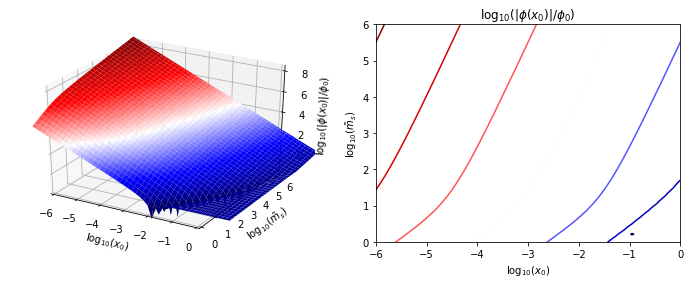

In [13]:
# Plot of field at surface

fig = plt.figure(figsize=(12,4))

ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, np.log10(abs(phi_rs_array)),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(|\phi(x_0)|/\phi_0)$')

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, np.log10(abs(phi_rs_array)),  
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(|\phi(x_0)|/\phi_0)$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)

(0, 6)

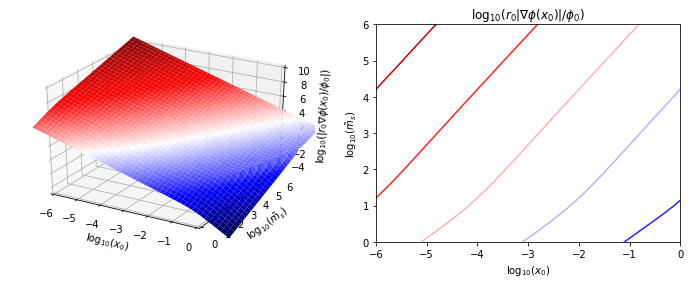

In [14]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, np.log10(abs(grad_rs_array)),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(|r_0 \nabla\phi(x_0)/\phi_0|)$')

ax.set_xlim(-6,0)
ax.set_ylim(0,6)

ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, np.log10(abs(grad_rs_array)),  
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(r_0|\nabla\phi(x_0)|/\phi_0)$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)

(0, 6)

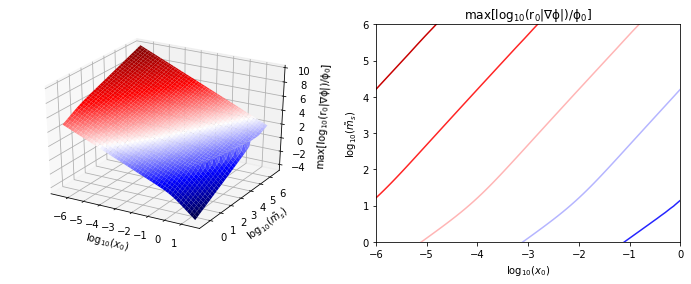

In [8]:
fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, np.log10(abs(max_grad_array)),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\rm{max}[\log_{10}(r_0|\nabla\phi|)/\phi_0]$')


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, np.log10(abs(max_grad_array)),  
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\rm{max}[\log_{10}(r_0|\nabla\phi|)/\phi_0]$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)

(0, 6)

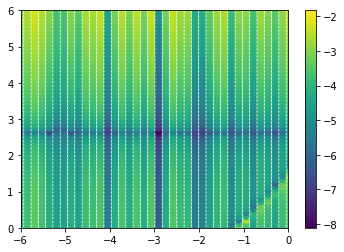

In [15]:
# Comparison of Derrick's theorem terms: should be equal

sm = np.sqrt( derrick1_array**2 + derrick2_array**2 )
rel_diff = abs( derrick1_array - derrick2_array ) / sm

cbar = plt.scatter( log_x0_mg, log_ms_mg, c=np.log10(rel_diff) )
plt.colorbar(cbar)


plt.xlim(-6,0)
plt.ylim(0,6)

(0, 6)

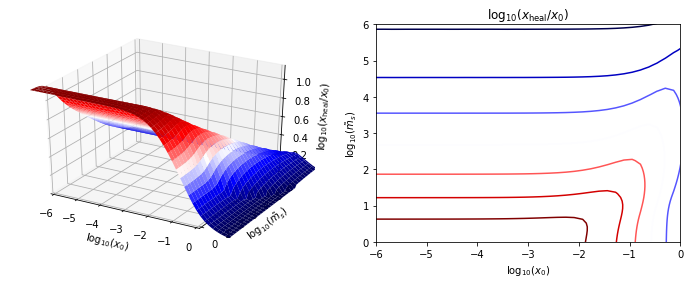

In [16]:
# Plot of healing length in units of source radius

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, np.log10(np.abs(healing_array)),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(x_{\rm heal}/x_0)$')

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, np.log10(np.abs(healing_array)),   
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(x_{\rm heal}/x_0)$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)

(0, 6)

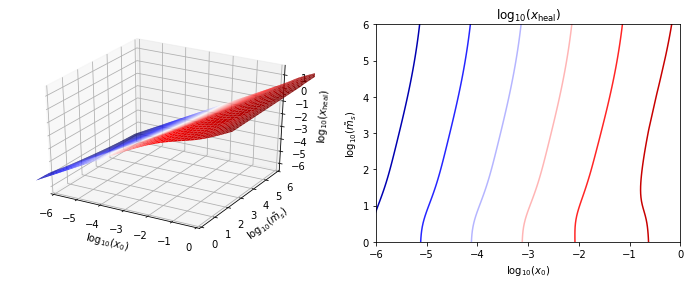

In [19]:
# Plot of healing length in units of 1/mu

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

ax.plot_surface( log_x0_mg, log_ms_mg, np.log10(np.abs(Healing_array)),  
                cmap='seismic' )

ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_zlabel(r'$\log_{10}(x_{\rm heal})$')

ax.set_xlim(-6,0)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, np.log10(np.abs(Healing_array)),   
                cmap='seismic' )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\log_{10}(x_{\rm heal})$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)

(0, 6)

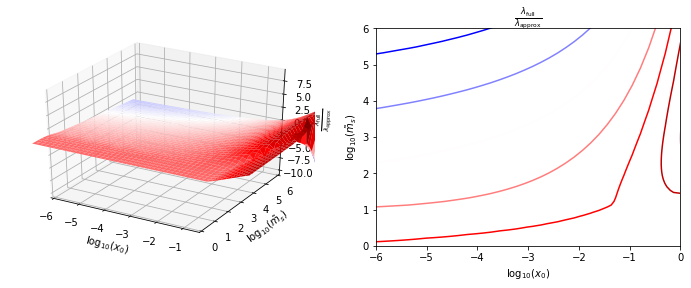

In [32]:
# Plot of scalar charge ratio

fig = plt.figure(figsize=(12,4))
ax = fig.add_subplot(121, projection='3d')

log_ratio = np.log10(np.abs(newcharges_array)) - \
        np.log10(np.abs(oldcharges_array))

ax.plot_surface( log_x0_mg, log_ms_mg, log_ratio,  
                cmap='seismic' )

ax.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax.set_xlabel(r'$\log_{10}(x_0)$')
ax.set_zlabel(r'$\frac{\lambda_{\rm full}}{\lambda_{\rm approx}}$')

ax.set_xlim(-6,-.5)
ax.set_ylim(0,6)


ax2 = fig.add_subplot(122)
contours = ax2.contour( log_x0_mg, log_ms_mg, log_ratio,   
                cmap='seismic',
              levels=np.linspace(-3.,1.,9,endpoint=True) )

ax2.set_xlabel(r'$\log_{10}(x_0)$')
ax2.set_ylabel(r'$\log_{10}(\tilde{m}_s)$')
ax2.set_title(r'$\frac{\lambda_{\rm full}}{\lambda_{\rm approx}}$')

ax2.set_xlim(-6,0)
ax2.set_ylim(0,6)